In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [4]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.1):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [5]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/cs1cs2/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [6]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-43,15) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 1, 2, 5, 9, 18, 34, 66, 126, 244, 471], [1, 2, 3, 6, 12, 23, 44, 85, 165, 318, 615, 1187, 2291, 4424, 8542], [2, 3, 7, 13, 25, 48, 93, 179, 345, 666, 1286, 2484, 4795, 9258, 17875], [2, 4, 7, 14, 27, 51, 99, 192, 370, 714, 1378, 2661, 5138, 9921, 19154], [1, 3, 5, 10, 19, 37, 72, 139, 268, 518, 1001, 1932, 3730, 7201, 13904], [1, 2, 3, 6, 11, 21, 41, 79, 152, 294, 567, 1094, 2113, 4079, 7876], [1, 1, 1, 2, 5, 9, 17, 33, 64, 124, 239, 462, 892, 1723, 3326]]


In [7]:
###############
# BACKGROUNDS # 
###############

B_cs1_ER = np.loadtxt(filefolder + 'ER_cs1.txt')
B_cs2_ER = np.loadtxt(filefolder + 'ER_cs2.txt')

print('B_cs1_ER.shape: ', B_cs1_ER.shape)
print('B_cs2_ER.shape: ', B_cs2_ER.shape)


B_cs1_AC = np.loadtxt(filefolder + 'AC_cs1.txt')
B_cs2_AC = np.loadtxt(filefolder + 'AC_cs2.txt')

print('\nB_cs1_AC.shape: ', B_cs1_AC.shape)
print('B_cs2_AC.shape: ', B_cs2_AC.shape)


B_cs1_CNNS = np.loadtxt(filefolder + 'CNNS_cs1.txt')
B_cs2_CNNS = np.loadtxt(filefolder + 'CNNS_cs2.txt')

print('\nB_cs1_CNNS.shape: ', B_cs1_CNNS.shape)
print('B_cs2_CNNS.shape: ', B_cs2_CNNS.shape)


B_cs1_RN = np.loadtxt(filefolder + 'RN_cs1.txt')
B_cs2_RN = np.loadtxt(filefolder + 'RN_cs2.txt')

print('\nB_cs1_RN.shape: ', B_cs1_RN.shape)
print('B_cs2_RN.shape: ', B_cs2_RN.shape)


B_cs1_WALL = np.loadtxt(filefolder + 'WALL_cs1.txt')
B_cs2_WALL = np.loadtxt(filefolder + 'WALL_cs2.txt')

print('\nB_cs1_WALL.shape: ', B_cs1_WALL.shape)
print('B_cs2_WALL.shape: ', B_cs2_WALL.shape)

B_cs1_ER.shape:  (67300,)
B_cs2_ER.shape:  (67300,)

B_cs1_AC.shape:  (5000,)
B_cs2_AC.shape:  (5000,)

B_cs1_CNNS.shape:  (43,)
B_cs2_CNNS.shape:  (43,)

B_cs1_RN.shape:  (4516,)
B_cs2_RN.shape:  (4516,)

B_cs1_WALL.shape:  (5000,)
B_cs2_WALL.shape:  (5000,)


In [8]:
# cs1 = [3, 70] PE
# cS2 = [50, 8000] PE

B_cs1_ER_aux = [B_cs1_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs2_ER = [B_cs2_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs1_ER = B_cs1_ER_aux

B_cs1_AC_aux = [B_cs1_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs2_AC = [B_cs2_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs1_AC = B_cs1_AC_aux

B_cs1_CNNS_aux = [B_cs1_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs2_CNNS = [B_cs2_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs1_CNNS = B_cs1_CNNS_aux

B_cs1_RN_aux = [B_cs1_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs2_RN = [B_cs2_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs1_RN = B_cs1_RN_aux

B_cs1_WALL_aux = [B_cs1_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs2_WALL = [B_cs2_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs1_WALL = B_cs1_WALL_aux

## Loop over the masses

## 1. cS1 and cS2

#### m_it = 0, 1, 2, 3 done in part1

In [ ]:
# LOAD THE RESULTS TRAINING WITH A FIXED MASS (m_it= 0, 1, 2, 3) AND APPLYING IT TO ALL THE MASSES

cross_cs1cs2_general_m0 = np.loadtxt('results/general/cs1cs2_mDM0.txt')[0]
cross_cs1cs2_general_m0_up = np.loadtxt('results/general/cs1cs2_mDM0.txt')[1]
cross_cs1cs2_general_m0_down =np.loadtxt('results/general/cs1cs2_mDM0.txt')[2]

cross_cs1cs2_general_m0_MLL = np.loadtxt('results/general/cs1cs2_mDM0_MLL.txt')[0]
cross_cs1cs2_general_m0_MLL_up = np.loadtxt('results/general/cs1cs2_mDM0_MLL.txt')[1]
cross_cs1cs2_general_m0_MLL_down = np.loadtxt('results/general/cs1cs2_mDM0_MLL.txt')[2]


cross_cs1cs2_general_m1 = np.loadtxt('results/general/cs1cs2_mDM1.txt')[0]
cross_cs1cs2_general_m1_up = np.loadtxt('results/general/cs1cs2_mDM1.txt')[1]
cross_cs1cs2_general_m1_down =np.loadtxt('results/general/cs1cs2_mDM1.txt')[2]

cross_cs1cs2_general_m1_MLL = np.loadtxt('results/general/cs1cs2_mDM1_MLL.txt')[0]
cross_cs1cs2_general_m1_MLL_up = np.loadtxt('results/general/cs1cs2_mDM1_MLL.txt')[1]
cross_cs1cs2_general_m1_MLL_down = np.loadtxt('results/general/cs1cs2_mDM1_MLL.txt')[2]


cross_cs1cs2_general_m2 = np.loadtxt('results/general/cs1cs2_mDM2.txt')[0]
cross_cs1cs2_general_m2_up = np.loadtxt('results/general/cs1cs2_mDM2.txt')[1]
cross_cs1cs2_general_m2_down =np.loadtxt('results/general/cs1cs2_mDM2.txt')[2]

cross_cs1cs2_general_m2_MLL = np.loadtxt('results/general/cs1cs2_mDM2_MLL.txt')[0]
cross_cs1cs2_general_m2_MLL_up = np.loadtxt('results/general/cs1cs2_mDM2_MLL.txt')[1]
cross_cs1cs2_general_m2_MLL_down = np.loadtxt('results/general/cs1cs2_mDM2_MLL.txt')[2]


cross_cs1cs2_general_m3 = np.loadtxt('results/general/cs1cs2_mDM3.txt')[0]
cross_cs1cs2_general_m3_up = np.loadtxt('results/general/cs1cs2_mDM3.txt')[1]
cross_cs1cs2_general_m3_down =np.loadtxt('results/general/cs1cs2_mDM3.txt')[2]

cross_cs1cs2_general_m3_MLL = np.loadtxt('results/general/cs1cs2_mDM3_MLL.txt')[0]
cross_cs1cs2_general_m3_MLL_up = np.loadtxt('results/general/cs1cs2_mDM3_MLL.txt')[1]
cross_cs1cs2_general_m3_MLL_down = np.loadtxt('results/general/cs1cs2_mDM3_MLL.txt')[2]

#### Train with m_it = 4


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


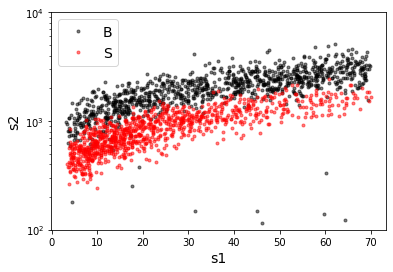

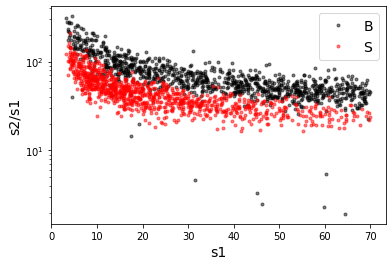

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

[0]	validation_0-logloss:0.68557	validation_1-logloss:0.68568
[1]	validation_0-logloss:0.67809	validation_1-logloss:0.67831
[2]	validation_0-logloss:0.67080	validation_1-logloss:0.67114
[3]	validation_0-logloss:0.66360	validation_1-logloss:0.66404
[4]	validation_0-logloss:0.65660	validation_1-logloss:0.65714
[5]	validation_0-logloss:0.64967	validation_1-logloss:0.65032
[6]	validation_0-logloss:0.64294	validation_1-logloss:0.64367
[7]	validation_0-logloss:0.63625	validation_1-logloss:0.63708
[8]	validation_0-logloss:0.62973	validation_1-logloss:0.63065


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[9]	validation_0-logloss:0.62330	validation_1-logloss:0.62431
[10]	validation_0-logloss:0.61698	validation_1-logloss:0.61809
[11]	validation_0-logloss:0.61079	validation_1-logloss:0.61198
[12]	validation_0-logloss:0.60472	validation_1-logloss:0.60602
[13]	validation_0-logloss:0.59875	validation_1-logloss:0.60012
[14]	validation_0-logloss:0.59288	validation_1-logloss:0.59433
[15]	validation_0-logloss:0.58713	validation_1-logloss:0.58868
[16]	validation_0-logloss:0.58145	validation_1-logloss:0.58309
[17]	validation_0-logloss:0.57590	validation_1-logloss:0.57762
[18]	validation_0-logloss:0.57041	validation_1-logloss:0.57220
[19]	validation_0-logloss:0.56503	validation_1-logloss:0.56692
[20]	validation_0-logloss:0.55975	validation_1-logloss:0.56171
[21]	validation_0-logloss:0.55454	validation_1-logloss:0.55659
[22]	validation_0-logloss:0.54945	validation_1-logloss:0.55157
[23]	validation_0-logloss:0.54441	validation_1-logloss:0.54661
[24]	validation_0-logloss:0.53948	validation_1-logloss:0

[139]	validation_0-logloss:0.26288	validation_1-logloss:0.27100
[140]	validation_0-logloss:0.26184	validation_1-logloss:0.27001
[141]	validation_0-logloss:0.26080	validation_1-logloss:0.26899
[142]	validation_0-logloss:0.25979	validation_1-logloss:0.26802
[143]	validation_0-logloss:0.25878	validation_1-logloss:0.26706
[144]	validation_0-logloss:0.25780	validation_1-logloss:0.26610
[145]	validation_0-logloss:0.25681	validation_1-logloss:0.26517
[146]	validation_0-logloss:0.25583	validation_1-logloss:0.26423
[147]	validation_0-logloss:0.25486	validation_1-logloss:0.26332
[148]	validation_0-logloss:0.25394	validation_1-logloss:0.26241
[149]	validation_0-logloss:0.25300	validation_1-logloss:0.26153
[150]	validation_0-logloss:0.25207	validation_1-logloss:0.26064
[151]	validation_0-logloss:0.25116	validation_1-logloss:0.25976
[152]	validation_0-logloss:0.25024	validation_1-logloss:0.25889
[153]	validation_0-logloss:0.24936	validation_1-logloss:0.25805
[154]	validation_0-logloss:0.24848	valid

[268]	validation_0-logloss:0.19262	validation_1-logloss:0.20455
[269]	validation_0-logloss:0.19239	validation_1-logloss:0.20433
[270]	validation_0-logloss:0.19215	validation_1-logloss:0.20412
[271]	validation_0-logloss:0.19191	validation_1-logloss:0.20391
[272]	validation_0-logloss:0.19169	validation_1-logloss:0.20370
[273]	validation_0-logloss:0.19146	validation_1-logloss:0.20351
[274]	validation_0-logloss:0.19123	validation_1-logloss:0.20331
[275]	validation_0-logloss:0.19101	validation_1-logloss:0.20312
[276]	validation_0-logloss:0.19079	validation_1-logloss:0.20292
[277]	validation_0-logloss:0.19057	validation_1-logloss:0.20273
[278]	validation_0-logloss:0.19036	validation_1-logloss:0.20253
[279]	validation_0-logloss:0.19014	validation_1-logloss:0.20233
[280]	validation_0-logloss:0.18993	validation_1-logloss:0.20214
[281]	validation_0-logloss:0.18973	validation_1-logloss:0.20196
[282]	validation_0-logloss:0.18951	validation_1-logloss:0.20177
[283]	validation_0-logloss:0.18931	valid

[397]	validation_0-logloss:0.17590	validation_1-logloss:0.19017
[398]	validation_0-logloss:0.17583	validation_1-logloss:0.19012
[399]	validation_0-logloss:0.17578	validation_1-logloss:0.19007
[400]	validation_0-logloss:0.17572	validation_1-logloss:0.19002
[401]	validation_0-logloss:0.17566	validation_1-logloss:0.18998
[402]	validation_0-logloss:0.17560	validation_1-logloss:0.18993
[403]	validation_0-logloss:0.17555	validation_1-logloss:0.18988
[404]	validation_0-logloss:0.17549	validation_1-logloss:0.18983
[405]	validation_0-logloss:0.17543	validation_1-logloss:0.18978
[406]	validation_0-logloss:0.17537	validation_1-logloss:0.18974
[407]	validation_0-logloss:0.17531	validation_1-logloss:0.18969
[408]	validation_0-logloss:0.17525	validation_1-logloss:0.18964
[409]	validation_0-logloss:0.17520	validation_1-logloss:0.18959
[410]	validation_0-logloss:0.17514	validation_1-logloss:0.18955
[411]	validation_0-logloss:0.17508	validation_1-logloss:0.18951
[412]	validation_0-logloss:0.17503	valid

[526]	validation_0-logloss:0.17120	validation_1-logloss:0.18695
[527]	validation_0-logloss:0.17119	validation_1-logloss:0.18693
[528]	validation_0-logloss:0.17117	validation_1-logloss:0.18692
[529]	validation_0-logloss:0.17114	validation_1-logloss:0.18690
[530]	validation_0-logloss:0.17112	validation_1-logloss:0.18689
[531]	validation_0-logloss:0.17111	validation_1-logloss:0.18688
[532]	validation_0-logloss:0.17109	validation_1-logloss:0.18687
[533]	validation_0-logloss:0.17107	validation_1-logloss:0.18687
[534]	validation_0-logloss:0.17105	validation_1-logloss:0.18686
[535]	validation_0-logloss:0.17103	validation_1-logloss:0.18685
[536]	validation_0-logloss:0.17101	validation_1-logloss:0.18684
[537]	validation_0-logloss:0.17099	validation_1-logloss:0.18683
[538]	validation_0-logloss:0.17098	validation_1-logloss:0.18682
[539]	validation_0-logloss:0.17096	validation_1-logloss:0.18681
[540]	validation_0-logloss:0.17094	validation_1-logloss:0.18680
[541]	validation_0-logloss:0.17092	valid

[783]	validation_0-logloss:0.16853	validation_1-logloss:0.18621
[784]	validation_0-logloss:0.16853	validation_1-logloss:0.18621
[785]	validation_0-logloss:0.16852	validation_1-logloss:0.18621
[786]	validation_0-logloss:0.16851	validation_1-logloss:0.18620
[787]	validation_0-logloss:0.16850	validation_1-logloss:0.18620
[788]	validation_0-logloss:0.16849	validation_1-logloss:0.18619
[789]	validation_0-logloss:0.16848	validation_1-logloss:0.18619
[790]	validation_0-logloss:0.16847	validation_1-logloss:0.18619
[791]	validation_0-logloss:0.16846	validation_1-logloss:0.18619
[792]	validation_0-logloss:0.16845	validation_1-logloss:0.18619
[793]	validation_0-logloss:0.16845	validation_1-logloss:0.18619
[794]	validation_0-logloss:0.16844	validation_1-logloss:0.18619
[795]	validation_0-logloss:0.16842	validation_1-logloss:0.18620
[796]	validation_0-logloss:0.16842	validation_1-logloss:0.18619
[797]	validation_0-logloss:0.16841	validation_1-logloss:0.18619
[798]	validation_0-logloss:0.16841	valid

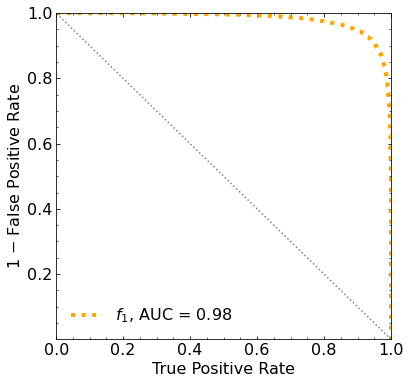

In [24]:
m_it = 4


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


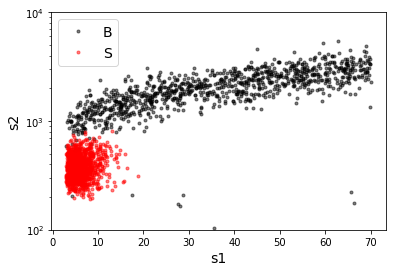

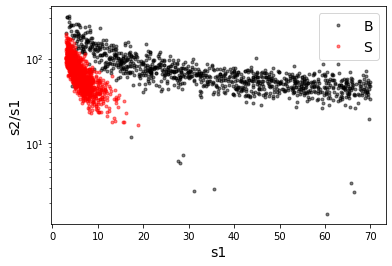

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


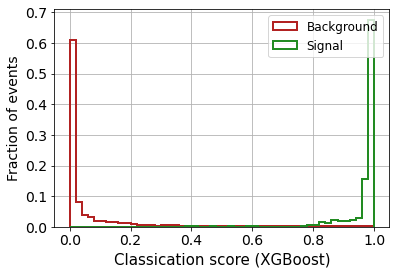


 ROC-AUC =  0.9944389568495324
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.139


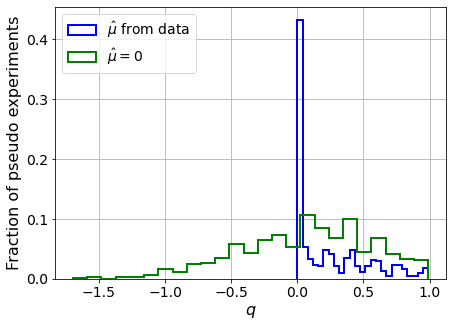

muhat mean:  0.11044904095605171
Z_bins:  0.30210421789387704
std Z_bins:  0.4668782309808443
Z_bins mu=0:  0.30210421789387704
std Z_bins mu=0:  0.8235274863831586

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1265


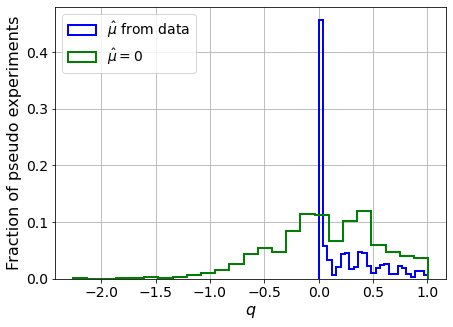

muhat mean:  0.1428376404358477
Z_bins:  0.2588495116924462
std Z_bins:  0.537647412499196
Z_bins mu=0:  0.2580350491713071
std Z_bins mu=0:  0.9422488023514987

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


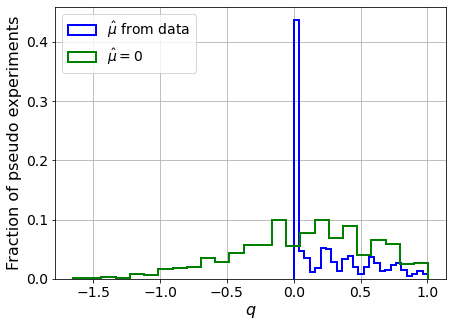

muhat mean:  0.04177040807524015
Z_bins:  0.30504139861405044
std Z_bins:  0.4663700188439973
Z_bins mu=0:  0.30504139861405044
std Z_bins mu=0:  0.8088797670962988

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1285


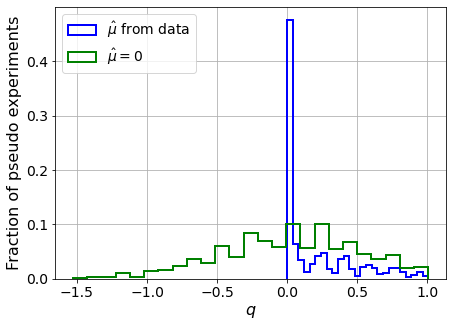

muhat mean:  0.3791991083371143
Z_bins:  0.23790478583621227
std Z_bins:  0.5722730015505874
Z_bins mu=0:  0.23435349776983455
std Z_bins mu=0:  1.0421127706297595

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.143


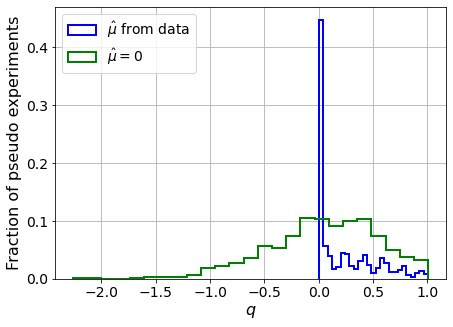

muhat mean:  0.20730651301931804
Z_bins:  0.27557174263977996
std Z_bins:  0.5013853778491433
Z_bins mu=0:  0.2755386096791431
std Z_bins mu=0:  0.9045820262797694

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


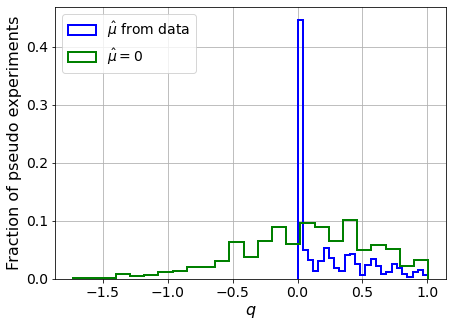

muhat mean:  0.13588336646832627
Z_bins:  0.2970825218669005
std Z_bins:  0.47308491715119416
Z_bins mu=0:  0.2970825218669005
std Z_bins mu=0:  0.836785115447811

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.134


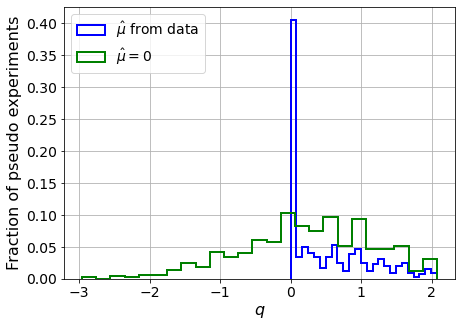

muhat mean:  0.10188685035553675
Z_bins:  0.5201219329707198
std Z_bins:  0.5540509828256848
Z_bins mu=0:  0.5195863254392534
std Z_bins mu=0:  0.8955732416034552

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.136


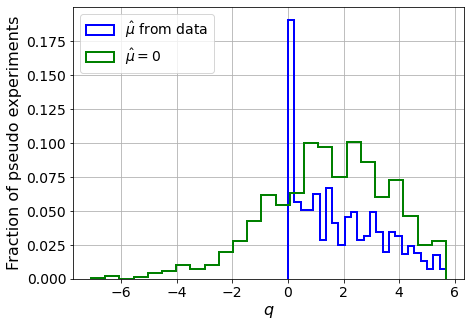

muhat mean:  0.03540168756646634
Z_bins:  1.2543343869627517
std Z_bins:  0.6150413446416836
Z_bins mu=0:  1.2542748244525752
std Z_bins mu=0:  0.8557028131613817

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1535


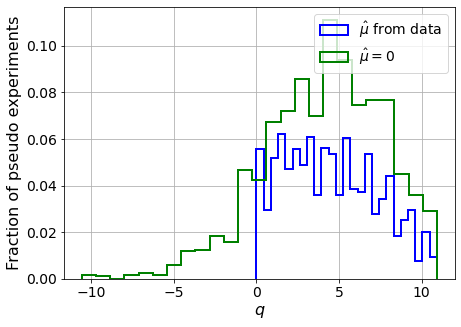

muhat mean:  0.03415155617783741
Z_bins:  2.0871592279205107
std Z_bins:  0.6718139504964852
Z_bins mu=0:  2.0870878494493463
std Z_bins mu=0:  0.8570539561130546

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1165


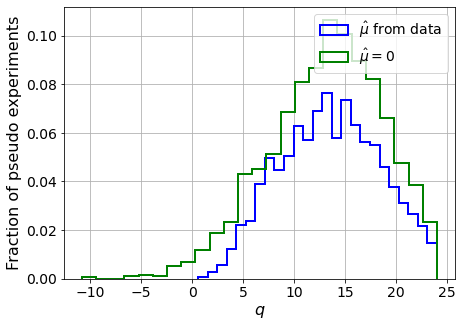

muhat mean:  0.00782700844883688
Z_bins:  3.664592347886576
std Z_bins:  0.6617498234000831
Z_bins mu=0:  3.664588090807754
std Z_bins mu=0:  0.7551750468512486

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1385


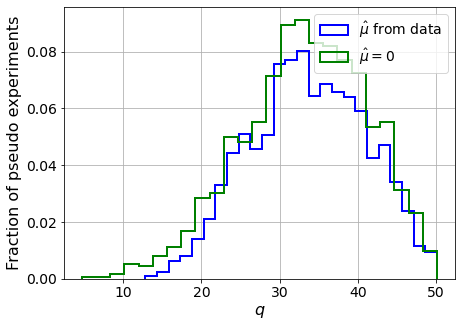

muhat mean:  0.0068430255854473815
Z_bins:  5.790648862533295
std Z_bins:  0.6306922679551769
Z_bins mu=0:  5.7905473575550195
std Z_bins mu=0:  0.6887146434979812

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.13


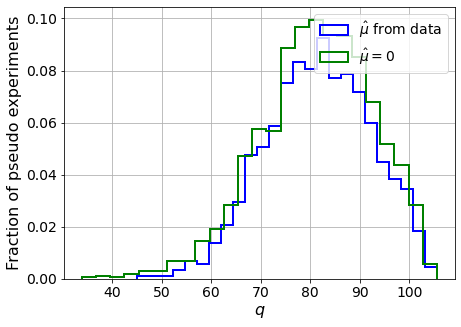

muhat mean:  0.0034131388424382464
Z_bins:  9.051036268396734
std Z_bins:  0.5836267474410938
Z_bins mu=0:  9.051009824973265
std Z_bins mu=0:  0.6248987564690748

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.135


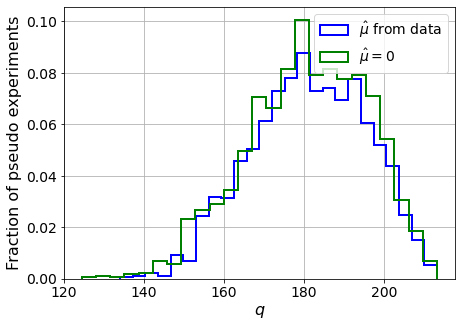

muhat mean:  0.0025703926595624783
Z_bins:  13.461372999299128
std Z_bins:  0.5306181556004962
Z_bins mu=0:  13.46013723891586
std Z_bins mu=0:  0.5578349435778475

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1375


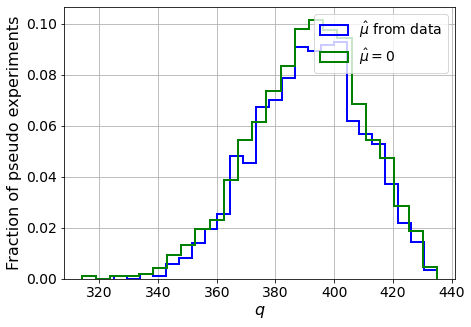

muhat mean:  0.0010588139704196613
Z_bins:  19.804243255845535
std Z_bins:  0.4640656820823033
Z_bins mu=0:  19.802517075927206
std Z_bins mu=0:  0.4833045676570289

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.139


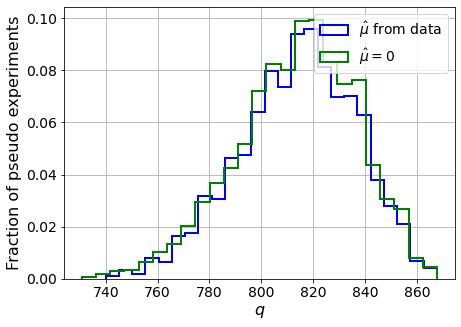

muhat mean:  0.00013644108752028554
Z_bins:  28.557929236370487
std Z_bins:  0.3939841946230138
Z_bins mu=0:  28.557597124524577
std Z_bins mu=0:  0.40533487638455246

--------


 FINAL RESULT:

[[0.30210421789387704, 0.4668782309808443, 0.11044904095605171, 0.30210421789387704, 0.8235274863831586], [0.2588495116924462, 0.537647412499196, 0.1428376404358477, 0.2580350491713071, 0.9422488023514987], [0.30504139861405044, 0.4663700188439973, 0.04177040807524015, 0.30504139861405044, 0.8088797670962988], [0.23790478583621227, 0.5722730015505874, 0.3791991083371143, 0.23435349776983455, 1.0421127706297595], [0.27557174263977996, 0.5013853778491433, 0.20730651301931804, 0.2755386096791431, 0.9045820262797694], [0.2970825218669005, 0.47308491715119416, 0.13588336646832627, 0.2970825218669005, 0.836785115447811], [0.5201219329707198, 0.5540509828256848, 0.10188685035553675, 0.5195863254392534, 0.8955732416034552], [1.2543343869627517, 0.6150413446416836, 0.03540168756646634, 1.254274824452575

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 345.43227956 315.15885924 278.67091968 239.2429382  194.52077436
 145.40619715  91.73880857  29.6611086  -32.85467498 -98.14793705]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 525.84540446 464.69388306 396.42719444 327.39873371
 262

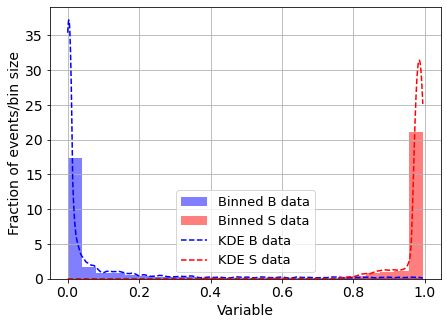

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



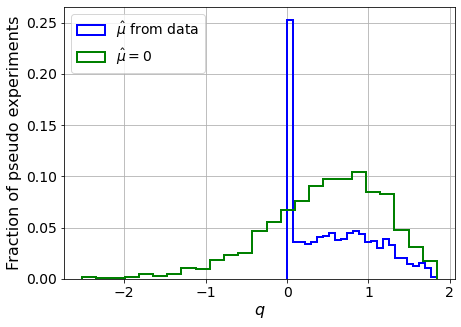

muhat mean:  -5.0718099859431875
Z_bins:  0.7430960392482171
std Z_bins:  0.3407386603364928
Z_bins mu=0:  0.7430960392482171
std Z_bins mu=0:  0.47429916873482075

--------

B_expected:  643
S_expected:  1



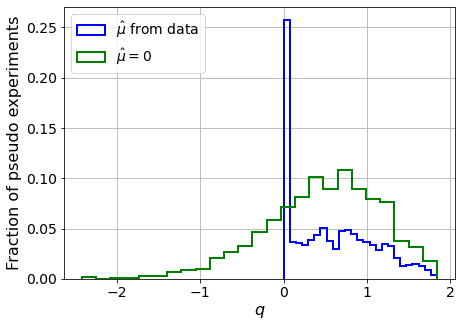

muhat mean:  -5.790896999715383
Z_bins:  0.7224713518059943
std Z_bins:  0.34713063151202855
Z_bins mu=0:  0.7224713518059943
std Z_bins mu=0:  0.47025945448326933

--------

B_expected:  643
S_expected:  1



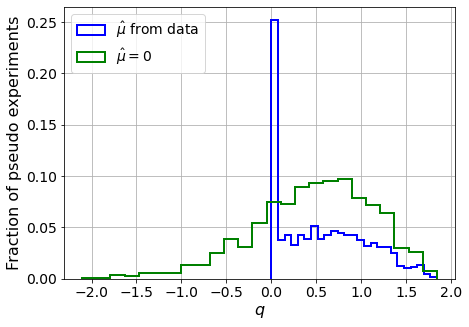

muhat mean:  -4.548162854301727
Z_bins:  0.7214914671858705
std Z_bins:  0.3376837568255259
Z_bins mu=0:  0.7214914671858705
std Z_bins mu=0:  0.457963798834619

--------

B_expected:  643
S_expected:  1



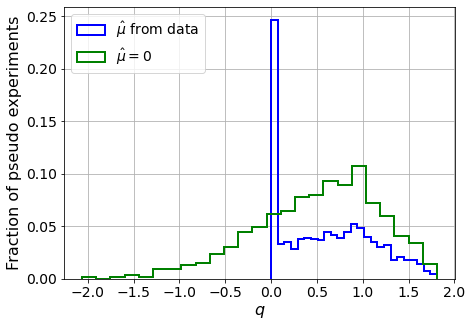

muhat mean:  -5.210398123368273
Z_bins:  0.7735304799949309
std Z_bins:  0.3239227648794367
Z_bins mu=0:  0.7735304799949309
std Z_bins mu=0:  0.43656712799404573

--------

B_expected:  643
S_expected:  1



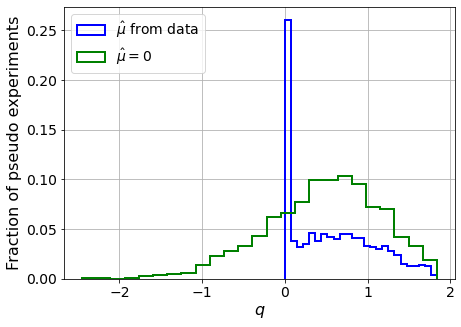

muhat mean:  -7.361234426559967
Z_bins:  0.7245558925027559
std Z_bins:  0.34735465764415846
Z_bins mu=0:  0.7245558925027559
std Z_bins mu=0:  0.4746020794292928

--------

B_expected:  643
S_expected:  1



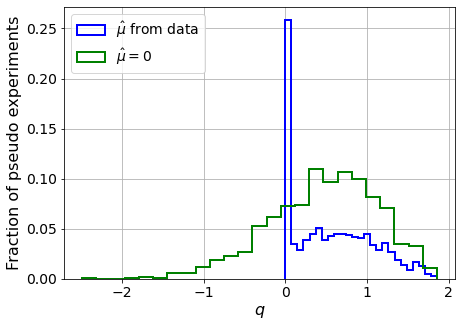

muhat mean:  -5.131078609215956
Z_bins:  0.7312523289892616
std Z_bins:  0.3370332371003496
Z_bins mu=0:  0.7312523289892616
std Z_bins mu=0:  0.44953784018026033

--------

B_expected:  643
S_expected:  2



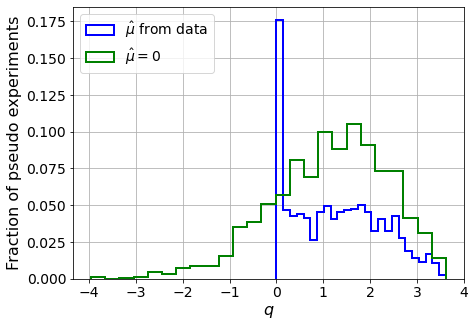

muhat mean:  -2.5114455698489064
Z_bins:  1.1161380439638477
std Z_bins:  0.4345969641110892
Z_bins mu=0:  1.1161380439638477
std Z_bins mu=0:  0.547769817539506

--------

B_expected:  643
S_expected:  5



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


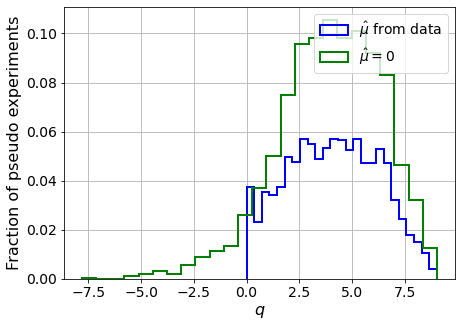

muhat mean:  -0.9372203119248288
Z_bins:  2.027003582971496
std Z_bins:  0.5279426727239824
Z_bins mu=0:  2.027003582971496
std Z_bins mu=0:  0.6075159058340982

--------

B_expected:  643
S_expected:  9



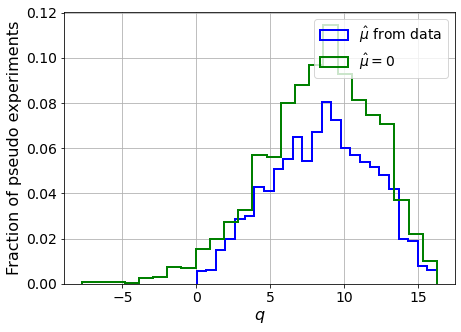

muhat mean:  -0.5664512325879095
Z_bins:  2.938126945389958
std Z_bins:  0.5787296622055986
Z_bins mu=0:  2.938126945389958
std Z_bins mu=0:  0.643928676054784

--------

B_expected:  643
S_expected:  18



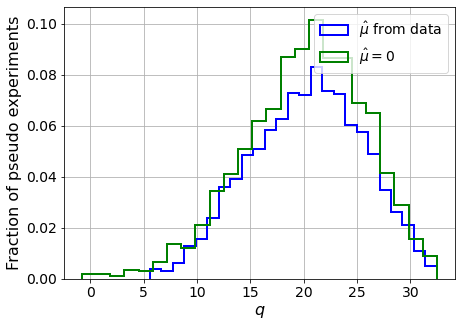

muhat mean:  -0.24495947854200914
Z_bins:  4.53614651304285
std Z_bins:  0.5801011261800356
Z_bins mu=0:  4.53614651304285
std Z_bins mu=0:  0.6208363561881551

--------

B_expected:  643
S_expected:  34



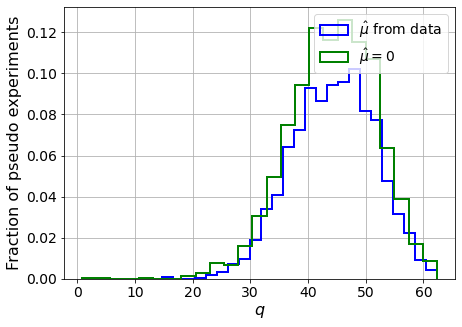

muhat mean:  -0.1485905604776715
Z_bins:  6.682213556409663
std Z_bins:  0.5363312590283252
Z_bins mu=0:  6.682213556409663
std Z_bins mu=0:  0.5622957306432705

--------

B_expected:  643
S_expected:  66



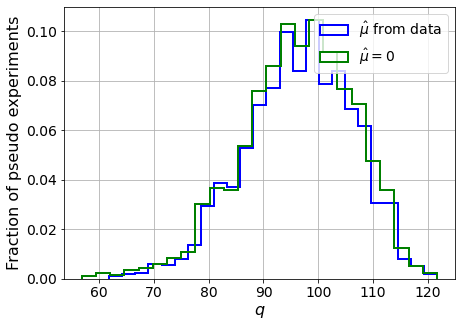

muhat mean:  -0.06494919325583583
Z_bins:  9.834545126796044
std Z_bins:  0.49924664600225305
Z_bins mu=0:  9.834510032729158
std Z_bins mu=0:  0.5169897245137854

--------

B_expected:  643
S_expected:  126



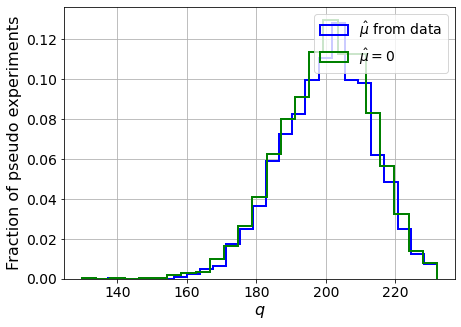

muhat mean:  -0.034898028291698684
Z_bins:  14.181359421922336
std Z_bins:  0.45609808506601124
Z_bins mu=0:  14.181359421922336
std Z_bins mu=0:  0.46956392278512554

--------

B_expected:  643
S_expected:  244



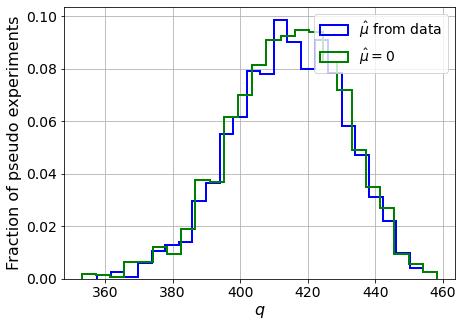

muhat mean:  -0.023116625971828696
Z_bins:  20.37032050555213
std Z_bins:  0.40875485906528797
Z_bins mu=0:  20.370204822938277
std Z_bins mu=0:  0.4171624089483347

--------

B_expected:  643
S_expected:  471



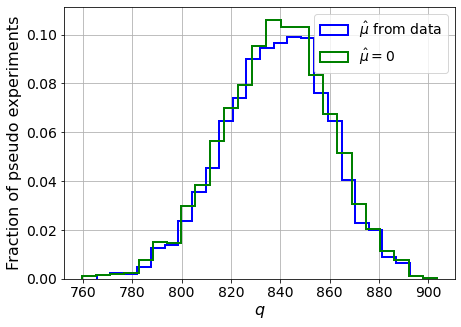

muhat mean:  -0.01073094511870762
Z_bins:  28.965264382298937
std Z_bins:  0.3708354074980262
Z_bins mu=0:  28.96416168569737
std Z_bins mu=0:  0.3762287277717785

--------


 FINAL RESULT:

[[0.7430960392482171, 0.3407386603364928, -5.0718099859431875, 0.7430960392482171, 0.47429916873482075], [0.7224713518059943, 0.34713063151202855, -5.790896999715383, 0.7224713518059943, 0.47025945448326933], [0.7214914671858705, 0.3376837568255259, -4.548162854301727, 0.7214914671858705, 0.457963798834619], [0.7735304799949309, 0.3239227648794367, -5.210398123368273, 0.7735304799949309, 0.43656712799404573], [0.7245558925027559, 0.34735465764415846, -7.361234426559967, 0.7245558925027559, 0.4746020794292928], [0.7312523289892616, 0.3370332371003496, -5.131078609215956, 0.7312523289892616, 0.44953784018026033], [1.1161380439638477, 0.4345969641110892, -2.5114455698489064, 1.1161380439638477, 0.547769817539506], [2.027003582971496, 0.5279426727239824, -0.9372203119248288, 2.027003582971496, 0.607515

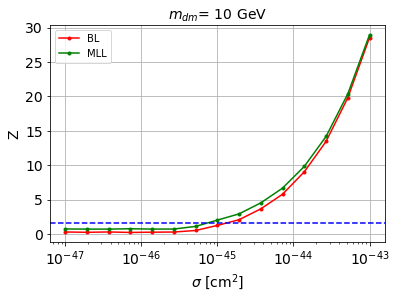


cross_BL_164:  1.3561537958760675e-45
cross_BL_164_up:  8.439773859334726e-46
cross_BL_164_down:  2.1190790201657707e-45

cross_MLL_164:  7.562086194599358e-46
cross_MLL_164_up:  5.348541436772221e-46
cross_MLL_164_down:  1.1137951202614699e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


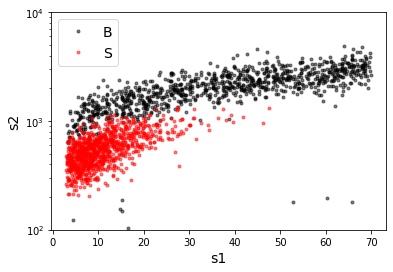

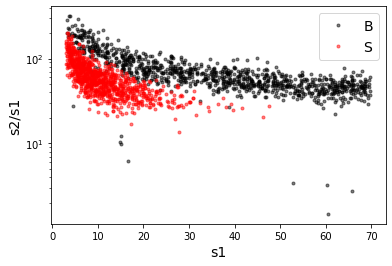

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


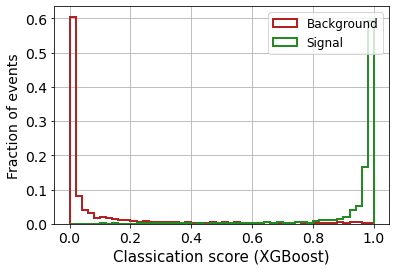


 ROC-AUC =  0.9902943801357864
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


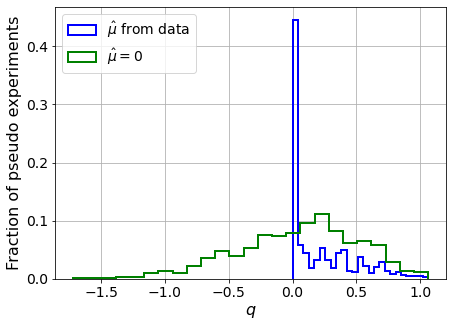

muhat mean:  0.19062873485990794
Z_bins:  0.2851389921600031
std Z_bins:  0.4626169160061565
Z_bins mu=0:  0.2851389921600031
std Z_bins mu=0:  0.8380096773491923

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


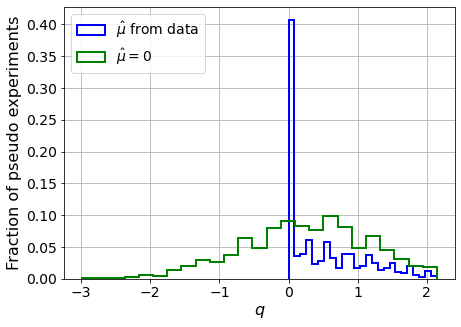

muhat mean:  0.03920297516001723
Z_bins:  0.5288744070761082
std Z_bins:  0.5391735581453972
Z_bins mu=0:  0.5288744070761082
std Z_bins mu=0:  0.8613534414181053

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.092


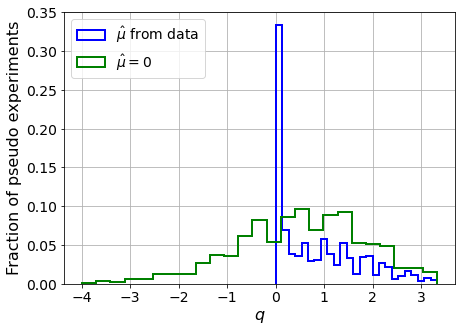

muhat mean:  0.03254169323634207
Z_bins:  0.7653506110108139
std Z_bins:  0.5654932770185487
Z_bins mu=0:  0.7653506110108139
std Z_bins mu=0:  0.8602359548983937

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


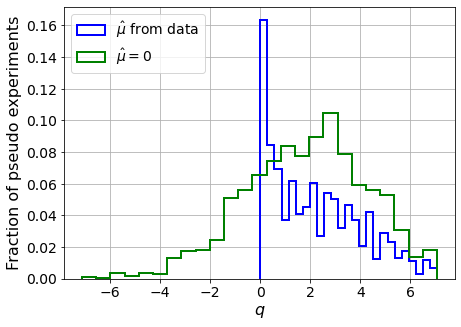

muhat mean:  0.024293484423172158
Z_bins:  1.4036399895271008
std Z_bins:  0.6477894402552753
Z_bins mu=0:  1.4036399895271008
std Z_bins mu=0:  0.8649904258163974

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


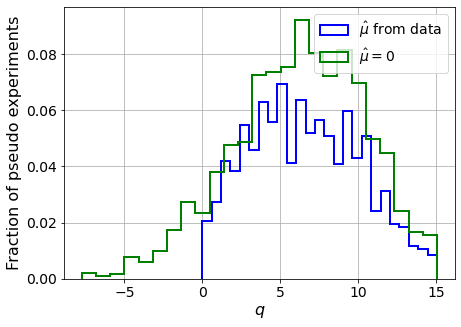

muhat mean:  0.005268155572119813
Z_bins:  2.5328602926680293
std Z_bins:  0.6921964568796336
Z_bins mu=0:  2.5328602926680293
std Z_bins mu=0:  0.8244063541555827

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


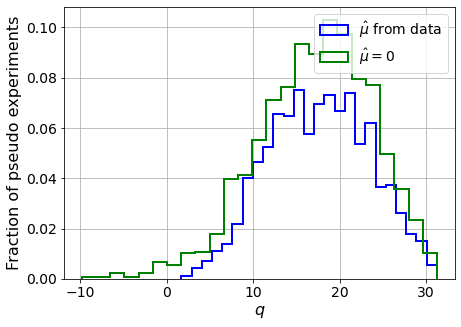

muhat mean:  0.004529009346537205
Z_bins:  4.201185906430558
std Z_bins:  0.6906262327206407
Z_bins mu=0:  4.201185906430558
std Z_bins mu=0:  0.7813155349364916

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


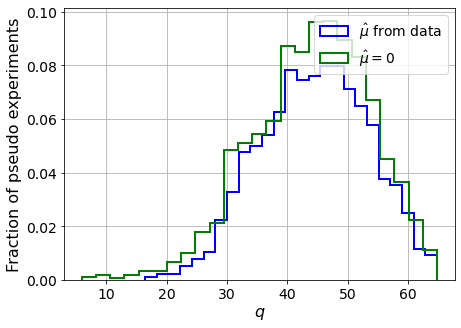

muhat mean:  0.0008471113969492943
Z_bins:  6.701778130476253
std Z_bins:  0.6623354052851399
Z_bins mu=0:  6.701128773788645
std Z_bins mu=0:  0.7185258636974488

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


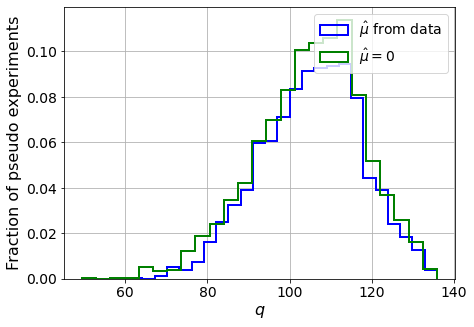

muhat mean:  0.0006271604514666895
Z_bins:  10.301599892140603
std Z_bins:  0.5963181283121537
Z_bins mu=0:  10.301289289688832
std Z_bins mu=0:  0.6334947435530368

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


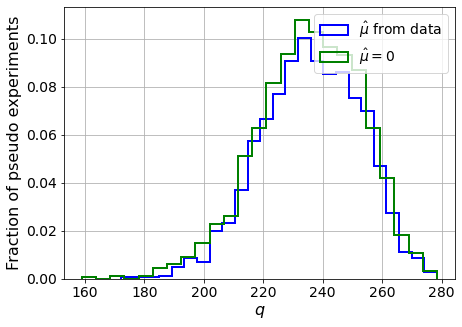

muhat mean:  0.000960912730155914
Z_bins:  15.364864034368596
std Z_bins:  0.5402030794444617
Z_bins mu=0:  15.364864034368596
std Z_bins mu=0:  0.5650748885776511

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


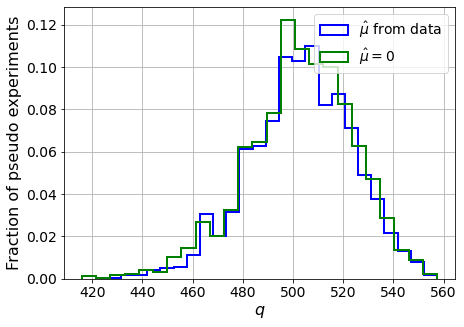

muhat mean:  0.0003199117217446657
Z_bins:  22.45215283466964
std Z_bins:  0.45753656711304125
Z_bins mu=0:  22.451270923244042
std Z_bins mu=0:  0.4743749077735062

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


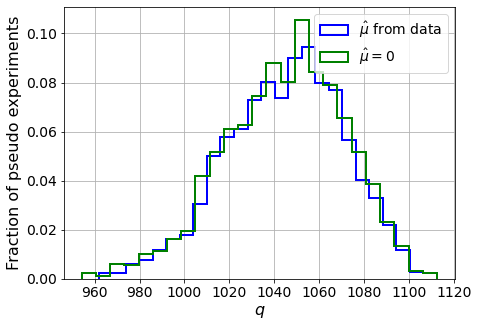

muhat mean:  -6.158342022508574e-05
Z_bins:  32.353448249355395
std Z_bins:  0.4055343300841144
Z_bins mu=0:  32.353111072247025
std Z_bins mu=0:  0.41608683273115166

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


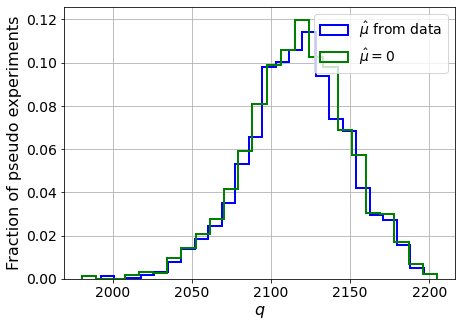

muhat mean:  3.593410506313741e-05
Z_bins:  46.020039268827205
std Z_bins:  0.34783713381224574
Z_bins mu=0:  46.01944136311015
std Z_bins mu=0:  0.35485521897682226

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


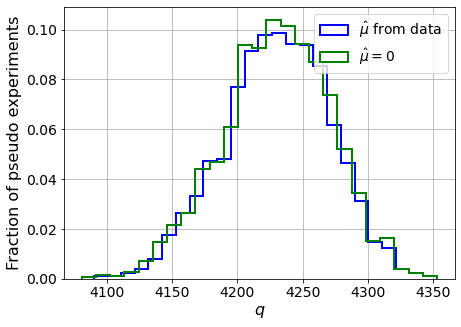

muhat mean:  9.764714289659e-05
Z_bins:  65.0506556503157
std Z_bins:  0.31318697987091676
Z_bins mu=0:  65.05023271793222
std Z_bins mu=0:  0.31836066185098394

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


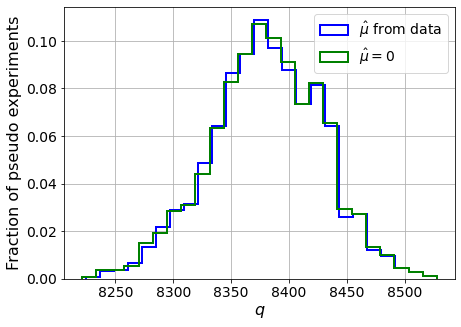

muhat mean:  2.112983353645532e-05
Z_bins:  91.54634196968406
std Z_bins:  0.2607025795031108
Z_bins mu=0:  91.54600204640764
std Z_bins mu=0:  0.26376631398371125

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


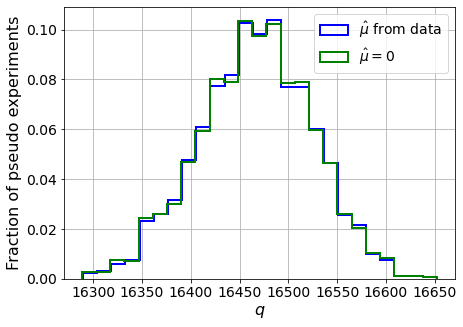

muhat mean:  1.4749494435350078e-05
Z_bins:  128.3267044513054
std Z_bins:  0.22378225809525945
Z_bins mu=0:  128.3263637421964
std Z_bins mu=0:  0.225937228333534

--------


 FINAL RESULT:

[[0.2851389921600031, 0.4626169160061565, 0.19062873485990794, 0.2851389921600031, 0.8380096773491923], [0.5288744070761082, 0.5391735581453972, 0.03920297516001723, 0.5288744070761082, 0.8613534414181053], [0.7653506110108139, 0.5654932770185487, 0.03254169323634207, 0.7653506110108139, 0.8602359548983937], [1.4036399895271008, 0.6477894402552753, 0.024293484423172158, 1.4036399895271008, 0.8649904258163974], [2.5328602926680293, 0.6921964568796336, 0.005268155572119813, 2.5328602926680293, 0.8244063541555827], [4.201185906430558, 0.6906262327206407, 0.004529009346537205, 4.201185906430558, 0.7813155349364916], [6.701778130476253, 0.6623354052851399, 0.0008471113969492943, 6.701128773788645, 0.7185258636974488], [10.301599892140603, 0.5963181283121537, 0.0006271604514666895, 10.301289289688832, 0

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 336.83072797 299.08479468 255.50444198 208.75393477
 157.81256988 101.36905527  38.475737   -28.50966765 -96.21814398]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 345.71435735 290.15793398
 225

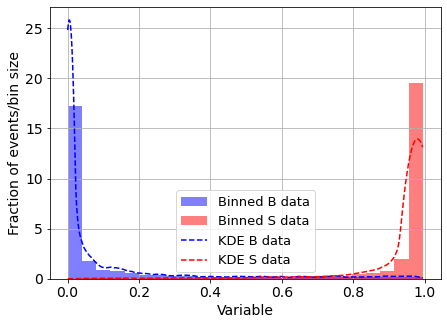

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



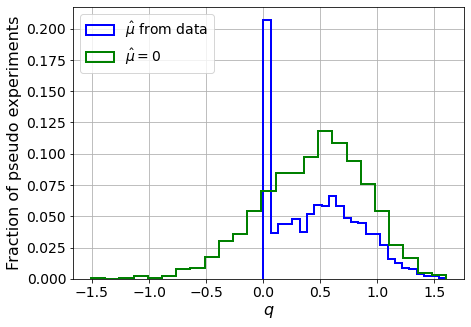

muhat mean:  -3.3561478961694786
Z_bins:  0.6959454446954616
std Z_bins:  0.2655389692345019
Z_bins mu=0:  0.6959454446954616
std Z_bins mu=0:  0.3207400161295194

--------

B_expected:  643
S_expected:  2



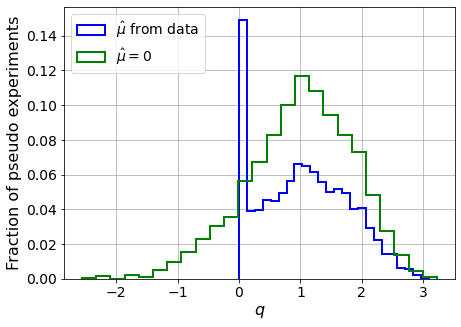

muhat mean:  -1.8975987674682477
Z_bins:  1.022939749687731
std Z_bins:  0.35599469201619766
Z_bins mu=0:  1.022939749687731
std Z_bins mu=0:  0.41793667690485187

--------

B_expected:  643
S_expected:  3



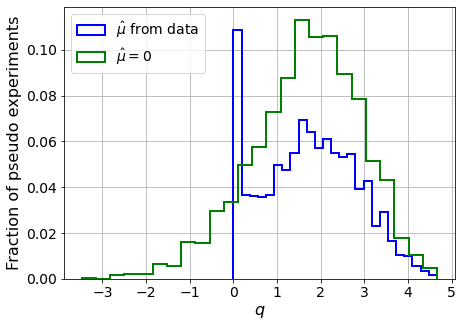

muhat mean:  -1.2706913044134724
Z_bins:  1.3224890294685485
std Z_bins:  0.41003441154041154
Z_bins mu=0:  1.3224890294685485
std Z_bins mu=0:  0.469414470935678

--------

B_expected:  643
S_expected:  6



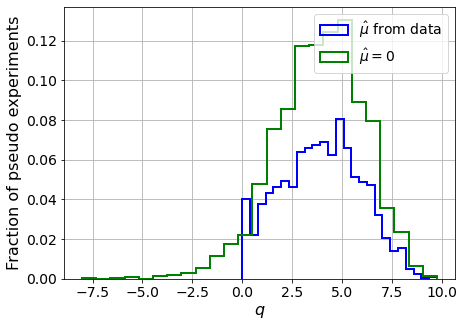

muhat mean:  -0.5941835937820195
Z_bins:  2.006587159356918
std Z_bins:  0.5001643026202753
Z_bins mu=0:  2.006587159356918
std Z_bins mu=0:  0.5532351215068385

--------

B_expected:  643
S_expected:  12



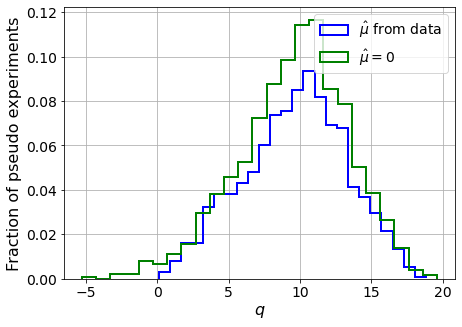

muhat mean:  -0.33678518302298305
Z_bins:  3.1472396742170567
std Z_bins:  0.5744627036404756
Z_bins mu=0:  3.1472396742170567
std Z_bins mu=0:  0.6073635566407588

--------

B_expected:  643
S_expected:  23



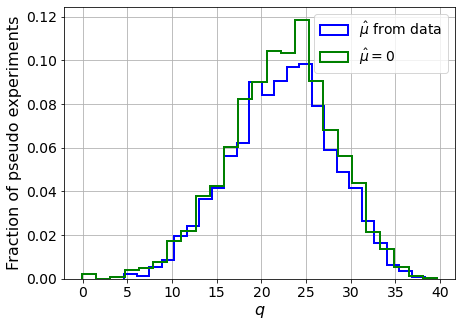

muhat mean:  -0.17043738779917983
Z_bins:  4.747749622732673
std Z_bins:  0.6002246257520388
Z_bins mu=0:  4.747749622732673
std Z_bins mu=0:  0.6194254657719903

--------

B_expected:  643
S_expected:  44



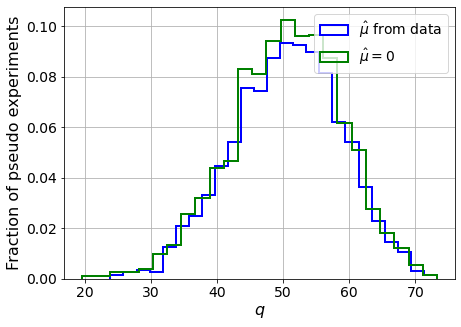

muhat mean:  -0.09030449425056769
Z_bins:  7.129389982054908
std Z_bins:  0.5759903668326424
Z_bins mu=0:  7.129389982054908
std Z_bins mu=0:  0.5874555854177592

--------

B_expected:  643
S_expected:  85



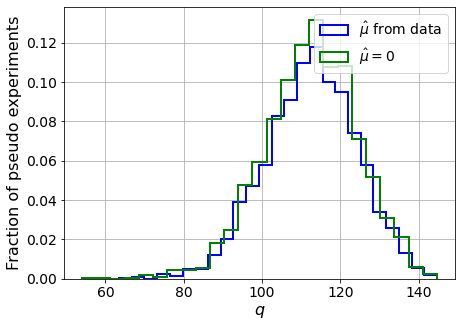

muhat mean:  -0.048275665468176854
Z_bins:  10.62853788137474
std Z_bins:  0.5514515044164288
Z_bins mu=0:  10.62853788137474
std Z_bins mu=0:  0.5616192226153981

--------

B_expected:  643
S_expected:  165



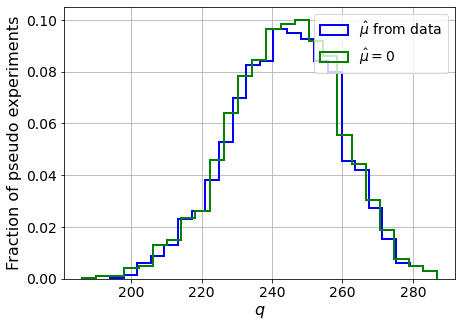

muhat mean:  -0.022472169964295456
Z_bins:  15.625679082173153
std Z_bins:  0.4968834780424212
Z_bins mu=0:  15.625679082173153
std Z_bins mu=0:  0.5018819379050147

--------

B_expected:  643
S_expected:  318



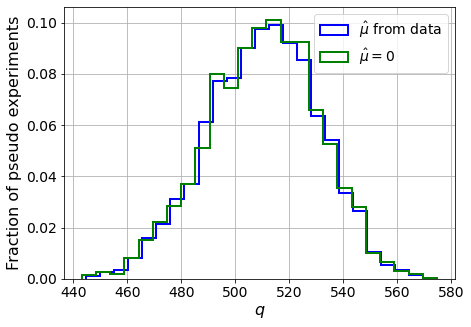

muhat mean:  -0.01160883640769552
Z_bins:  22.60956369173092
std Z_bins:  0.45091157748342947
Z_bins mu=0:  22.60956369173092
std Z_bins mu=0:  0.4543170912056618

--------

B_expected:  643
S_expected:  615



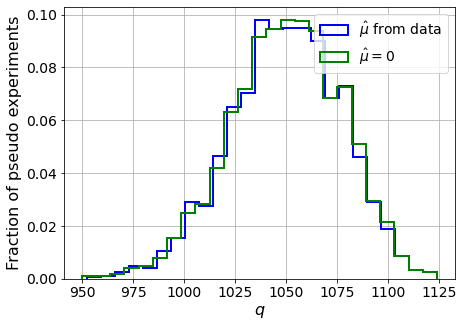

muhat mean:  -0.006730944972879895
Z_bins:  32.41331544118916
std Z_bins:  0.4155029955428394
Z_bins mu=0:  32.41331544118916
std Z_bins mu=0:  0.4185550176293039

--------

B_expected:  643
S_expected:  1187



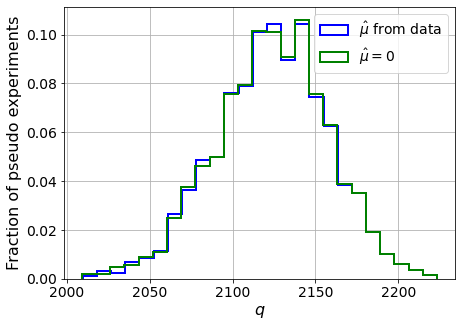

muhat mean:  -0.0032503023036698363
Z_bins:  46.09105661720364
std Z_bins:  0.3670203752355206
Z_bins mu=0:  46.09105661720364
std Z_bins mu=0:  0.36884728925521576

--------

B_expected:  643
S_expected:  2291



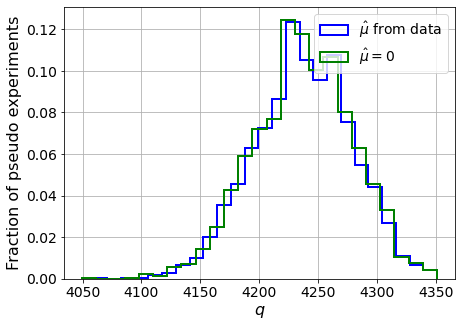

muhat mean:  -0.0016257480316221138
Z_bins:  65.09399457072469
std Z_bins:  0.32015986467680974
Z_bins mu=0:  65.09374573765317
std Z_bins mu=0:  0.3214687781040129

--------

B_expected:  643
S_expected:  4424



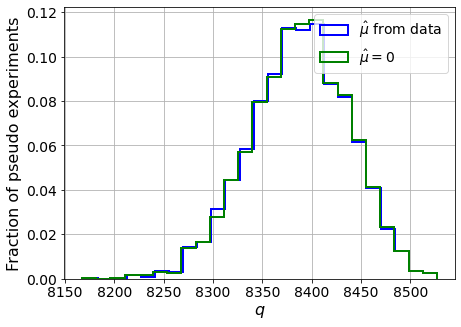

muhat mean:  -0.0008250969947225301
Z_bins:  91.5893261262315
std Z_bins:  0.2717444649357645
Z_bins mu=0:  91.5893261262315
std Z_bins mu=0:  0.27251405628113495

--------

B_expected:  643
S_expected:  8542



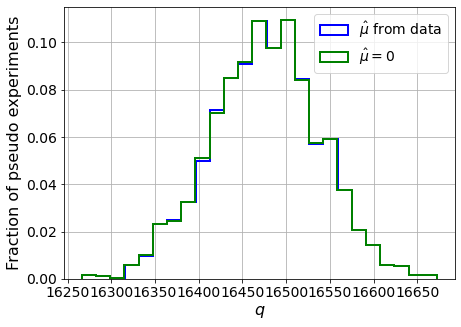

muhat mean:  -0.0004874682747279303
Z_bins:  128.36172697632267
std Z_bins:  0.23965162264501305
Z_bins mu=0:  128.36172697632267
std Z_bins mu=0:  0.2401091479989564

--------


 FINAL RESULT:

[[0.6959454446954616, 0.2655389692345019, -3.3561478961694786, 0.6959454446954616, 0.3207400161295194], [1.022939749687731, 0.35599469201619766, -1.8975987674682477, 1.022939749687731, 0.41793667690485187], [1.3224890294685485, 0.41003441154041154, -1.2706913044134724, 1.3224890294685485, 0.469414470935678], [2.006587159356918, 0.5001643026202753, -0.5941835937820195, 2.006587159356918, 0.5532351215068385], [3.1472396742170567, 0.5744627036404756, -0.33678518302298305, 3.1472396742170567, 0.6073635566407588], [4.747749622732673, 0.6002246257520388, -0.17043738779917983, 4.747749622732673, 0.6194254657719903], [7.129389982054908, 0.5759903668326424, -0.09030449425056769, 7.129389982054908, 0.5874555854177592], [10.62853788137474, 0.5514515044164288, -0.048275665468176854, 10.62853788137474, 0.56

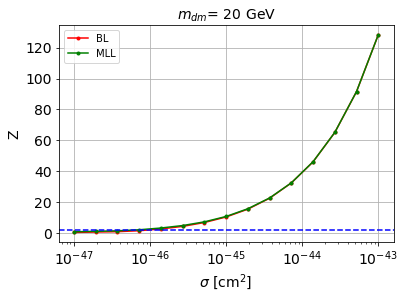


cross_BL_164:  8.259361030612173e-47
cross_BL_164_up:  4.943219309711379e-47
cross_BL_164_down:  1.2838791570418493e-46

cross_MLL_164:  5.058681702189015e-47
cross_MLL_164_up:  3.445756119822193e-47
cross_MLL_164_down:  7.815071149216144e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


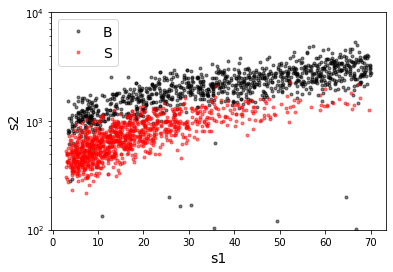

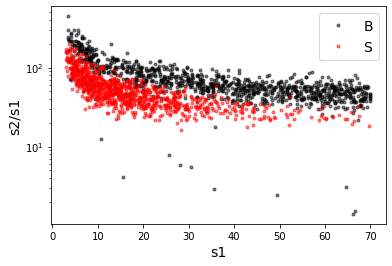

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


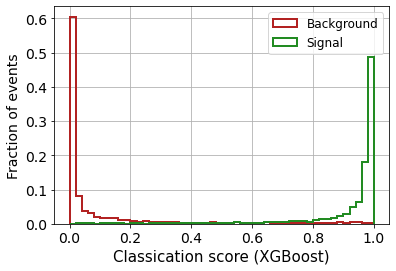


 ROC-AUC =  0.9854459905642725
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


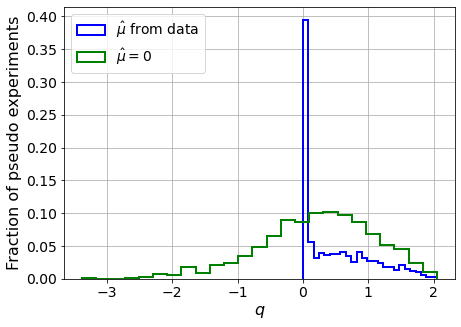

muhat mean:  -0.029825835576839675
Z_bins:  0.5391881904637222
std Z_bins:  0.49086905626811356
Z_bins mu=0:  0.5391881904637222
std Z_bins mu=0:  0.7977655744373487

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


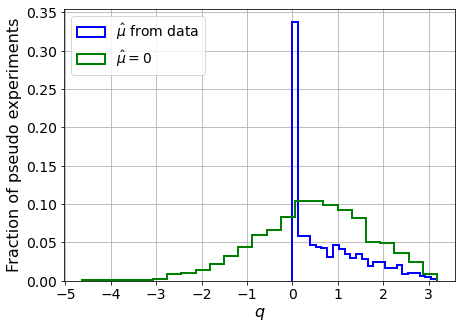

muhat mean:  -0.0003478059267728107
Z_bins:  0.7144864826741028
std Z_bins:  0.5665581650728946
Z_bins mu=0:  0.7144864826741028
std Z_bins mu=0:  0.8559695714680766

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


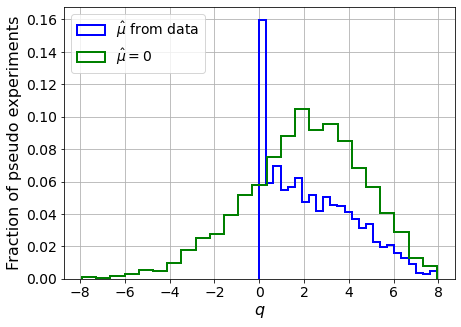

muhat mean:  0.03485459625976245
Z_bins:  1.4649021501819681
std Z_bins:  0.6582265989260276
Z_bins mu=0:  1.4647774457624267
std Z_bins mu=0:  0.8913467385811653

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


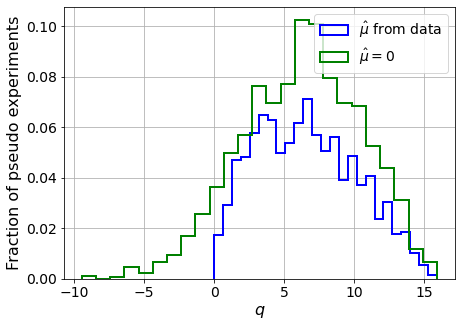

muhat mean:  0.0030928059446334202
Z_bins:  2.530416773031478
std Z_bins:  0.7048255735493011
Z_bins mu=0:  2.53038948786416
std Z_bins mu=0:  0.8336946918599206

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


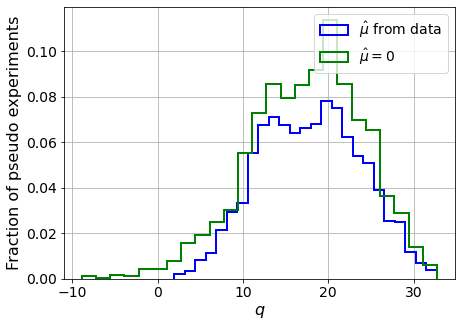

muhat mean:  0.0033021434202753887
Z_bins:  4.237541434719224
std Z_bins:  0.6981718083009939
Z_bins mu=0:  4.237508583132766
std Z_bins mu=0:  0.786873138413058

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.097


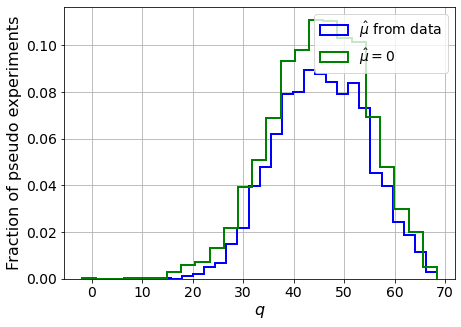

muhat mean:  0.00131398687114085
Z_bins:  6.743704249753528
std Z_bins:  0.6655262020449294
Z_bins mu=0:  6.743553415899417
std Z_bins mu=0:  0.718447230845427

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.108


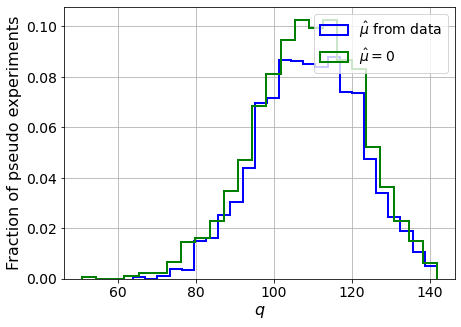

muhat mean:  0.0009078694486448157
Z_bins:  10.453728407688914
std Z_bins:  0.6208194388319601
Z_bins mu=0:  10.453570361477503
std Z_bins mu=0:  0.6559413200409855

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.12


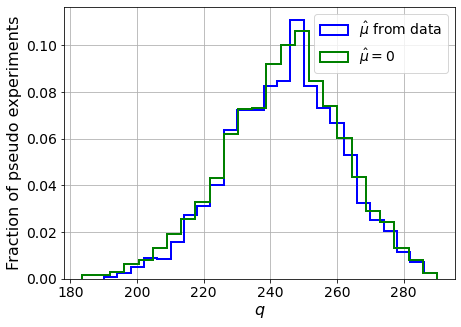

muhat mean:  0.000777192481251445
Z_bins:  15.65993599285291
std Z_bins:  0.5446343108432323
Z_bins mu=0:  15.65988290058136
std Z_bins mu=0:  0.5679038259697318

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


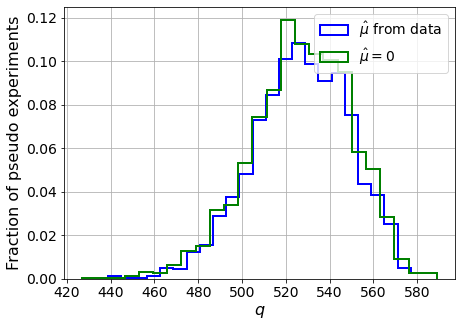

muhat mean:  -0.00012071933072549241
Z_bins:  22.967731606026987
std Z_bins:  0.4848525078779125
Z_bins mu=0:  22.964788503095967
std Z_bins mu=0:  0.5001362101271202

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.123


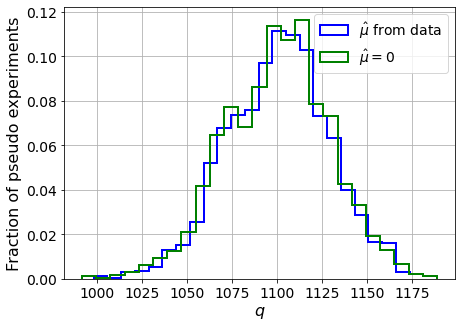

muhat mean:  -2.55676424984539e-05
Z_bins:  33.19154242508713
std Z_bins:  0.4274347773649705
Z_bins mu=0:  33.19099444698314
std Z_bins mu=0:  0.43670639076763107

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.097


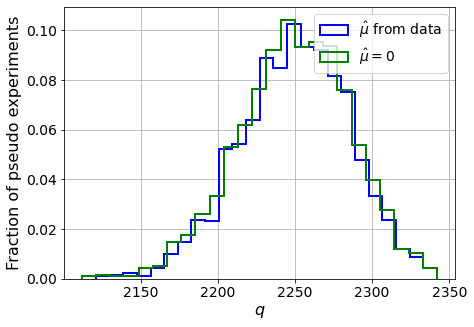

muhat mean:  4.147650150177033e-05
Z_bins:  47.441634044156
std Z_bins:  0.37502335755295274
Z_bins mu=0:  47.440078009877666
std Z_bins mu=0:  0.381731690693034

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


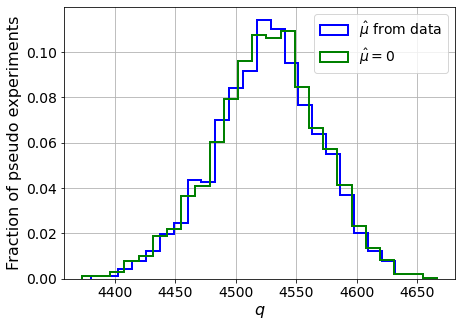

muhat mean:  0.00013525068567263971
Z_bins:  67.28582031903525
std Z_bins:  0.32507163405745454
Z_bins mu=0:  67.28519421493797
std Z_bins mu=0:  0.32981938823846785

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


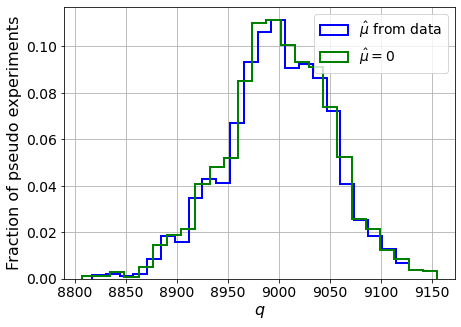

muhat mean:  -1.5732042446129814e-06
Z_bins:  94.86826995887968
std Z_bins:  0.2754858226924721
Z_bins mu=0:  94.86737999168066
std Z_bins mu=0:  0.2784882750034039

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


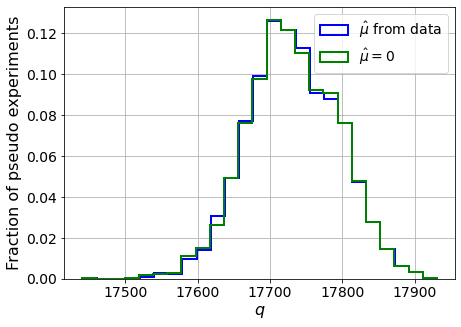

muhat mean:  1.6741186657533005e-05
Z_bins:  133.15697274848569
std Z_bins:  0.23588769018415848
Z_bins mu=0:  133.15655951794534
std Z_bins mu=0:  0.23779000122265628

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


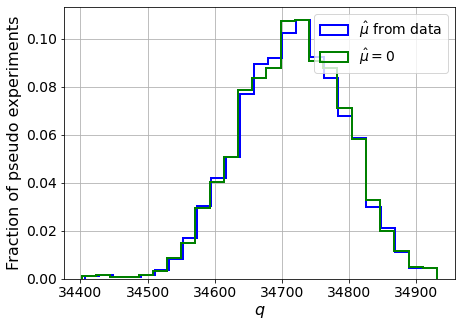

muhat mean:  3.2480545985875244e-07
Z_bins:  186.32562298335023
std Z_bins:  0.20994526952059153
Z_bins mu=0:  186.3254796674309
std Z_bins mu=0:  0.21122242756858417

--------


 FINAL RESULT:

[[0.5391881904637222, 0.49086905626811356, -0.029825835576839675, 0.5391881904637222, 0.7977655744373487], [0.7144864826741028, 0.5665581650728946, -0.0003478059267728107, 0.7144864826741028, 0.8559695714680766], [1.4649021501819681, 0.6582265989260276, 0.03485459625976245, 1.4647774457624267, 0.8913467385811653], [2.530416773031478, 0.7048255735493011, 0.0030928059446334202, 2.53038948786416, 0.8336946918599206], [4.237541434719224, 0.6981718083009939, 0.0033021434202753887, 4.237508583132766, 0.786873138413058], [6.743704249753528, 0.6655262020449294, 0.00131398687114085, 6.743553415899417, 0.718447230845427], [10.453728407688914, 0.6208194388319601, 0.0009078694486448157, 10.453570361477503, 0.6559413200409855], [15.65993599285291, 0.5446343108432323, 0.000777192481251445, 15.65988290058136,

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 302.40192002 260.34008233 213.95450744
 160.95130815 101.62505979  36.88091935 -30.90202285 -97.80791543]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 291.87520365 243.70990722
 190

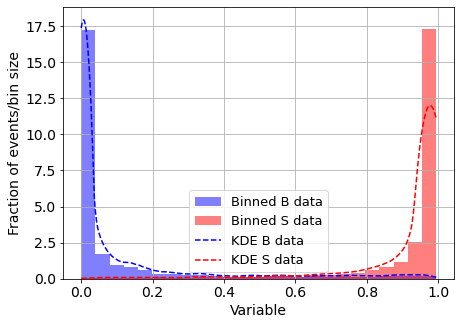

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



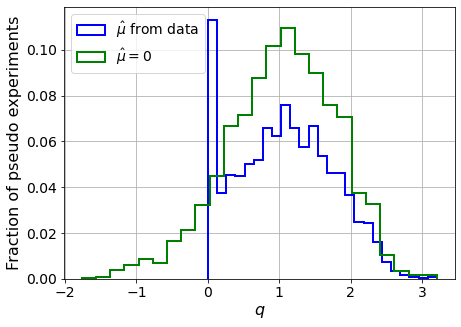

muhat mean:  -2.4593815010247253
Z_bins:  1.0350422638267742
std Z_bins:  0.3262888358922751
Z_bins mu=0:  1.0350422638267742
std Z_bins mu=0:  0.36701272909961785

--------

B_expected:  643
S_expected:  3



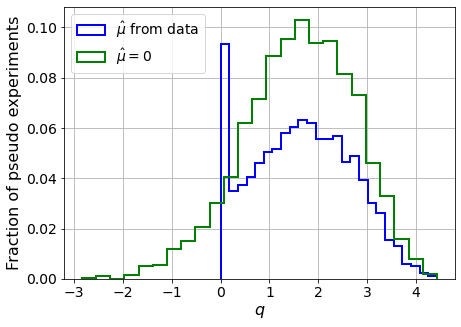

muhat mean:  -1.5879795879668959
Z_bins:  1.2955846394334327
std Z_bins:  0.389332948960682
Z_bins mu=0:  1.2955846394334327
std Z_bins mu=0:  0.4324634095892519

--------

B_expected:  643
S_expected:  7



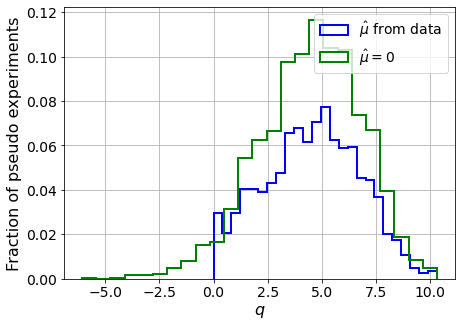

muhat mean:  -0.6355977403195148
Z_bins:  2.151548953059476
std Z_bins:  0.5098408280895073
Z_bins mu=0:  2.151548953059476
std Z_bins mu=0:  0.5466438079053687

--------

B_expected:  643
S_expected:  13



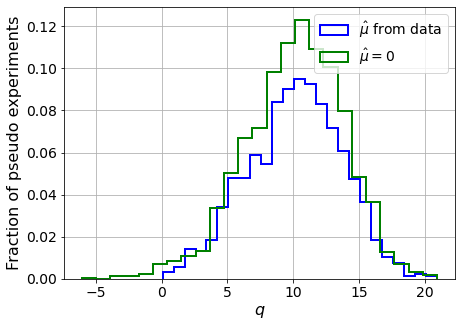

muhat mean:  -0.4064203491283684
Z_bins:  3.2113997300967587
std Z_bins:  0.5555997834528078
Z_bins mu=0:  3.2113997300967587
std Z_bins mu=0:  0.5795964536558815

--------

B_expected:  643
S_expected:  25



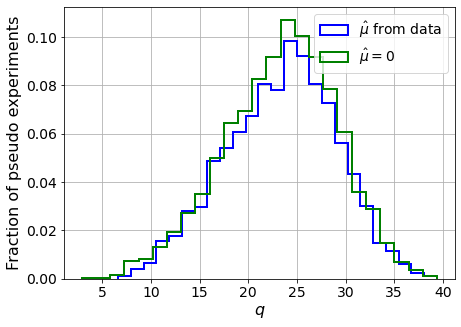

muhat mean:  -0.20437382665368842
Z_bins:  4.8785000925252495
std Z_bins:  0.579332910061398
Z_bins mu=0:  4.8785000925252495
std Z_bins mu=0:  0.5911004707794401

--------

B_expected:  643
S_expected:  48



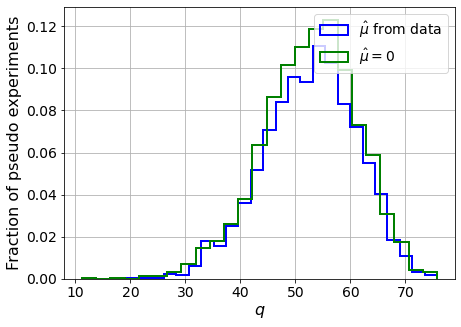

muhat mean:  -0.09341843661052826
Z_bins:  7.289682350837782
std Z_bins:  0.5789035245244604
Z_bins mu=0:  7.289682350837782
std Z_bins mu=0:  0.5902299894899159

--------

B_expected:  643
S_expected:  93



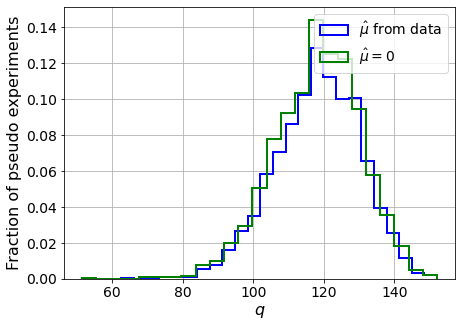

muhat mean:  -0.05073427647720677
Z_bins:  10.898290194918753
std Z_bins:  0.5530650560214557
Z_bins mu=0:  10.898290194918753
std Z_bins mu=0:  0.561252956156377

--------

B_expected:  643
S_expected:  179



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


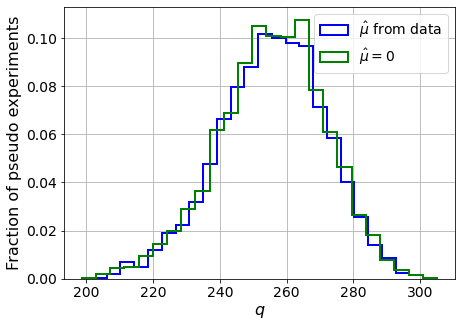

muhat mean:  -0.02609473784498663
Z_bins:  16.00550252577459
std Z_bins:  0.49856418921562584
Z_bins mu=0:  16.00550252577459
std Z_bins mu=0:  0.5024408145743363

--------

B_expected:  643
S_expected:  345



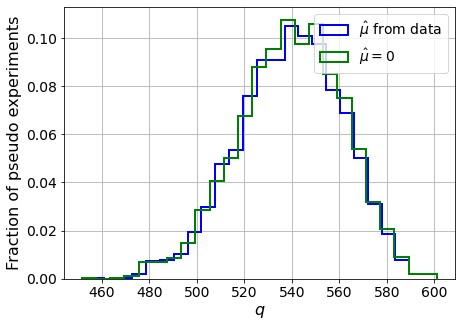

muhat mean:  -0.014180693178837349
Z_bins:  23.24830994766507
std Z_bins:  0.470834722370311
Z_bins mu=0:  23.24830994766507
std Z_bins mu=0:  0.4733790645332256

--------

B_expected:  643
S_expected:  666



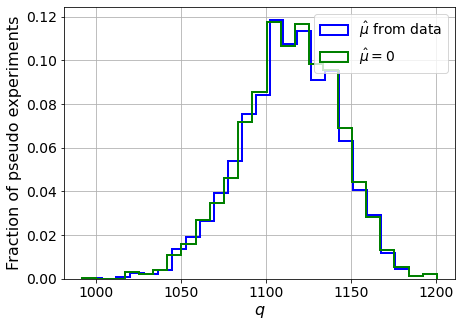

muhat mean:  -0.006690288168748546
Z_bins:  33.38344837077402
std Z_bins:  0.430740168602475
Z_bins mu=0:  33.38344837077402
std Z_bins mu=0:  0.4328858041683029

--------

B_expected:  643
S_expected:  1286



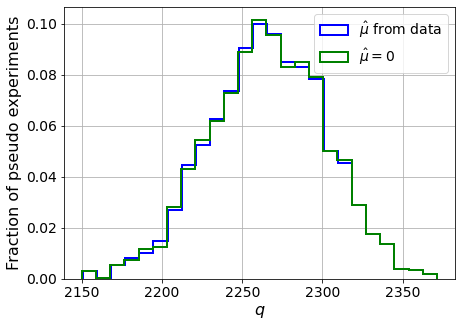

muhat mean:  -0.0037817153887139752
Z_bins:  47.60035370151147
std Z_bins:  0.378607335109144
Z_bins mu=0:  47.600102347472806
std Z_bins mu=0:  0.3797755618788915

--------

B_expected:  643
S_expected:  2484



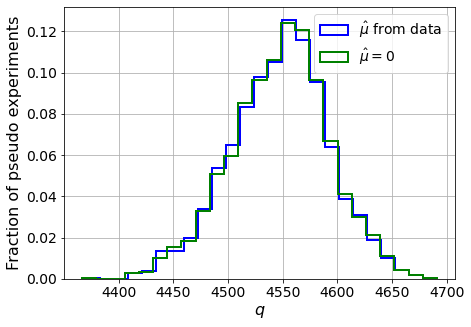

muhat mean:  -0.0017825471351219121
Z_bins:  67.45598861442767
std Z_bins:  0.33457177830013035
Z_bins mu=0:  67.45598861442767
std Z_bins mu=0:  0.33560191251428295

--------

B_expected:  643
S_expected:  4795



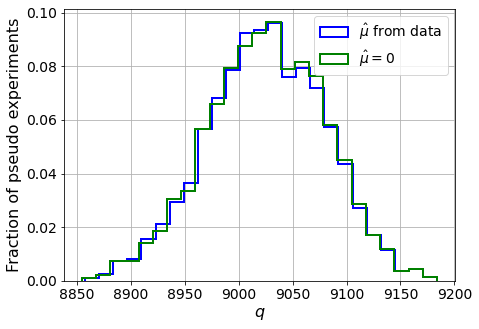

muhat mean:  -0.0009610795253630198
Z_bins:  95.00575905381386
std Z_bins:  0.28605254009954456
Z_bins mu=0:  95.0057588544384
std Z_bins mu=0:  0.2866429529030504

--------

B_expected:  643
S_expected:  9258



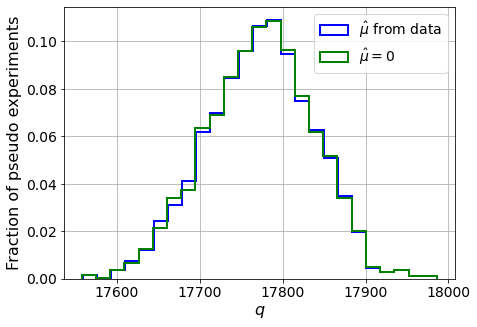

muhat mean:  -0.0005548812368927895
Z_bins:  133.32074017197746
std Z_bins:  0.24086416301004504
Z_bins mu=0:  133.32074017197746
std Z_bins mu=0:  0.2411832242010173

--------

B_expected:  643
S_expected:  17875



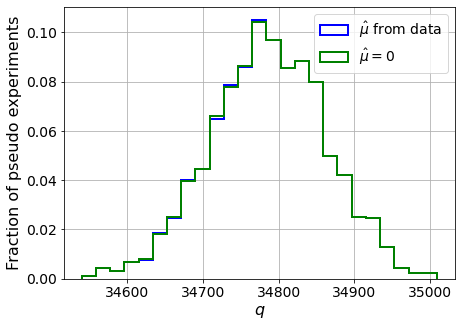

muhat mean:  -0.00025762610964468293
Z_bins:  186.51230369068165
std Z_bins:  0.20335762792736112
Z_bins mu=0:  186.51230369068165
std Z_bins mu=0:  0.20359256032041928

--------


 FINAL RESULT:

[[1.0350422638267742, 0.3262888358922751, -2.4593815010247253, 1.0350422638267742, 0.36701272909961785], [1.2955846394334327, 0.389332948960682, -1.5879795879668959, 1.2955846394334327, 0.4324634095892519], [2.151548953059476, 0.5098408280895073, -0.6355977403195148, 2.151548953059476, 0.5466438079053687], [3.2113997300967587, 0.5555997834528078, -0.4064203491283684, 3.2113997300967587, 0.5795964536558815], [4.8785000925252495, 0.579332910061398, -0.20437382665368842, 4.8785000925252495, 0.5911004707794401], [7.289682350837782, 0.5789035245244604, -0.09341843661052826, 7.289682350837782, 0.5902299894899159], [10.898290194918753, 0.5530650560214557, -0.05073427647720677, 10.898290194918753, 0.561252956156377], [16.00550252577459, 0.49856418921562584, -0.02609473784498663, 16.00550252577459, 0.

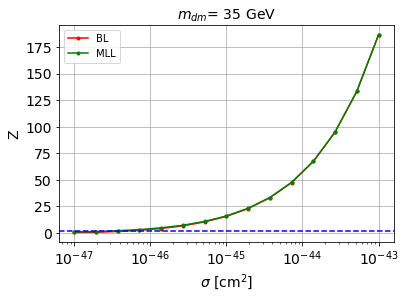


cross_BL_164:  4.153177487206308e-47
cross_BL_164_up:  2.555675851657836e-47
cross_BL_164_down:  6.701960047926988e-47

cross_MLL_164:  2.7134719910367677e-47
cross_MLL_164_up:  1.8731453017259095e-47
cross_MLL_164_down:  3.723465356409178e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


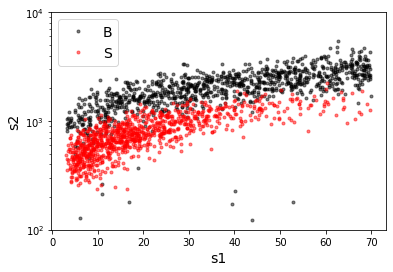

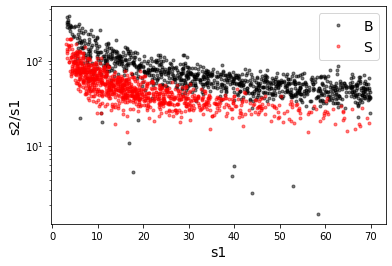

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


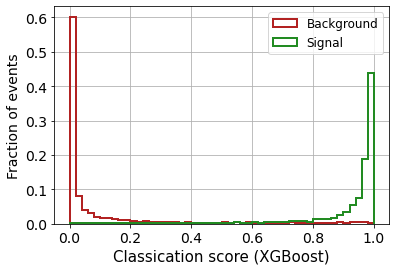


 ROC-AUC =  0.9829442537778329
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


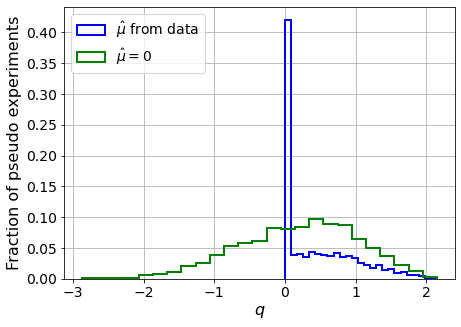

muhat mean:  0.009253620861571351
Z_bins:  0.5096089960789992
std Z_bins:  0.5052015523807623
Z_bins mu=0:  0.5096089960789992
std Z_bins mu=0:  0.8262561924286117

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


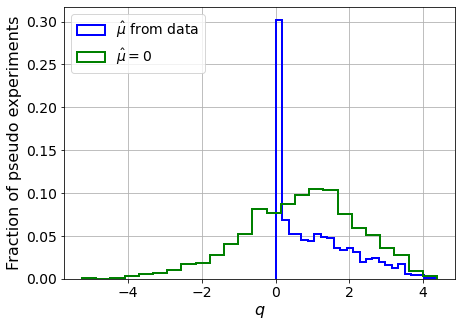

muhat mean:  0.02315020702374031
Z_bins:  0.8903102151188187
std Z_bins:  0.5830148455996356
Z_bins mu=0:  0.8903102151188187
std Z_bins mu=0:  0.8616982742656327

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


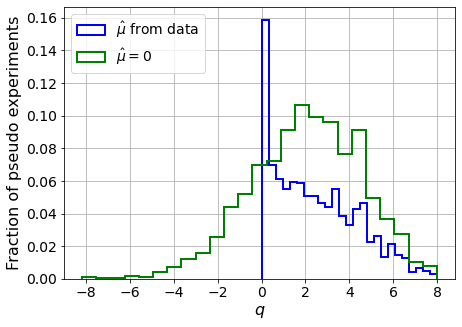

muhat mean:  -0.00899146800137588
Z_bins:  1.4636183732611145
std Z_bins:  0.6569193067359559
Z_bins mu=0:  1.4636183732611145
std Z_bins mu=0:  0.8577333281260158

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1205


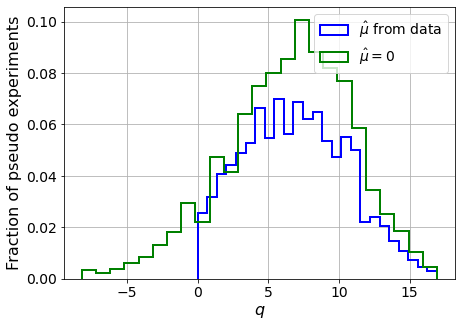

muhat mean:  0.011223240642712828
Z_bins:  2.6199960481783595
std Z_bins:  0.6960601385176006
Z_bins mu=0:  2.6199960481783595
std Z_bins mu=0:  0.8415433793621012

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


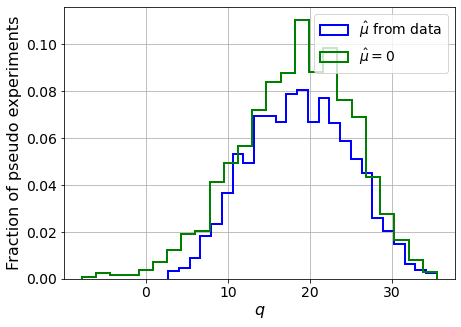

muhat mean:  0.010602416608309793
Z_bins:  4.330921169525572
std Z_bins:  0.7052081827462916
Z_bins mu=0:  4.330905782442775
std Z_bins mu=0:  0.7961245226056693

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.093


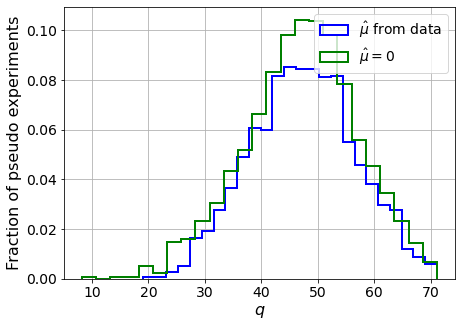

muhat mean:  0.000995467701388683
Z_bins:  6.896251055287281
std Z_bins:  0.6691073934383757
Z_bins mu=0:  6.896251055287281
std Z_bins mu=0:  0.7193056211333654

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


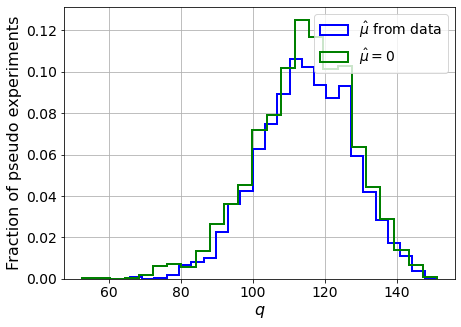

muhat mean:  0.00041116194450503094
Z_bins:  10.72102829723381
std Z_bins:  0.6024097748188671
Z_bins mu=0:  10.719544927788192
std Z_bins mu=0:  0.6378595237334128

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.113


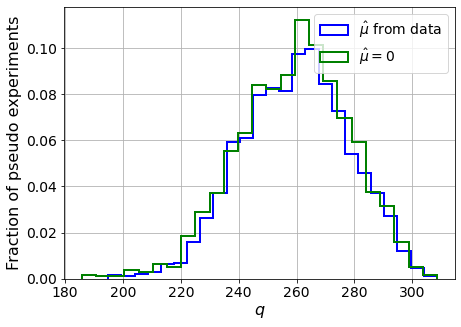

muhat mean:  0.0012990955290267012
Z_bins:  16.134018433634296
std Z_bins:  0.5695998703931815
Z_bins mu=0:  16.13211457639209
std Z_bins mu=0:  0.5937750715049773

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


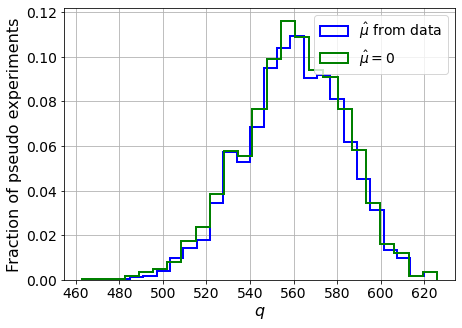

muhat mean:  0.0003520485496580216
Z_bins:  23.677122976090754
std Z_bins:  0.48748682277528316
Z_bins mu=0:  23.675590523783796
std Z_bins mu=0:  0.5022836631183913

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


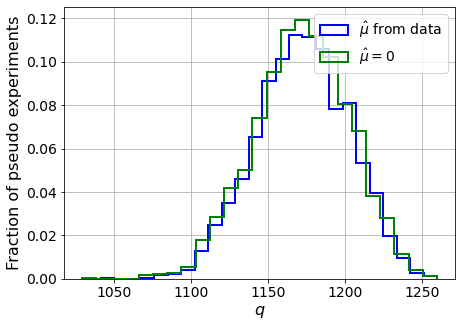

muhat mean:  0.0002791745335748965
Z_bins:  34.23717482380273
std Z_bins:  0.4397252252205015
Z_bins mu=0:  34.23641664139575
std Z_bins mu=0:  0.44981351297504785

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


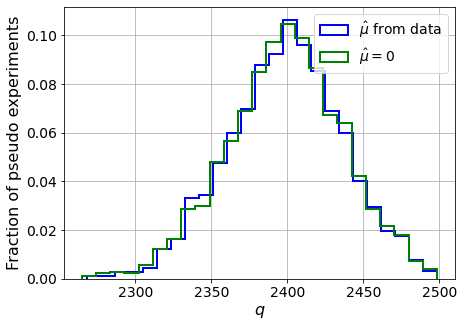

muhat mean:  0.00011497153849832226
Z_bins:  48.99317899060385
std Z_bins:  0.38482176972669246
Z_bins mu=0:  48.99266829708589
std Z_bins mu=0:  0.3916736672167945

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.125


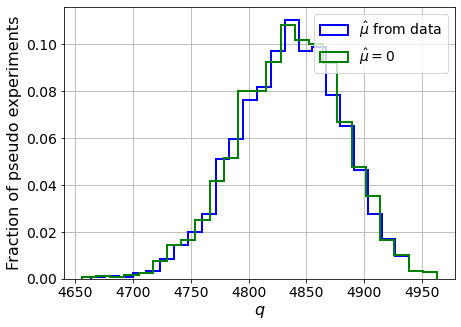

muhat mean:  -1.4802080934418113e-05
Z_bins:  69.55320828769449
std Z_bins:  0.3254340898072012
Z_bins mu=0:  69.55320828769449
std Z_bins mu=0:  0.3294566415466665

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


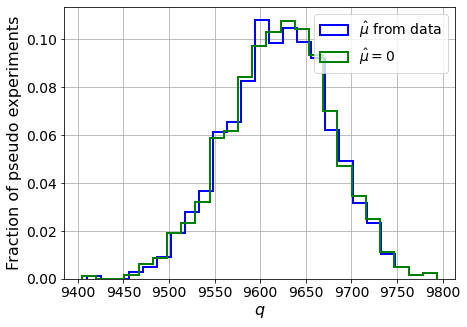

muhat mean:  1.5478115534343113e-05
Z_bins:  98.09630344713196
std Z_bins:  0.2880688194229469
Z_bins mu=0:  98.09501379565026
std Z_bins mu=0:  0.2907824114024236

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1215


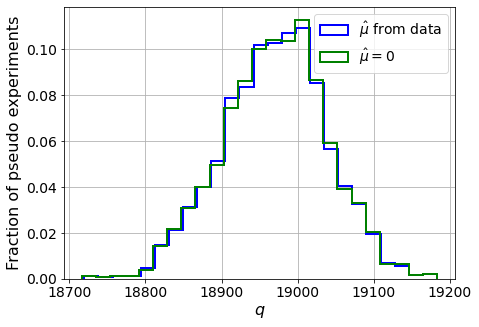

muhat mean:  8.155606632546727e-06
Z_bins:  137.74725447754406
std Z_bins:  0.2474896206480443
Z_bins mu=0:  137.7460187356687
std Z_bins mu=0:  0.2492382599102085

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


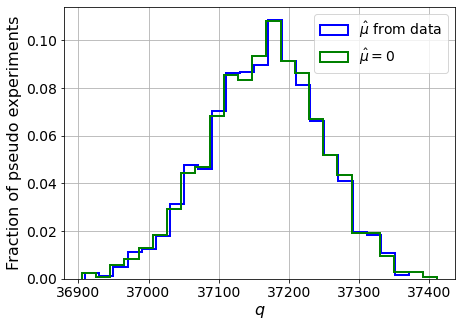

muhat mean:  3.960414753370552e-06
Z_bins:  192.79194027857045
std Z_bins:  0.20864672075110652
Z_bins mu=0:  192.79151232056108
std Z_bins mu=0:  0.20997480396982954

--------


 FINAL RESULT:

[[0.5096089960789992, 0.5052015523807623, 0.009253620861571351, 0.5096089960789992, 0.8262561924286117], [0.8903102151188187, 0.5830148455996356, 0.02315020702374031, 0.8903102151188187, 0.8616982742656327], [1.4636183732611145, 0.6569193067359559, -0.00899146800137588, 1.4636183732611145, 0.8577333281260158], [2.6199960481783595, 0.6960601385176006, 0.011223240642712828, 2.6199960481783595, 0.8415433793621012], [4.330921169525572, 0.7052081827462916, 0.010602416608309793, 4.330905782442775, 0.7961245226056693], [6.896251055287281, 0.6691073934383757, 0.000995467701388683, 6.896251055287281, 0.7193056211333654], [10.72102829723381, 0.6024097748188671, 0.00041116194450503094, 10.719544927788192, 0.6378595237334128], [16.134018433634296, 0.5695998703931815, 0.0012990955290267012, 16.1321145763920

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  314.19001797  282.77238178  243.64697923  197.22742436
  147.06767156   91.62282122   29.82239882  -36.03538783 -100.19278893]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 274.805427

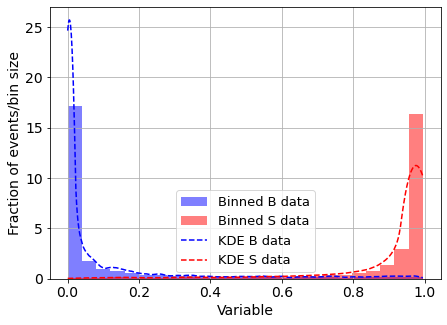

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



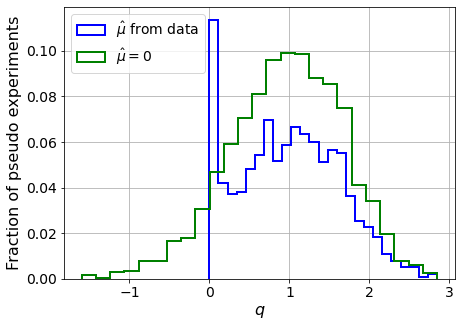

muhat mean:  -2.3748372459934215
Z_bins:  1.0003633940157162
std Z_bins:  0.31572021761132246
Z_bins mu=0:  1.0003633940157162
std Z_bins mu=0:  0.35122787099202885

--------

B_expected:  643
S_expected:  4



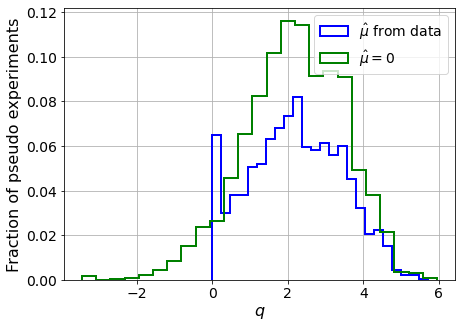

muhat mean:  -1.3480658957435052
Z_bins:  1.4867932669536446
std Z_bins:  0.409318170228793
Z_bins mu=0:  1.4867932669536446
std Z_bins mu=0:  0.4434291836633194

--------

B_expected:  643
S_expected:  7



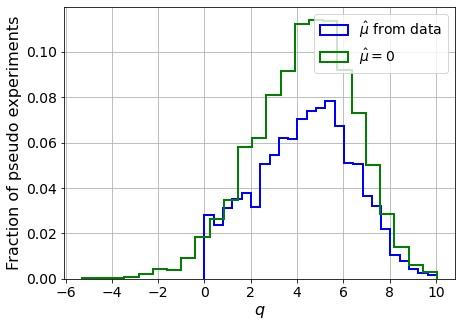

muhat mean:  -0.7120144186599883
Z_bins:  2.120338187720762
std Z_bins:  0.4860178155559472
Z_bins mu=0:  2.120338187720762
std Z_bins mu=0:  0.5168126594774926

--------

B_expected:  643
S_expected:  14



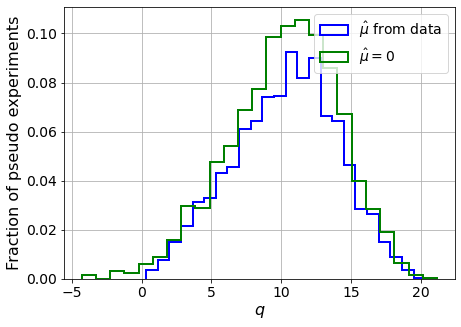

muhat mean:  -0.33380021069750904
Z_bins:  3.2454741229043336
std Z_bins:  0.577991861006843
Z_bins mu=0:  3.2454741229043336
std Z_bins mu=0:  0.6014184015907033

--------

B_expected:  643
S_expected:  27



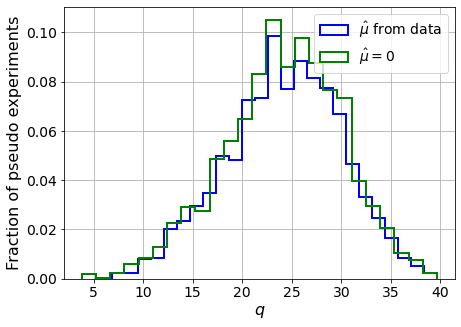

muhat mean:  -0.18130902144311828
Z_bins:  4.945543746317259
std Z_bins:  0.5877942966056819
Z_bins mu=0:  4.945543746317259
std Z_bins mu=0:  0.5997460542459543

--------

B_expected:  643
S_expected:  51



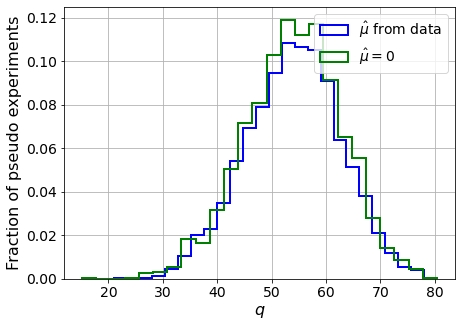

muhat mean:  -0.09656643061461036
Z_bins:  7.3631940823445365
std Z_bins:  0.5908759776107274
Z_bins mu=0:  7.3631940823445365
std Z_bins mu=0:  0.5989760845956951

--------

B_expected:  643
S_expected:  99



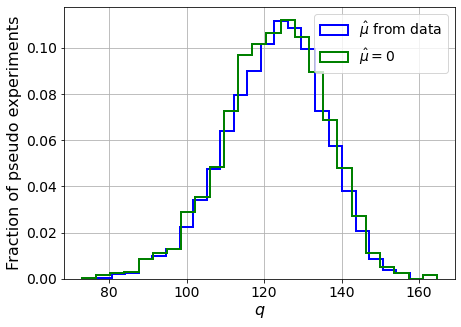

muhat mean:  -0.05139846187338617
Z_bins:  11.10850458259173
std Z_bins:  0.5767506171880267
Z_bins mu=0:  11.10850458259173
std Z_bins mu=0:  0.5835547209006572

--------

B_expected:  643
S_expected:  192



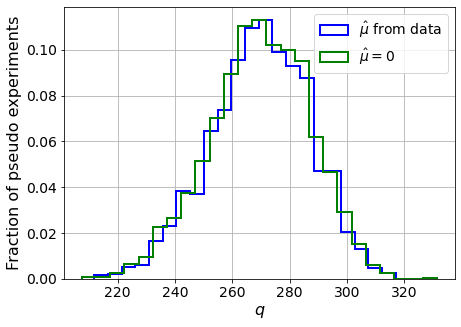

muhat mean:  -0.02679847809987367
Z_bins:  16.443273131989425
std Z_bins:  0.5257063365627943
Z_bins mu=0:  16.443273131989425
std Z_bins mu=0:  0.5291210258283401

--------

B_expected:  643
S_expected:  370



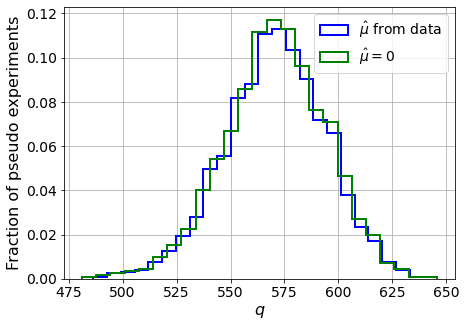

muhat mean:  -0.01387415047366115
Z_bins:  23.903472565781097
std Z_bins:  0.49196989203805697
Z_bins mu=0:  23.903472565781097
std Z_bins mu=0:  0.49536055593943507

--------

B_expected:  643
S_expected:  714



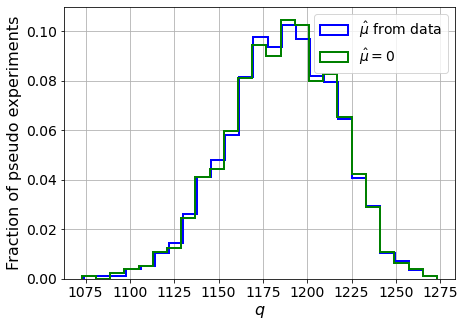

muhat mean:  -0.007176116650314139
Z_bins:  34.4529838430605
std Z_bins:  0.4424074902076787
Z_bins mu=0:  34.4529838430605
std Z_bins mu=0:  0.44412453331925167

--------

B_expected:  643
S_expected:  1378



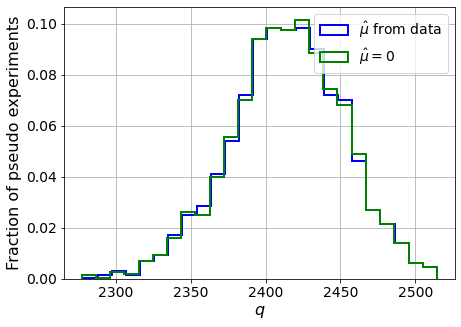

muhat mean:  -0.0036377297130685536
Z_bins:  49.15264997099841
std Z_bins:  0.3829842359179729
Z_bins mu=0:  49.15264997099841
std Z_bins mu=0:  0.3842935675133071

--------

B_expected:  643
S_expected:  2661



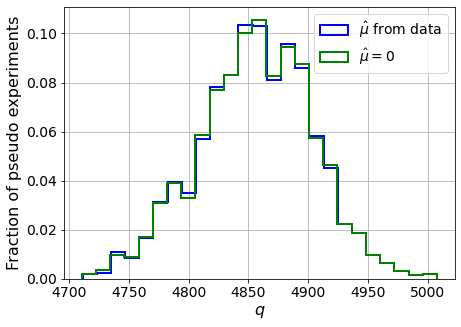

muhat mean:  -0.0019869874693436125
Z_bins:  69.6916821070261
std Z_bins:  0.34063011278502053
Z_bins mu=0:  69.6916821070261
std Z_bins mu=0:  0.3413258497898229

--------

B_expected:  643
S_expected:  5138



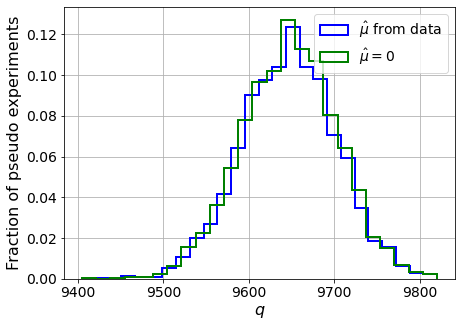

muhat mean:  -0.0009488420291984574
Z_bins:  98.22359584738966
std Z_bins:  0.28480452157565866
Z_bins mu=0:  98.22359584738966
std Z_bins mu=0:  0.2853973880952347

--------

B_expected:  643
S_expected:  9921



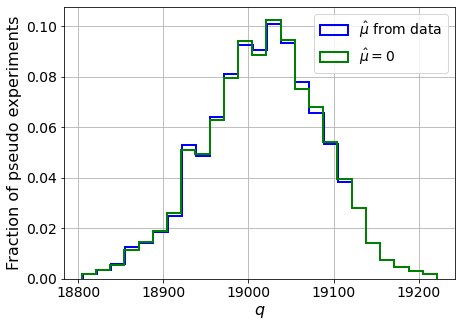

muhat mean:  -0.000488601249058456
Z_bins:  137.91264630525959
std Z_bins:  0.24887369737286943
Z_bins mu=0:  137.91258854154754
std Z_bins mu=0:  0.24917782581219966

--------

B_expected:  643
S_expected:  19154



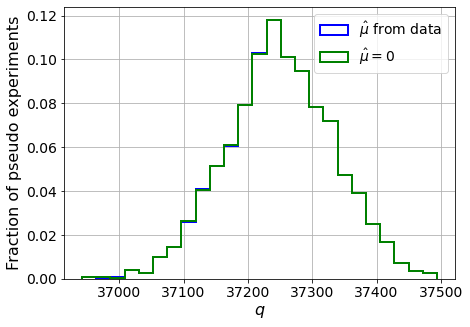

muhat mean:  -0.0002616332654394001
Z_bins:  192.99850349275957
std Z_bins:  0.21619286985625707
Z_bins mu=0:  192.99850349275957
std Z_bins mu=0:  0.21643878911129502

--------


 FINAL RESULT:

[[1.0003633940157162, 0.31572021761132246, -2.3748372459934215, 1.0003633940157162, 0.35122787099202885], [1.4867932669536446, 0.409318170228793, -1.3480658957435052, 1.4867932669536446, 0.4434291836633194], [2.120338187720762, 0.4860178155559472, -0.7120144186599883, 2.120338187720762, 0.5168126594774926], [3.2454741229043336, 0.577991861006843, -0.33380021069750904, 3.2454741229043336, 0.6014184015907033], [4.945543746317259, 0.5877942966056819, -0.18130902144311828, 4.945543746317259, 0.5997460542459543], [7.3631940823445365, 0.5908759776107274, -0.09656643061461036, 7.3631940823445365, 0.5989760845956951], [11.10850458259173, 0.5767506171880267, -0.05139846187338617, 11.10850458259173, 0.5835547209006572], [16.443273131989425, 0.5257063365627943, -0.02679847809987367, 16.443273131989425, 0

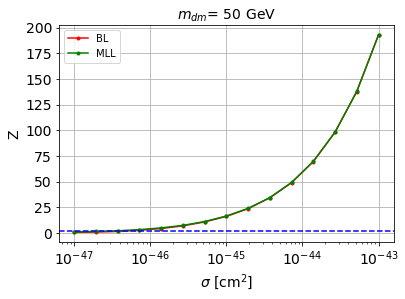


cross_BL_164:  4.1210549777386377e-47
cross_BL_164_up:  2.28714407689345e-47
cross_BL_164_down:  6.448702887227158e-47

cross_MLL_164:  2.2636382417022025e-47
cross_MLL_164_up:  1.522954126198335e-47
cross_MLL_164_down:  3.7410993017417834e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


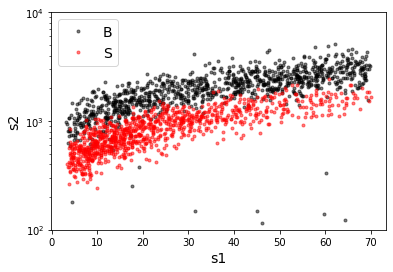

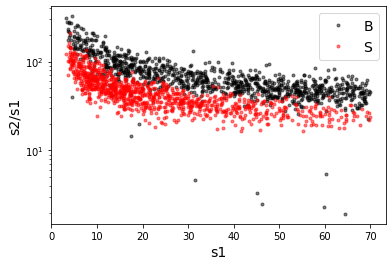

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


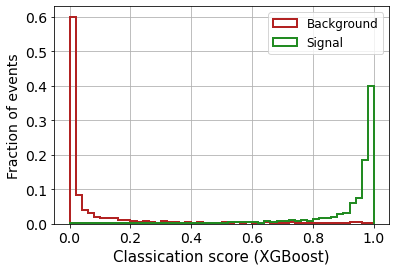


 ROC-AUC =  0.9803669487107838
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1045


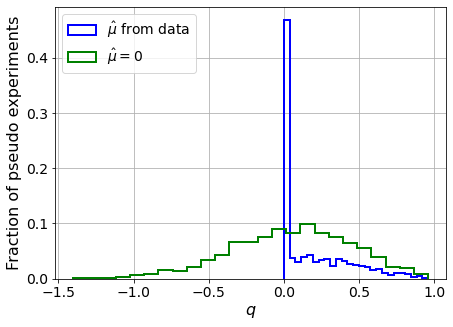

muhat mean:  -0.031172389995437692
Z_bins:  0.26491268507654936
std Z_bins:  0.4495125764998239
Z_bins mu=0:  0.26491268507654936
std Z_bins mu=0:  0.7672177127768549

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


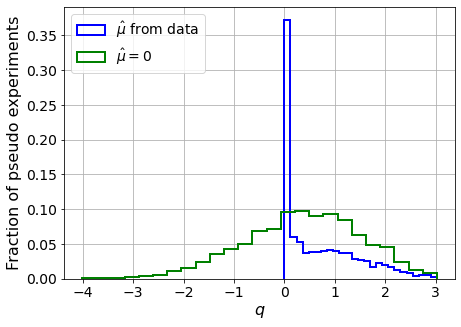

muhat mean:  0.055080911291626566
Z_bins:  0.6420079096344716
std Z_bins:  0.5804792198395705
Z_bins mu=0:  0.6420079096344716
std Z_bins mu=0:  0.9016704477606771

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1115


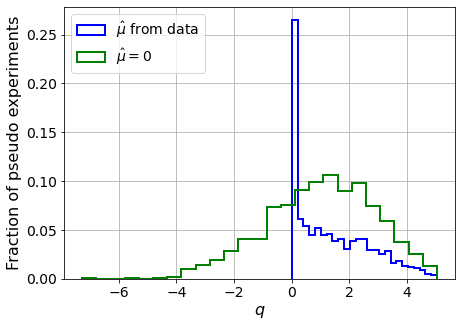

muhat mean:  0.01898332339535822
Z_bins:  1.0591020054381801
std Z_bins:  0.615271415628221
Z_bins mu=0:  1.0591020054381801
std Z_bins mu=0:  0.8782431247952038

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.125


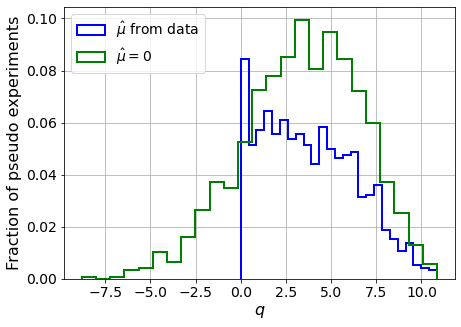

muhat mean:  0.02136979916040479
Z_bins:  1.8896113345419547
std Z_bins:  0.6759473560164371
Z_bins mu=0:  1.8896113345419547
std Z_bins mu=0:  0.8532768325045527

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


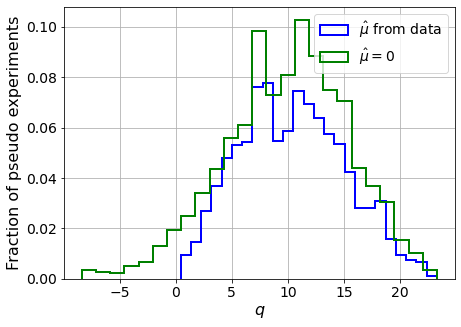

muhat mean:  0.021511452012173277
Z_bins:  3.2154570954433273
std Z_bins:  0.7252388952360731
Z_bins mu=0:  3.2152241234010606
std Z_bins mu=0:  0.8492877134946478

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


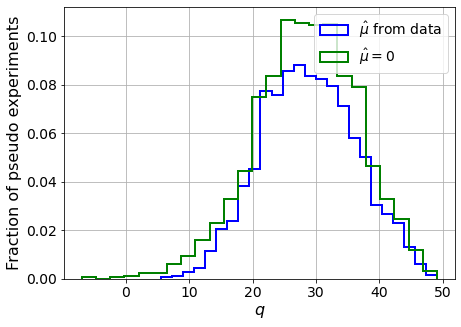

muhat mean:  0.004217196521194028
Z_bins:  5.362752843012655
std Z_bins:  0.6931923823393005
Z_bins mu=0:  5.362752843012655
std Z_bins mu=0:  0.7607016646803527

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


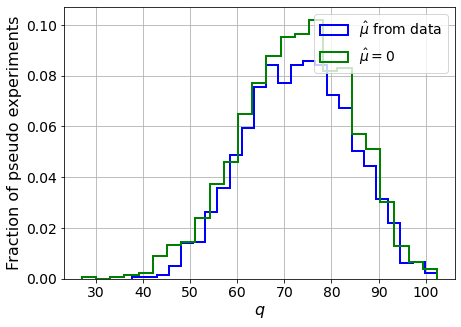

muhat mean:  0.002421367594294757
Z_bins:  8.555631977292173
std Z_bins:  0.6448155966283498
Z_bins mu=0:  8.555276913033351
std Z_bins mu=0:  0.6858951828815584

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


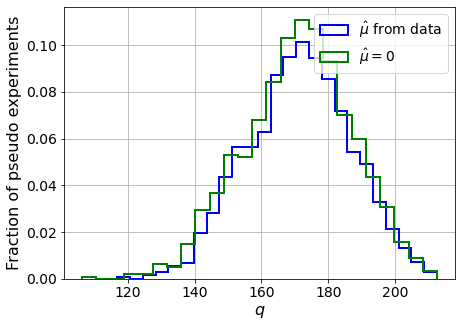

muhat mean:  -0.0009909571192277791
Z_bins:  13.103672829968893
std Z_bins:  0.5900628856640182
Z_bins mu=0:  13.103580031360483
std Z_bins mu=0:  0.6143888960765572

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


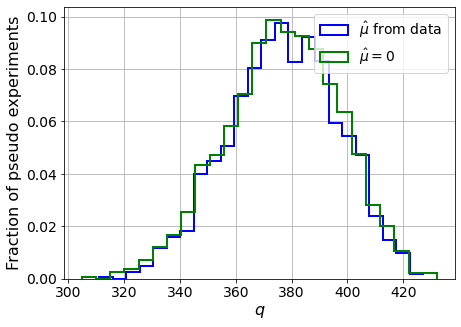

muhat mean:  0.00036704863371429916
Z_bins:  19.426619234586973
std Z_bins:  0.5080334844166743
Z_bins mu=0:  19.426029047293362
std Z_bins mu=0:  0.5242110064766481

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.12


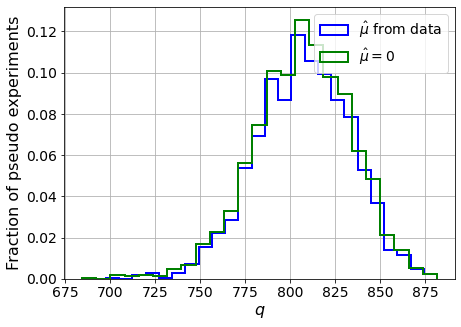

muhat mean:  8.381303961802854e-05
Z_bins:  28.420022500953035
std Z_bins:  0.4617265384574466
Z_bins mu=0:  28.420022500953035
std Z_bins mu=0:  0.47402831435427645

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


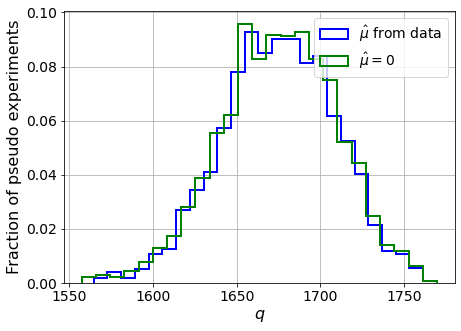

muhat mean:  0.00023575401284597623
Z_bins:  40.93879305810872
std Z_bins:  0.41266513824377127
Z_bins mu=0:  40.93623051566934
std Z_bins mu=0:  0.4209480093564443

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


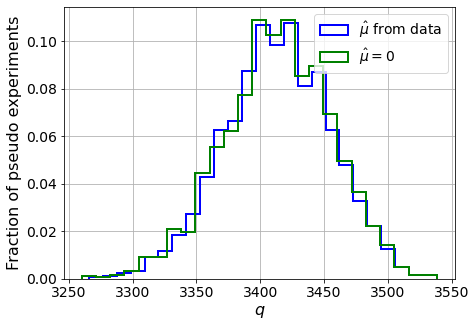

muhat mean:  1.1170411600274746e-05
Z_bins:  58.43284916627759
std Z_bins:  0.35708565318133245
Z_bins mu=0:  58.432205397625445
std Z_bins mu=0:  0.36197600547951436

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


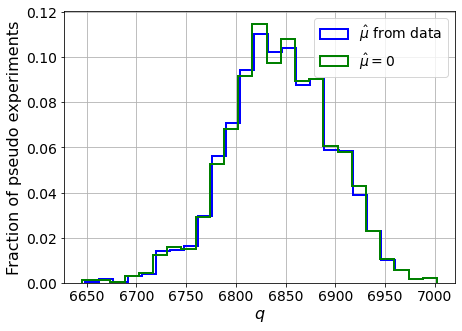

muhat mean:  4.564059182452586e-05
Z_bins:  82.72959355097127
std Z_bins:  0.3139983196857336
Z_bins mu=0:  82.72937395827574
std Z_bins mu=0:  0.31734455576022885

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


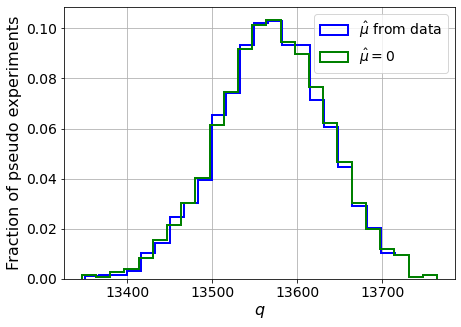

muhat mean:  2.38063977238978e-05
Z_bins:  116.49735822919047
std Z_bins:  0.2751552873248573
Z_bins mu=0:  116.4960348022193
std Z_bins mu=0:  0.2775195882638048

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1255


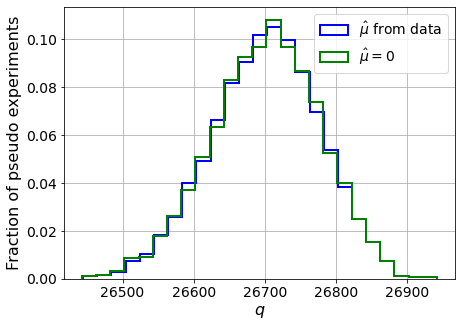

muhat mean:  1.378012705797268e-05
Z_bins:  163.41527733655602
std Z_bins:  0.2322101274624122
Z_bins mu=0:  163.4132596335676
std Z_bins mu=0:  0.23382226759473862

--------


 FINAL RESULT:

[[0.26491268507654936, 0.4495125764998239, -0.031172389995437692, 0.26491268507654936, 0.7672177127768549], [0.6420079096344716, 0.5804792198395705, 0.055080911291626566, 0.6420079096344716, 0.9016704477606771], [1.0591020054381801, 0.615271415628221, 0.01898332339535822, 1.0591020054381801, 0.8782431247952038], [1.8896113345419547, 0.6759473560164371, 0.02136979916040479, 1.8896113345419547, 0.8532768325045527], [3.2154570954433273, 0.7252388952360731, 0.021511452012173277, 3.2152241234010606, 0.8492877134946478], [5.362752843012655, 0.6931923823393005, 0.004217196521194028, 5.362752843012655, 0.7607016646803527], [8.555631977292173, 0.6448155966283498, 0.002421367594294757, 8.555276913033351, 0.6858951828815584], [13.103672829968893, 0.5900628856640182, -0.0009909571192277791, 13.10358003136048

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 346.8731702  309.42730066 265.45674102 213.79266909
 161.98624136 104.11555613  38.49121697 -27.66372611 -96.64827406]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 285.60627259 252.73824167 212.64144965
 162

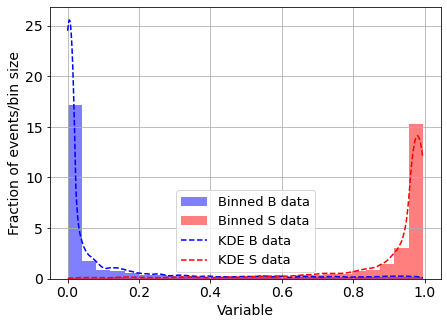

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



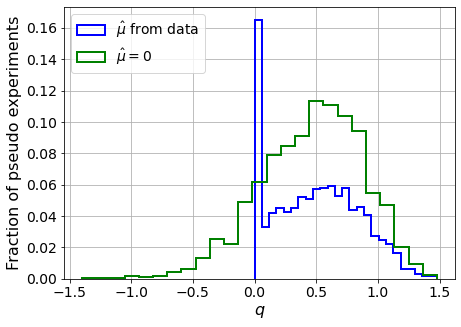

muhat mean:  -5.533168692633215
Z_bins:  0.7021369351056608
std Z_bins:  0.24937455752283358
Z_bins mu=0:  0.7021369351056608
std Z_bins mu=0:  0.29379915263893164

--------

B_expected:  643
S_expected:  3



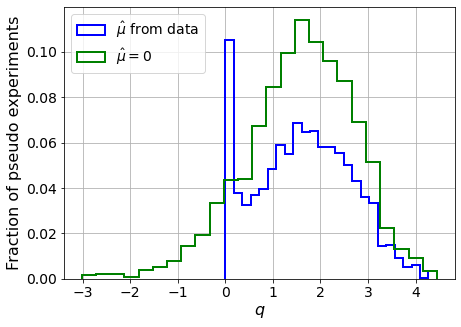

muhat mean:  -1.7550098634021087
Z_bins:  1.2787445773879367
std Z_bins:  0.3916723834938881
Z_bins mu=0:  1.2787445773879367
std Z_bins mu=0:  0.44672788900144406

--------

B_expected:  643
S_expected:  5



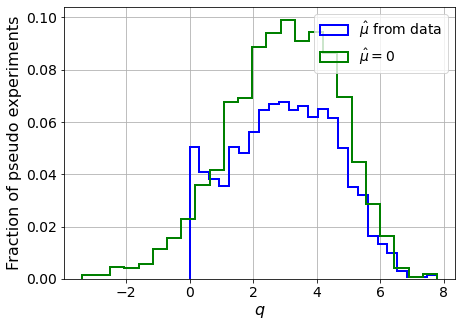

muhat mean:  -0.991319724955245
Z_bins:  1.7408835393427657
std Z_bins:  0.4616391542041996
Z_bins mu=0:  1.7408835393427657
std Z_bins mu=0:  0.5032371873295122

--------

B_expected:  643
S_expected:  10



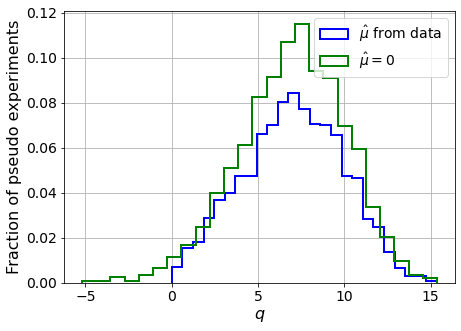

muhat mean:  -0.4981180081820455
Z_bins:  2.6684866672511247
std Z_bins:  0.5454641402771235
Z_bins mu=0:  2.6684866672511247
std Z_bins mu=0:  0.5772273827660472

--------

B_expected:  643
S_expected:  19



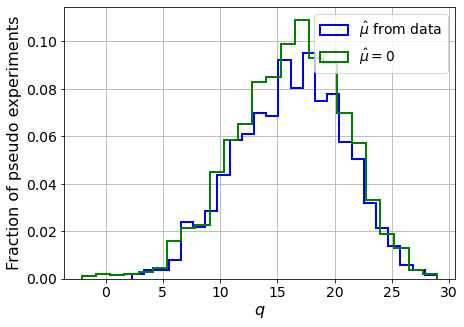

muhat mean:  -0.27056140962743713
Z_bins:  4.049268086119489
std Z_bins:  0.5717147447784743
Z_bins mu=0:  4.049268086119489
std Z_bins mu=0:  0.5897373581231344

--------

B_expected:  643
S_expected:  37



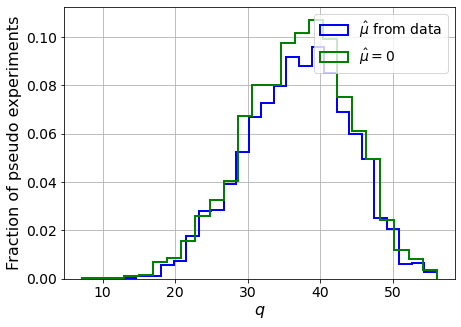

muhat mean:  -0.13165843009664346
Z_bins:  6.1040429264759455
std Z_bins:  0.5892124451319022
Z_bins mu=0:  6.1040429264759455
std Z_bins mu=0:  0.6028492162161633

--------

B_expected:  643
S_expected:  72



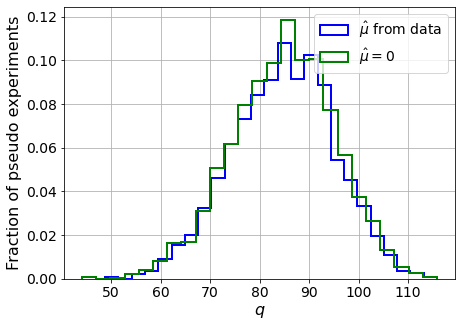

muhat mean:  -0.07896430368259899
Z_bins:  9.229411240156788
std Z_bins:  0.5540649495725715
Z_bins mu=0:  9.229411240156788
std Z_bins mu=0:  0.5614259969202714

--------

B_expected:  643
S_expected:  139



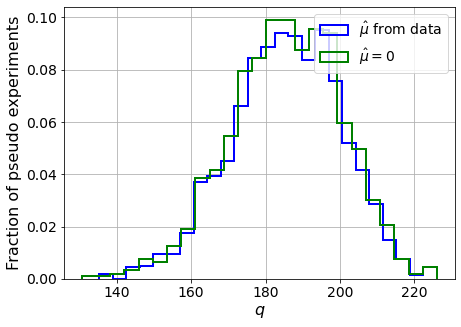

muhat mean:  -0.038230480060961
Z_bins:  13.641718551834499
std Z_bins:  0.5390837422395276
Z_bins mu=0:  13.641718551834499
std Z_bins mu=0:  0.5450569277885278

--------

B_expected:  643
S_expected:  268



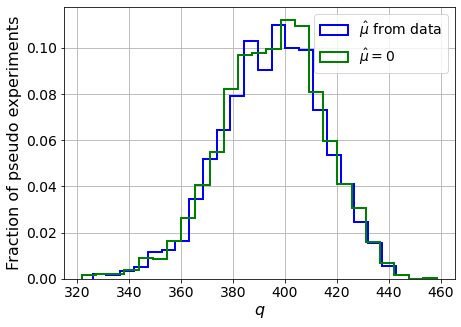

muhat mean:  -0.01810734607309905
Z_bins:  19.90992996620642
std Z_bins:  0.4925238852871633
Z_bins mu=0:  19.90992996620642
std Z_bins mu=0:  0.49701129871998

--------

B_expected:  643
S_expected:  518



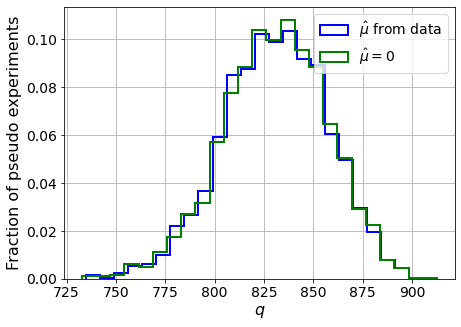

muhat mean:  -0.009883359203223268
Z_bins:  28.83842033389033
std Z_bins:  0.4572171486602162
Z_bins mu=0:  28.83842033389033
std Z_bins mu=0:  0.45943218653262213

--------

B_expected:  643
S_expected:  1001



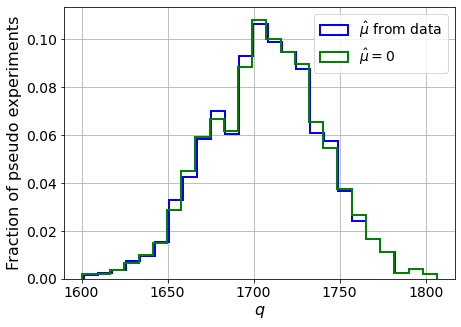

muhat mean:  -0.00480226873301696
Z_bins:  41.32577460302573
std Z_bins:  0.39588564054176567
Z_bins mu=0:  41.32577460302573
std Z_bins mu=0:  0.3970762061400877

--------

B_expected:  643
S_expected:  1932



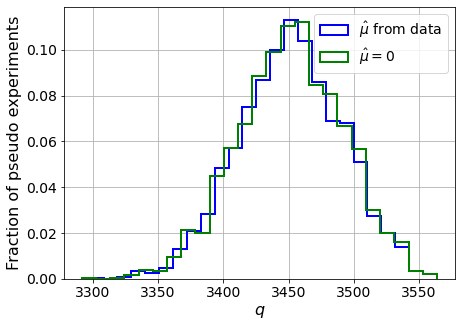

muhat mean:  -0.0027173272429360847
Z_bins:  58.75392744755551
std Z_bins:  0.3409778170328201
Z_bins mu=0:  58.753801226977785
std Z_bins mu=0:  0.3419760280199864

--------

B_expected:  643
S_expected:  3730



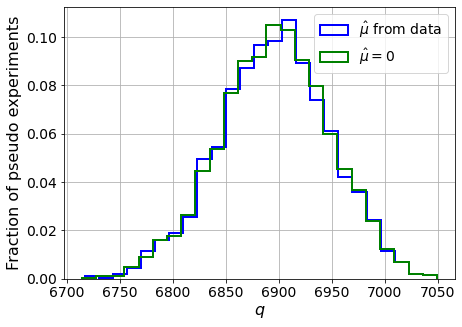

muhat mean:  -0.0013334103174896463
Z_bins:  83.03941392106073
std Z_bins:  0.31278718438780045
Z_bins mu=0:  83.03941392106073
std Z_bins mu=0:  0.3132314145890648

--------

B_expected:  643
S_expected:  7201



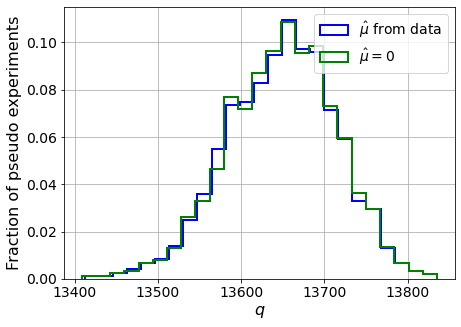

muhat mean:  -0.0007676050936328734
Z_bins:  116.841256810684
std Z_bins:  0.2780340514587826
Z_bins mu=0:  116.841256810684
std Z_bins mu=0:  0.2786060098618653

--------

B_expected:  643
S_expected:  13904



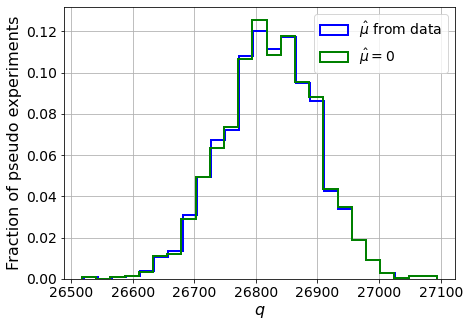

muhat mean:  -0.0003531770003390047
Z_bins:  163.77546464597637
std Z_bins:  0.23314611897651447
Z_bins mu=0:  163.7753395467421
std Z_bins mu=0:  0.23341777179094747

--------


 FINAL RESULT:

[[0.7021369351056608, 0.24937455752283358, -5.533168692633215, 0.7021369351056608, 0.29379915263893164], [1.2787445773879367, 0.3916723834938881, -1.7550098634021087, 1.2787445773879367, 0.44672788900144406], [1.7408835393427657, 0.4616391542041996, -0.991319724955245, 1.7408835393427657, 0.5032371873295122], [2.6684866672511247, 0.5454641402771235, -0.4981180081820455, 2.6684866672511247, 0.5772273827660472], [4.049268086119489, 0.5717147447784743, -0.27056140962743713, 4.049268086119489, 0.5897373581231344], [6.1040429264759455, 0.5892124451319022, -0.13165843009664346, 6.1040429264759455, 0.6028492162161633], [9.229411240156788, 0.5540649495725715, -0.07896430368259899, 9.229411240156788, 0.5614259969202714], [13.641718551834499, 0.5390837422395276, -0.038230480060961, 13.641718551834499, 0.

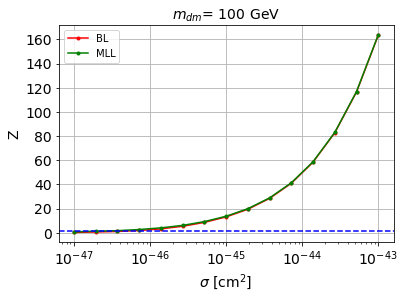


cross_BL_164:  6.358470276266557e-47
cross_BL_164_up:  3.6341967989447164e-47
cross_BL_164_down:  8.96528340561628e-47

cross_MLL_164:  3.4702045862418145e-47
cross_MLL_164_up:  1.859438813727155e-47
cross_MLL_164_down:  4.938387089674498e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


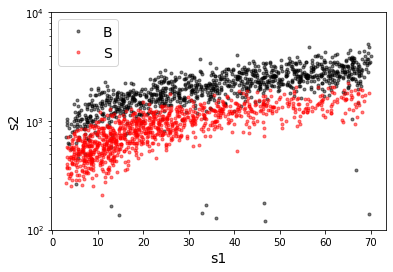

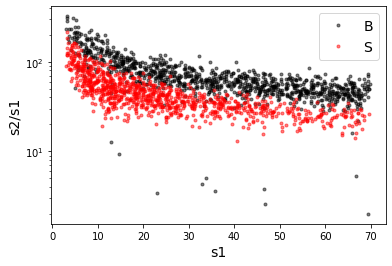

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


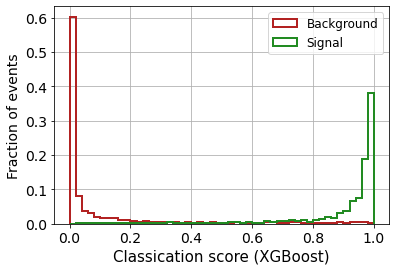


 ROC-AUC =  0.9802802974940688
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


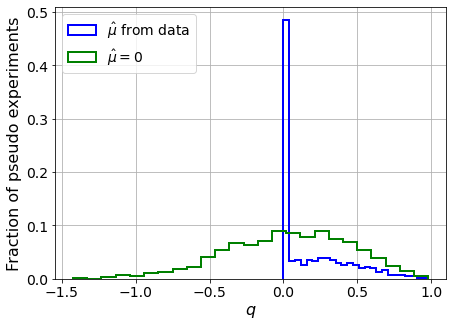

muhat mean:  0.1892425960735022
Z_bins:  0.2415663882509926
std Z_bins:  0.487456597171472
Z_bins mu=0:  0.2415663882509926
std Z_bins mu=0:  0.8694199076021972

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


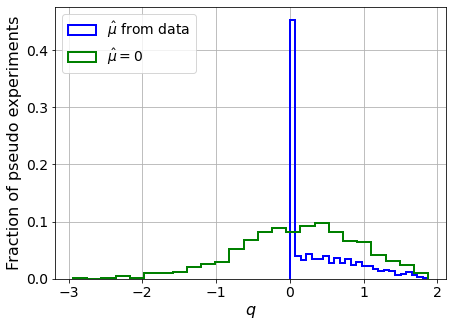

muhat mean:  0.19752811155097277
Z_bins:  0.4107046868465495
std Z_bins:  0.577959860820518
Z_bins mu=0:  0.4081466700924373
std Z_bins mu=0:  0.9916042507658938

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.103


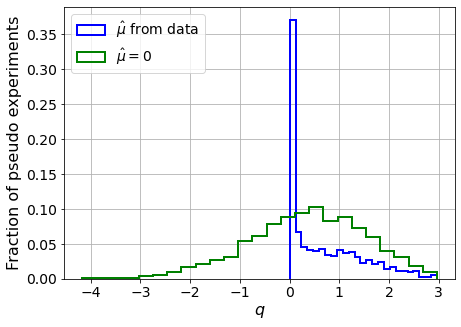

muhat mean:  0.0846843539256967
Z_bins:  0.6354391013549308
std Z_bins:  0.5838548444969905
Z_bins mu=0:  0.635309021332925
std Z_bins mu=0:  0.9180855343088106

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


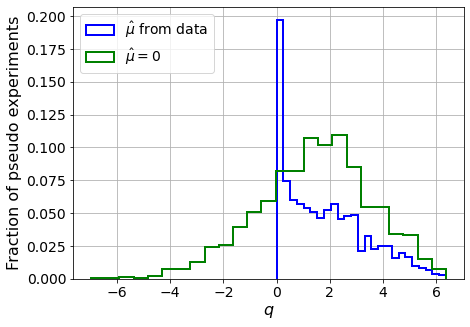

muhat mean:  0.02247367144403188
Z_bins:  1.244723432516102
std Z_bins:  0.6232605363682855
Z_bins mu=0:  1.244723432516102
std Z_bins mu=0:  0.8524123229389691

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


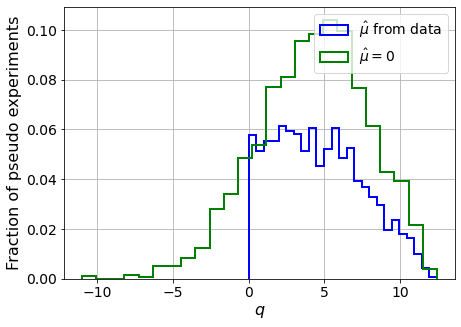

muhat mean:  0.013237298179440268
Z_bins:  2.089170016058278
std Z_bins:  0.6996059502365719
Z_bins mu=0:  2.089170016058278
std Z_bins mu=0:  0.8663635240277425

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


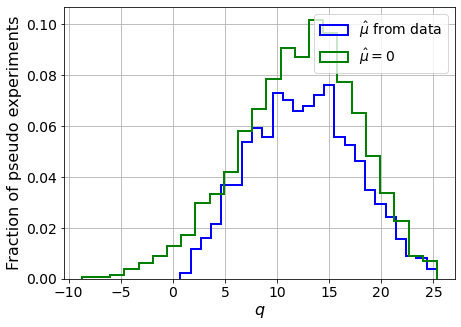

muhat mean:  0.013813933612999546
Z_bins:  3.536788565207599
std Z_bins:  0.6961118383595527
Z_bins mu=0:  3.53678718839591
std Z_bins mu=0:  0.8010544968294339

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


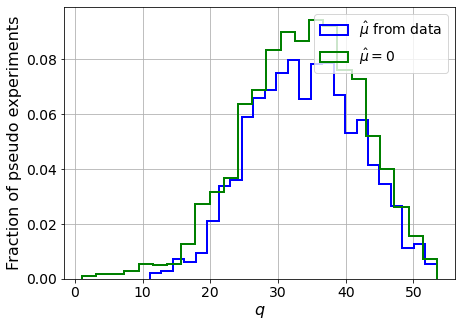

muhat mean:  0.0027247184408802417
Z_bins:  5.835964522802269
std Z_bins:  0.6789871480361342
Z_bins mu=0:  5.835719639529172
std Z_bins mu=0:  0.7402043627051796

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.08


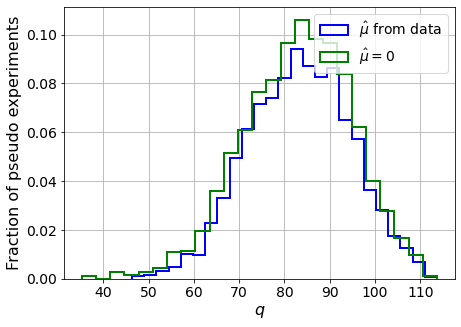

muhat mean:  0.0008638541056108595
Z_bins:  9.13460083072426
std Z_bins:  0.6168777772555621
Z_bins mu=0:  9.133834589170766
std Z_bins mu=0:  0.6544870492756419

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


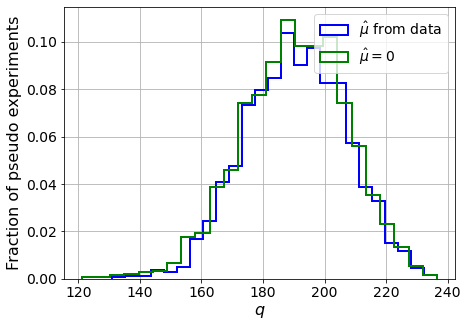

muhat mean:  0.0017942116281106611
Z_bins:  13.816595838123334
std Z_bins:  0.5873896779143859
Z_bins mu=0:  13.816138591791846
std Z_bins mu=0:  0.6145213907858329

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.088


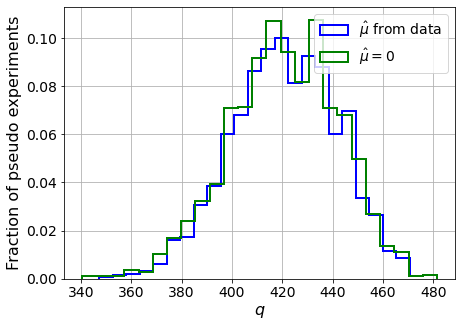

muhat mean:  0.00046520849604011246
Z_bins:  20.5215294441049
std Z_bins:  0.5130464094978042
Z_bins mu=0:  20.521524851002884
std Z_bins mu=0:  0.5294200160429872

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


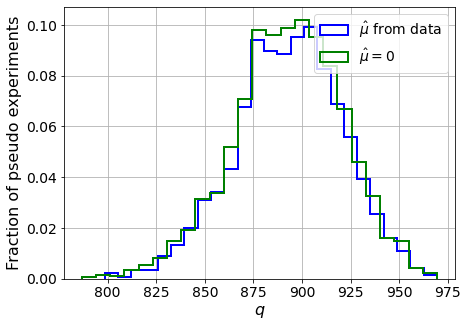

muhat mean:  6.330077493878233e-05
Z_bins:  29.902350244572602
std Z_bins:  0.4605730360158977
Z_bins mu=0:  29.90107700143374
std Z_bins mu=0:  0.47141385413422654

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


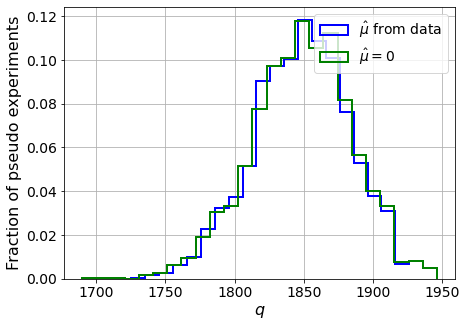

muhat mean:  0.00013194744408421007
Z_bins:  43.01855072877079
std Z_bins:  0.41229173300647437
Z_bins mu=0:  43.01845697566774
std Z_bins mu=0:  0.42011464637325974

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


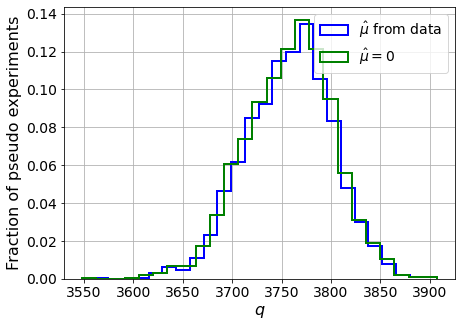

muhat mean:  8.175395494050496e-05
Z_bins:  61.32615101279175
std Z_bins:  0.35848020758743854
Z_bins mu=0:  61.325020164953344
std Z_bins mu=0:  0.36401688087127443

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


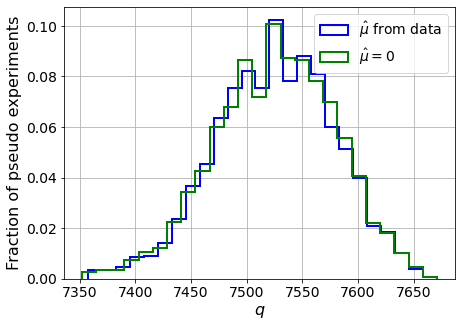

muhat mean:  3.369492532501221e-05
Z_bins:  86.76263296611374
std Z_bins:  0.30691109853801013
Z_bins mu=0:  86.76128149369211
std Z_bins mu=0:  0.31001161444498565

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


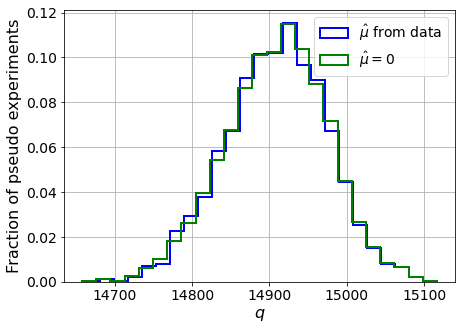

muhat mean:  1.4629520538996713e-05
Z_bins:  122.1170040609509
std Z_bins:  0.2685919096422453
Z_bins mu=0:  122.11572619598745
std Z_bins mu=0:  0.2708372511323849

--------


 FINAL RESULT:

[[0.2415663882509926, 0.487456597171472, 0.1892425960735022, 0.2415663882509926, 0.8694199076021972], [0.4107046868465495, 0.577959860820518, 0.19752811155097277, 0.4081466700924373, 0.9916042507658938], [0.6354391013549308, 0.5838548444969905, 0.0846843539256967, 0.635309021332925, 0.9180855343088106], [1.244723432516102, 0.6232605363682855, 0.02247367144403188, 1.244723432516102, 0.8524123229389691], [2.089170016058278, 0.6996059502365719, 0.013237298179440268, 2.089170016058278, 0.8663635240277425], [3.536788565207599, 0.6961118383595527, 0.013813933612999546, 3.53678718839591, 0.8010544968294339], [5.835964522802269, 0.6789871480361342, 0.0027247184408802417, 5.835719639529172, 0.7402043627051796], [9.13460083072426, 0.6168777772555621, 0.0008638541056108595, 9.133834589170766, 0.654487049275

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 318.78347126 284.48401651 244.86493977 199.61209113
 148.58784014  91.97761531  29.73765385 -37.13538264 -99.99961317]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 290.36313477 267.36564951 238.01308803 202.28707378
 157

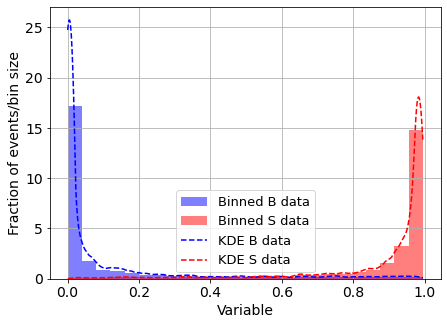

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



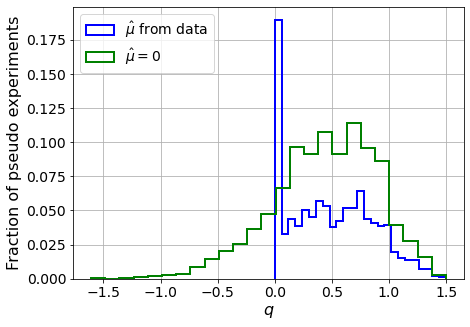

muhat mean:  -5.299000814180076
Z_bins:  0.6844146095642609
std Z_bins:  0.2685771687051204
Z_bins mu=0:  0.6844146095642609
std Z_bins mu=0:  0.3331347382447161

--------

B_expected:  643
S_expected:  2



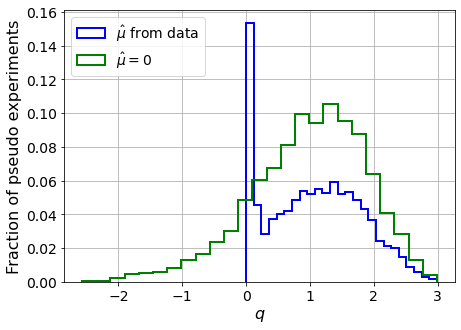

muhat mean:  -2.7156188094289777
Z_bins:  1.0358078186120416
std Z_bins:  0.3535765533796492
Z_bins mu=0:  1.0358078186120416
std Z_bins mu=0:  0.4311372173503646

--------

B_expected:  643
S_expected:  3



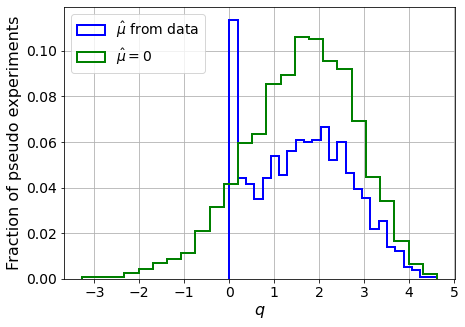

muhat mean:  -1.675169869830073
Z_bins:  1.2959541537741233
std Z_bins:  0.4053032632697421
Z_bins mu=0:  1.2959541537741233
std Z_bins mu=0:  0.4682333223734125

--------

B_expected:  643
S_expected:  6



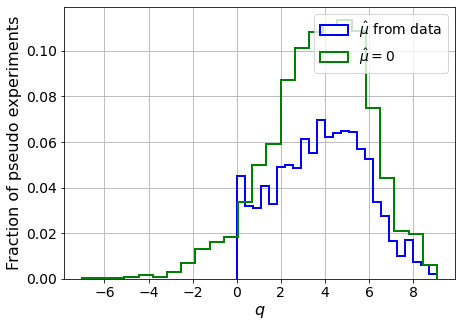

muhat mean:  -0.9027694125645688
Z_bins:  1.9794909397994722
std Z_bins:  0.5093850562319402
Z_bins mu=0:  1.9794909397994722
std Z_bins mu=0:  0.5730480964650468

--------

B_expected:  643
S_expected:  11



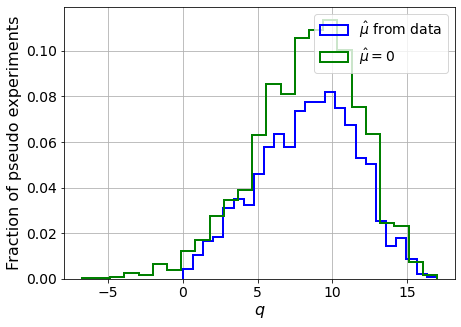

muhat mean:  -0.5270364314085945
Z_bins:  2.937185345450147
std Z_bins:  0.5542236512981054
Z_bins mu=0:  2.937185345450147
std Z_bins mu=0:  0.5954343889480372

--------

B_expected:  643
S_expected:  21



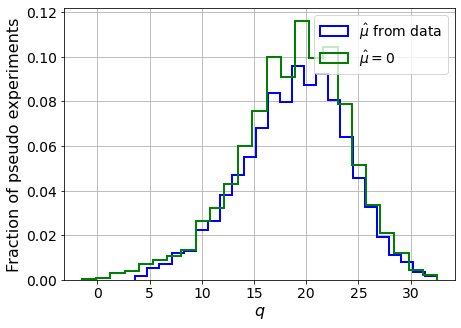

muhat mean:  -0.21936910880896654
Z_bins:  4.374416449024256
std Z_bins:  0.5698200479646411
Z_bins mu=0:  4.374416449024256
std Z_bins mu=0:  0.5959149159133873

--------

B_expected:  643
S_expected:  41



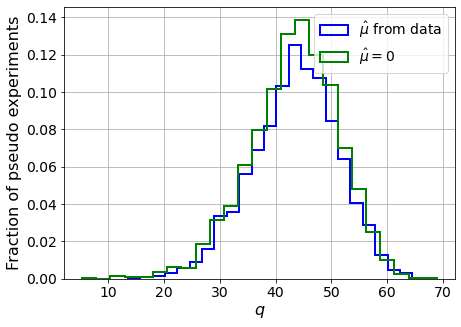

muhat mean:  -0.1394539766184007
Z_bins:  6.615213868419001
std Z_bins:  0.5829165595227772
Z_bins mu=0:  6.615213868419001
std Z_bins mu=0:  0.6033007225073812

--------

B_expected:  643
S_expected:  79



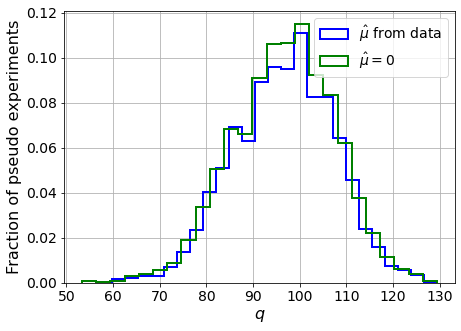

muhat mean:  -0.06521659220668323
Z_bins:  9.850019626886628
std Z_bins:  0.5449422287126854
Z_bins mu=0:  9.849805422068059
std Z_bins mu=0:  0.5554966633965331

--------

B_expected:  643
S_expected:  152



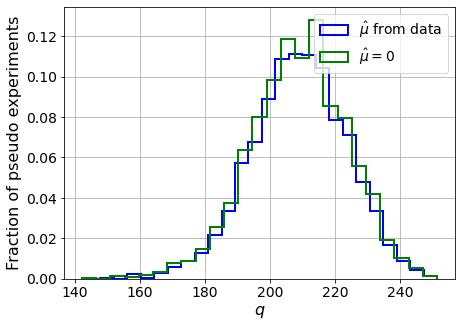

muhat mean:  -0.03460793073787333
Z_bins:  14.455442404886444
std Z_bins:  0.511843511095779
Z_bins mu=0:  14.455086703984893
std Z_bins mu=0:  0.5195497136361317

--------

B_expected:  643
S_expected:  294



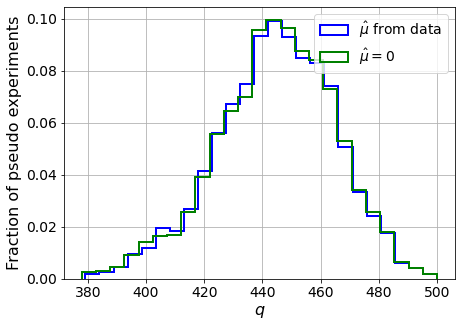

muhat mean:  -0.018016901164974952
Z_bins:  21.110137848023292
std Z_bins:  0.4774601992896978
Z_bins mu=0:  21.110137848023292
std Z_bins mu=0:  0.4826446088745093

--------

B_expected:  643
S_expected:  567



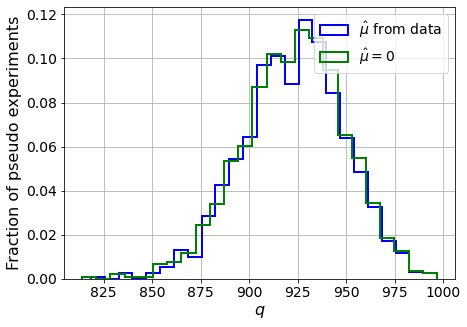

muhat mean:  -0.00898061171823953
Z_bins:  30.412180648385153
std Z_bins:  0.4298415077556249
Z_bins mu=0:  30.412180648385153
std Z_bins mu=0:  0.43314630383290165

--------

B_expected:  643
S_expected:  1094



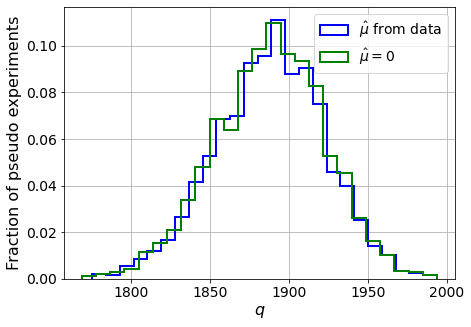

muhat mean:  -0.004946571762900861
Z_bins:  43.46723713681795
std Z_bins:  0.39839597288248185
Z_bins mu=0:  43.46607945871268
std Z_bins mu=0:  0.40026952134592747

--------

B_expected:  643
S_expected:  2113



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


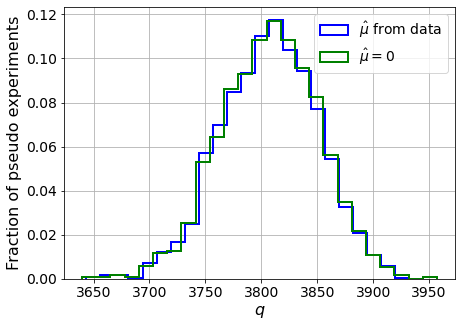

muhat mean:  -0.002747161772132628
Z_bins:  61.71263882530771
std Z_bins:  0.34984558857366527
Z_bins mu=0:  61.71263882530771
std Z_bins mu=0:  0.3511474761575206

--------

B_expected:  643
S_expected:  4079



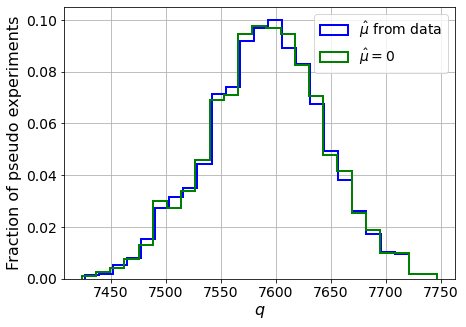

muhat mean:  -0.00123733795108608
Z_bins:  87.13222280324506
std Z_bins:  0.30395156089510095
Z_bins mu=0:  87.13092771816149
std Z_bins mu=0:  0.3046355052057409

--------

B_expected:  643
S_expected:  7876



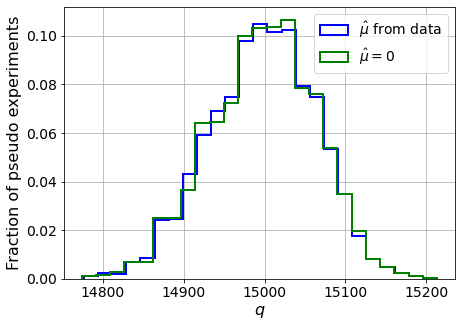

muhat mean:  -0.0006212894955077937
Z_bins:  122.4786797002351
std Z_bins:  0.26722955849108293
Z_bins mu=0:  122.4786797002351
std Z_bins mu=0:  0.2676815455929459

--------


 FINAL RESULT:

[[0.6844146095642609, 0.2685771687051204, -5.299000814180076, 0.6844146095642609, 0.3331347382447161], [1.0358078186120416, 0.3535765533796492, -2.7156188094289777, 1.0358078186120416, 0.4311372173503646], [1.2959541537741233, 0.4053032632697421, -1.675169869830073, 1.2959541537741233, 0.4682333223734125], [1.9794909397994722, 0.5093850562319402, -0.9027694125645688, 1.9794909397994722, 0.5730480964650468], [2.937185345450147, 0.5542236512981054, -0.5270364314085945, 2.937185345450147, 0.5954343889480372], [4.374416449024256, 0.5698200479646411, -0.21936910880896654, 4.374416449024256, 0.5959149159133873], [6.615213868419001, 0.5829165595227772, -0.1394539766184007, 6.615213868419001, 0.6033007225073812], [9.850019626886628, 0.5449422287126854, -0.06521659220668323, 9.849805422068059, 0.555496663

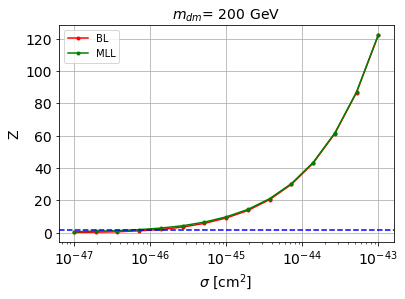


cross_BL_164:  9.792254908911094e-47
cross_BL_164_up:  6.11506786790286e-47
cross_BL_164_down:  1.5565615109864377e-46

cross_MLL_164:  5.699813444998274e-47
cross_MLL_164_up:  3.541661123383952e-47
cross_MLL_164_down:  8.134257793150683e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


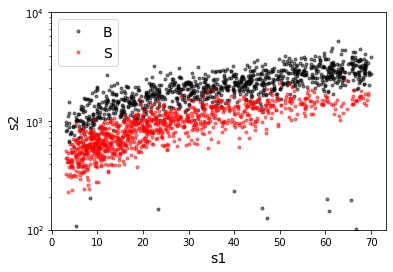

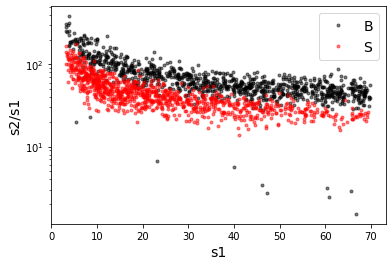

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


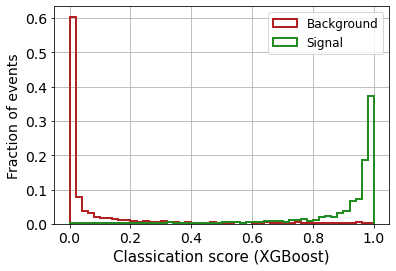


 ROC-AUC =  0.9801016067638035
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


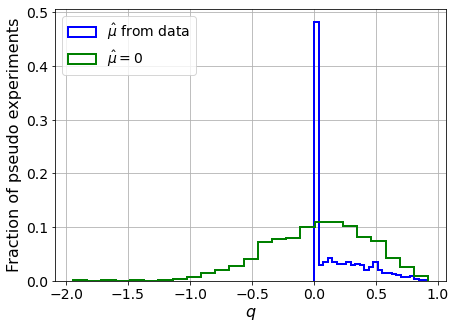

muhat mean:  0.1782894011697518
Z_bins:  0.24508696665013763
std Z_bins:  0.4617443678262641
Z_bins mu=0:  0.24508696665013763
std Z_bins mu=0:  0.8244521367174017

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.103


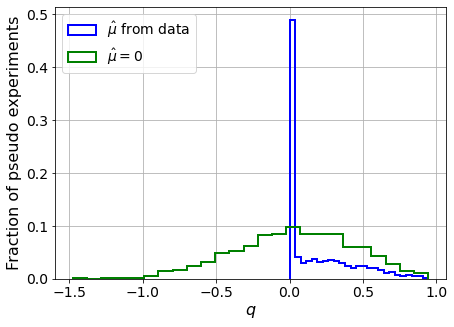

muhat mean:  0.1973664276520338
Z_bins:  0.2137397873718566
std Z_bins:  0.5439608647990024
Z_bins mu=0:  0.2135526768919525
std Z_bins mu=0:  0.9546390817890192

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


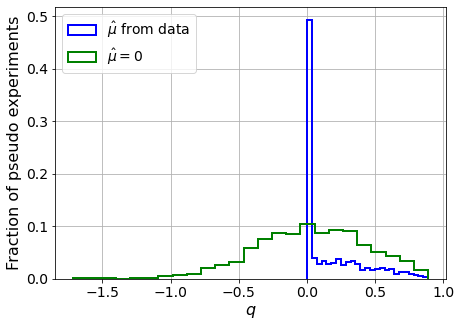

muhat mean:  0.24270360719895617
Z_bins:  0.20765537353683644
std Z_bins:  0.559611135229691
Z_bins mu=0:  0.20719325114638798
std Z_bins mu=0:  0.9957632519357256

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


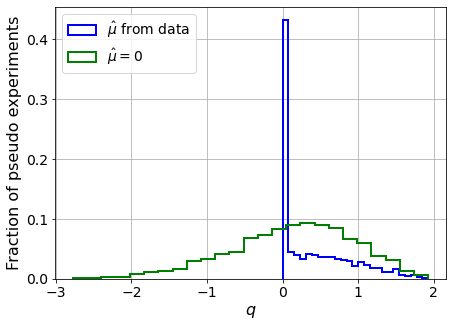

muhat mean:  0.1558159972360595
Z_bins:  0.44230615449971755
std Z_bins:  0.5343567826140463
Z_bins mu=0:  0.44230615449971755
std Z_bins mu=0:  0.9226506229472744

--------

B_expected:  643
S_expected:  5



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


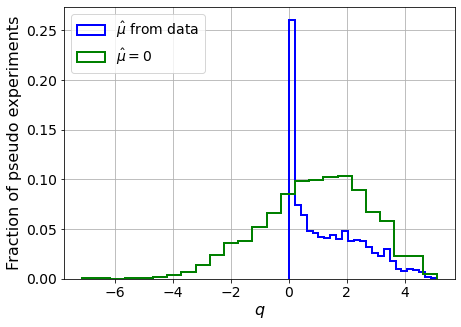

muhat mean:  0.05728896608748483
Z_bins:  1.0320311796456778
std Z_bins:  0.6074461642465491
Z_bins mu=0:  1.0319735997572292
std Z_bins mu=0:  0.8829709951757582

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


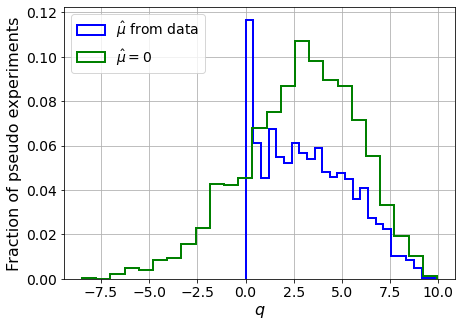

muhat mean:  0.032290102850152
Z_bins:  1.754743188827838
std Z_bins:  0.6487645154870963
Z_bins mu=0:  1.754743188827838
std Z_bins mu=0:  0.8497399947708691

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


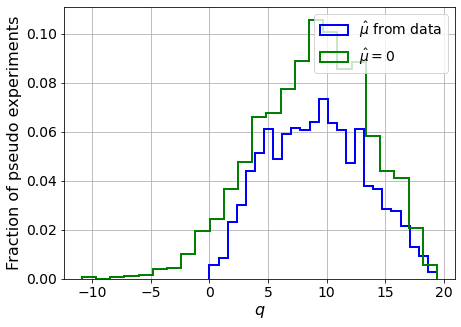

muhat mean:  0.0014963388885720777
Z_bins:  3.018799713478704
std Z_bins:  0.6821854688797283
Z_bins mu=0:  3.018799713478704
std Z_bins mu=0:  0.7888071594015301

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1105


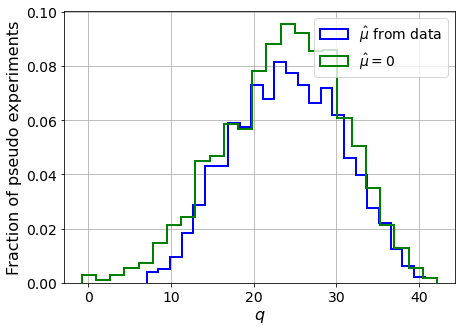

muhat mean:  0.01416262469929817
Z_bins:  4.905771347602042
std Z_bins:  0.6681423158034177
Z_bins mu=0:  4.904530264237531
std Z_bins mu=0:  0.7421878376046789

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


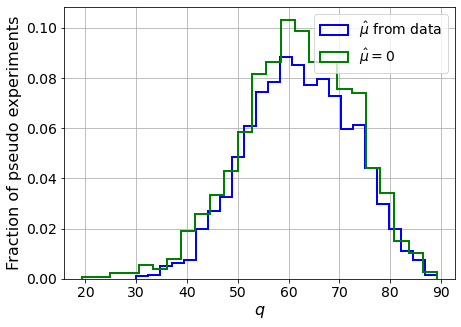

muhat mean:  0.003400005185830543
Z_bins:  7.878680159116606
std Z_bins:  0.6536548475887793
Z_bins mu=0:  7.8778743350779745
std Z_bins mu=0:  0.7014120380921818

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


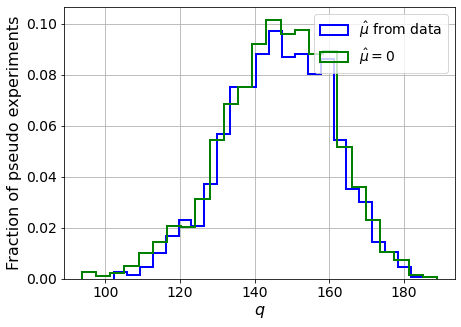

muhat mean:  0.0032839317953392926
Z_bins:  12.124379123812789
std Z_bins:  0.5808939802381805
Z_bins mu=0:  12.124263022721532
std Z_bins mu=0:  0.6129306123979649

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


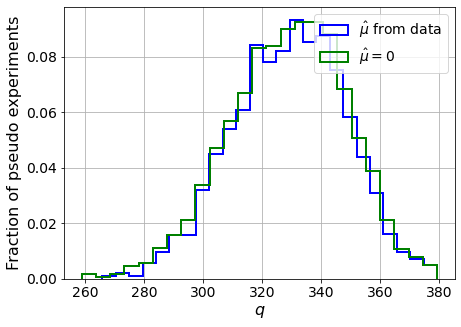

muhat mean:  0.000658936514652116
Z_bins:  18.16617298341268
std Z_bins:  0.5259689072093973
Z_bins mu=0:  18.164069820354904
std Z_bins mu=0:  0.5455418480619804

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


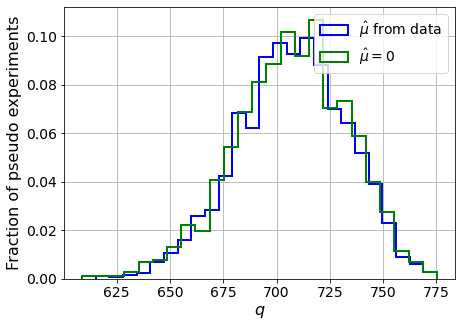

muhat mean:  0.000628279723028104
Z_bins:  26.607878887409054
std Z_bins:  0.48316496801960007
Z_bins mu=0:  26.606142896325004
std Z_bins mu=0:  0.49697940719897976

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


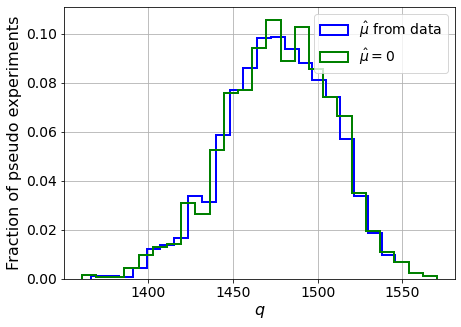

muhat mean:  0.00022419584402136265
Z_bins:  38.43926899864029
std Z_bins:  0.4107400295779125
Z_bins mu=0:  38.43706744764088
std Z_bins mu=0:  0.4190659675379618

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1095


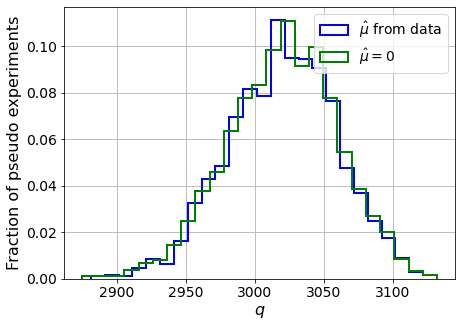

muhat mean:  3.5599314105252695e-05
Z_bins:  54.96795827824381
std Z_bins:  0.3561340506345685
Z_bins mu=0:  54.96712574454163
std Z_bins mu=0:  0.3613175331284869

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


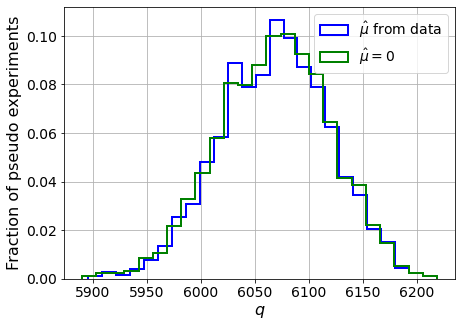

muhat mean:  9.553035791969454e-05
Z_bins:  77.91185144052491
std Z_bins:  0.32536333970820464
Z_bins mu=0:  77.91088934273976
std Z_bins mu=0:  0.3289662877605701

--------


 FINAL RESULT:

[[0.24508696665013763, 0.4617443678262641, 0.1782894011697518, 0.24508696665013763, 0.8244521367174017], [0.2137397873718566, 0.5439608647990024, 0.1973664276520338, 0.2135526768919525, 0.9546390817890192], [0.20765537353683644, 0.559611135229691, 0.24270360719895617, 0.20719325114638798, 0.9957632519357256], [0.44230615449971755, 0.5343567826140463, 0.1558159972360595, 0.44230615449971755, 0.9226506229472744], [1.0320311796456778, 0.6074461642465491, 0.05728896608748483, 1.0319735997572292, 0.8829709951757582], [1.754743188827838, 0.6487645154870963, 0.032290102850152, 1.754743188827838, 0.8497399947708691], [3.018799713478704, 0.6821854688797283, 0.0014963388885720777, 3.018799713478704, 0.7888071594015301], [4.905771347602042, 0.6681423158034177, 0.01416262469929817, 4.904530264237531, 0.742187

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 291.6787531  249.99975288 202.69151941
 149.63540925  93.0328596   30.75327918 -34.33573923 -98.73957882]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 252.62533229 224.25050156 189.8080721
 148.

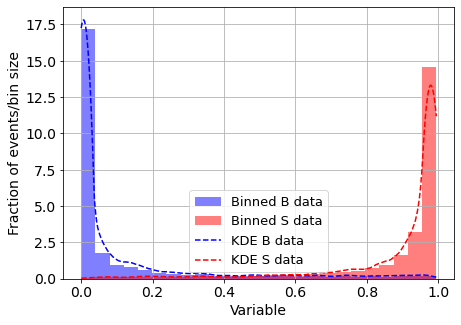

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



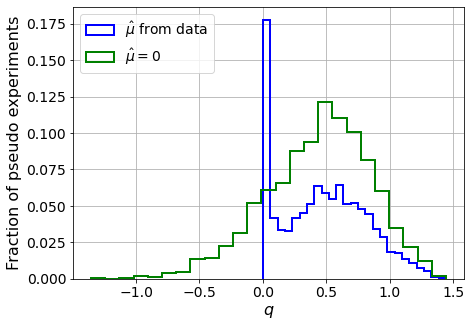

muhat mean:  -4.873141794610628
Z_bins:  0.6911993372454152
std Z_bins:  0.24767101297702643
Z_bins mu=0:  0.6911993372454152
std Z_bins mu=0:  0.2984236128927298

--------

B_expected:  643
S_expected:  1



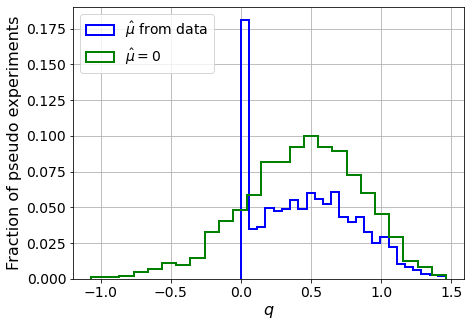

muhat mean:  -5.034828554412951
Z_bins:  0.6820773477369624
std Z_bins:  0.2554218487110702
Z_bins mu=0:  0.6820773477369624
std Z_bins mu=0:  0.3040082671390749

--------

B_expected:  643
S_expected:  1



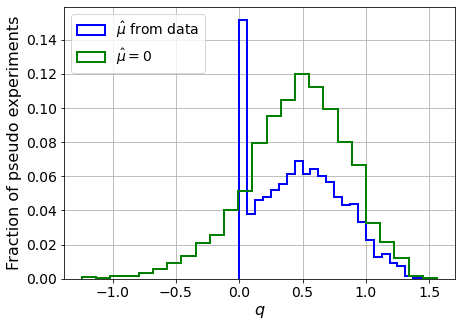

muhat mean:  -4.8755991762565465
Z_bins:  0.69623424666542
std Z_bins:  0.24122669099414495
Z_bins mu=0:  0.69623424666542
std Z_bins mu=0:  0.2873115616399103

--------

B_expected:  643
S_expected:  2



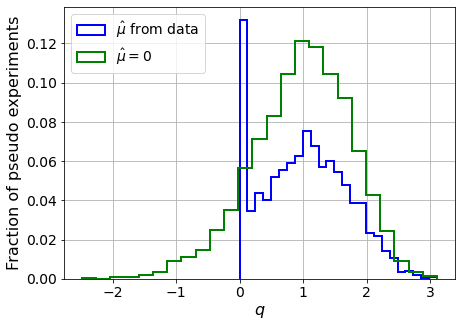

muhat mean:  -2.5567659928224313
Z_bins:  1.015165943495316
std Z_bins:  0.33055315605550883
Z_bins mu=0:  1.015165943495316
std Z_bins mu=0:  0.3826183426629069

--------

B_expected:  643
S_expected:  5



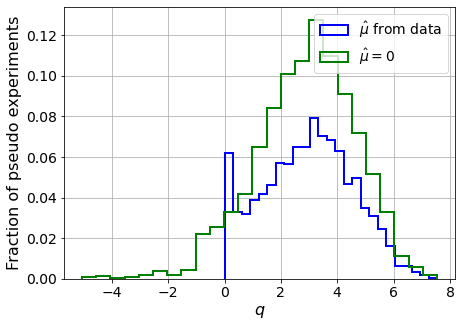

muhat mean:  -0.9378738060696111
Z_bins:  1.7379818560552052
std Z_bins:  0.45676893306076705
Z_bins mu=0:  1.7379818560552052
std Z_bins mu=0:  0.5072862272324569

--------

B_expected:  643
S_expected:  9



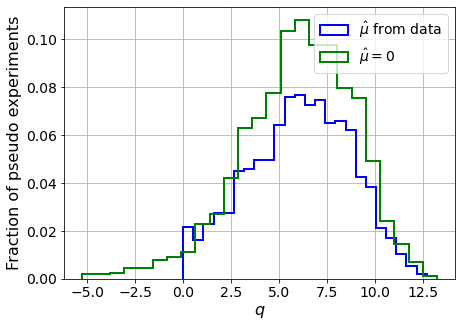

muhat mean:  -0.5573422239720747
Z_bins:  2.4908216987116147
std Z_bins:  0.5364087154240468
Z_bins mu=0:  2.4908216987116147
std Z_bins mu=0:  0.583900846358748

--------

B_expected:  643
S_expected:  17



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


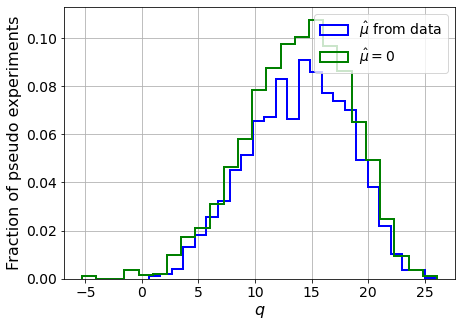

muhat mean:  -0.2830683555110482
Z_bins:  3.759533788601875
std Z_bins:  0.5878667738279079
Z_bins mu=0:  3.759533788601875
std Z_bins mu=0:  0.6118027104588265

--------

B_expected:  643
S_expected:  33



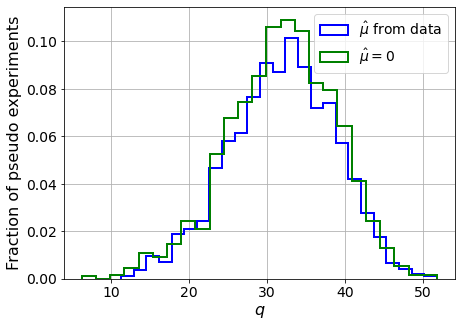

muhat mean:  -0.1556586268890083
Z_bins:  5.677168536408647
std Z_bins:  0.5915725640667059
Z_bins mu=0:  5.677168536408647
std Z_bins mu=0:  0.6070461767299594

--------

B_expected:  643
S_expected:  64



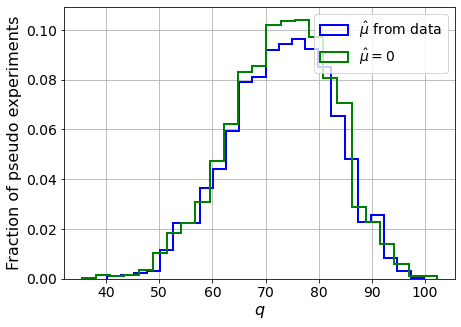

muhat mean:  -0.07819588701824667
Z_bins:  8.583545044309602
std Z_bins:  0.5643725829616114
Z_bins mu=0:  8.583545044309602
std Z_bins mu=0:  0.5728396534787332

--------

B_expected:  643
S_expected:  124



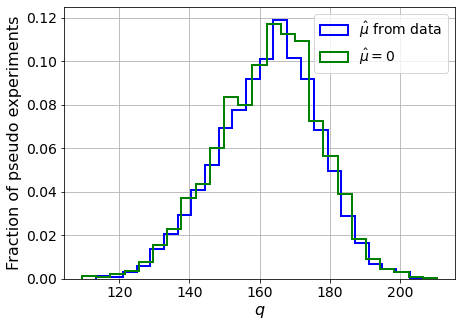

muhat mean:  -0.04010231018416201
Z_bins:  12.783263730227045
std Z_bins:  0.5617424313743772
Z_bins mu=0:  12.783263730227045
std Z_bins mu=0:  0.5686204959059799

--------

B_expected:  643
S_expected:  239



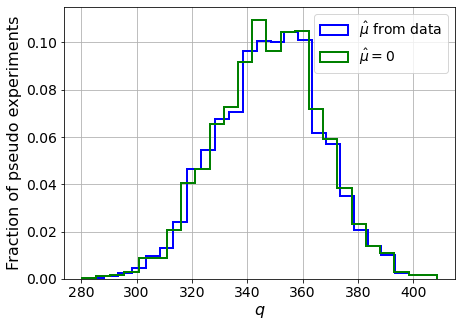

muhat mean:  -0.019489964264911914
Z_bins:  18.678714935610493
std Z_bins:  0.5031235919690885
Z_bins mu=0:  18.678714935610493
std Z_bins mu=0:  0.5066407781480968

--------

B_expected:  643
S_expected:  462



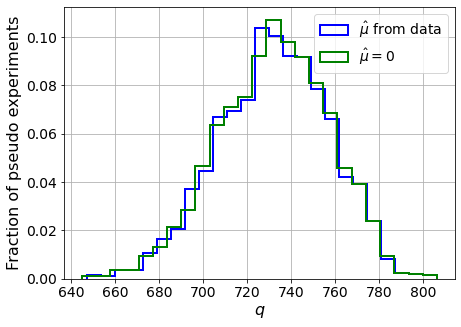

muhat mean:  -0.00984784062470673
Z_bins:  27.075214166774877
std Z_bins:  0.4612191837645223
Z_bins mu=0:  27.07494094355241
std Z_bins mu=0:  0.4640444139180821

--------

B_expected:  643
S_expected:  892



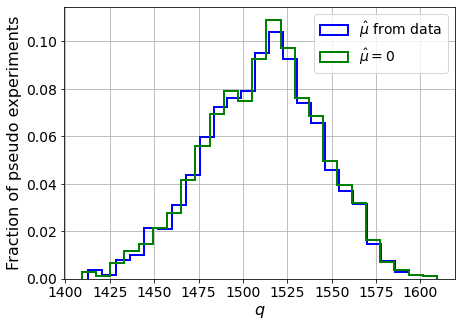

muhat mean:  -0.005719526617560612
Z_bins:  38.90153094203467
std Z_bins:  0.4189259887543183
Z_bins mu=0:  38.90105115386142
std Z_bins mu=0:  0.42059626305595277

--------

B_expected:  643
S_expected:  1723



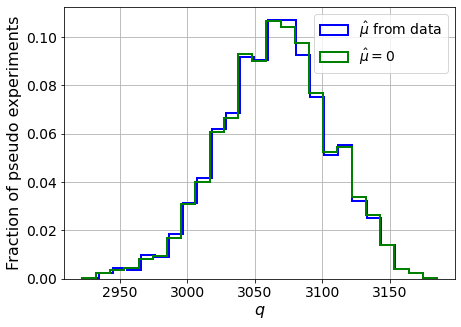

muhat mean:  -0.0030951475797320344
Z_bins:  55.36821356579946
std Z_bins:  0.3657821235751287
Z_bins mu=0:  55.36821356579946
std Z_bins mu=0:  0.3669507229189625

--------

B_expected:  643
S_expected:  3326



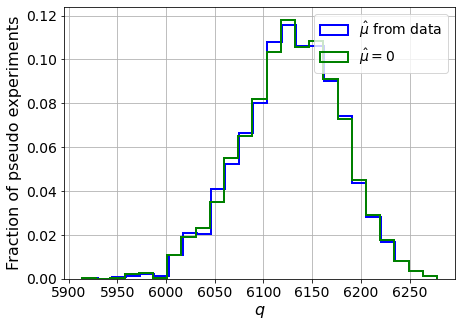

muhat mean:  -0.0013688825376280175
Z_bins:  78.29604207807851
std Z_bins:  0.32600808622916116
Z_bins mu=0:  78.29586382742879
std Z_bins mu=0:  0.326761158755092

--------


 FINAL RESULT:

[[0.6911993372454152, 0.24767101297702643, -4.873141794610628, 0.6911993372454152, 0.2984236128927298], [0.6820773477369624, 0.2554218487110702, -5.034828554412951, 0.6820773477369624, 0.3040082671390749], [0.69623424666542, 0.24122669099414495, -4.8755991762565465, 0.69623424666542, 0.2873115616399103], [1.015165943495316, 0.33055315605550883, -2.5567659928224313, 1.015165943495316, 0.3826183426629069], [1.7379818560552052, 0.45676893306076705, -0.9378738060696111, 1.7379818560552052, 0.5072862272324569], [2.4908216987116147, 0.5364087154240468, -0.5573422239720747, 2.4908216987116147, 0.583900846358748], [3.759533788601875, 0.5878667738279079, -0.2830683555110482, 3.759533788601875, 0.6118027104588265], [5.677168536408647, 0.5915725640667059, -0.1556586268890083, 5.677168536408647, 0.60704617672

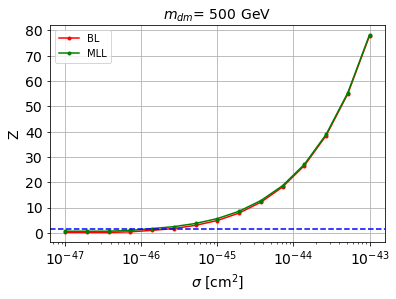


cross_BL_164:  2.5271793421313795e-46
cross_BL_164_up:  1.3901209664541859e-46
cross_BL_164_down:  3.5690623045755024e-46

cross_MLL_164:  1.2754737448475417e-46
cross_MLL_164_up:  9.040108055941417e-47
cross_MLL_164_down:  1.9730165944967095e-46

#########################



In [25]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [26]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.3561537958760675e-45, 8.259361030612173e-47, 4.153177487206308e-47, 4.1210549777386377e-47, 6.358470276266557e-47, 9.792254908911094e-47, 2.5271793421313795e-46]
[8.439773859334726e-46, 4.943219309711379e-47, 2.555675851657836e-47, 2.28714407689345e-47, 3.6341967989447164e-47, 6.11506786790286e-47, 1.3901209664541859e-46]
[2.1190790201657707e-45, 1.2838791570418493e-46, 6.701960047926988e-47, 6.448702887227158e-47, 8.96528340561628e-47, 1.5565615109864377e-46, 3.5690623045755024e-46]
[7.562086194599358e-46, 5.058681702189015e-47, 2.7134719910367677e-47, 2.2636382417022025e-47, 3.4702045862418145e-47, 5.699813444998274e-47, 1.2754737448475417e-46]
[5.348541436772221e-46, 3.445756119822193e-47, 1.8731453017259095e-47, 1.522954126198335e-47, 1.859438813727155e-47, 3.541661123383952e-47, 9.040108055941417e-47]
[1.1137951202614699e-45, 7.815071149216144e-47, 3.723465356409178e-47, 3.7410993017417834e-47, 4.938387089674498e-47, 8.134257793150683e-47, 1.9730165944967095e-46]


In [27]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [28]:
cross_cs1cs2_general_m4 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m4_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m4_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m4_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m4_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m4_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

#### Train with m_it = 5


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


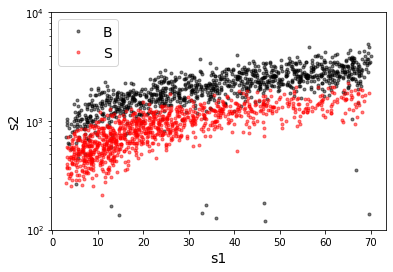

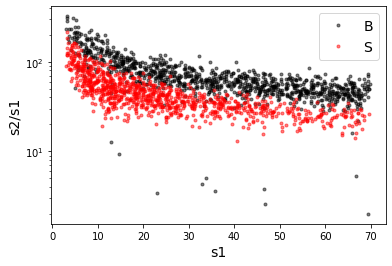

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

[0]	validation_0-logloss:0.68560	validation_1-logloss:0.68566
[1]	validation_0-logloss:0.67821	validation_1-logloss:0.67830
[2]	validation_0-logloss:0.67096	validation_1-logloss:0.67112
[3]	validation_0-logloss:0.66384	validation_1-logloss:0.66405
[4]	validation_0-logloss:0.65687	validation_1-logloss:0.65714
[5]	validation_0-logloss:0.65002	validation_1-logloss:0.65034
[6]	validation_0-logloss:0.64331	validation_1-logloss:0.64367
[7]	validation_0-logloss:0.63671	validation_1-logloss:0.63712
[8]	validation_0-logloss:0.63024	validation_1-logloss:0.63072


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[9]	validation_0-logloss:0.62389	validation_1-logloss:0.62438
[10]	validation_0-logloss:0.61766	validation_1-logloss:0.61820
[11]	validation_0-logloss:0.61154	validation_1-logloss:0.61214
[12]	validation_0-logloss:0.60552	validation_1-logloss:0.60615
[13]	validation_0-logloss:0.59960	validation_1-logloss:0.60029
[14]	validation_0-logloss:0.59380	validation_1-logloss:0.59453
[15]	validation_0-logloss:0.58808	validation_1-logloss:0.58884
[16]	validation_0-logloss:0.58248	validation_1-logloss:0.58328
[17]	validation_0-logloss:0.57695	validation_1-logloss:0.57777
[18]	validation_0-logloss:0.57159	validation_1-logloss:0.57245
[19]	validation_0-logloss:0.56627	validation_1-logloss:0.56714
[20]	validation_0-logloss:0.56102	validation_1-logloss:0.56193
[21]	validation_0-logloss:0.55588	validation_1-logloss:0.55682
[22]	validation_0-logloss:0.55080	validation_1-logloss:0.55177
[23]	validation_0-logloss:0.54581	validation_1-logloss:0.54681
[24]	validation_0-logloss:0.54096	validation_1-logloss:0

[139]	validation_0-logloss:0.26676	validation_1-logloss:0.27010
[140]	validation_0-logloss:0.26573	validation_1-logloss:0.26910
[141]	validation_0-logloss:0.26469	validation_1-logloss:0.26810
[142]	validation_0-logloss:0.26368	validation_1-logloss:0.26711
[143]	validation_0-logloss:0.26269	validation_1-logloss:0.26611
[144]	validation_0-logloss:0.26171	validation_1-logloss:0.26515
[145]	validation_0-logloss:0.26074	validation_1-logloss:0.26420
[146]	validation_0-logloss:0.25976	validation_1-logloss:0.26326
[147]	validation_0-logloss:0.25880	validation_1-logloss:0.26233
[148]	validation_0-logloss:0.25785	validation_1-logloss:0.26141
[149]	validation_0-logloss:0.25693	validation_1-logloss:0.26050
[150]	validation_0-logloss:0.25601	validation_1-logloss:0.25962
[151]	validation_0-logloss:0.25510	validation_1-logloss:0.25873
[152]	validation_0-logloss:0.25420	validation_1-logloss:0.25784
[153]	validation_0-logloss:0.25332	validation_1-logloss:0.25698
[154]	validation_0-logloss:0.25244	valid

[268]	validation_0-logloss:0.19719	validation_1-logloss:0.20272
[269]	validation_0-logloss:0.19696	validation_1-logloss:0.20250
[270]	validation_0-logloss:0.19672	validation_1-logloss:0.20227
[271]	validation_0-logloss:0.19648	validation_1-logloss:0.20204
[272]	validation_0-logloss:0.19625	validation_1-logloss:0.20182
[273]	validation_0-logloss:0.19602	validation_1-logloss:0.20160
[274]	validation_0-logloss:0.19580	validation_1-logloss:0.20139
[275]	validation_0-logloss:0.19558	validation_1-logloss:0.20118
[276]	validation_0-logloss:0.19537	validation_1-logloss:0.20097
[277]	validation_0-logloss:0.19515	validation_1-logloss:0.20076
[278]	validation_0-logloss:0.19494	validation_1-logloss:0.20056
[279]	validation_0-logloss:0.19473	validation_1-logloss:0.20036
[280]	validation_0-logloss:0.19451	validation_1-logloss:0.20016
[281]	validation_0-logloss:0.19431	validation_1-logloss:0.19996
[282]	validation_0-logloss:0.19411	validation_1-logloss:0.19976
[283]	validation_0-logloss:0.19390	valid

[397]	validation_0-logloss:0.18045	validation_1-logloss:0.18696
[398]	validation_0-logloss:0.18039	validation_1-logloss:0.18689
[399]	validation_0-logloss:0.18032	validation_1-logloss:0.18683
[400]	validation_0-logloss:0.18025	validation_1-logloss:0.18677
[401]	validation_0-logloss:0.18019	validation_1-logloss:0.18672
[402]	validation_0-logloss:0.18013	validation_1-logloss:0.18666
[403]	validation_0-logloss:0.18006	validation_1-logloss:0.18660
[404]	validation_0-logloss:0.18000	validation_1-logloss:0.18655
[405]	validation_0-logloss:0.17994	validation_1-logloss:0.18650
[406]	validation_0-logloss:0.17988	validation_1-logloss:0.18646
[407]	validation_0-logloss:0.17982	validation_1-logloss:0.18640
[408]	validation_0-logloss:0.17976	validation_1-logloss:0.18636
[409]	validation_0-logloss:0.17971	validation_1-logloss:0.18632
[410]	validation_0-logloss:0.17965	validation_1-logloss:0.18627
[411]	validation_0-logloss:0.17959	validation_1-logloss:0.18622
[412]	validation_0-logloss:0.17954	valid

[526]	validation_0-logloss:0.17563	validation_1-logloss:0.18310
[527]	validation_0-logloss:0.17560	validation_1-logloss:0.18308
[528]	validation_0-logloss:0.17558	validation_1-logloss:0.18307
[529]	validation_0-logloss:0.17557	validation_1-logloss:0.18306
[530]	validation_0-logloss:0.17555	validation_1-logloss:0.18305
[531]	validation_0-logloss:0.17553	validation_1-logloss:0.18304
[532]	validation_0-logloss:0.17551	validation_1-logloss:0.18302
[533]	validation_0-logloss:0.17549	validation_1-logloss:0.18301
[534]	validation_0-logloss:0.17548	validation_1-logloss:0.18300
[535]	validation_0-logloss:0.17546	validation_1-logloss:0.18299
[536]	validation_0-logloss:0.17545	validation_1-logloss:0.18298
[537]	validation_0-logloss:0.17543	validation_1-logloss:0.18298
[538]	validation_0-logloss:0.17541	validation_1-logloss:0.18296
[539]	validation_0-logloss:0.17540	validation_1-logloss:0.18296
[540]	validation_0-logloss:0.17538	validation_1-logloss:0.18295
[541]	validation_0-logloss:0.17537	valid

[655]	validation_0-logloss:0.17381	validation_1-logloss:0.18228
[656]	validation_0-logloss:0.17380	validation_1-logloss:0.18227
[657]	validation_0-logloss:0.17379	validation_1-logloss:0.18227
[658]	validation_0-logloss:0.17378	validation_1-logloss:0.18226
[659]	validation_0-logloss:0.17377	validation_1-logloss:0.18226
[660]	validation_0-logloss:0.17375	validation_1-logloss:0.18226
[661]	validation_0-logloss:0.17374	validation_1-logloss:0.18225
[662]	validation_0-logloss:0.17373	validation_1-logloss:0.18225
[663]	validation_0-logloss:0.17372	validation_1-logloss:0.18225
[664]	validation_0-logloss:0.17371	validation_1-logloss:0.18225
[665]	validation_0-logloss:0.17370	validation_1-logloss:0.18225
[666]	validation_0-logloss:0.17369	validation_1-logloss:0.18224
[667]	validation_0-logloss:0.17368	validation_1-logloss:0.18225
[668]	validation_0-logloss:0.17367	validation_1-logloss:0.18224
[669]	validation_0-logloss:0.17366	validation_1-logloss:0.18225
[670]	validation_0-logloss:0.17365	valid

[784]	validation_0-logloss:0.17258	validation_1-logloss:0.18213
[785]	validation_0-logloss:0.17257	validation_1-logloss:0.18213
[786]	validation_0-logloss:0.17256	validation_1-logloss:0.18213
[787]	validation_0-logloss:0.17255	validation_1-logloss:0.18213
[788]	validation_0-logloss:0.17254	validation_1-logloss:0.18213
[789]	validation_0-logloss:0.17253	validation_1-logloss:0.18213
[790]	validation_0-logloss:0.17251	validation_1-logloss:0.18212
[791]	validation_0-logloss:0.17250	validation_1-logloss:0.18212
[792]	validation_0-logloss:0.17249	validation_1-logloss:0.18212
[793]	validation_0-logloss:0.17247	validation_1-logloss:0.18211
[794]	validation_0-logloss:0.17246	validation_1-logloss:0.18211
[795]	validation_0-logloss:0.17244	validation_1-logloss:0.18212
[796]	validation_0-logloss:0.17243	validation_1-logloss:0.18212
[797]	validation_0-logloss:0.17241	validation_1-logloss:0.18211
[798]	validation_0-logloss:0.17240	validation_1-logloss:0.18211
[799]	validation_0-logloss:0.17239	valid

[913]	validation_0-logloss:0.17116	validation_1-logloss:0.18204
[914]	validation_0-logloss:0.17114	validation_1-logloss:0.18205
[915]	validation_0-logloss:0.17113	validation_1-logloss:0.18205
[916]	validation_0-logloss:0.17113	validation_1-logloss:0.18205
[917]	validation_0-logloss:0.17111	validation_1-logloss:0.18205
[918]	validation_0-logloss:0.17109	validation_1-logloss:0.18204
[919]	validation_0-logloss:0.17108	validation_1-logloss:0.18205
[920]	validation_0-logloss:0.17107	validation_1-logloss:0.18205
[921]	validation_0-logloss:0.17106	validation_1-logloss:0.18205
[922]	validation_0-logloss:0.17105	validation_1-logloss:0.18205
[923]	validation_0-logloss:0.17103	validation_1-logloss:0.18205
[924]	validation_0-logloss:0.17102	validation_1-logloss:0.18204
[925]	validation_0-logloss:0.17100	validation_1-logloss:0.18204
[926]	validation_0-logloss:0.17100	validation_1-logloss:0.18205
[927]	validation_0-logloss:0.17098	validation_1-logloss:0.18205
[928]	validation_0-logloss:0.17097	valid

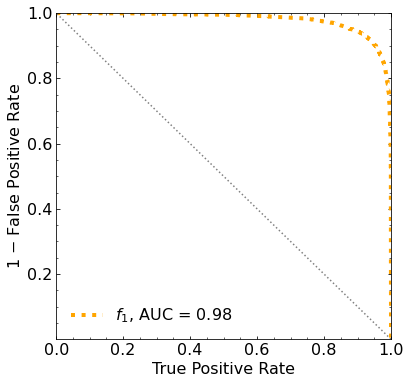

In [29]:
m_it = 5


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


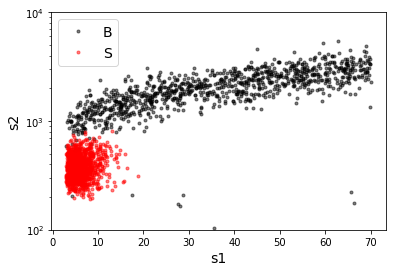

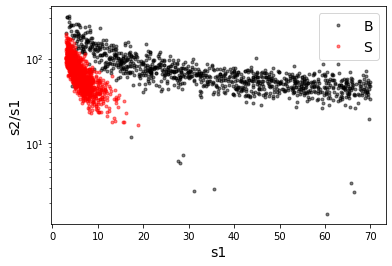

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


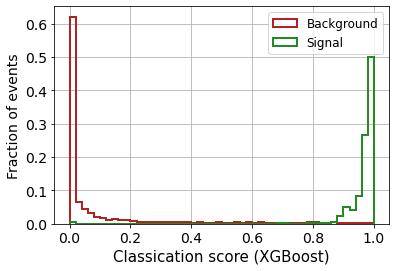


 ROC-AUC =  0.9916823293773637
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1355


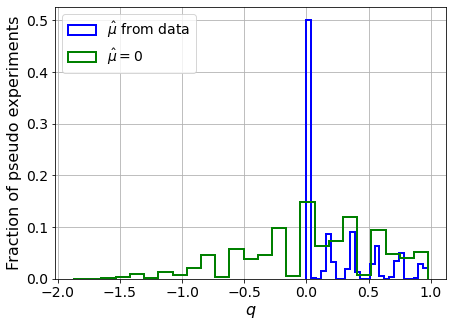

muhat mean:  0.23377522407137155
Z_bins:  0.19596638615785553
std Z_bins:  0.7571756502487366
Z_bins mu=0:  0.16568873630450956
std Z_bins mu=0:  1.6219279191225682

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1205


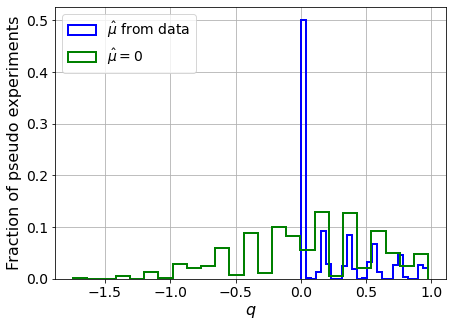

muhat mean:  0.21307600187758746
Z_bins:  0.19610840970066176
std Z_bins:  0.7422443917362669
Z_bins mu=0:  0.1659345496100005
std Z_bins mu=0:  1.5584985449532733

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


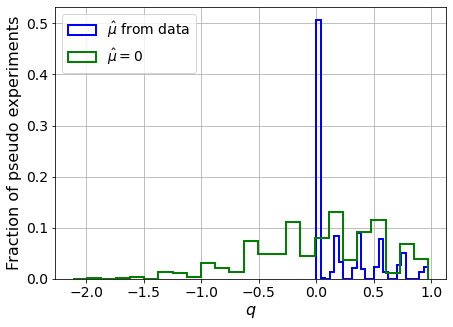

muhat mean:  0.35572172257773427
Z_bins:  0.1795819298908257
std Z_bins:  0.7960921591254465
Z_bins mu=0:  0.13310244623045356
std Z_bins mu=0:  2.0268376348259567

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.122


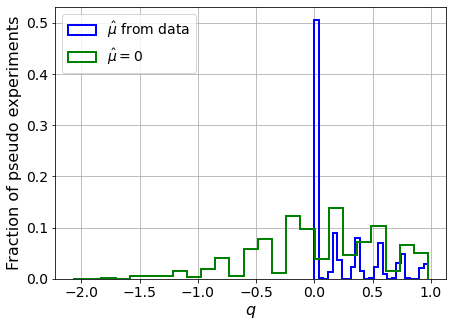

muhat mean:  0.25117013911977587
Z_bins:  0.18505579177001288
std Z_bins:  0.7974040392410777
Z_bins mu=0:  0.14479080176129996
std Z_bins mu=0:  1.8459254813505492

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1205


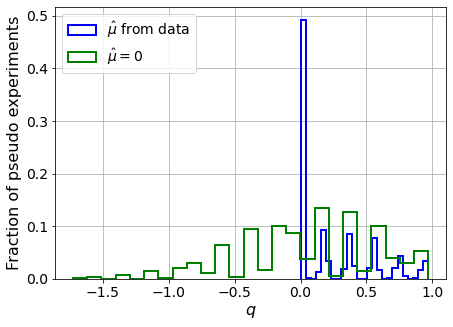

muhat mean:  0.1943434461273691
Z_bins:  0.38211757925462414
std Z_bins:  0.38318172362284825
Z_bins mu=0:  0.38211757925462414
std Z_bins mu=0:  0.6815057306482433

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1225


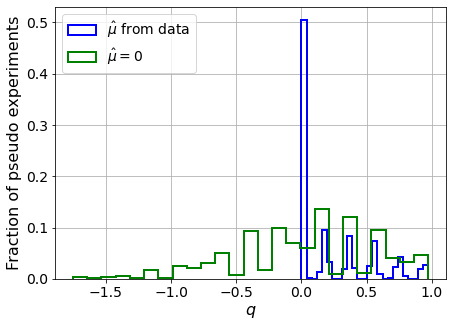

muhat mean:  0.3299429007350257
Z_bins:  0.1835162127939324
std Z_bins:  0.7841872707300988
Z_bins mu=0:  0.14160270358052318
std Z_bins mu=0:  1.8749727780864158

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.133


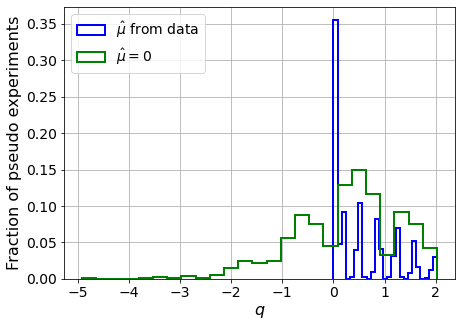

muhat mean:  0.12745546941671393
Z_bins:  0.6637481930307648
std Z_bins:  0.4489734466449456
Z_bins mu=0:  0.6637481930307648
std Z_bins mu=0:  0.7605701704375616

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1305


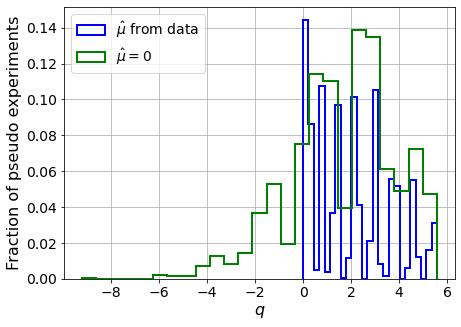

muhat mean:  0.028516207942256188
Z_bins:  1.4289545554449294
std Z_bins:  0.5556118180295343
Z_bins mu=0:  1.4289545554449294
std Z_bins mu=0:  0.7642512821531643

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


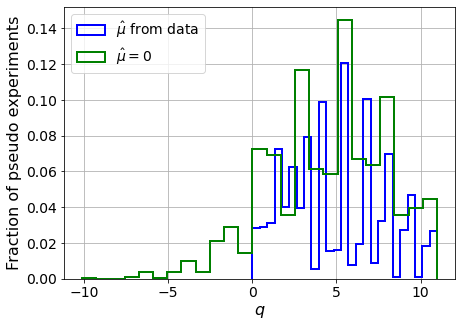

muhat mean:  0.03090664255584803
Z_bins:  2.1303913940436345
std Z_bins:  0.665643168025581
Z_bins mu=0:  2.127938650975468
std Z_bins mu=0:  0.8196317054897071

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.123


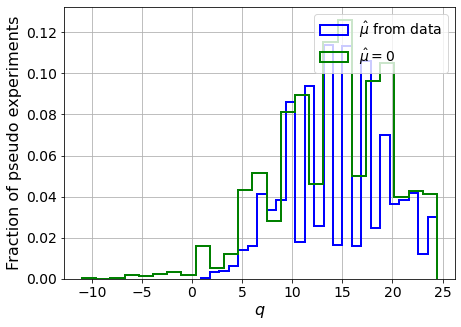

muhat mean:  0.011811368389629545
Z_bins:  3.8258612783155894
std Z_bins:  0.6407376409321415
Z_bins mu=0:  3.8258612783155894
std Z_bins mu=0:  0.7329493424033496

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


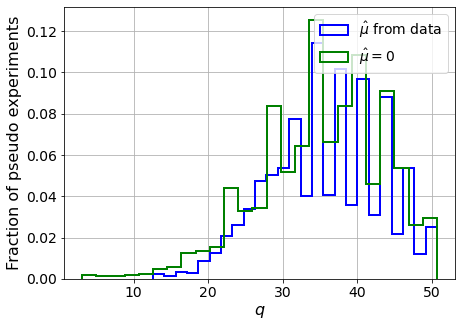

muhat mean:  0.00916101617116677
Z_bins:  5.960767346517182
std Z_bins:  0.6221926388694012
Z_bins mu=0:  5.959573898814018
std Z_bins mu=0:  0.6875798256908263

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.122


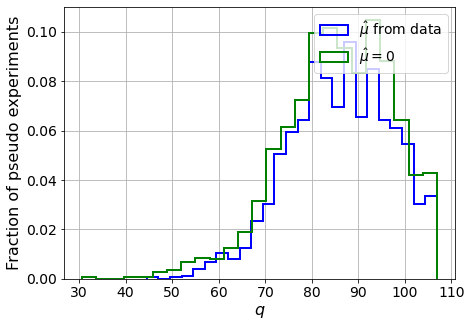

muhat mean:  0.002912580276655082
Z_bins:  9.295907333591751
std Z_bins:  0.5838151442196093
Z_bins mu=0:  9.295646724704016
std Z_bins mu=0:  0.6277213495869194

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


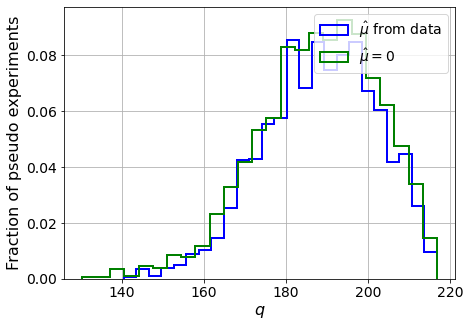

muhat mean:  0.002086164394271534
Z_bins:  13.747146262049641
std Z_bins:  0.5024067589309252
Z_bins mu=0:  13.747146262049641
std Z_bins mu=0:  0.5301066944027498

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


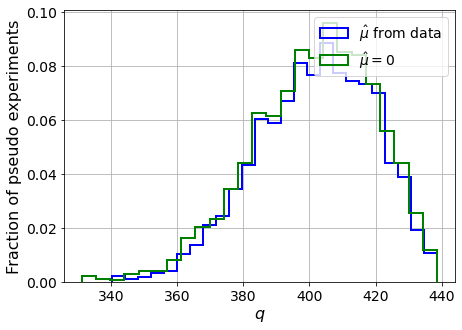

muhat mean:  0.0009488692758124647
Z_bins:  20.07580866757288
std Z_bins:  0.4415283970534024
Z_bins mu=0:  20.075481468075836
std Z_bins mu=0:  0.4606671786910051

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.13


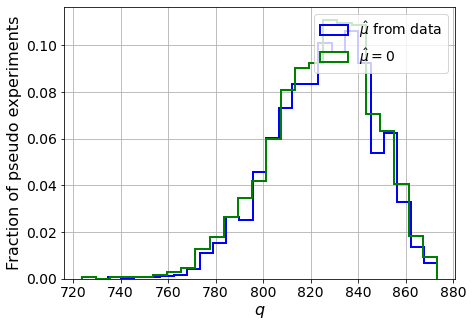

muhat mean:  0.0005016903046419542
Z_bins:  28.760111939479312
std Z_bins:  0.366329358976796
Z_bins mu=0:  28.760086979384642
std Z_bins mu=0:  0.37934301599937464

--------


 FINAL RESULT:

[[0.19596638615785553, 0.7571756502487366, 0.23377522407137155, 0.16568873630450956, 1.6219279191225682], [0.19610840970066176, 0.7422443917362669, 0.21307600187758746, 0.1659345496100005, 1.5584985449532733], [0.1795819298908257, 0.7960921591254465, 0.35572172257773427, 0.13310244623045356, 2.0268376348259567], [0.18505579177001288, 0.7974040392410777, 0.25117013911977587, 0.14479080176129996, 1.8459254813505492], [0.38211757925462414, 0.38318172362284825, 0.1943434461273691, 0.38211757925462414, 0.6815057306482433], [0.1835162127939324, 0.7841872707300988, 0.3299429007350257, 0.14160270358052318, 1.8749727780864158], [0.6637481930307648, 0.4489734466449456, 0.12745546941671393, 0.6637481930307648, 0.7605701704375616], [1.4289545554449294, 0.5556118180295343, 0.028516207942256188, 1.428954555444

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 318.3806031  281.83057871 241.98104656 197.83288048
 145.16472957  89.3773786   28.90913382 -33.74330422 -98.60250876]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 345.08193799
 273

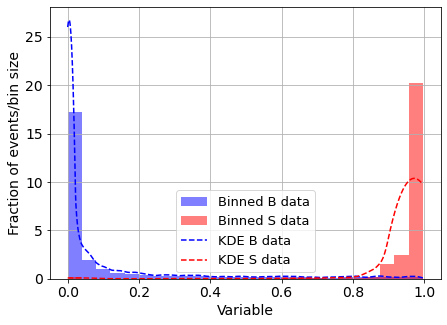

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



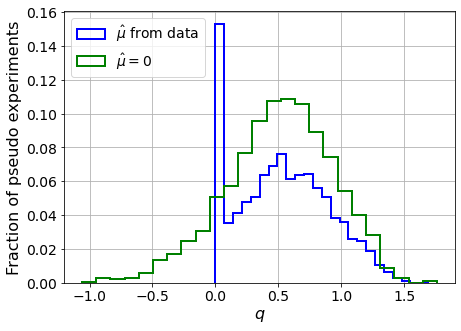

muhat mean:  -3.7753686622719798
Z_bins:  0.7289039438896687
std Z_bins:  0.251199493094291
Z_bins mu=0:  0.7289039438896687
std Z_bins mu=0:  0.28983319607187014

--------

B_expected:  643
S_expected:  1



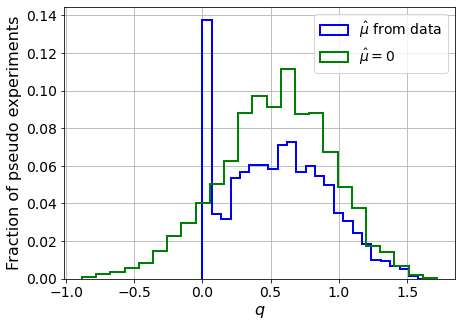

muhat mean:  -4.089361446963008
Z_bins:  0.746549408852092
std Z_bins:  0.2456831453037427
Z_bins mu=0:  0.746549408852092
std Z_bins mu=0:  0.27650162570930825

--------

B_expected:  643
S_expected:  1



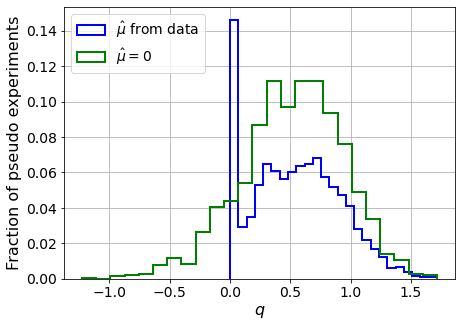

muhat mean:  -3.9022253222073258
Z_bins:  0.736401786387165
std Z_bins:  0.25003107350740084
Z_bins mu=0:  0.736401786387165
std Z_bins mu=0:  0.28711851540573374

--------

B_expected:  643
S_expected:  1



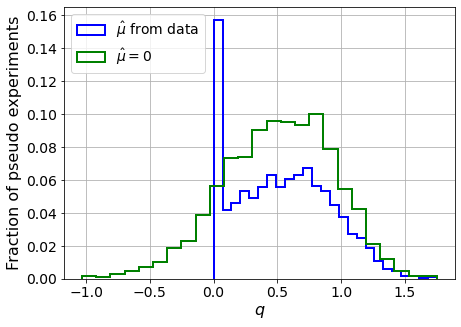

muhat mean:  -3.9353256466616493
Z_bins:  0.7314760141084585
std Z_bins:  0.2577399394096317
Z_bins mu=0:  0.7314760141084585
std Z_bins mu=0:  0.29389688541060527

--------

B_expected:  643
S_expected:  1



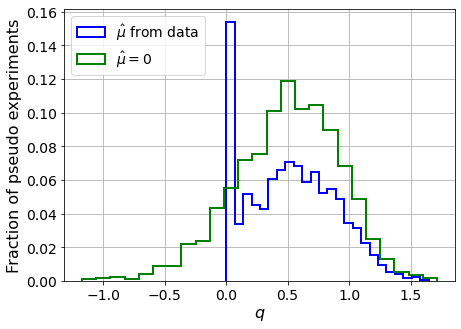

muhat mean:  -3.641716367977034
Z_bins:  0.7283265944856105
std Z_bins:  0.2494665022625714
Z_bins mu=0:  0.7283265944856105
std Z_bins mu=0:  0.28911368168649726

--------

B_expected:  643
S_expected:  1



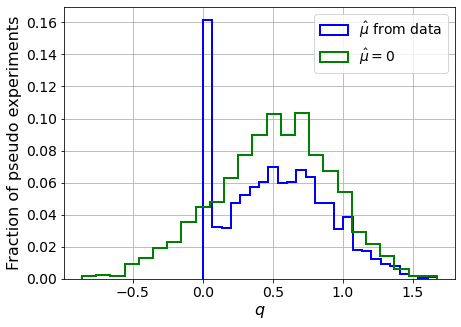

muhat mean:  -3.7547738539084183
Z_bins:  0.7243404066804444
std Z_bins:  0.251404688834015
Z_bins mu=0:  0.7243404066804444
std Z_bins mu=0:  0.2881197760043975

--------

B_expected:  643
S_expected:  2



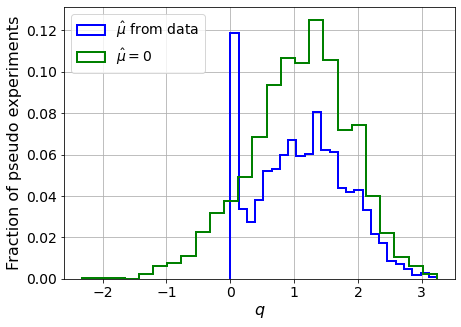

muhat mean:  -1.8379689580802252
Z_bins:  1.0726948244770766
std Z_bins:  0.3296192109981665
Z_bins mu=0:  1.0726948244770766
std Z_bins mu=0:  0.3708438531294414

--------

B_expected:  643
S_expected:  5



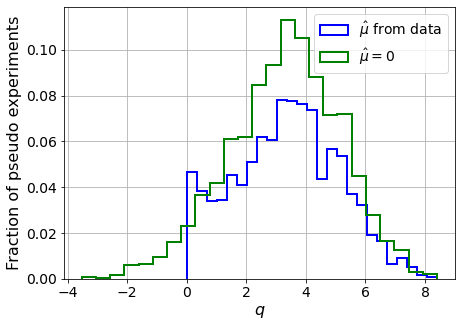

muhat mean:  -0.7675732328779784
Z_bins:  1.841629516154466
std Z_bins:  0.4762790420130268
Z_bins mu=0:  1.841629516154466
std Z_bins mu=0:  0.5097910582843262

--------

B_expected:  643
S_expected:  9



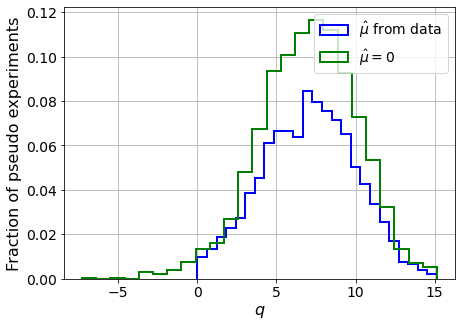

muhat mean:  -0.44235285700932925
Z_bins:  2.669379642602848
std Z_bins:  0.5482594998525491
Z_bins mu=0:  2.669379642602848
std Z_bins mu=0:  0.5770501742918294

--------

B_expected:  643
S_expected:  18



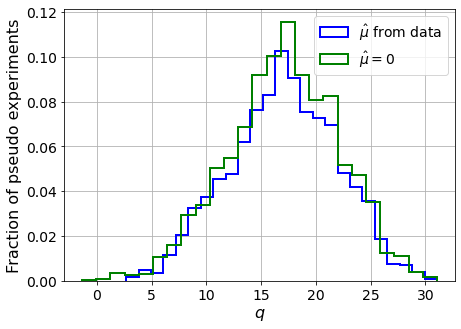

muhat mean:  -0.21173904637808597
Z_bins:  4.143700609509982
std Z_bins:  0.5946711213255953
Z_bins mu=0:  4.143700609509982
std Z_bins mu=0:  0.6086093184922674

--------

B_expected:  643
S_expected:  34



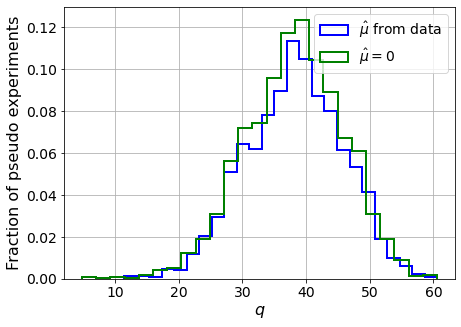

muhat mean:  -0.10320090996505818
Z_bins:  6.1957593392935815
std Z_bins:  0.6098032928147661
Z_bins mu=0:  6.1957593392935815
std Z_bins mu=0:  0.6230287537341119

--------

B_expected:  643
S_expected:  66



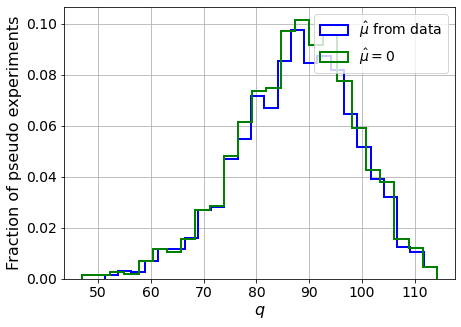

muhat mean:  -0.05634806158231524
Z_bins:  9.389435629064288
std Z_bins:  0.5833151422810716
Z_bins mu=0:  9.389435629064288
std Z_bins mu=0:  0.5920910991835164

--------

B_expected:  643
S_expected:  126



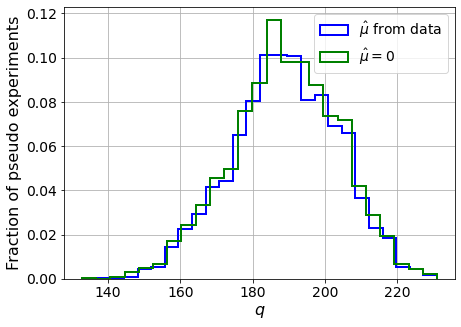

muhat mean:  -0.03036414391442168
Z_bins:  13.75248296736327
std Z_bins:  0.5363882497133631
Z_bins mu=0:  13.75248296736327
std Z_bins mu=0:  0.5408036495868955

--------

B_expected:  643
S_expected:  244



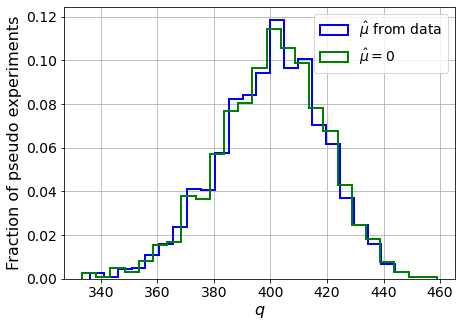

muhat mean:  -0.01590420363934184
Z_bins:  20.039374149322686
std Z_bins:  0.46910495451251727
Z_bins mu=0:  20.039374149322686
std Z_bins mu=0:  0.47302582541282845

--------

B_expected:  643
S_expected:  471



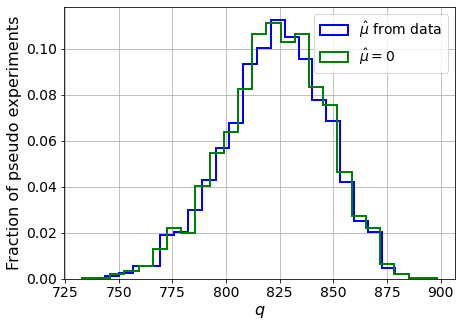

muhat mean:  -0.008136138126787368
Z_bins:  28.705162983673493
std Z_bins:  0.41413197886444186
Z_bins mu=0:  28.705162983673493
std Z_bins mu=0:  0.41659638766461277

--------


 FINAL RESULT:

[[0.7289039438896687, 0.251199493094291, -3.7753686622719798, 0.7289039438896687, 0.28983319607187014], [0.746549408852092, 0.2456831453037427, -4.089361446963008, 0.746549408852092, 0.27650162570930825], [0.736401786387165, 0.25003107350740084, -3.9022253222073258, 0.736401786387165, 0.28711851540573374], [0.7314760141084585, 0.2577399394096317, -3.9353256466616493, 0.7314760141084585, 0.29389688541060527], [0.7283265944856105, 0.2494665022625714, -3.641716367977034, 0.7283265944856105, 0.28911368168649726], [0.7243404066804444, 0.251404688834015, -3.7547738539084183, 0.7243404066804444, 0.2881197760043975], [1.0726948244770766, 0.3296192109981665, -1.8379689580802252, 1.0726948244770766, 0.3708438531294414], [1.841629516154466, 0.4762790420130268, -0.7675732328779784, 1.841629516154466, 0.509

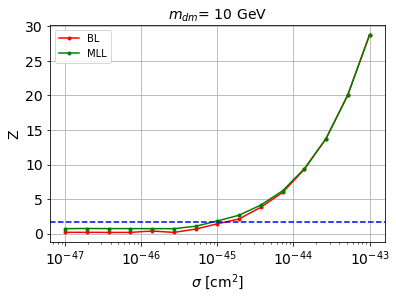


cross_BL_164:  1.2188900859977367e-45
cross_BL_164_up:  7.562749847249591e-46
cross_BL_164_down:  2.064522039570734e-45

cross_MLL_164:  8.519293781439578e-46
cross_MLL_164_up:  6.09153146187653e-46
cross_MLL_164_down:  1.2700757987719519e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


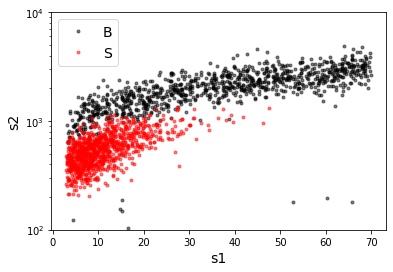

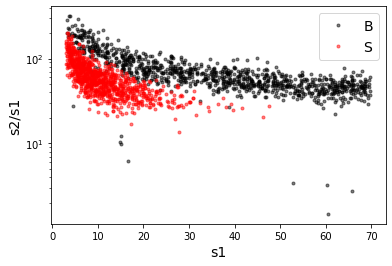

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


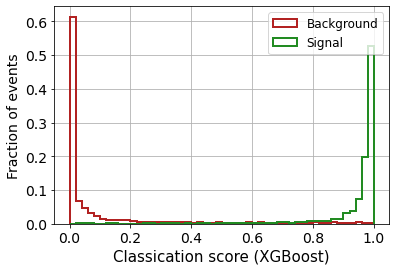


 ROC-AUC =  0.9891712960820563
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


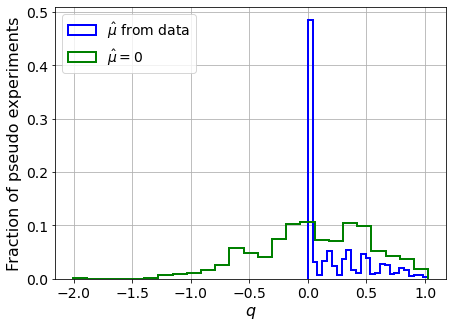

muhat mean:  0.14802366815272003
Z_bins:  0.23065037399144095
std Z_bins:  0.5967349412781685
Z_bins mu=0:  0.2283701481388819
std Z_bins mu=0:  1.066354800819213

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.101


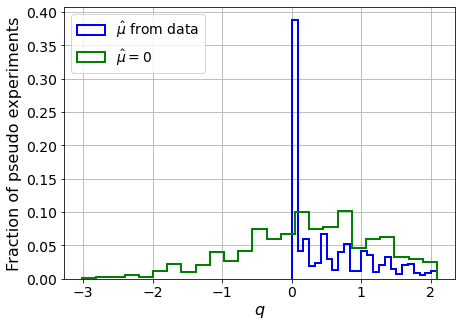

muhat mean:  0.05220073474086017
Z_bins:  0.5378098778117576
std Z_bins:  0.5420705921963337
Z_bins mu=0:  0.5378098778117576
std Z_bins mu=0:  0.8926749096764321

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


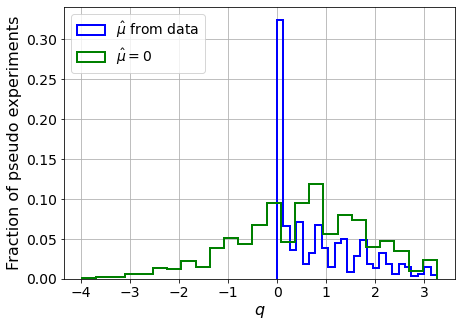

muhat mean:  0.04670671209905478
Z_bins:  0.7352015435994211
std Z_bins:  0.5887908928079777
Z_bins mu=0:  0.7349863047524493
std Z_bins mu=0:  0.8904764275627784

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


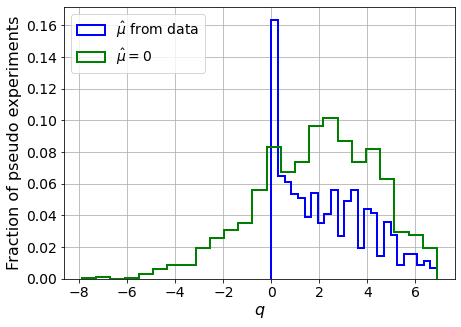

muhat mean:  0.02291348692277127
Z_bins:  1.4191116684114562
std Z_bins:  0.6405225199585521
Z_bins mu=0:  1.4191116684114562
std Z_bins mu=0:  0.8668041994980858

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


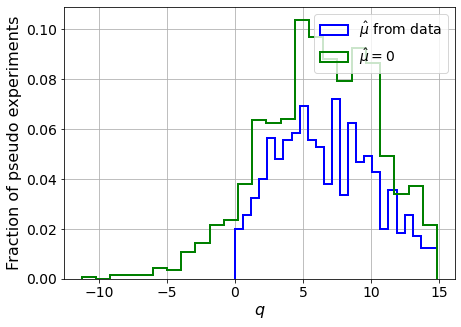

muhat mean:  0.012347419024982322
Z_bins:  2.511860354633307
std Z_bins:  0.7031197627901101
Z_bins mu=0:  2.5115806638287697
std Z_bins mu=0:  0.8459431864391722

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


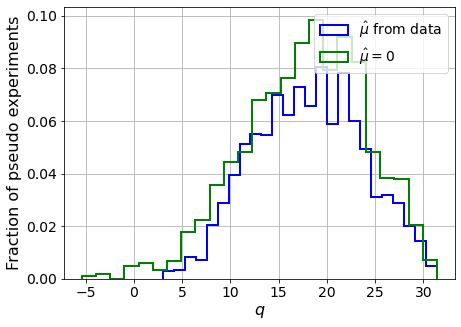

muhat mean:  -0.0012324588425481496
Z_bins:  4.266695005237998
std Z_bins:  0.6590653112375083
Z_bins mu=0:  4.266695005237998
std Z_bins mu=0:  0.7338339813285524

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1105


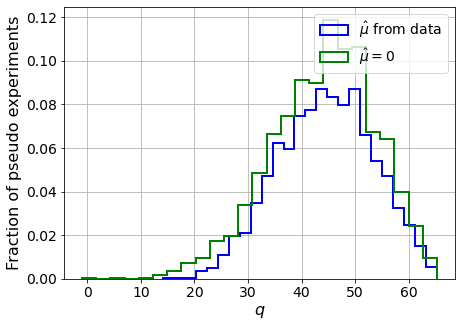

muhat mean:  0.0064129600415460935
Z_bins:  6.686237725044022
std Z_bins:  0.6625614278435099
Z_bins mu=0:  6.686032935465893
std Z_bins mu=0:  0.7251102996525172

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0945


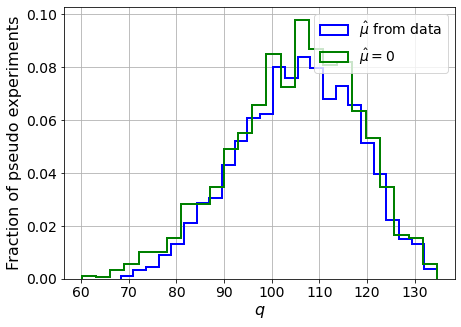

muhat mean:  0.003143124521640882
Z_bins:  10.295007882705175
std Z_bins:  0.598031761324709
Z_bins mu=0:  10.294837126845927
std Z_bins mu=0:  0.6356462764345926

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


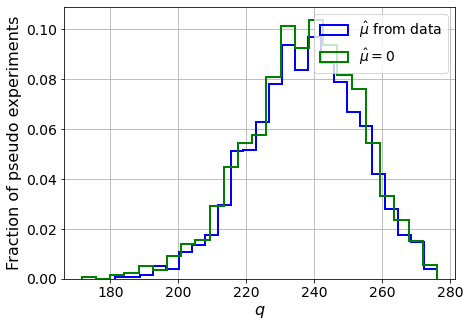

muhat mean:  0.00012821348251285122
Z_bins:  15.428637086934536
std Z_bins:  0.5116675621363348
Z_bins mu=0:  15.428637086934536
std Z_bins mu=0:  0.5335626257289692

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


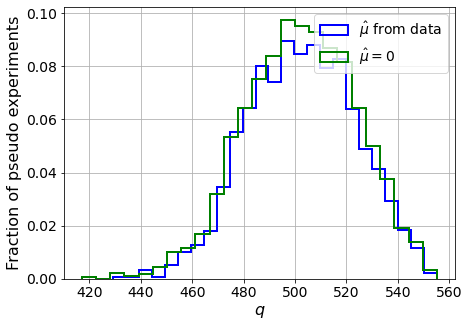

muhat mean:  0.0008596027586661647
Z_bins:  22.423577076070973
std Z_bins:  0.4655878471564785
Z_bins mu=0:  22.423141828234847
std Z_bins mu=0:  0.48123936260470956

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


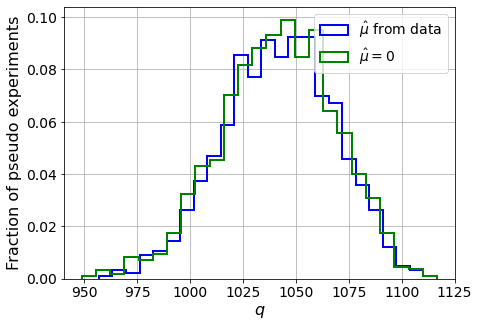

muhat mean:  0.0005649546633243924
Z_bins:  32.2880640323798
std Z_bins:  0.40690121499620246
Z_bins mu=0:  32.286288260158166
std Z_bins mu=0:  0.4184282557564704

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


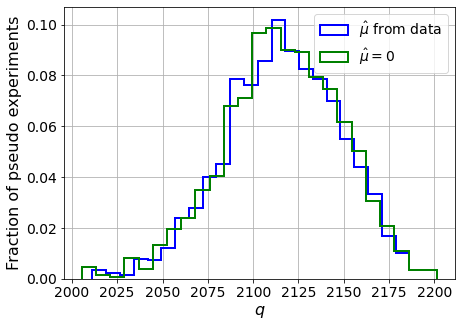

muhat mean:  1.3977155673675028e-06
Z_bins:  46.00322685389973
std Z_bins:  0.3457504061566554
Z_bins mu=0:  46.000307548775645
std Z_bins mu=0:  0.3528585595485512

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


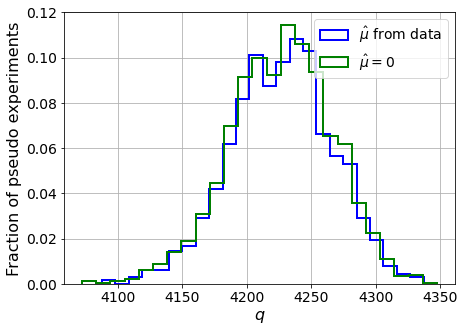

muhat mean:  5.043167570354959e-05
Z_bins:  65.02511123973223
std Z_bins:  0.3016270020484232
Z_bins mu=0:  65.02393387557831
std Z_bins mu=0:  0.3065417538568389

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


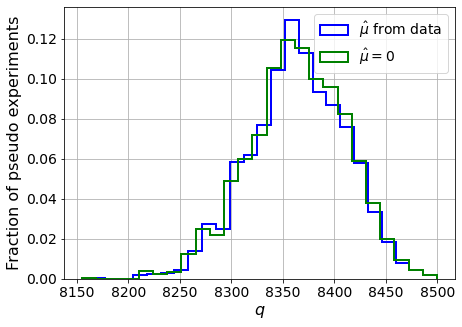

muhat mean:  3.09249469963486e-05
Z_bins:  91.45826828830653
std Z_bins:  0.2547386420442604
Z_bins mu=0:  91.45779193473741
std Z_bins mu=0:  0.25794525789835954

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


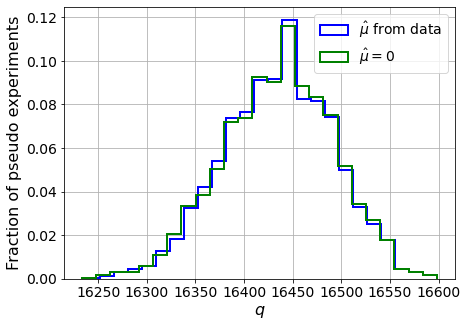

muhat mean:  3.383385001665089e-05
Z_bins:  128.2130158185202
std Z_bins:  0.2214866149155333
Z_bins mu=0:  128.21258238561472
std Z_bins mu=0:  0.22365077343095885

--------


 FINAL RESULT:

[[0.23065037399144095, 0.5967349412781685, 0.14802366815272003, 0.2283701481388819, 1.066354800819213], [0.5378098778117576, 0.5420705921963337, 0.05220073474086017, 0.5378098778117576, 0.8926749096764321], [0.7352015435994211, 0.5887908928079777, 0.04670671209905478, 0.7349863047524493, 0.8904764275627784], [1.4191116684114562, 0.6405225199585521, 0.02291348692277127, 1.4191116684114562, 0.8668041994980858], [2.511860354633307, 0.7031197627901101, 0.012347419024982322, 2.5115806638287697, 0.8459431864391722], [4.266695005237998, 0.6590653112375083, -0.0012324588425481496, 4.266695005237998, 0.7338339813285524], [6.686237725044022, 0.6625614278435099, 0.0064129600415460935, 6.686032935465893, 0.7251102996525172], [10.295007882705175, 0.598031761324709, 0.003143124521640882, 10.294837126845927, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 298.1955414  255.98463215 210.24020742
 158.63765475 101.33263951  37.71755416 -28.4931306  -96.49780083]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 381.60222314 337.08571894 285.57609059
 222

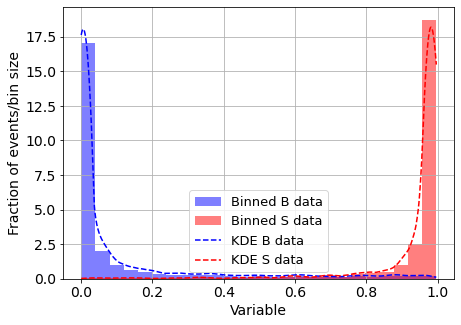

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



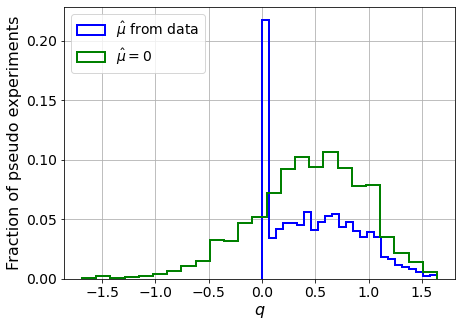

muhat mean:  -3.019057117634702
Z_bins:  0.6917453749626191
std Z_bins:  0.2933527291745501
Z_bins mu=0:  0.6917453749626191
std Z_bins mu=0:  0.37418119473759603

--------

B_expected:  643
S_expected:  2



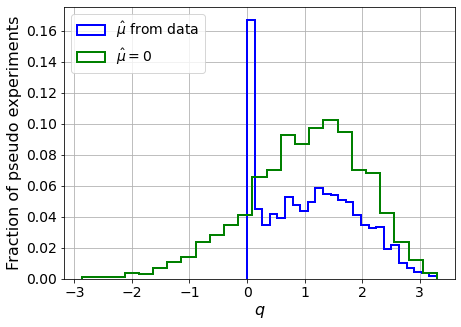

muhat mean:  -1.6999679334459774
Z_bins:  1.0621942195000176
std Z_bins:  0.38087221875939836
Z_bins mu=0:  1.0621942195000176
std Z_bins mu=0:  0.4701532758676851

--------

B_expected:  643
S_expected:  3



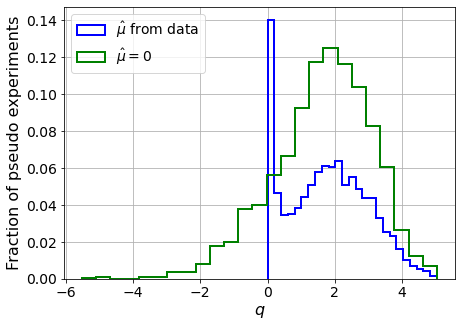

muhat mean:  -1.2680002153964232
Z_bins:  1.3349770977932325
std Z_bins:  0.44651510590441684
Z_bins mu=0:  1.3349770977932325
std Z_bins mu=0:  0.5450514973904937

--------

B_expected:  643
S_expected:  6



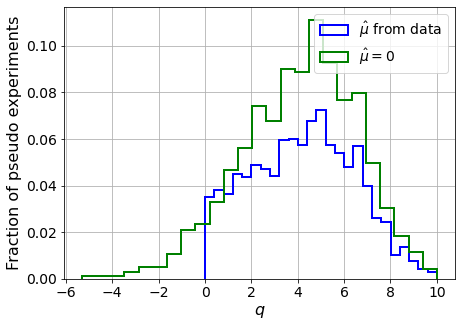

muhat mean:  -0.5737459925205852
Z_bins:  2.069495737886663
std Z_bins:  0.5390140483045596
Z_bins mu=0:  2.069495737886663
std Z_bins mu=0:  0.599059075947163

--------

B_expected:  643
S_expected:  12



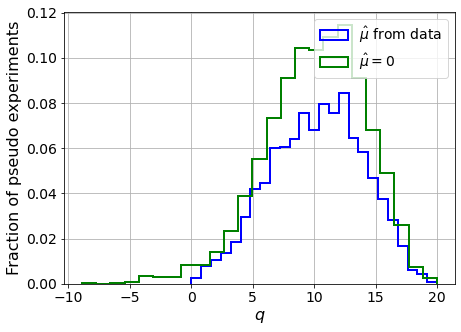

muhat mean:  -0.2556354486140761
Z_bins:  3.2307760018867637
std Z_bins:  0.57954330197922
Z_bins mu=0:  3.2307760018867637
std Z_bins mu=0:  0.6280883547201999

--------

B_expected:  643
S_expected:  23



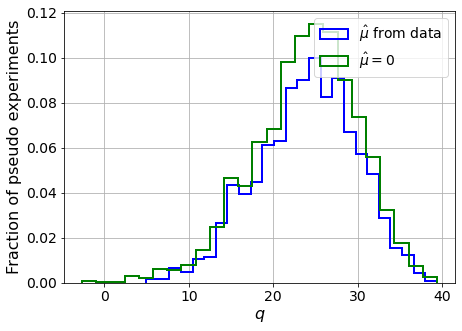

muhat mean:  -0.14420480091062388
Z_bins:  4.935997324826863
std Z_bins:  0.5948791185795098
Z_bins mu=0:  4.935997324826863
std Z_bins mu=0:  0.6267896815098026

--------

B_expected:  643
S_expected:  44



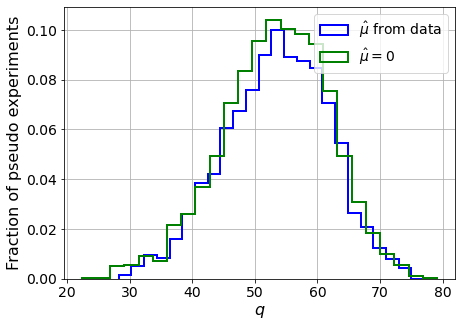

muhat mean:  -0.08109733747450414
Z_bins:  7.339366463729829
std Z_bins:  0.5671750367612052
Z_bins mu=0:  7.339366463729829
std Z_bins mu=0:  0.5842313033332847

--------

B_expected:  643
S_expected:  85



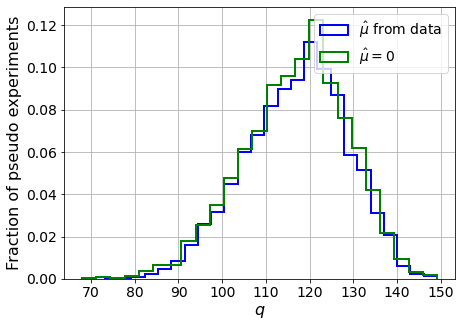

muhat mean:  -0.029292969946407326
Z_bins:  10.853250561889649
std Z_bins:  0.5381824194403447
Z_bins mu=0:  10.853250561889649
std Z_bins mu=0:  0.5521580175704929

--------

B_expected:  643
S_expected:  165



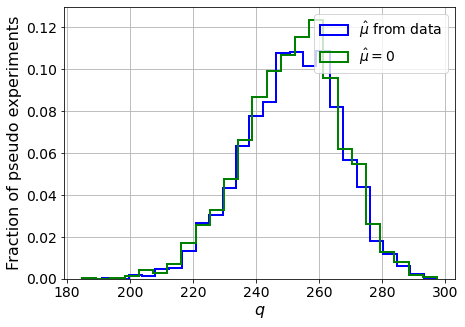

muhat mean:  -0.02133355881814191
Z_bins:  15.888928315282126
std Z_bins:  0.48054325290313904
Z_bins mu=0:  15.888928315282126
std Z_bins mu=0:  0.48853818716606134

--------

B_expected:  643
S_expected:  318



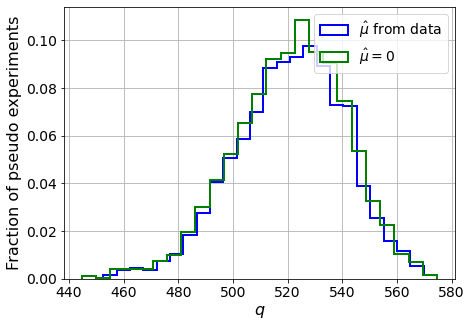

muhat mean:  -0.009949958993039352
Z_bins:  22.85879942233727
std Z_bins:  0.4374877535368621
Z_bins mu=0:  22.85879942233727
std Z_bins mu=0:  0.44333387961685045

--------

B_expected:  643
S_expected:  615



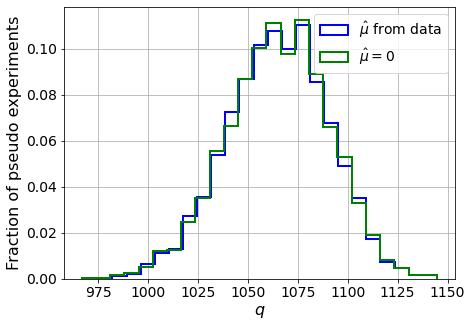

muhat mean:  -0.00579791449752665
Z_bins:  32.64053939814429
std Z_bins:  0.3893797177213688
Z_bins mu=0:  32.64053214356889
std Z_bins mu=0:  0.3923208092916559

--------

B_expected:  643
S_expected:  1187



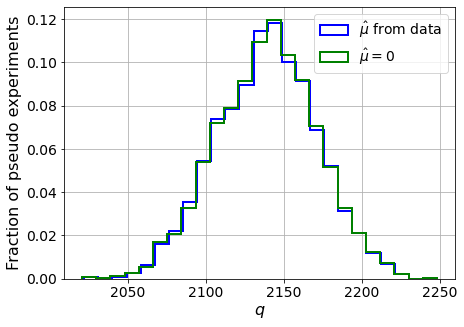

muhat mean:  -0.002620241127670951
Z_bins:  46.258741842634514
std Z_bins:  0.3466170984610717
Z_bins mu=0:  46.25741840444825
std Z_bins mu=0:  0.3490003502370977

--------

B_expected:  643
S_expected:  2291



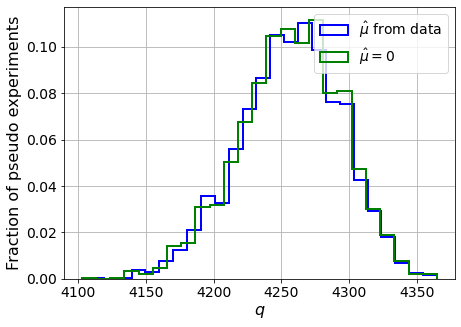

muhat mean:  -0.0012925894661987515
Z_bins:  65.2545704477178
std Z_bins:  0.28894665883054
Z_bins mu=0:  65.25442346451455
std Z_bins mu=0:  0.2906029531857628

--------

B_expected:  643
S_expected:  4424



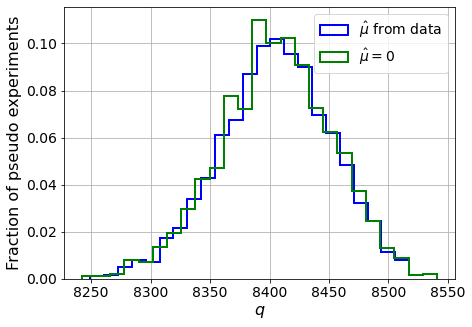

muhat mean:  -0.000665955987665854
Z_bins:  91.68204943053165
std Z_bins:  0.2559231601002962
Z_bins mu=0:  91.68204943053165
std Z_bins mu=0:  0.25698444998973563

--------

B_expected:  643
S_expected:  8542



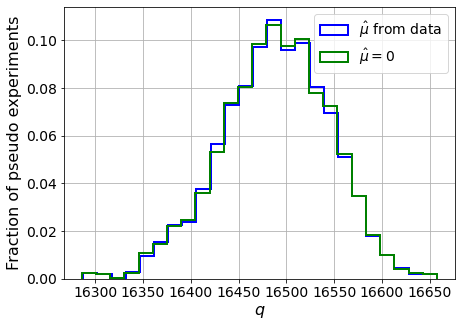

muhat mean:  -0.00045472952387755897
Z_bins:  128.41410388699336
std Z_bins:  0.2218668179255117
Z_bins mu=0:  128.41410388699336
std Z_bins mu=0:  0.22255763211805557

--------


 FINAL RESULT:

[[0.6917453749626191, 0.2933527291745501, -3.019057117634702, 0.6917453749626191, 0.37418119473759603], [1.0621942195000176, 0.38087221875939836, -1.6999679334459774, 1.0621942195000176, 0.4701532758676851], [1.3349770977932325, 0.44651510590441684, -1.2680002153964232, 1.3349770977932325, 0.5450514973904937], [2.069495737886663, 0.5390140483045596, -0.5737459925205852, 2.069495737886663, 0.599059075947163], [3.2307760018867637, 0.57954330197922, -0.2556354486140761, 3.2307760018867637, 0.6280883547201999], [4.935997324826863, 0.5948791185795098, -0.14420480091062388, 4.935997324826863, 0.6267896815098026], [7.339366463729829, 0.5671750367612052, -0.08109733747450414, 7.339366463729829, 0.5842313033332847], [10.853250561889649, 0.5381824194403447, -0.029292969946407326, 10.853250561889649, 0.5

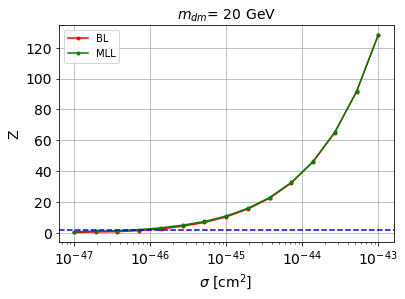


cross_BL_164:  8.220479907629045e-47
cross_BL_164_up:  4.944951718472653e-47
cross_BL_164_down:  1.3063404702001332e-46

cross_MLL_164:  4.898655388132578e-47
cross_MLL_164_up:  3.330784126277856e-47
cross_MLL_164_down:  7.674718946461328e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


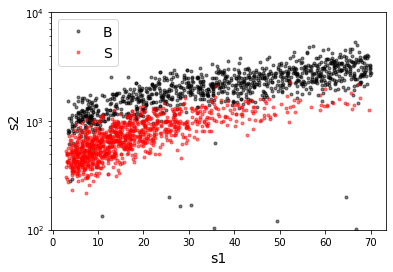

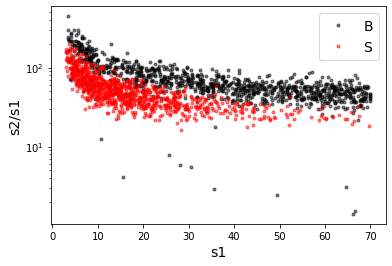

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


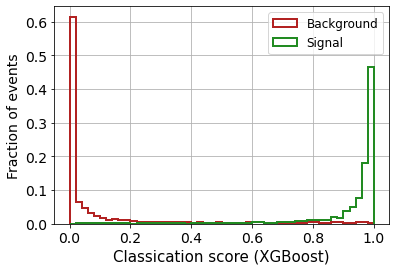


 ROC-AUC =  0.9848834111574636
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


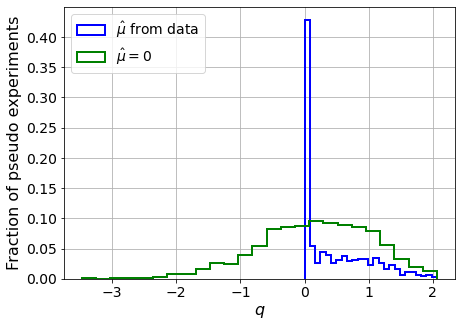

muhat mean:  0.09646036718110329
Z_bins:  0.4626571802490529
std Z_bins:  0.5682872081670777
Z_bins mu=0:  0.4626571802490529
std Z_bins mu=0:  0.9397758970235247

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


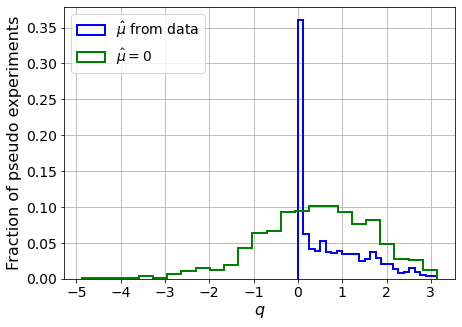

muhat mean:  0.05326564667554305
Z_bins:  0.6926155700373553
std Z_bins:  0.5756865547248882
Z_bins mu=0:  0.6926155700373553
std Z_bins mu=0:  0.8944513103950172

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


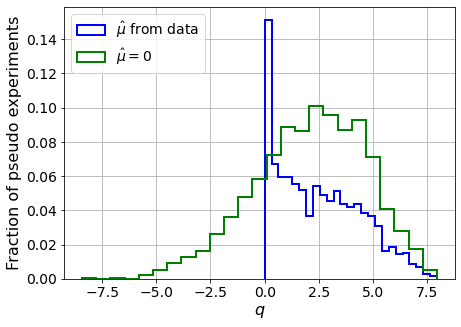

muhat mean:  0.013826564073429111
Z_bins:  1.5282537201538768
std Z_bins:  0.6328889883162524
Z_bins mu=0:  1.5282537201538768
std Z_bins mu=0:  0.8401332310511547

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


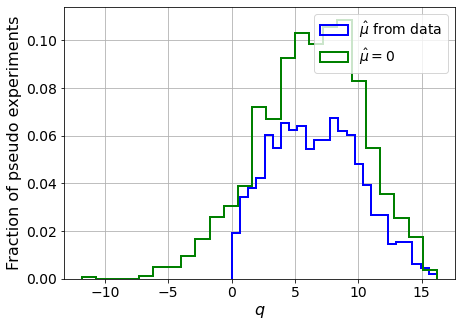

muhat mean:  0.0039045717486810012
Z_bins:  2.558109898522261
std Z_bins:  0.6783400393813082
Z_bins mu=0:  2.558109898522261
std Z_bins mu=0:  0.8079901843861345

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.092


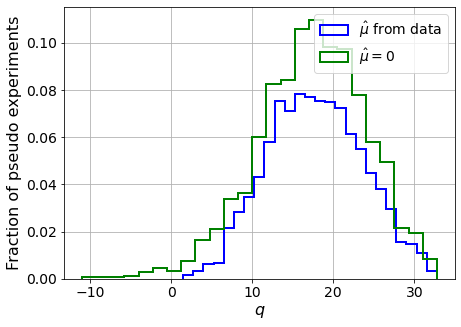

muhat mean:  0.0067051870755661476
Z_bins:  4.202692276461805
std Z_bins:  0.6955828240666746
Z_bins mu=0:  4.202348201267892
std Z_bins mu=0:  0.785435638688517

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.097


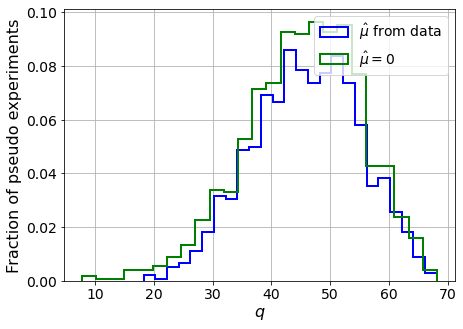

muhat mean:  -0.0013705818001196824
Z_bins:  6.789275641876462
std Z_bins:  0.6653058546869839
Z_bins mu=0:  6.789275641876462
std Z_bins mu=0:  0.7190347316233011

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


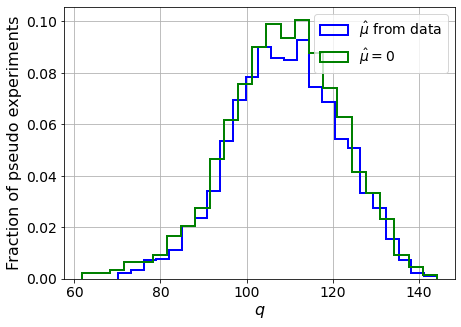

muhat mean:  0.001189681078971708
Z_bins:  10.452231701734814
std Z_bins:  0.602667446813784
Z_bins mu=0:  10.451570433528053
std Z_bins mu=0:  0.6370283322460887

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


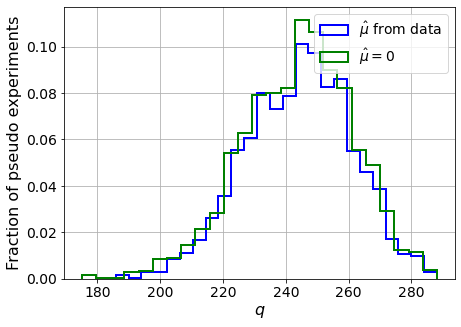

muhat mean:  0.0012848709289204757
Z_bins:  15.652005545928857
std Z_bins:  0.5414315444252346
Z_bins mu=0:  15.651929708289451
std Z_bins mu=0:  0.5656257901809382

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


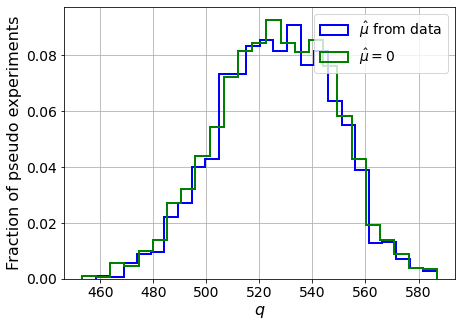

muhat mean:  -3.062590435844072e-05
Z_bins:  22.951140758389066
std Z_bins:  0.47068499702827615
Z_bins mu=0:  22.95023481940624
std Z_bins mu=0:  0.4833093516389435

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


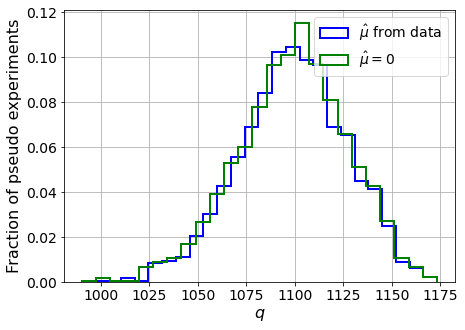

muhat mean:  0.00017327553267999847
Z_bins:  33.16963149742425
std Z_bins:  0.41727515034628454
Z_bins mu=0:  33.167988474494706
std Z_bins mu=0:  0.4271974764679644

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.101


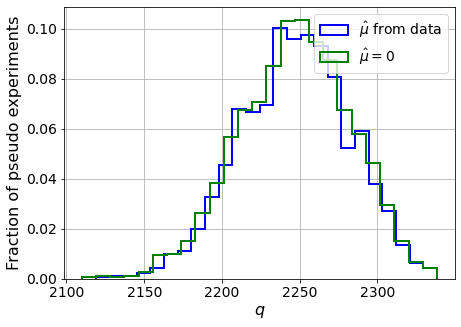

muhat mean:  -3.840256761335939e-06
Z_bins:  47.411357505130084
std Z_bins:  0.3695118604239156
Z_bins mu=0:  47.411357505130084
std Z_bins mu=0:  0.376057047928606

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.103


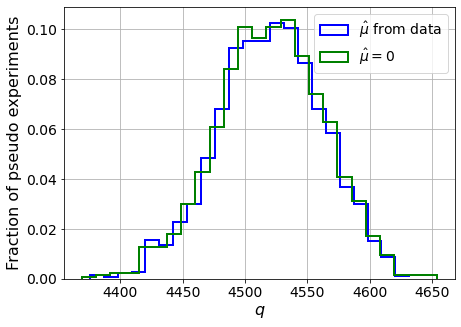

muhat mean:  2.0121618320409247e-05
Z_bins:  67.24310287415342
std Z_bins:  0.31313971625780074
Z_bins mu=0:  67.24068849985713
std Z_bins mu=0:  0.31703844156590527

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


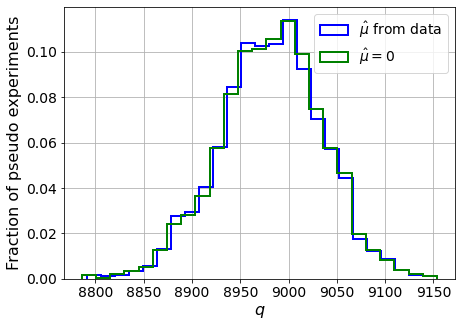

muhat mean:  4.4079102050975854e-05
Z_bins:  94.78362412699687
std Z_bins:  0.27874380209628513
Z_bins mu=0:  94.78344981625037
std Z_bins mu=0:  0.2816646648139793

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


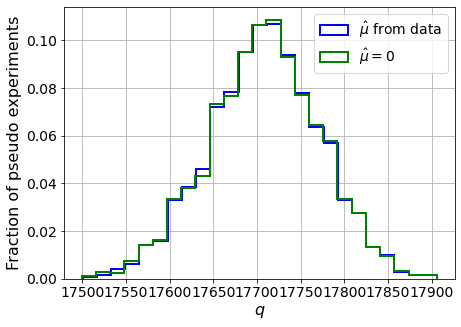

muhat mean:  -1.030017462575135e-05
Z_bins:  133.07829179683498
std Z_bins:  0.2376616105335616
Z_bins mu=0:  133.0767414336507
std Z_bins mu=0:  0.23950723307595387

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.094


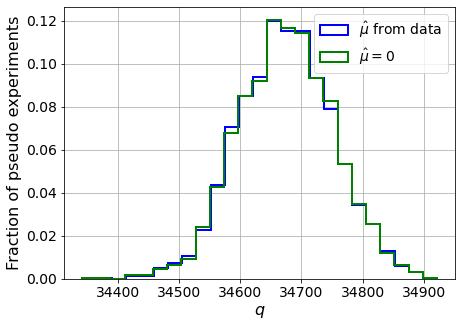

muhat mean:  -1.655240738680033e-06
Z_bins:  186.21056367687643
std Z_bins:  0.20742490540554517
Z_bins mu=0:  186.20993862740818
std Z_bins mu=0:  0.20866721252226764

--------


 FINAL RESULT:

[[0.4626571802490529, 0.5682872081670777, 0.09646036718110329, 0.4626571802490529, 0.9397758970235247], [0.6926155700373553, 0.5756865547248882, 0.05326564667554305, 0.6926155700373553, 0.8944513103950172], [1.5282537201538768, 0.6328889883162524, 0.013826564073429111, 1.5282537201538768, 0.8401332310511547], [2.558109898522261, 0.6783400393813082, 0.0039045717486810012, 2.558109898522261, 0.8079901843861345], [4.202692276461805, 0.6955828240666746, 0.0067051870755661476, 4.202348201267892, 0.785435638688517], [6.789275641876462, 0.6653058546869839, -0.0013705818001196824, 6.789275641876462, 0.7190347316233011], [10.452231701734814, 0.602667446813784, 0.001189681078971708, 10.451570433528053, 0.6370283322460887], [15.652005545928857, 0.5414315444252346, 0.0012848709289204757, 15.65192970828945

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 332.53681613 296.38719346 256.51649176 213.09358812
 160.14194643  99.70482739  35.18878083 -32.09356129 -98.08226278]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 321.53441064 287.50718451 242.76617944
 187

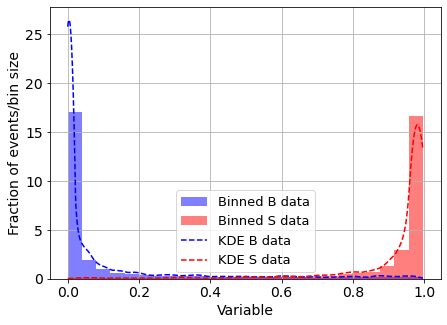

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


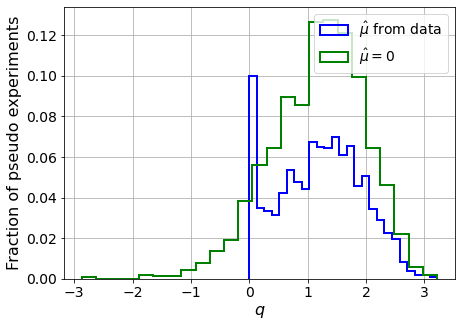

muhat mean:  -2.9539372904976102
Z_bins:  1.1143704315247795
std Z_bins:  0.3208997892005649
Z_bins mu=0:  1.1143704315247795
std Z_bins mu=0:  0.3584667354200042

--------

B_expected:  643
S_expected:  3



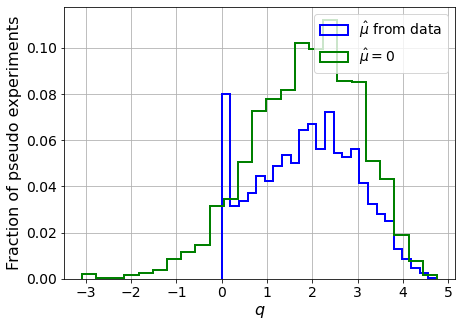

muhat mean:  -2.035697028732784
Z_bins:  1.3899027707537068
std Z_bins:  0.38767378847702805
Z_bins mu=0:  1.3899027707537068
std Z_bins mu=0:  0.42837594572863935

--------

B_expected:  643
S_expected:  7



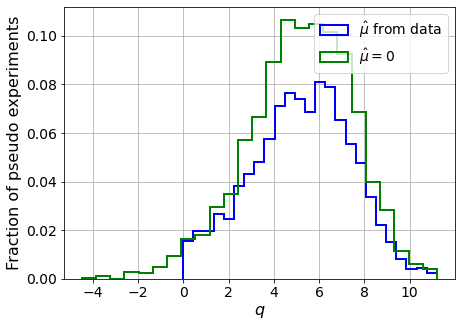

muhat mean:  -0.8316533122010432
Z_bins:  2.3034531432255334
std Z_bins:  0.47859627531053783
Z_bins mu=0:  2.3034531432255334
std Z_bins mu=0:  0.5052495510217452

--------

B_expected:  643
S_expected:  13



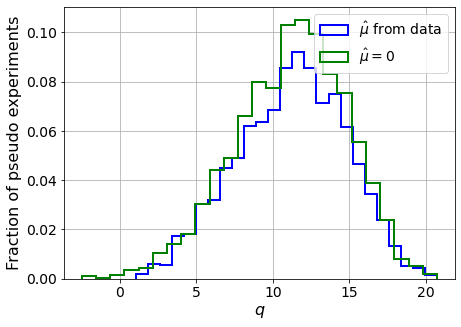

muhat mean:  -0.45927194625508955
Z_bins:  3.377314591539063
std Z_bins:  0.5259061962716559
Z_bins mu=0:  3.377314591539063
std Z_bins mu=0:  0.5403417511265981

--------

B_expected:  643
S_expected:  25



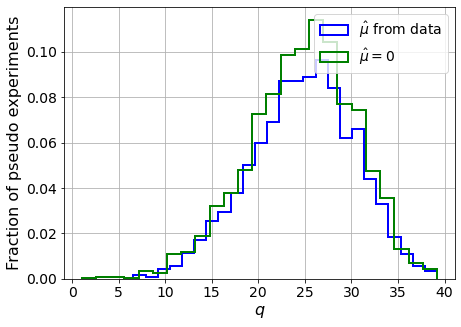

muhat mean:  -0.1962402919427123
Z_bins:  5.0088119995134734
std Z_bins:  0.5574462132593256
Z_bins mu=0:  5.0088119995134734
std Z_bins mu=0:  0.570498094168844

--------

B_expected:  643
S_expected:  48



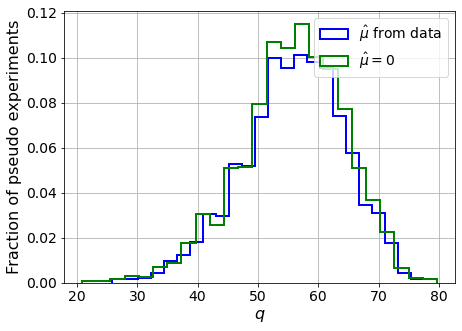

muhat mean:  -0.1356481081213651
Z_bins:  7.5027887607904535
std Z_bins:  0.5660283005785803
Z_bins mu=0:  7.5027887607904535
std Z_bins mu=0:  0.5761950195153865

--------

B_expected:  643
S_expected:  93



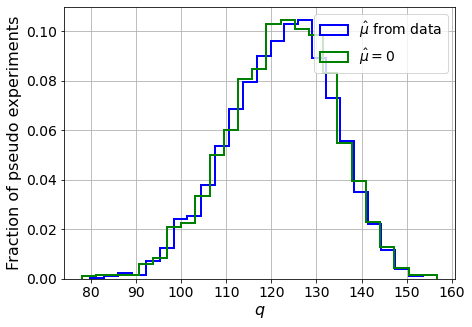

muhat mean:  -0.06460767770891832
Z_bins:  11.086344824199223
std Z_bins:  0.5257388390365648
Z_bins mu=0:  11.086344824199223
std Z_bins mu=0:  0.530921580217024

--------

B_expected:  643
S_expected:  179



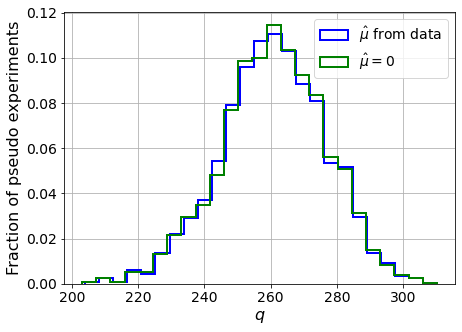

muhat mean:  -0.0333269060960548
Z_bins:  16.164316451391333
std Z_bins:  0.4876690820853249
Z_bins mu=0:  16.164316451391333
std Z_bins mu=0:  0.49067929373470415

--------

B_expected:  643
S_expected:  345



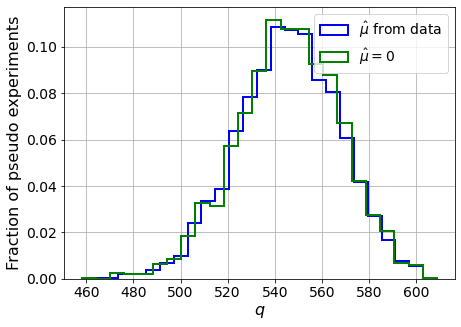

muhat mean:  -0.018540473122441895
Z_bins:  23.369244785100033
std Z_bins:  0.46453615213109284
Z_bins mu=0:  23.369244785100033
std Z_bins mu=0:  0.46731615784758124

--------

B_expected:  643
S_expected:  666



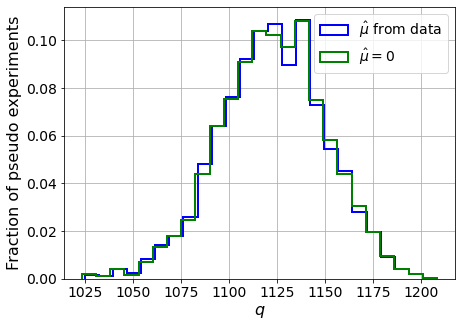

muhat mean:  -0.008289639295184085
Z_bins:  33.51331823732322
std Z_bins:  0.4103363857610686
Z_bins mu=0:  33.51264977192882
std Z_bins mu=0:  0.41211142335326867

--------

B_expected:  643
S_expected:  1286



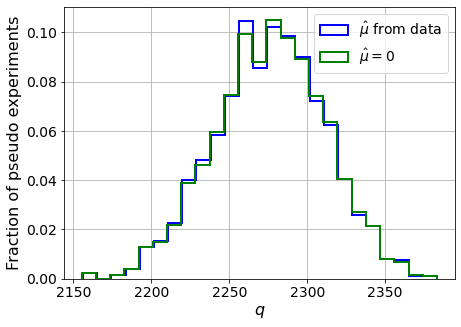

muhat mean:  -0.004670678938836956
Z_bins:  47.7155477471992
std Z_bins:  0.3707034230766447
Z_bins mu=0:  47.7155477471992
std Z_bins mu=0:  0.3718181231084079

--------

B_expected:  643
S_expected:  2484



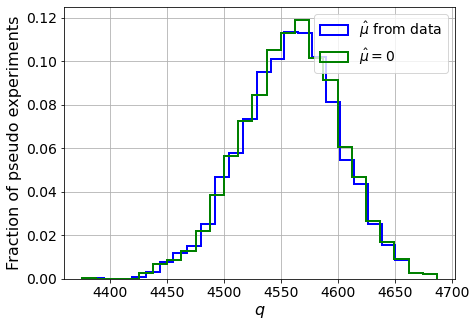

muhat mean:  -0.002459469197113744
Z_bins:  67.52487357928963
std Z_bins:  0.3200569965988251
Z_bins mu=0:  67.52487357928963
std Z_bins mu=0:  0.32067323747579013

--------

B_expected:  643
S_expected:  4795



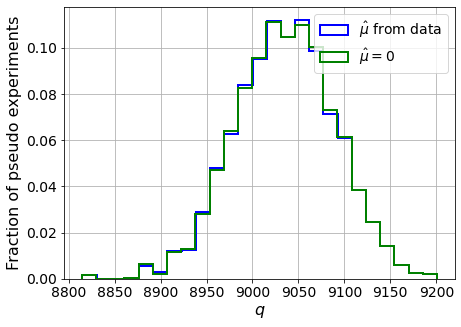

muhat mean:  -0.0012187138280241117
Z_bins:  95.05509334600393
std Z_bins:  0.2859072696765859
Z_bins mu=0:  95.05509334600393
std Z_bins mu=0:  0.28628979392864434

--------

B_expected:  643
S_expected:  9258



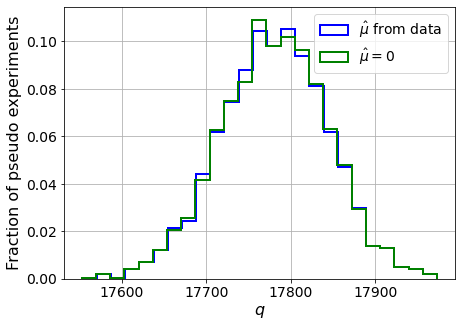

muhat mean:  -0.0006165302224726857
Z_bins:  133.34796436377735
std Z_bins:  0.23755838384945152
Z_bins mu=0:  133.34782117324025
std Z_bins mu=0:  0.23783648793922

--------

B_expected:  643
S_expected:  17875



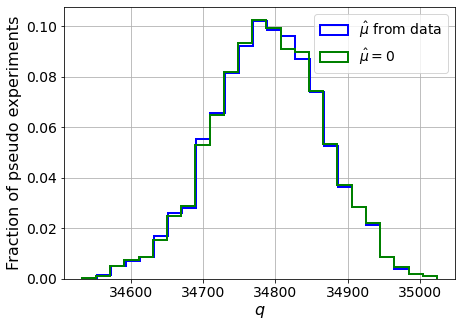

muhat mean:  -0.0003124817139306172
Z_bins:  186.52160349990825
std Z_bins:  0.2037530495748051
Z_bins mu=0:  186.52160349990825
std Z_bins mu=0:  0.20394887932971298

--------


 FINAL RESULT:

[[1.1143704315247795, 0.3208997892005649, -2.9539372904976102, 1.1143704315247795, 0.3584667354200042], [1.3899027707537068, 0.38767378847702805, -2.035697028732784, 1.3899027707537068, 0.42837594572863935], [2.3034531432255334, 0.47859627531053783, -0.8316533122010432, 2.3034531432255334, 0.5052495510217452], [3.377314591539063, 0.5259061962716559, -0.45927194625508955, 3.377314591539063, 0.5403417511265981], [5.0088119995134734, 0.5574462132593256, -0.1962402919427123, 5.0088119995134734, 0.570498094168844], [7.5027887607904535, 0.5660283005785803, -0.1356481081213651, 7.5027887607904535, 0.5761950195153865], [11.086344824199223, 0.5257388390365648, -0.06460767770891832, 11.086344824199223, 0.530921580217024], [16.164316451391333, 0.4876690820853249, -0.0333269060960548, 16.164316451391333, 0

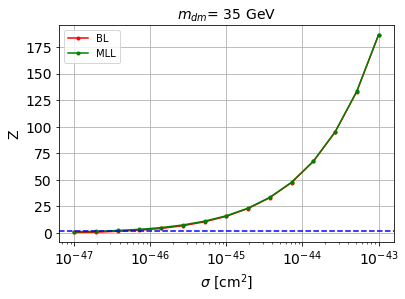


cross_BL_164:  4.0034137956069824e-47
cross_BL_164_up:  2.70993238811517e-47
cross_BL_164_down:  6.531999277448409e-47

cross_MLL_164:  2.482610309836158e-47
cross_MLL_164_up:  1.4821176343682938e-47
cross_MLL_164_down:  3.3111465584339185e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


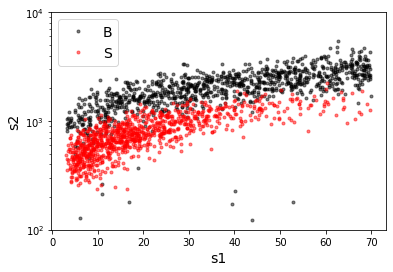

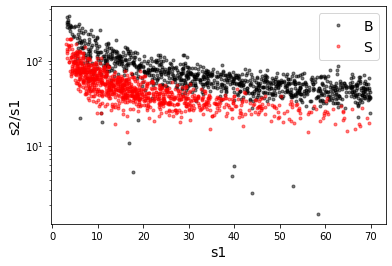

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


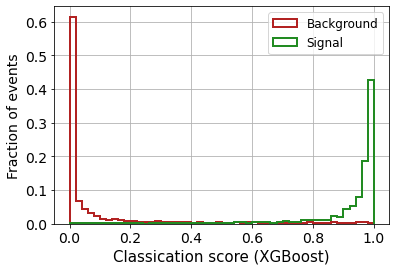


 ROC-AUC =  0.9825878559971676
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.079


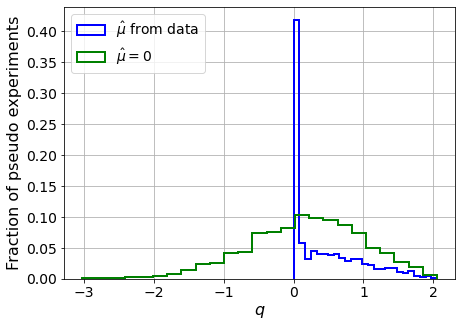

muhat mean:  0.06676040662133045
Z_bins:  0.4617263853245128
std Z_bins:  0.5413209441458828
Z_bins mu=0:  0.4617263853245128
std Z_bins mu=0:  0.8810033133170578

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0855


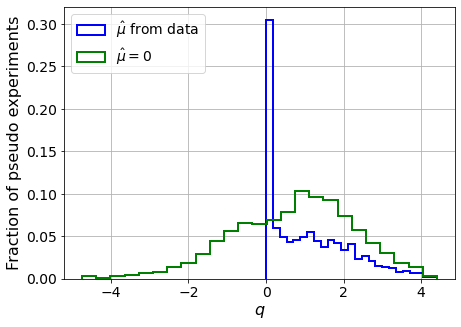

muhat mean:  0.01864782434690648
Z_bins:  0.9312342912696807
std Z_bins:  0.5681566192870908
Z_bins mu=0:  0.9312342912696807
std Z_bins mu=0:  0.8379930455718643

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0915


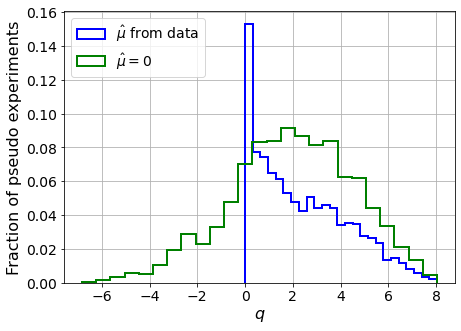

muhat mean:  0.02116054790932614
Z_bins:  1.4282132967108627
std Z_bins:  0.677560343038031
Z_bins mu=0:  1.4279094484745045
std Z_bins mu=0:  0.8972301666717877

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.091


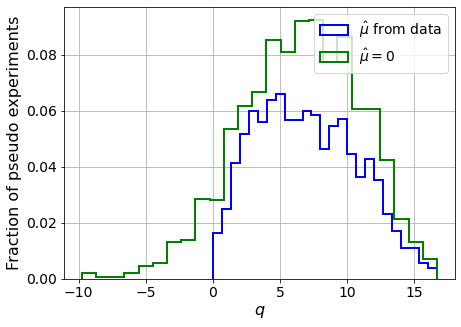

muhat mean:  0.014819015559278467
Z_bins:  2.5897250225471993
std Z_bins:  0.7157359055665025
Z_bins mu=0:  2.5897250225471993
std Z_bins mu=0:  0.8524504618621702

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


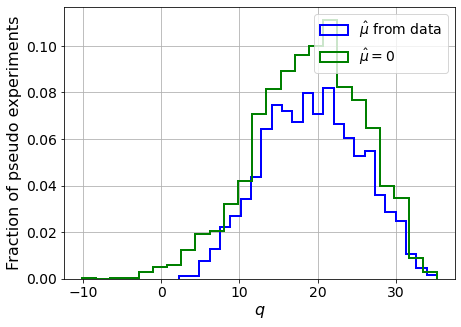

muhat mean:  0.003562220896042576
Z_bins:  4.386104213683583
std Z_bins:  0.700920904289859
Z_bins mu=0:  4.386104213683583
std Z_bins mu=0:  0.785690708376784

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


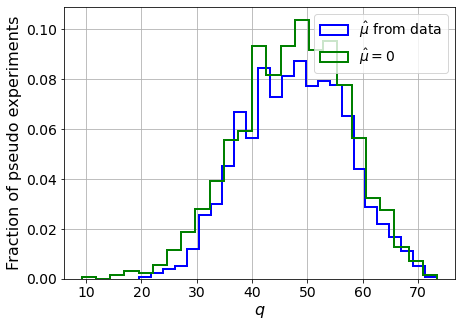

muhat mean:  0.0024148408609751637
Z_bins:  6.924903572762081
std Z_bins:  0.6674748611534674
Z_bins mu=0:  6.924903572762081
std Z_bins mu=0:  0.7171114260848765

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


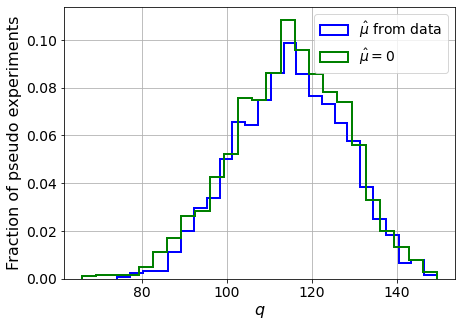

muhat mean:  0.001831605222413671
Z_bins:  10.728309303280605
std Z_bins:  0.5952628184069455
Z_bins mu=0:  10.727688006683161
std Z_bins mu=0:  0.6269106212721297

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0835


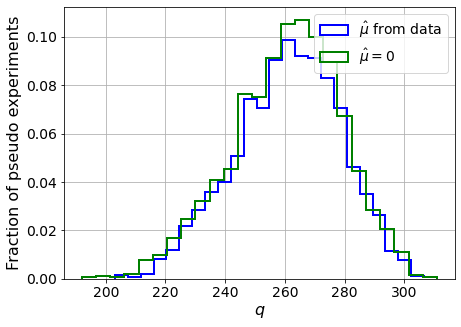

muhat mean:  0.00013724716393617603
Z_bins:  16.18089329738362
std Z_bins:  0.5445726395169083
Z_bins mu=0:  16.18071087669522
std Z_bins mu=0:  0.5664449370094321

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


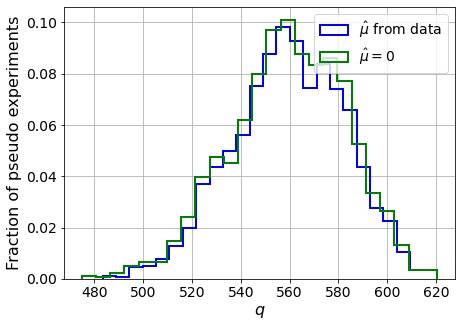

muhat mean:  0.0009023430736167713
Z_bins:  23.6707342273407
std Z_bins:  0.4846941542194524
Z_bins mu=0:  23.666804867293262
std Z_bins mu=0:  0.5001073309002284

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


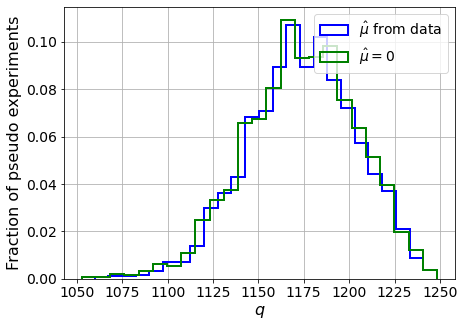

muhat mean:  5.497002665845268e-05
Z_bins:  34.275367240930386
std Z_bins:  0.43468457048214065
Z_bins mu=0:  34.274879826705806
std Z_bins mu=0:  0.44490518956183395

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


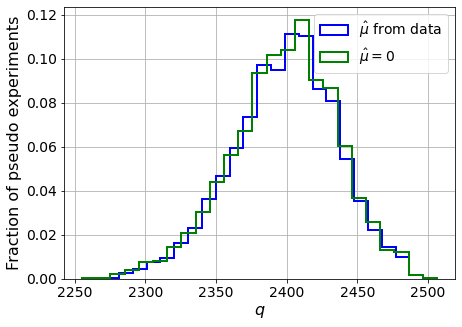

muhat mean:  7.67766382338373e-05
Z_bins:  49.00411145243328
std Z_bins:  0.378863310863231
Z_bins mu=0:  49.00411145243328
std Z_bins mu=0:  0.3859771835641183

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


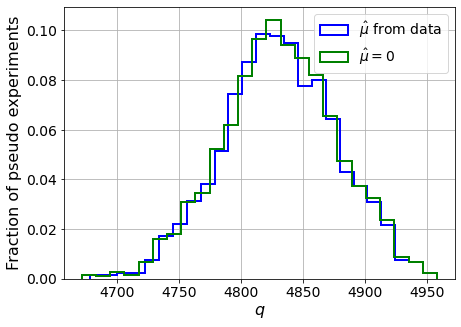

muhat mean:  3.108997826381987e-05
Z_bins:  69.50621028371778
std Z_bins:  0.3303877036951324
Z_bins mu=0:  69.50243383301722
std Z_bins mu=0:  0.3346786303429886

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0845


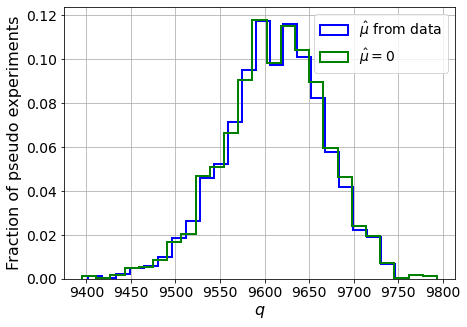

muhat mean:  4.039840217845581e-05
Z_bins:  98.04744913822812
std Z_bins:  0.2851744068243389
Z_bins mu=0:  98.04651961208248
std Z_bins mu=0:  0.28805964183162247

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0895


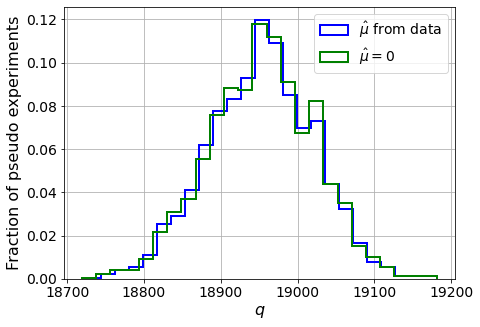

muhat mean:  -2.7093546014632785e-06
Z_bins:  137.67742499383803
std Z_bins:  0.24646527925602113
Z_bins mu=0:  137.6767329549401
std Z_bins mu=0:  0.2481668767014581

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


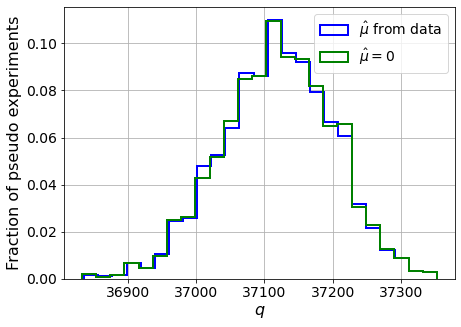

muhat mean:  1.1466420362255289e-05
Z_bins:  192.6692144340734
std Z_bins:  0.21104368745815255
Z_bins mu=0:  192.66778709146485
std Z_bins mu=0:  0.21246017398875505

--------


 FINAL RESULT:

[[0.4617263853245128, 0.5413209441458828, 0.06676040662133045, 0.4617263853245128, 0.8810033133170578], [0.9312342912696807, 0.5681566192870908, 0.01864782434690648, 0.9312342912696807, 0.8379930455718643], [1.4282132967108627, 0.677560343038031, 0.02116054790932614, 1.4279094484745045, 0.8972301666717877], [2.5897250225471993, 0.7157359055665025, 0.014819015559278467, 2.5897250225471993, 0.8524504618621702], [4.386104213683583, 0.700920904289859, 0.003562220896042576, 4.386104213683583, 0.785690708376784], [6.924903572762081, 0.6674748611534674, 0.0024148408609751637, 6.924903572762081, 0.7171114260848765], [10.728309303280605, 0.5952628184069455, 0.001831605222413671, 10.727688006683161, 0.6269106212721297], [16.18089329738362, 0.5445726395169083, 0.00013724716393617603, 16.18071087669522, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  353.23755246  319.71411323  283.90733517  243.18302822  197.93698687
  146.93885155   89.07092278   27.41422063  -36.14655047 -100.24554703]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 269.344310

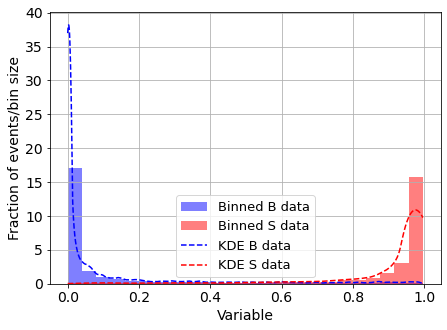

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



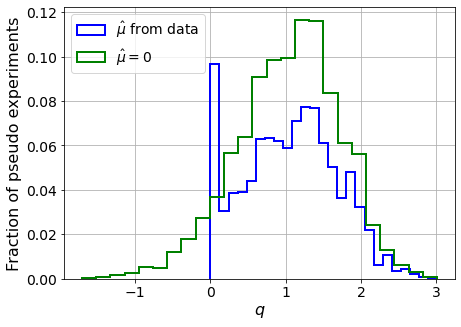

muhat mean:  -2.886150227426321
Z_bins:  1.0437168970343094
std Z_bins:  0.2980879659673042
Z_bins mu=0:  1.0437168970343094
std Z_bins mu=0:  0.32756172709965825

--------

B_expected:  643
S_expected:  4



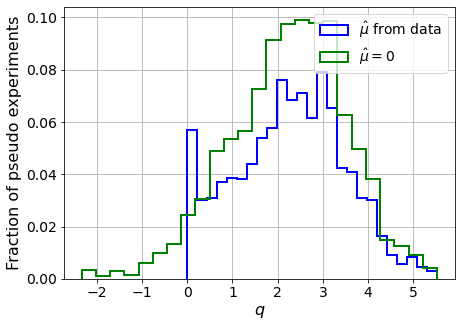

muhat mean:  -1.3501663442820833
Z_bins:  1.5237565821820358
std Z_bins:  0.3927080286707885
Z_bins mu=0:  1.5237565821820358
std Z_bins mu=0:  0.4192541933218715

--------

B_expected:  643
S_expected:  7



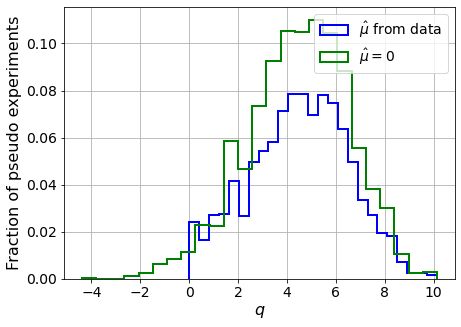

muhat mean:  -0.8193041797192918
Z_bins:  2.146426568603576
std Z_bins:  0.4667107853960707
Z_bins mu=0:  2.146426568603576
std Z_bins mu=0:  0.48686292053448044

--------

B_expected:  643
S_expected:  14



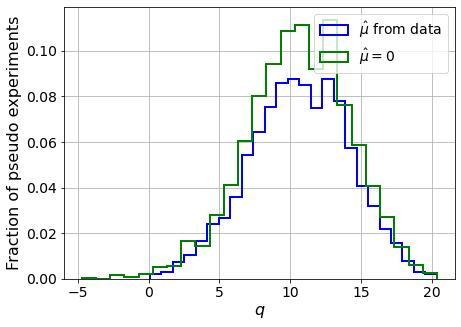

muhat mean:  -0.42217717864214954
Z_bins:  3.268330801762321
std Z_bins:  0.5394292356000587
Z_bins mu=0:  3.268330801762321
std Z_bins mu=0:  0.5533606990367539

--------

B_expected:  643
S_expected:  27



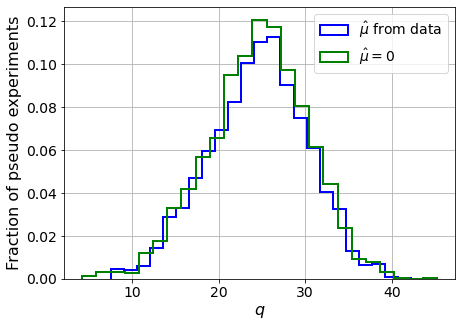

muhat mean:  -0.24284953176599997
Z_bins:  4.984421805585343
std Z_bins:  0.5713297129867378
Z_bins mu=0:  4.984421805585343
std Z_bins mu=0:  0.5789840870118479

--------

B_expected:  643
S_expected:  51



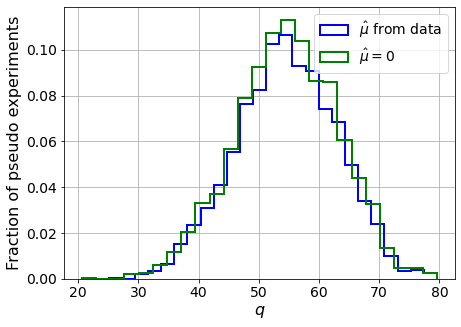

muhat mean:  -0.11142724180529141
Z_bins:  7.393345988551033
std Z_bins:  0.5697255717373813
Z_bins mu=0:  7.393345988551033
std Z_bins mu=0:  0.5739062556665081

--------

B_expected:  643
S_expected:  99



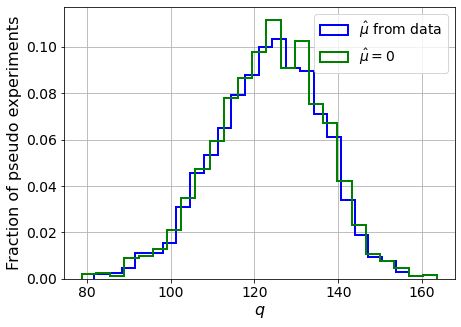

muhat mean:  -0.058059925940306
Z_bins:  11.136305038871246
std Z_bins:  0.5741922583641081
Z_bins mu=0:  11.136305038871246
std Z_bins mu=0:  0.5786123311561255

--------

B_expected:  643
S_expected:  192



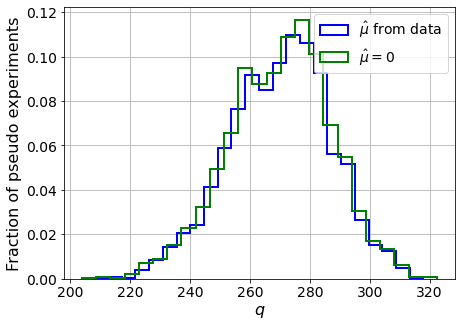

muhat mean:  -0.02894238625600123
Z_bins:  16.465671096951702
std Z_bins:  0.5171110153566719
Z_bins mu=0:  16.465671096951702
std Z_bins mu=0:  0.5197073001021338

--------

B_expected:  643
S_expected:  370



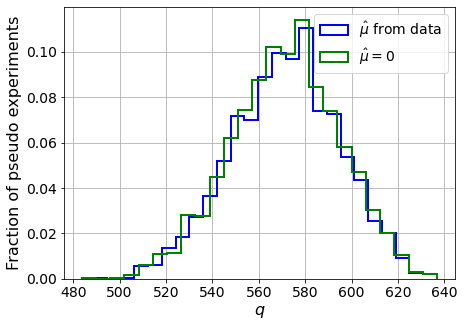

muhat mean:  -0.015104615970675087
Z_bins:  23.92341053327421
std Z_bins:  0.4858105801442545
Z_bins mu=0:  23.92341053327421
std Z_bins mu=0:  0.48738369878466725

--------

B_expected:  643
S_expected:  714



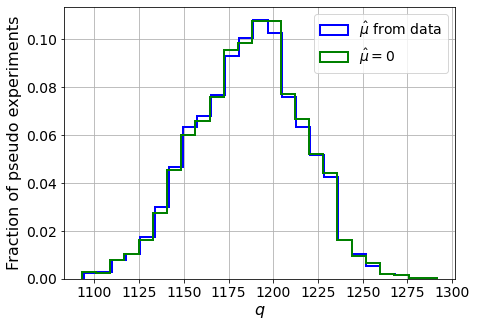

muhat mean:  -0.008115207285997808
Z_bins:  34.45763473557662
std Z_bins:  0.43579149987158855
Z_bins mu=0:  34.45763473557662
std Z_bins mu=0:  0.43701100148244026

--------

B_expected:  643
S_expected:  1378



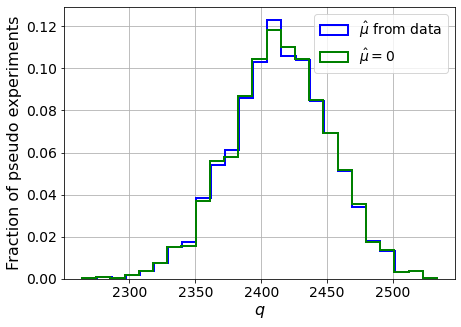

muhat mean:  -0.004134972157700838
Z_bins:  49.13552429278028
std Z_bins:  0.3860616646929229
Z_bins mu=0:  49.13552429278028
std Z_bins mu=0:  0.3868700727761798

--------

B_expected:  643
S_expected:  2661



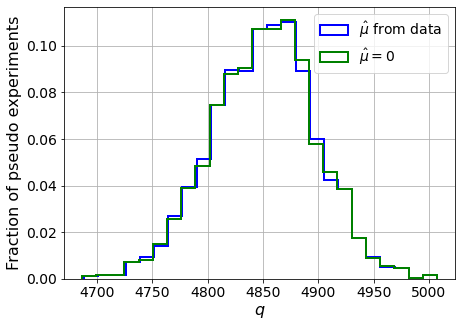

muhat mean:  -0.0023602634529733646
Z_bins:  69.66026897118095
std Z_bins:  0.3358094617720771
Z_bins mu=0:  69.66026897118095
std Z_bins mu=0:  0.3364172372768867

--------

B_expected:  643
S_expected:  5138



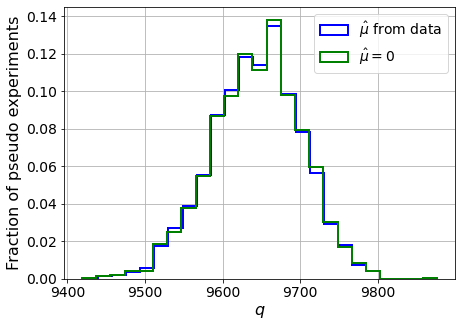

muhat mean:  -0.001097427995847442
Z_bins:  98.2157043252581
std Z_bins:  0.2957811233918706
Z_bins mu=0:  98.2157043252581
std Z_bins mu=0:  0.2961600508100333

--------

B_expected:  643
S_expected:  9921



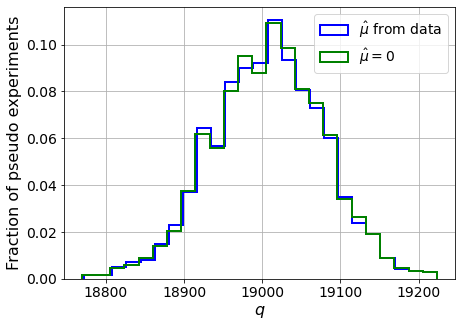

muhat mean:  -0.0005544543045786397
Z_bins:  137.87537645171014
std Z_bins:  0.25913982580723094
Z_bins mu=0:  137.87537645171014
std Z_bins mu=0:  0.259375700765024

--------

B_expected:  643
S_expected:  19154



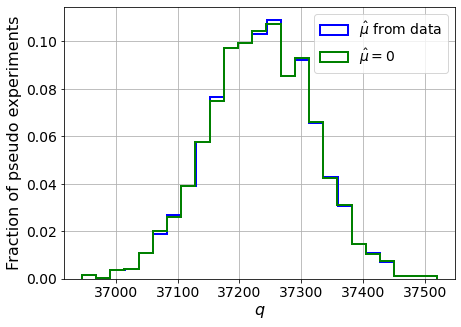

muhat mean:  -0.00030153801513899906
Z_bins:  192.96602126925944
std Z_bins:  0.218311855391957
Z_bins mu=0:  192.96602126925944
std Z_bins mu=0:  0.21846590250671905

--------


 FINAL RESULT:

[[1.0437168970343094, 0.2980879659673042, -2.886150227426321, 1.0437168970343094, 0.32756172709965825], [1.5237565821820358, 0.3927080286707885, -1.3501663442820833, 1.5237565821820358, 0.4192541933218715], [2.146426568603576, 0.4667107853960707, -0.8193041797192918, 2.146426568603576, 0.48686292053448044], [3.268330801762321, 0.5394292356000587, -0.42217717864214954, 3.268330801762321, 0.5533606990367539], [4.984421805585343, 0.5713297129867378, -0.24284953176599997, 4.984421805585343, 0.5789840870118479], [7.393345988551033, 0.5697255717373813, -0.11142724180529141, 7.393345988551033, 0.5739062556665081], [11.136305038871246, 0.5741922583641081, -0.058059925940306, 11.136305038871246, 0.5786123311561255], [16.465671096951702, 0.5171110153566719, -0.02894238625600123, 16.465671096951702, 0.519

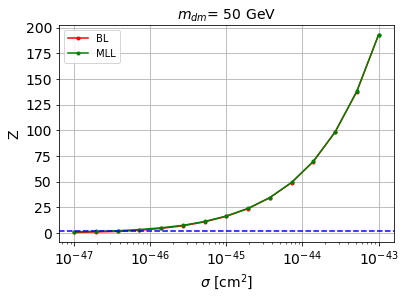


cross_BL_164:  4.202666144976076e-47
cross_BL_164_up:  2.248879651110806e-47
cross_BL_164_down:  6.610453892552438e-47

cross_MLL_164:  2.1829962098269094e-47
cross_MLL_164_up:  1.487074269280508e-47
cross_MLL_164_down:  3.6359103707814787e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


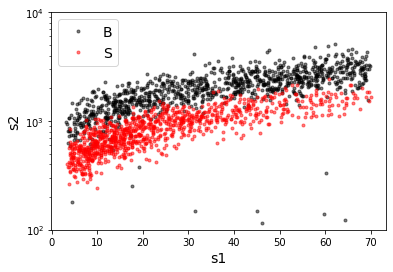

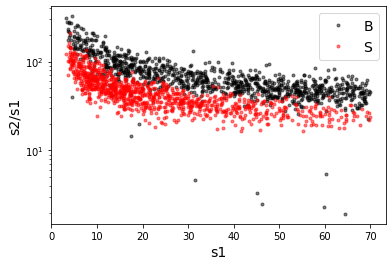

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


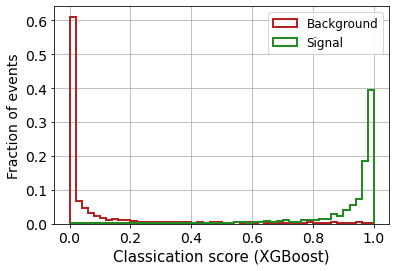


 ROC-AUC =  0.9808154769479869
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1095


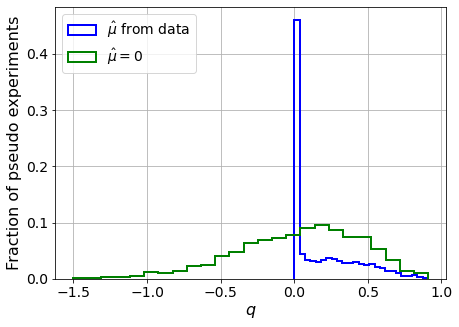

muhat mean:  0.24290097909519776
Z_bins:  0.2660609239418055
std Z_bins:  0.4266772417121299
Z_bins mu=0:  0.2660609239418055
std Z_bins mu=0:  0.7984697023427089

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


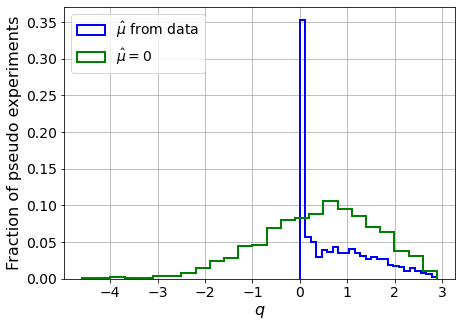

muhat mean:  0.06201076553033805
Z_bins:  0.7091617239948744
std Z_bins:  0.5373205701434661
Z_bins mu=0:  0.7091617239948744
std Z_bins mu=0:  0.8515417222526677

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


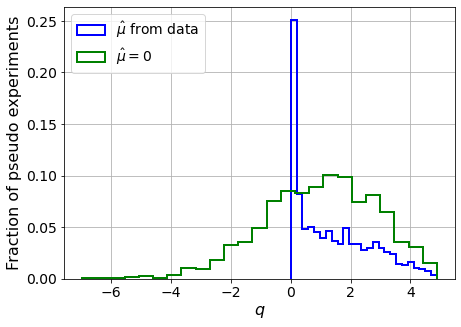

muhat mean:  0.07261958928311092
Z_bins:  1.0476375649372232
std Z_bins:  0.6167170384951305
Z_bins mu=0:  1.0469034383104077
std Z_bins mu=0:  0.8921139181586139

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


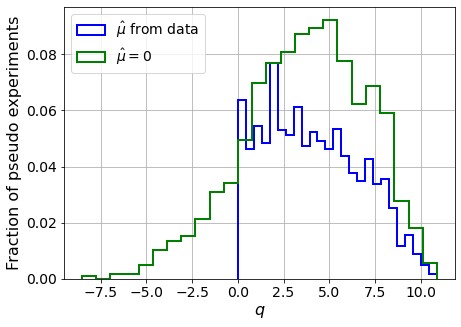

muhat mean:  0.025304611399308067
Z_bins:  1.9748241796852204
std Z_bins:  0.6637849278269836
Z_bins mu=0:  1.9748241796852204
std Z_bins mu=0:  0.8355727034626849

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


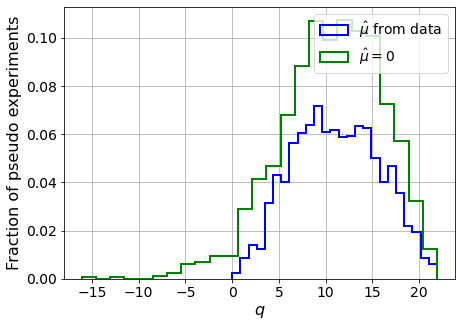

muhat mean:  0.01877087268389316
Z_bins:  3.318322379522958
std Z_bins:  0.6894385998792218
Z_bins mu=0:  3.3183170394692496
std Z_bins mu=0:  0.8109563479905677

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


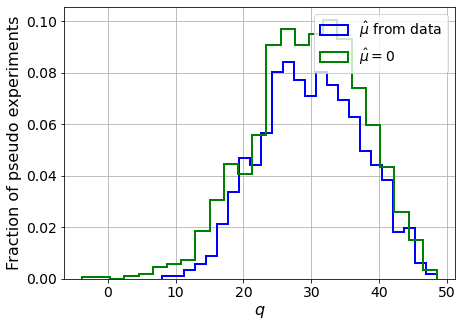

muhat mean:  0.00916316772049112
Z_bins:  5.46855524346023
std Z_bins:  0.6644918981312307
Z_bins mu=0:  5.4672909710457676
std Z_bins mu=0:  0.7307431821558036

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


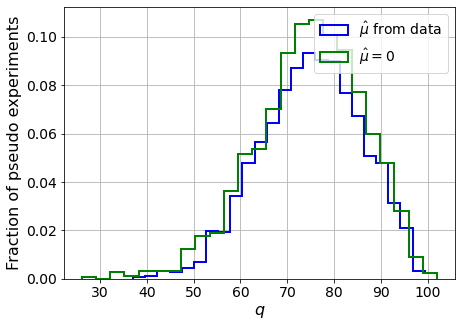

muhat mean:  0.0028912408343116773
Z_bins:  8.69005203642567
std Z_bins:  0.6171437985355114
Z_bins mu=0:  8.688635933319222
std Z_bins mu=0:  0.6626407234352301

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


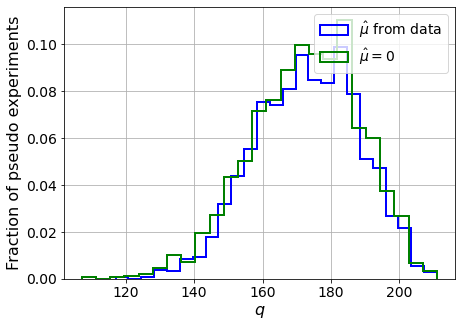

muhat mean:  0.001977368634377249
Z_bins:  13.170239704612289
std Z_bins:  0.5713164468741445
Z_bins mu=0:  13.169386531717178
std Z_bins mu=0:  0.5999105367478499

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


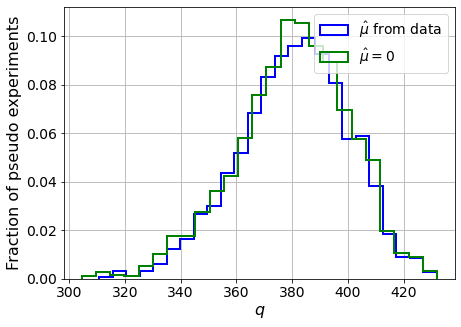

muhat mean:  0.001105325251435664
Z_bins:  19.531365839127176
std Z_bins:  0.5034829786241977
Z_bins mu=0:  19.529941771786454
std Z_bins mu=0:  0.522345743373192

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


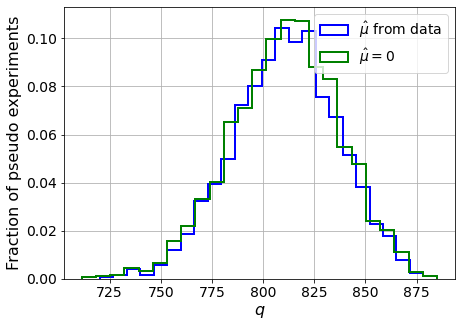

muhat mean:  0.0005136687184541193
Z_bins:  28.48524354968243
std Z_bins:  0.4509363472777924
Z_bins mu=0:  28.484195828285564
std Z_bins mu=0:  0.4624459029786202

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


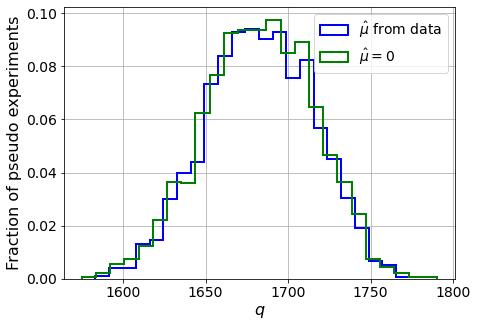

muhat mean:  0.00017825972294403366
Z_bins:  41.029372340803114
std Z_bins:  0.39695133030545626
Z_bins mu=0:  41.02787418635776
std Z_bins mu=0:  0.4037117347222817

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


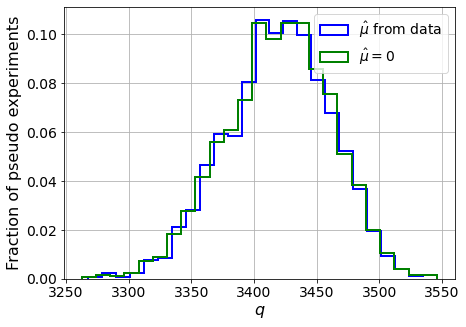

muhat mean:  0.0001336655725296765
Z_bins:  58.49187175238441
std Z_bins:  0.3559152615610614
Z_bins mu=0:  58.49059932602356
std Z_bins mu=0:  0.36145150474322385

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1205


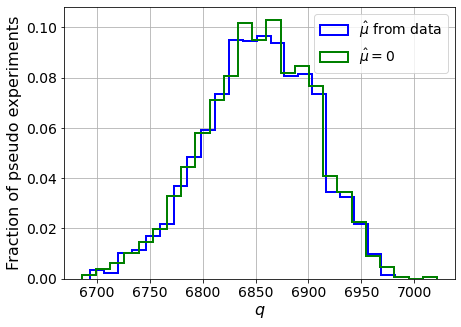

muhat mean:  0.00010217435399994828
Z_bins:  82.79362229708345
std Z_bins:  0.31271843541415895
Z_bins mu=0:  82.79267214672265
std Z_bins mu=0:  0.31649192078038896

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


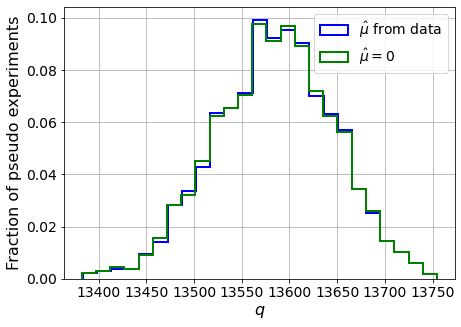

muhat mean:  1.2558446746927477e-05
Z_bins:  116.56161385232099
std Z_bins:  0.26694721469469257
Z_bins mu=0:  116.56147267014416
std Z_bins mu=0:  0.26886280394011086

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


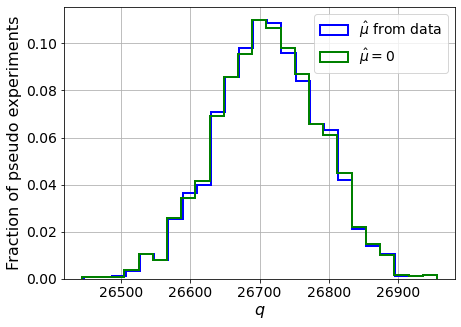

muhat mean:  2.4078805272326487e-05
Z_bins:  163.44026975913962
std Z_bins:  0.2290020239777555
Z_bins mu=0:  163.4396519365353
std Z_bins mu=0:  0.2304877837586162

--------


 FINAL RESULT:

[[0.2660609239418055, 0.4266772417121299, 0.24290097909519776, 0.2660609239418055, 0.7984697023427089], [0.7091617239948744, 0.5373205701434661, 0.06201076553033805, 0.7091617239948744, 0.8515417222526677], [1.0476375649372232, 0.6167170384951305, 0.07261958928311092, 1.0469034383104077, 0.8921139181586139], [1.9748241796852204, 0.6637849278269836, 0.025304611399308067, 1.9748241796852204, 0.8355727034626849], [3.318322379522958, 0.6894385998792218, 0.01877087268389316, 3.3183170394692496, 0.8109563479905677], [5.46855524346023, 0.6644918981312307, 0.00916316772049112, 5.4672909710457676, 0.7307431821558036], [8.69005203642567, 0.6171437985355114, 0.0028912408343116773, 8.688635933319222, 0.6626407234352301], [13.170239704612289, 0.5713164468741445, 0.001977368634377249, 13.169386531717178, 0.599

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 339.97915587 299.68850869 256.26849826 210.94055503
 158.7248299   99.92480603  36.39624135 -27.67972585 -96.68605783]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 301.17795744 279.65937409 248.67410874 210.7841261
 161.

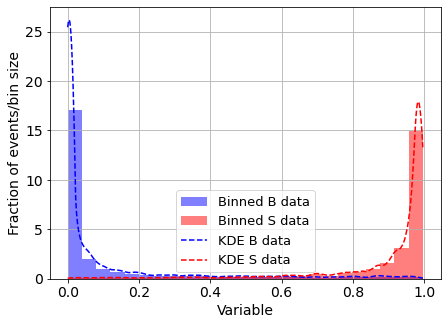

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



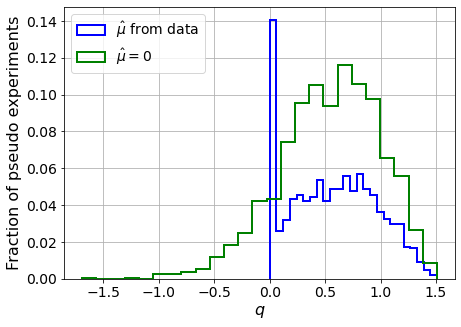

muhat mean:  -7.184086479980886
Z_bins:  0.7596001160969492
std Z_bins:  0.2533371470872612
Z_bins mu=0:  0.7596001160969492
std Z_bins mu=0:  0.29587636613994434

--------

B_expected:  643
S_expected:  3



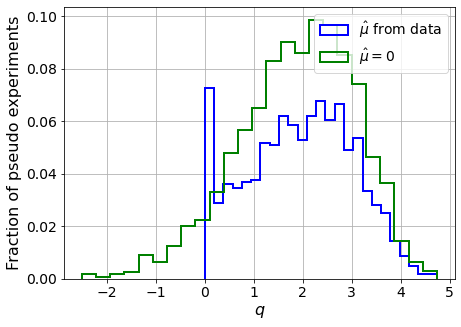

muhat mean:  -2.252810275831719
Z_bins:  1.4190209841996926
std Z_bins:  0.37866114057072126
Z_bins mu=0:  1.4190209841996926
std Z_bins mu=0:  0.4177473791350728

--------

B_expected:  643
S_expected:  5



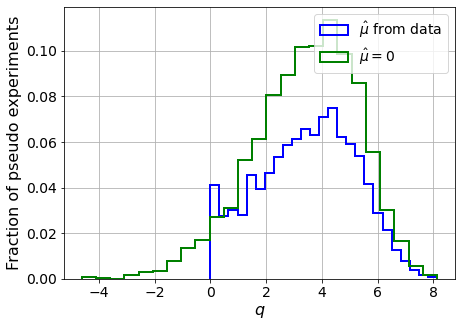

muhat mean:  -1.2895740123939023
Z_bins:  1.895680431986419
std Z_bins:  0.45438037621064153
Z_bins mu=0:  1.895680431986419
std Z_bins mu=0:  0.4957025961394717

--------

B_expected:  643
S_expected:  10



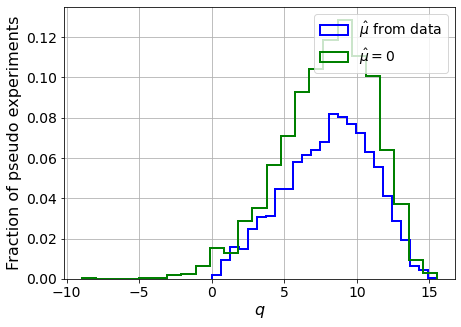

muhat mean:  -0.6844021378385137
Z_bins:  2.895050836554096
std Z_bins:  0.5176891054844
Z_bins mu=0:  2.895050836554096
std Z_bins mu=0:  0.5513549115552168

--------

B_expected:  643
S_expected:  19



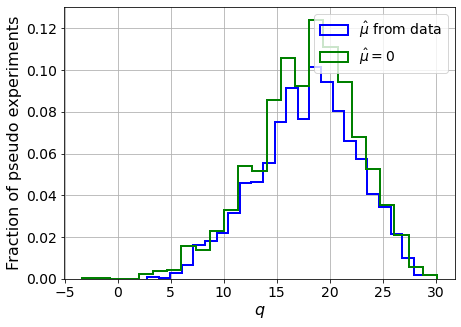

muhat mean:  -0.352390449988849
Z_bins:  4.26718659668449
std Z_bins:  0.5428267300690224
Z_bins mu=0:  4.26718659668449
std Z_bins mu=0:  0.5611967578748253

--------

B_expected:  643
S_expected:  37



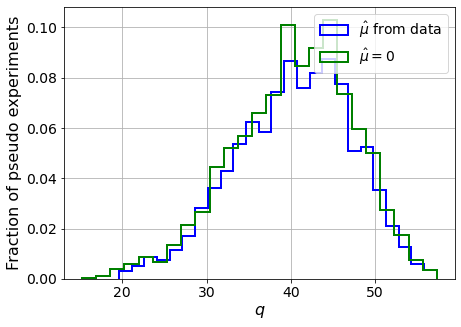

muhat mean:  -0.1780758647404773
Z_bins:  6.3907135927640795
std Z_bins:  0.5422829001522139
Z_bins mu=0:  6.3907135927640795
std Z_bins mu=0:  0.5542605735394813

--------

B_expected:  643
S_expected:  72



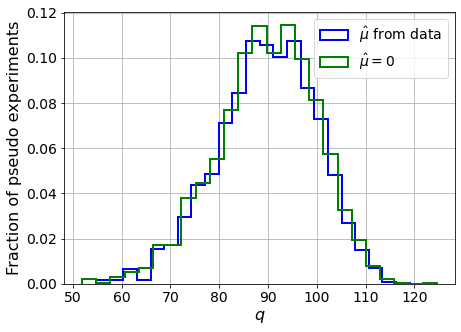

muhat mean:  -0.11244328133356675
Z_bins:  9.492244793534352
std Z_bins:  0.5299424671448623
Z_bins mu=0:  9.492244793534352
std Z_bins mu=0:  0.5387376869605747

--------

B_expected:  643
S_expected:  139



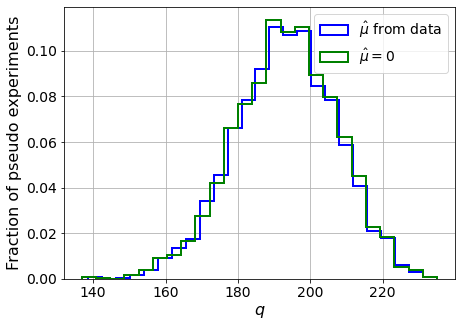

muhat mean:  -0.05749355094446769
Z_bins:  13.914053441366573
std Z_bins:  0.5033948372080995
Z_bins mu=0:  13.914053441366573
std Z_bins mu=0:  0.5079546015715497

--------

B_expected:  643
S_expected:  268



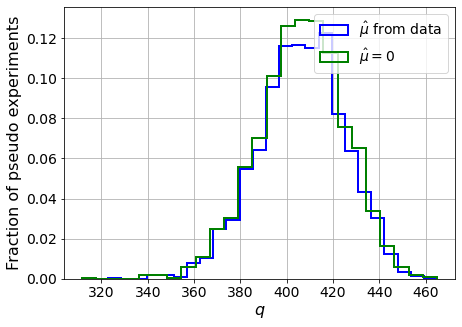

muhat mean:  -0.02624106315059676
Z_bins:  20.17489613259499
std Z_bins:  0.46117729057748896
Z_bins mu=0:  20.17489613259499
std Z_bins mu=0:  0.46515607372669343

--------

B_expected:  643
S_expected:  518



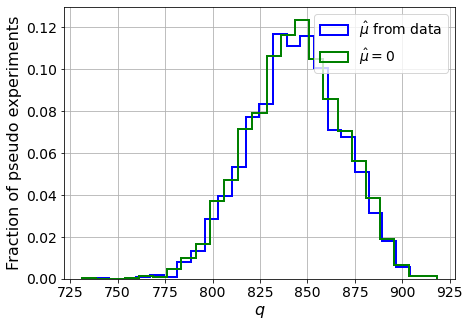

muhat mean:  -0.013705708572433422
Z_bins:  29.051648229601085
std Z_bins:  0.4252014187340158
Z_bins mu=0:  29.051648229601085
std Z_bins mu=0:  0.42750136459089205

--------

B_expected:  643
S_expected:  1001



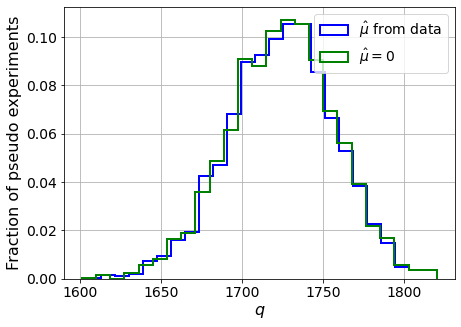

muhat mean:  -0.00797683059756064
Z_bins:  41.542190078313695
std Z_bins:  0.39279400716717616
Z_bins mu=0:  41.54130131003771
std Z_bins mu=0:  0.394147539411742

--------

B_expected:  643
S_expected:  1932



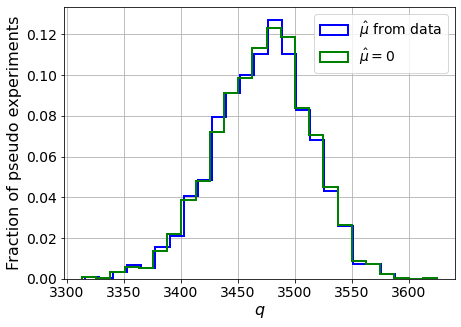

muhat mean:  -0.0038547182099226396
Z_bins:  58.933193582187954
std Z_bins:  0.3548074448642702
Z_bins mu=0:  58.933193582187954
std Z_bins mu=0:  0.3558672911019259

--------

B_expected:  643
S_expected:  3730



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


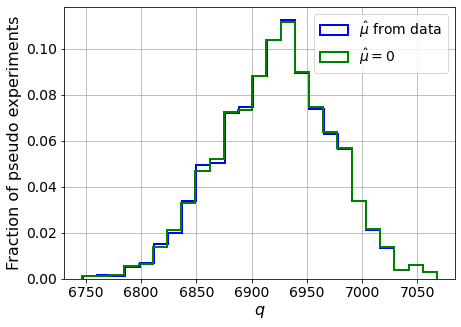

muhat mean:  -0.0020548465787265263
Z_bins:  83.21087693092319
std Z_bins:  0.30505590987696785
Z_bins mu=0:  83.21087693092319
std Z_bins mu=0:  0.305670215905793

--------

B_expected:  643
S_expected:  7201



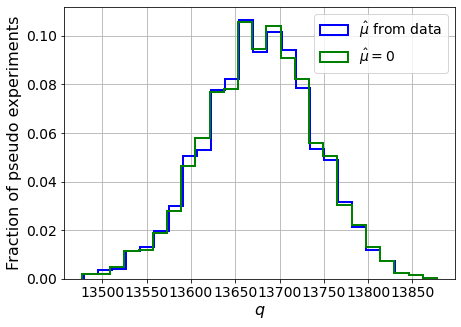

muhat mean:  -0.0011332020297875793
Z_bins:  116.96160371113088
std Z_bins:  0.2679163492540303
Z_bins mu=0:  116.96160371113088
std Z_bins mu=0:  0.2683509681731883

--------

B_expected:  643
S_expected:  13904



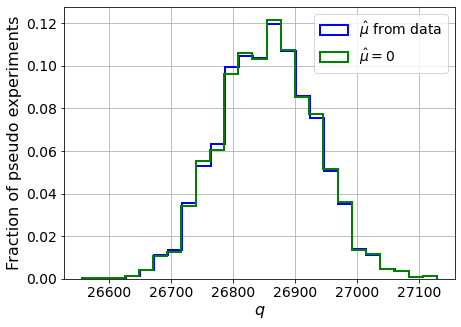

muhat mean:  -0.0005155984859158902
Z_bins:  163.8822245372105
std Z_bins:  0.23663818260205946
Z_bins mu=0:  163.8818769242687
std Z_bins mu=0:  0.23686012125292397

--------


 FINAL RESULT:

[[0.7596001160969492, 0.2533371470872612, -7.184086479980886, 0.7596001160969492, 0.29587636613994434], [1.4190209841996926, 0.37866114057072126, -2.252810275831719, 1.4190209841996926, 0.4177473791350728], [1.895680431986419, 0.45438037621064153, -1.2895740123939023, 1.895680431986419, 0.4957025961394717], [2.895050836554096, 0.5176891054844, -0.6844021378385137, 2.895050836554096, 0.5513549115552168], [4.26718659668449, 0.5428267300690224, -0.352390449988849, 4.26718659668449, 0.5611967578748253], [6.3907135927640795, 0.5422829001522139, -0.1780758647404773, 6.3907135927640795, 0.5542605735394813], [9.492244793534352, 0.5299424671448623, -0.11244328133356675, 9.492244793534352, 0.5387376869605747], [13.914053441366573, 0.5033948372080995, -0.05749355094446769, 13.914053441366573, 0.50795460157

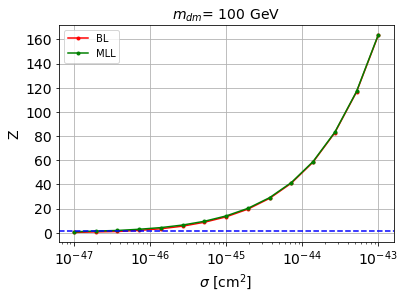


cross_BL_164:  5.675003860508817e-47
cross_BL_164_up:  3.6667916202942854e-47
cross_BL_164_down:  8.481310114453303e-47

cross_MLL_164:  2.619215584977566e-47
cross_MLL_164_up:  1.6001261805001068e-47
cross_MLL_164_down:  4.2862529175084056e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


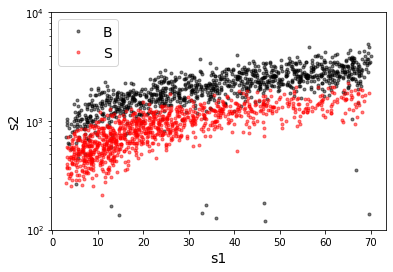

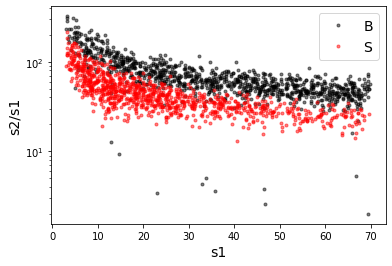

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


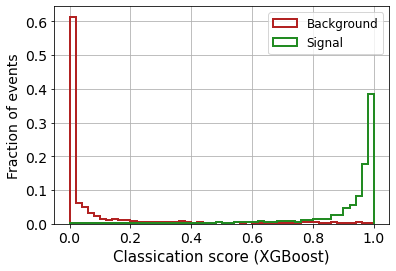


 ROC-AUC =  0.9795167050918349
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0885


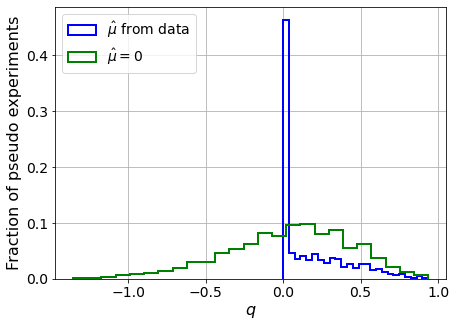

muhat mean:  0.15929235799311253
Z_bins:  0.2553534289527419
std Z_bins:  0.436283591870921
Z_bins mu=0:  0.2553534289527419
std Z_bins mu=0:  0.7865199504960569

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.076


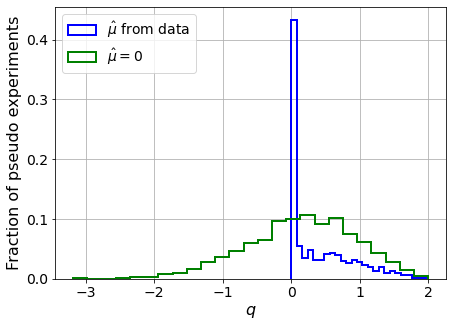

muhat mean:  0.11810424106472472
Z_bins:  0.43368362155009293
std Z_bins:  0.547679018637998
Z_bins mu=0:  0.43345589971851867
std Z_bins mu=0:  0.9136453417050218

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0795


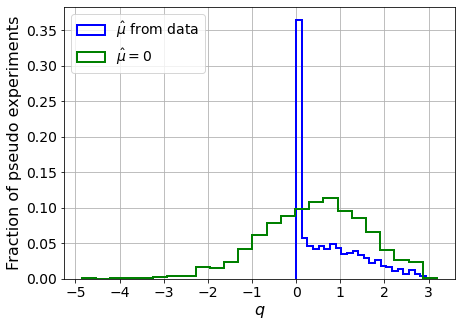

muhat mean:  -0.0034564990738435203
Z_bins:  0.7000816350622189
std Z_bins:  0.5408307722339077
Z_bins mu=0:  0.7000816350622189
std Z_bins mu=0:  0.8249474192695636

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0755


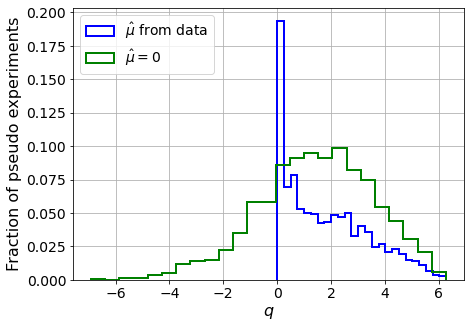

muhat mean:  0.01121197650612515
Z_bins:  1.237842056255047
std Z_bins:  0.6307852669839764
Z_bins mu=0:  1.237842056255047
std Z_bins mu=0:  0.8557302860263768

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.089


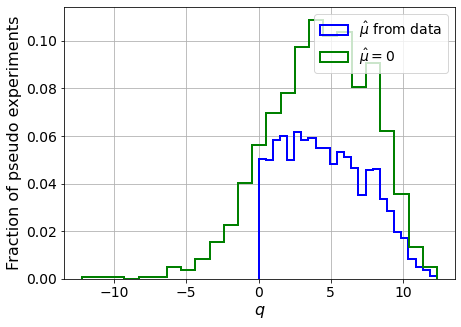

muhat mean:  0.005578835997587673
Z_bins:  2.101390068355387
std Z_bins:  0.6765388516841572
Z_bins mu=0:  2.101390068355387
std Z_bins mu=0:  0.8343874078774264

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0895


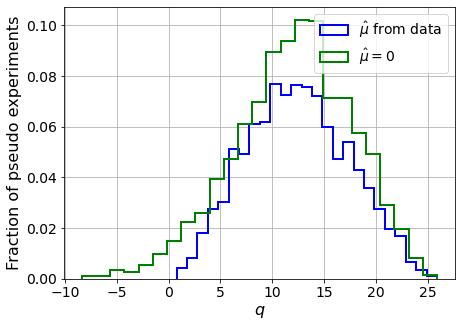

muhat mean:  0.013100872731602098
Z_bins:  3.508388421280452
std Z_bins:  0.6992266367151317
Z_bins mu=0:  3.5083781695040246
std Z_bins mu=0:  0.8036553145328128

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


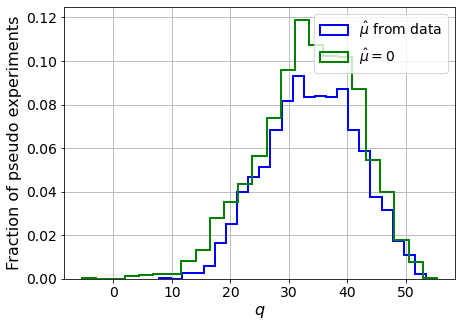

muhat mean:  0.0015229825584837904
Z_bins:  5.8271060818480755
std Z_bins:  0.667309583128815
Z_bins mu=0:  5.8271060818480755
std Z_bins mu=0:  0.7288964157631036

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.089


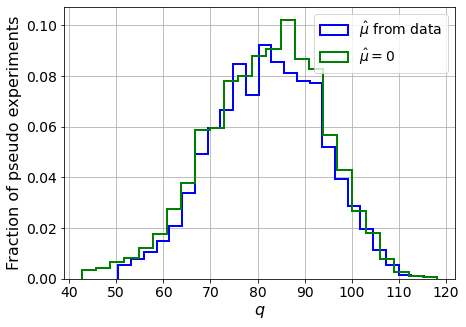

muhat mean:  0.004932711490483217
Z_bins:  9.08269175517522
std Z_bins:  0.6352506819344352
Z_bins mu=0:  9.081064082036699
std Z_bins mu=0:  0.6778815326828714

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0715


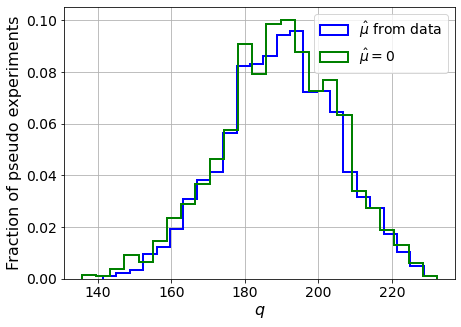

muhat mean:  0.0019812446300043166
Z_bins:  13.775960105969904
std Z_bins:  0.5600319239830505
Z_bins mu=0:  13.775933698246694
std Z_bins mu=0:  0.585441034900302

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.084


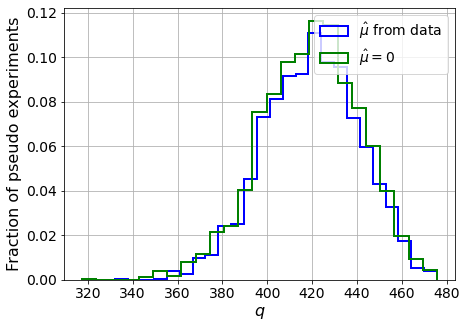

muhat mean:  0.0006851590389100569
Z_bins:  20.498266816733256
std Z_bins:  0.5184705298166742
Z_bins mu=0:  20.497004487583414
std Z_bins mu=0:  0.535819018917431

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.081


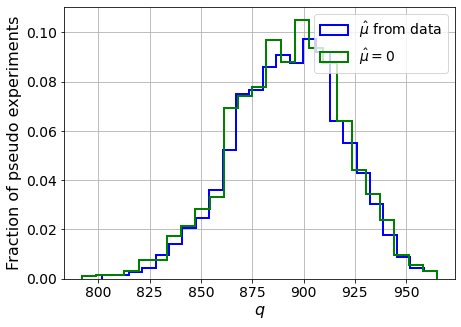

muhat mean:  0.0002705721431788675
Z_bins:  29.892746827821234
std Z_bins:  0.4491728768329079
Z_bins mu=0:  29.892503251908973
std Z_bins mu=0:  0.46035965979431864

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0715


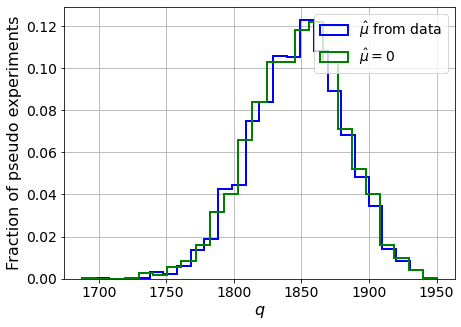

muhat mean:  1.9656803947480466e-05
Z_bins:  42.99910298980122
std Z_bins:  0.40095474714345625
Z_bins mu=0:  42.998823675046346
std Z_bins mu=0:  0.4081285809345773

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.085


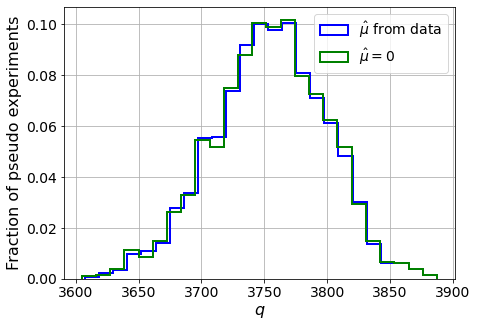

muhat mean:  6.177343331699895e-05
Z_bins:  61.285515396292965
std Z_bins:  0.3632230829410006
Z_bins mu=0:  61.284450629132785
std Z_bins mu=0:  0.36795463301707976

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.086


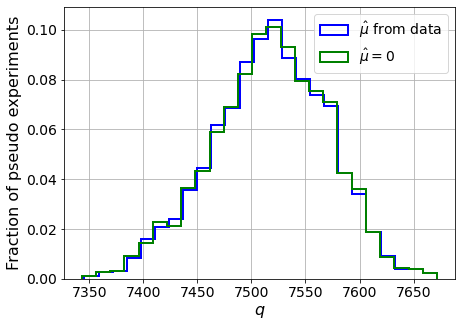

muhat mean:  6.493285742189266e-05
Z_bins:  86.70982161825204
std Z_bins:  0.30874604954958507
Z_bins mu=0:  86.70955843696073
std Z_bins mu=0:  0.3119935330677049

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0785


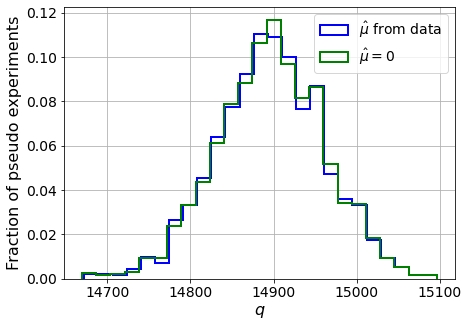

muhat mean:  1.807409696568887e-05
Z_bins:  122.0548321842848
std Z_bins:  0.26475212699825473
Z_bins mu=0:  122.05409289205659
std Z_bins mu=0:  0.266739862412954

--------


 FINAL RESULT:

[[0.2553534289527419, 0.436283591870921, 0.15929235799311253, 0.2553534289527419, 0.7865199504960569], [0.43368362155009293, 0.547679018637998, 0.11810424106472472, 0.43345589971851867, 0.9136453417050218], [0.7000816350622189, 0.5408307722339077, -0.0034564990738435203, 0.7000816350622189, 0.8249474192695636], [1.237842056255047, 0.6307852669839764, 0.01121197650612515, 1.237842056255047, 0.8557302860263768], [2.101390068355387, 0.6765388516841572, 0.005578835997587673, 2.101390068355387, 0.8343874078774264], [3.508388421280452, 0.6992266367151317, 0.013100872731602098, 3.5083781695040246, 0.8036553145328128], [5.8271060818480755, 0.667309583128815, 0.0015229825584837904, 5.8271060818480755, 0.7288964157631036], [9.08269175517522, 0.6352506819344352, 0.004932711490483217, 9.081064082036699, 0.677

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  316.318351    279.3458945   239.54392628  197.71586188
  145.817613     89.46426107   27.26869036  -37.537436   -100.36904547]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 283.95309701 261.65711616 232.368871

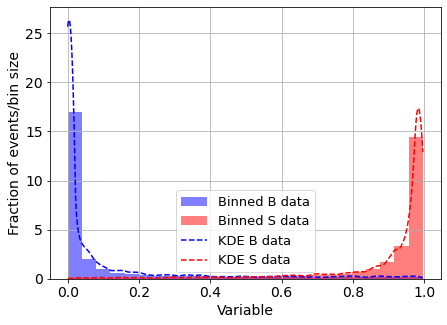

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



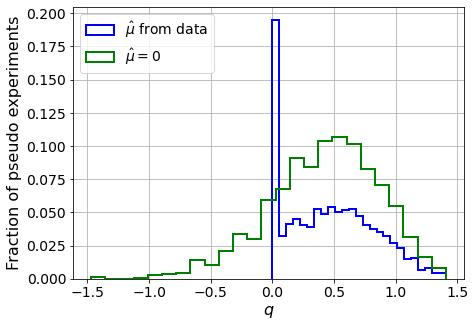

muhat mean:  -4.885122186765991
Z_bins:  0.6744963780499218
std Z_bins:  0.26557354599300204
Z_bins mu=0:  0.6744963780499218
std Z_bins mu=0:  0.325566651415939

--------

B_expected:  643
S_expected:  2



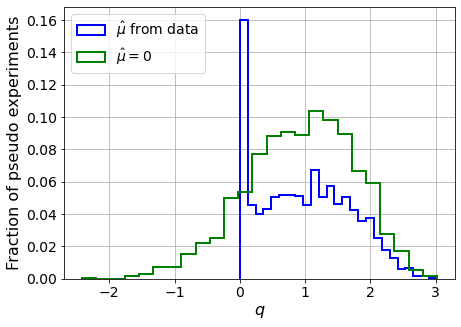

muhat mean:  -2.4126496149761016
Z_bins:  0.9911326501857429
std Z_bins:  0.3554479401390565
Z_bins mu=0:  0.9911326501857429
std Z_bins mu=0:  0.4155779841757169

--------

B_expected:  643
S_expected:  3



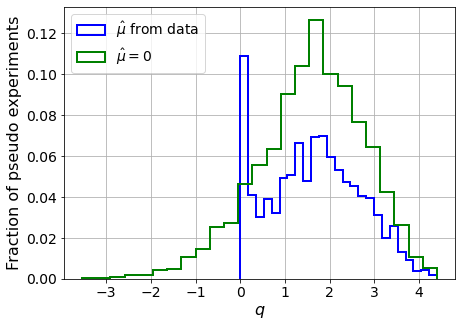

muhat mean:  -1.7287521842039046
Z_bins:  1.2961391763209138
std Z_bins:  0.39879375878302226
Z_bins mu=0:  1.2961391763209138
std Z_bins mu=0:  0.45970783398289666

--------

B_expected:  643
S_expected:  6



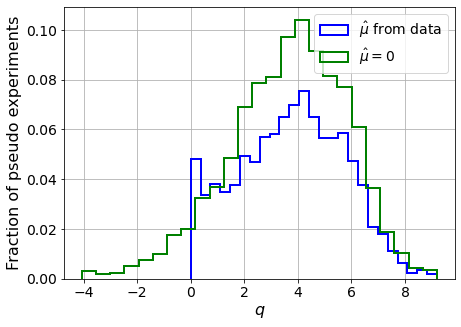

muhat mean:  -0.8402308404887586
Z_bins:  1.9601592737515041
std Z_bins:  0.50283369347799
Z_bins mu=0:  1.9601592737515041
std Z_bins mu=0:  0.5567559625715647

--------

B_expected:  643
S_expected:  11



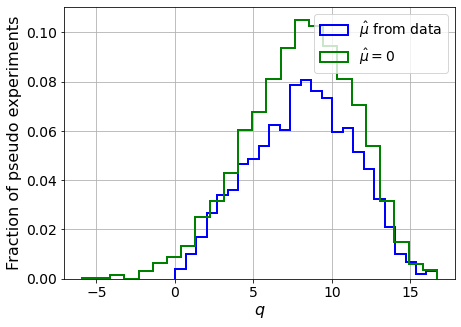

muhat mean:  -0.4674757940565028
Z_bins:  2.870812971243639
std Z_bins:  0.5690712663370934
Z_bins mu=0:  2.870812971243639
std Z_bins mu=0:  0.603526317820236

--------

B_expected:  643
S_expected:  21



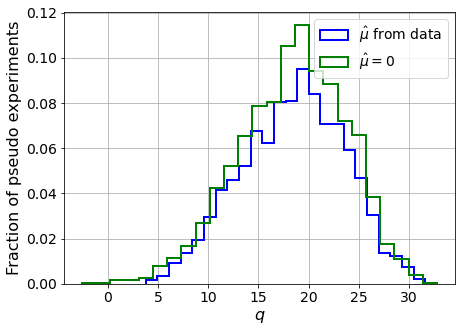

muhat mean:  -0.2373769145982814
Z_bins:  4.328031155599649
std Z_bins:  0.5906128725860267
Z_bins mu=0:  4.328031155599649
std Z_bins mu=0:  0.6128907967718397

--------

B_expected:  643
S_expected:  41



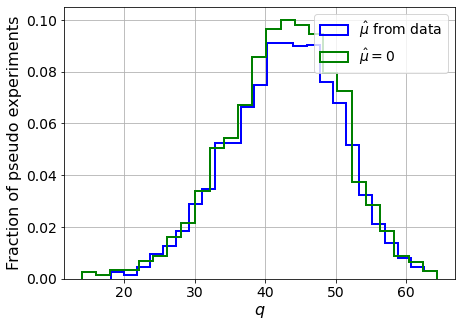

muhat mean:  -0.10566620116179239
Z_bins:  6.565407971229244
std Z_bins:  0.5983015672739963
Z_bins mu=0:  6.565407971229244
std Z_bins mu=0:  0.6153869708103107

--------

B_expected:  643
S_expected:  79



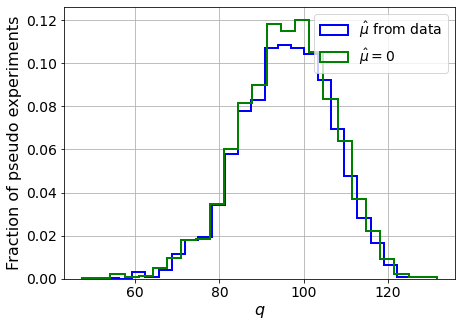

muhat mean:  -0.06410112217256517
Z_bins:  9.81383918172271
std Z_bins:  0.5606486583136223
Z_bins mu=0:  9.81383918172271
std Z_bins mu=0:  0.571628204375775

--------

B_expected:  643
S_expected:  152



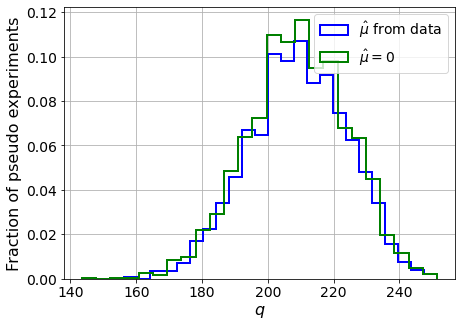

muhat mean:  -0.033160956081153006
Z_bins:  14.46604230298881
std Z_bins:  0.5203061249337115
Z_bins mu=0:  14.46604230298881
std Z_bins mu=0:  0.5259048644381171

--------

B_expected:  643
S_expected:  294



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


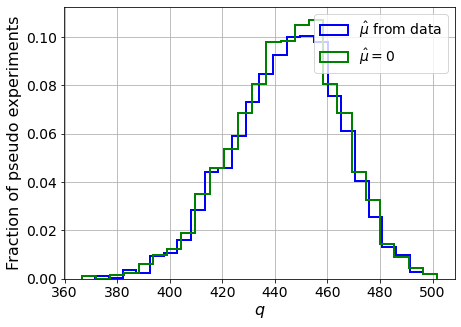

muhat mean:  -0.016385381824548385
Z_bins:  21.113856351012334
std Z_bins:  0.48495957623055097
Z_bins mu=0:  21.113856351012334
std Z_bins mu=0:  0.4890233386876151

--------

B_expected:  643
S_expected:  567



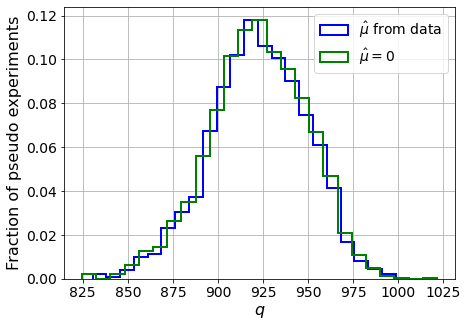

muhat mean:  -0.008115908397577485
Z_bins:  30.37204347756759
std Z_bins:  0.440848615781124
Z_bins mu=0:  30.37204347756759
std Z_bins mu=0:  0.44366797236905214

--------

B_expected:  643
S_expected:  1094



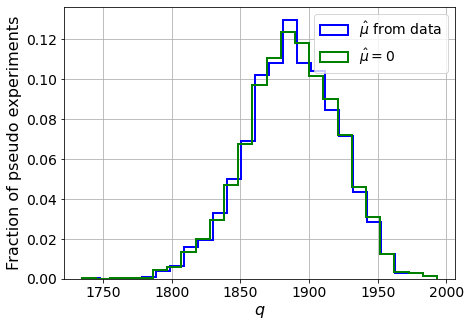

muhat mean:  -0.004651398603951426
Z_bins:  43.453394625411974
std Z_bins:  0.3894332569959343
Z_bins mu=0:  43.453394625411974
std Z_bins mu=0:  0.3912098736081415

--------

B_expected:  643
S_expected:  2113



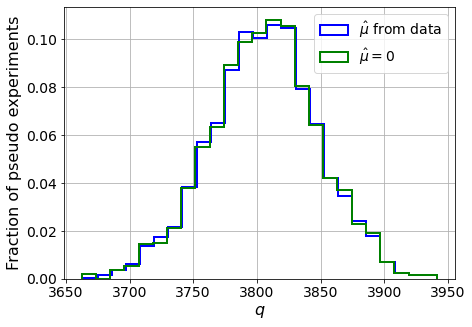

muhat mean:  -0.0022509398203560465
Z_bins:  61.700331271062964
std Z_bins:  0.34070967877010616
Z_bins mu=0:  61.700240984793346
std Z_bins mu=0:  0.3420879902988644

--------

B_expected:  643
S_expected:  4079



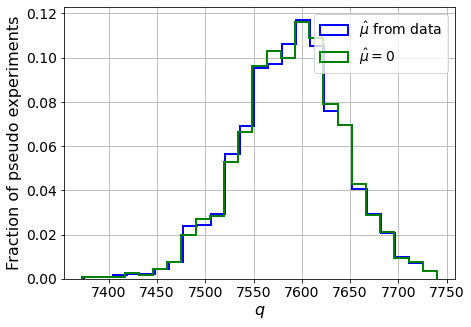

muhat mean:  -0.0012233198821435876
Z_bins:  87.12643256395104
std Z_bins:  0.308632179774082
Z_bins mu=0:  87.12643256395104
std Z_bins mu=0:  0.3095911529982561

--------

B_expected:  643
S_expected:  7876



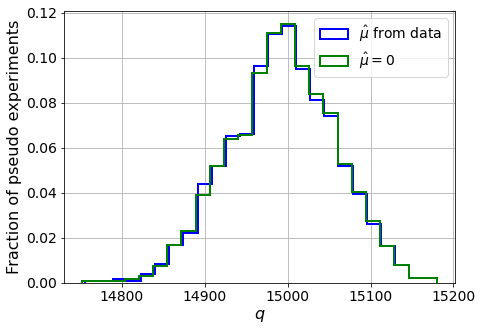

muhat mean:  -0.0005865318956090975
Z_bins:  122.45359865038837
std Z_bins:  0.26093735398653933
Z_bins mu=0:  122.45359649624757
std Z_bins mu=0:  0.2614883271297405

--------


 FINAL RESULT:

[[0.6744963780499218, 0.26557354599300204, -4.885122186765991, 0.6744963780499218, 0.325566651415939], [0.9911326501857429, 0.3554479401390565, -2.4126496149761016, 0.9911326501857429, 0.4155779841757169], [1.2961391763209138, 0.39879375878302226, -1.7287521842039046, 1.2961391763209138, 0.45970783398289666], [1.9601592737515041, 0.50283369347799, -0.8402308404887586, 1.9601592737515041, 0.5567559625715647], [2.870812971243639, 0.5690712663370934, -0.4674757940565028, 2.870812971243639, 0.603526317820236], [4.328031155599649, 0.5906128725860267, -0.2373769145982814, 4.328031155599649, 0.6128907967718397], [6.565407971229244, 0.5983015672739963, -0.10566620116179239, 6.565407971229244, 0.6153869708103107], [9.81383918172271, 0.5606486583136223, -0.06410112217256517, 9.81383918172271, 0.571628204

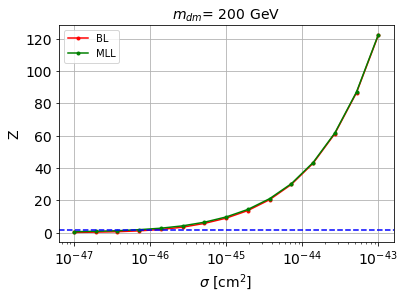


cross_BL_164:  9.776900660877054e-47
cross_BL_164_up:  6.099654053858697e-47
cross_BL_164_down:  1.5390853319873301e-46

cross_MLL_164:  5.710761846743838e-47
cross_MLL_164_up:  3.556262489424208e-47
cross_MLL_164_down:  8.297591773356114e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


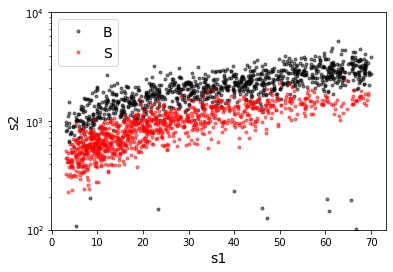

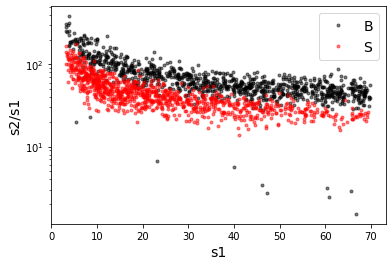

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


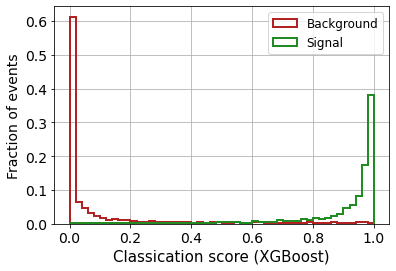


 ROC-AUC =  0.9802547538333223
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


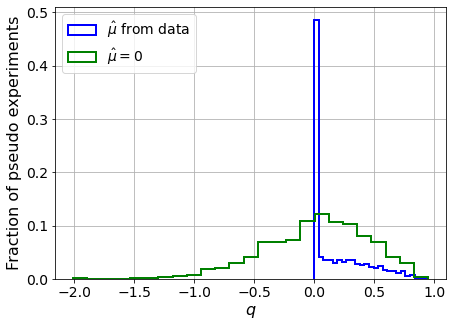

muhat mean:  0.2929817425252646
Z_bins:  0.2228530938512859
std Z_bins:  0.5111327313079088
Z_bins mu=0:  0.22277603508404278
std Z_bins mu=0:  0.9395707613280534

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


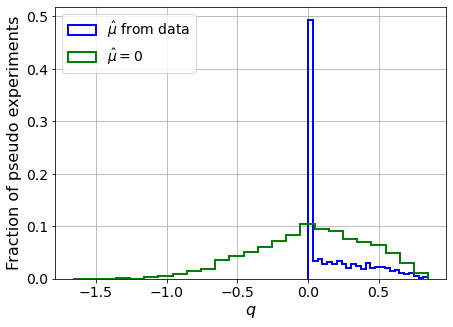

muhat mean:  0.363007155023725
Z_bins:  0.19949487216607795
std Z_bins:  0.5555806778333106
Z_bins mu=0:  0.19746249367320823
std Z_bins mu=0:  1.0315690792705683

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


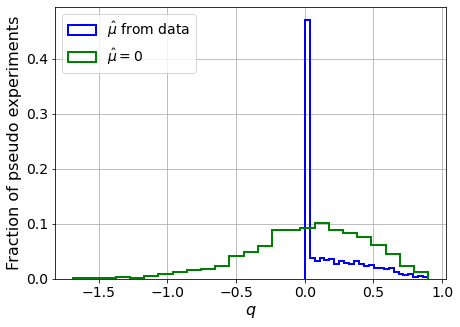

muhat mean:  0.20638757732934945
Z_bins:  0.2574022034136879
std Z_bins:  0.4476548580617513
Z_bins mu=0:  0.2574022034136879
std Z_bins mu=0:  0.8201265987272089

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.106


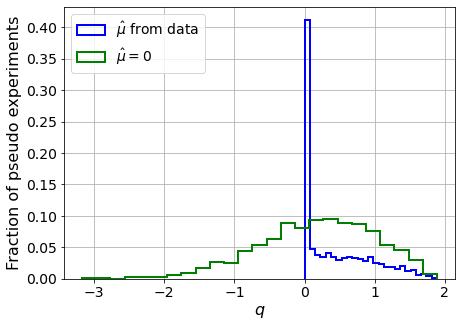

muhat mean:  0.05500806763049697
Z_bins:  0.48417851608565676
std Z_bins:  0.5095005921396428
Z_bins mu=0:  0.48417851608565676
std Z_bins mu=0:  0.8432195959638011

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


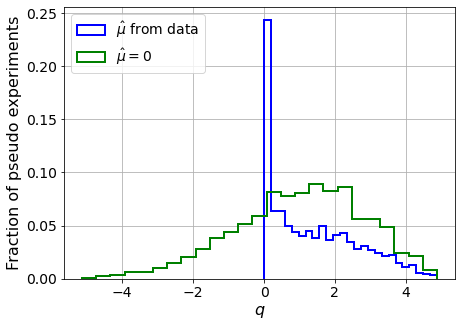

muhat mean:  0.04873996375130964
Z_bins:  1.0698491502174272
std Z_bins:  0.5893314744749143
Z_bins mu=0:  1.0698491502174272
std Z_bins mu=0:  0.8479602836406162

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


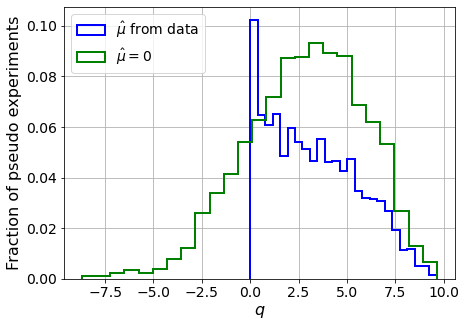

muhat mean:  0.0455889834633088
Z_bins:  1.7478458530132255
std Z_bins:  0.6664908894439329
Z_bins mu=0:  1.746685431555664
std Z_bins mu=0:  0.8681140614715616

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


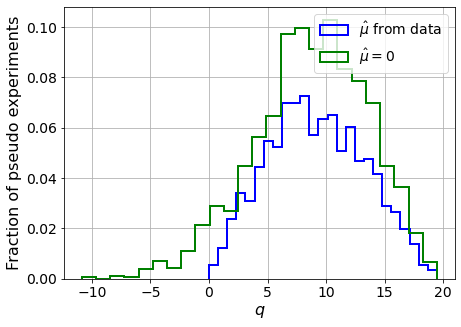

muhat mean:  0.017572942255421782
Z_bins:  2.9975379307964953
std Z_bins:  0.6843004835399839
Z_bins mu=0:  2.9975183613690426
std Z_bins mu=0:  0.8058828918398605

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


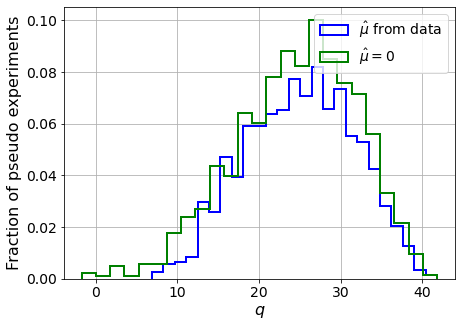

muhat mean:  0.008568621075279722
Z_bins:  5.030274931300852
std Z_bins:  0.6611633090686087
Z_bins mu=0:  5.029780872818907
std Z_bins mu=0:  0.7359750423746627

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1105


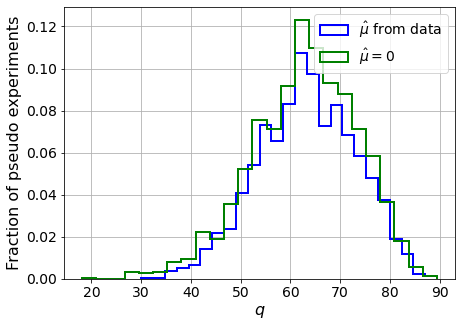

muhat mean:  0.0033950233721912375
Z_bins:  7.955238207926872
std Z_bins:  0.614092501725838
Z_bins mu=0:  7.955232012384988
std Z_bins mu=0:  0.6594850978415953

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


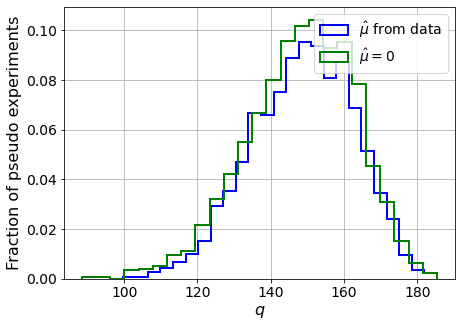

muhat mean:  0.002081283765835626
Z_bins:  12.22523211558687
std Z_bins:  0.5708610903984416
Z_bins mu=0:  12.224746033793519
std Z_bins mu=0:  0.6021520256772904

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1115


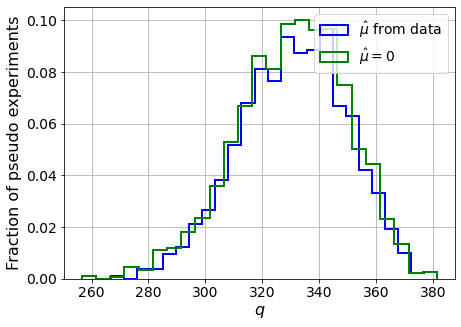

muhat mean:  0.0008025994310352201
Z_bins:  18.210385449421462
std Z_bins:  0.5147646057611764
Z_bins mu=0:  18.20993039293125
std Z_bins mu=0:  0.5341502156442749

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.102


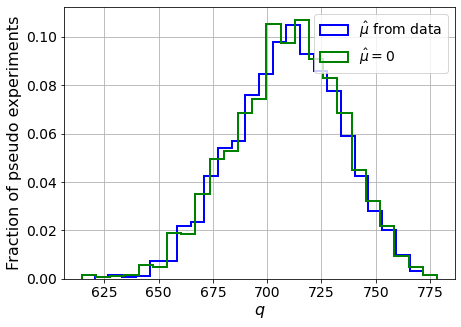

muhat mean:  0.0007557526367273464
Z_bins:  26.658604751645942
std Z_bins:  0.4641388894183798
Z_bins mu=0:  26.657769297650788
std Z_bins mu=0:  0.4768491726942105

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


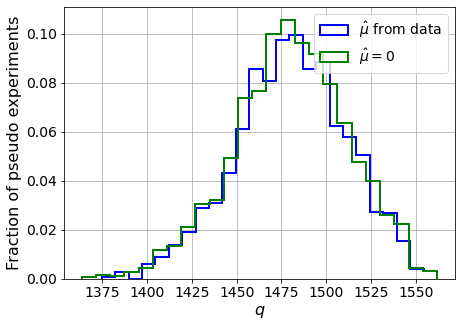

muhat mean:  0.00036468363157840815
Z_bins:  38.48082065008364
std Z_bins:  0.4045052111163271
Z_bins mu=0:  38.47792893836657
std Z_bins mu=0:  0.41254441166257727

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


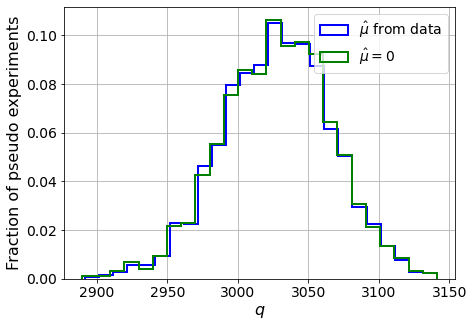

muhat mean:  3.321030529386491e-05
Z_bins:  55.02996169205095
std Z_bins:  0.35177321196554834
Z_bins mu=0:  55.02866094305863
std Z_bins mu=0:  0.3563104621736083

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


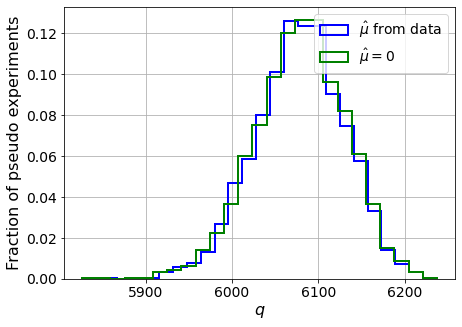

muhat mean:  6.805039487815618e-05
Z_bins:  77.98097602295444
std Z_bins:  0.3337975460483842
Z_bins mu=0:  77.98056656912584
std Z_bins mu=0:  0.33801229826862944

--------


 FINAL RESULT:

[[0.2228530938512859, 0.5111327313079088, 0.2929817425252646, 0.22277603508404278, 0.9395707613280534], [0.19949487216607795, 0.5555806778333106, 0.363007155023725, 0.19746249367320823, 1.0315690792705683], [0.2574022034136879, 0.4476548580617513, 0.20638757732934945, 0.2574022034136879, 0.8201265987272089], [0.48417851608565676, 0.5095005921396428, 0.05500806763049697, 0.48417851608565676, 0.8432195959638011], [1.0698491502174272, 0.5893314744749143, 0.04873996375130964, 1.0698491502174272, 0.8479602836406162], [1.7478458530132255, 0.6664908894439329, 0.0455889834633088, 1.746685431555664, 0.8681140614715616], [2.9975379307964953, 0.6843004835399839, 0.017572942255421782, 2.9975183613690426, 0.8058828918398605], [5.030274931300852, 0.6611633090686087, 0.008568621075279722, 5.029780872818907, 0.73

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 329.30162697 292.76792114 252.72453681 206.51744255
 150.43627263  91.76266342  28.93060471 -34.63896073 -98.81342009]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 269.01984828 250.40300412 222.7099688  188.1384921
 146.

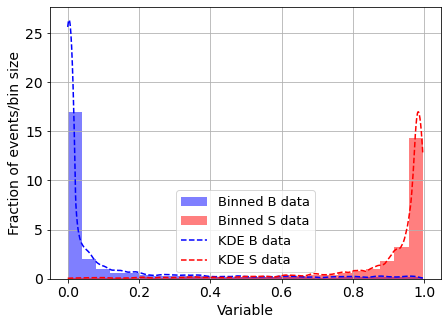

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



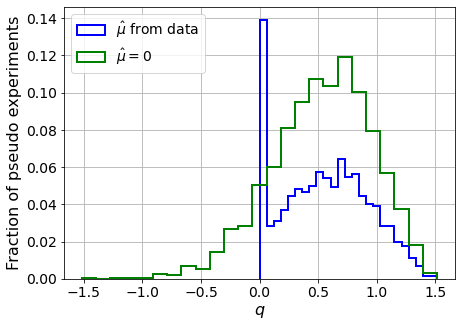

muhat mean:  -6.464613316343837
Z_bins:  0.7533457736135043
std Z_bins:  0.2451818471679424
Z_bins mu=0:  0.7533457736135043
std Z_bins mu=0:  0.2822489779314304

--------

B_expected:  643
S_expected:  1



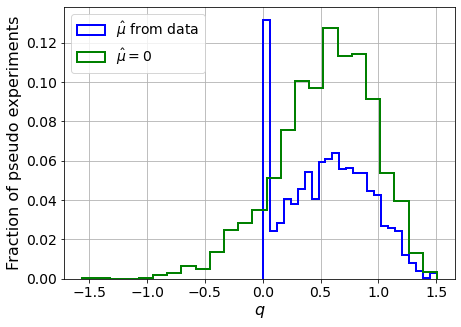

muhat mean:  -6.879640239612655
Z_bins:  0.7610999432040509
std Z_bins:  0.23551253350140824
Z_bins mu=0:  0.7610999432040509
std Z_bins mu=0:  0.2755793792056468

--------

B_expected:  643
S_expected:  1



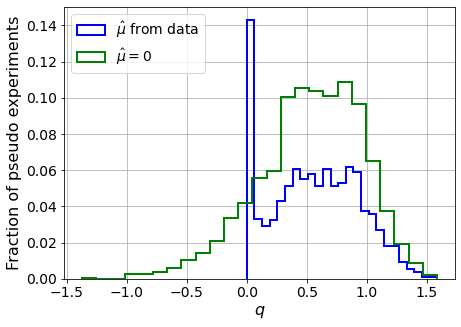

muhat mean:  -7.2111335159223895
Z_bins:  0.751618938000615
std Z_bins:  0.2454193877618855
Z_bins mu=0:  0.751618938000615
std Z_bins mu=0:  0.2872309991848303

--------

B_expected:  643
S_expected:  2



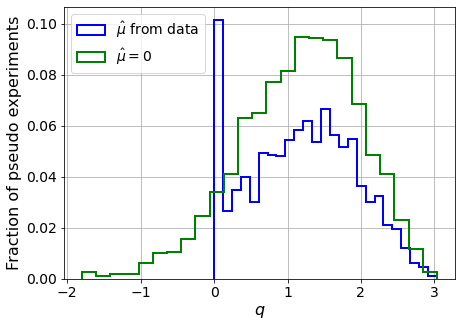

muhat mean:  -3.621168232886813
Z_bins:  1.1076433351701132
std Z_bins:  0.325697863451272
Z_bins mu=0:  1.1076433351701132
std Z_bins mu=0:  0.3632381375729844

--------

B_expected:  643
S_expected:  5



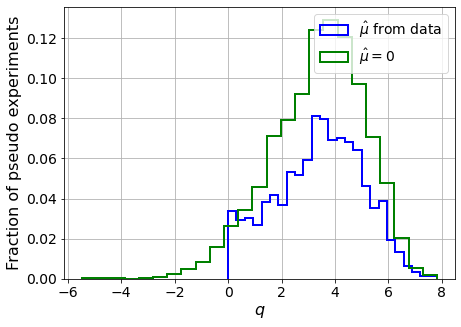

muhat mean:  -1.3156000155991088
Z_bins:  1.8777908294222594
std Z_bins:  0.4336247844252808
Z_bins mu=0:  1.8777908294222594
std Z_bins mu=0:  0.4677567233254959

--------

B_expected:  643
S_expected:  9



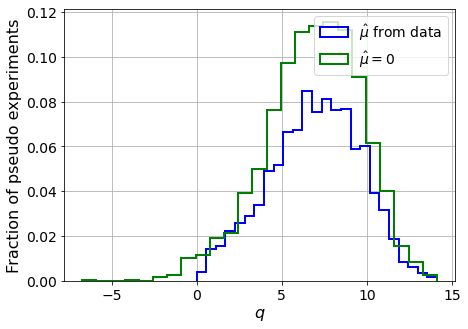

muhat mean:  -0.8439824784938977
Z_bins:  2.6554229703059335
std Z_bins:  0.5027585233475296
Z_bins mu=0:  2.6554229703059335
std Z_bins mu=0:  0.5268227675724524

--------

B_expected:  643
S_expected:  17



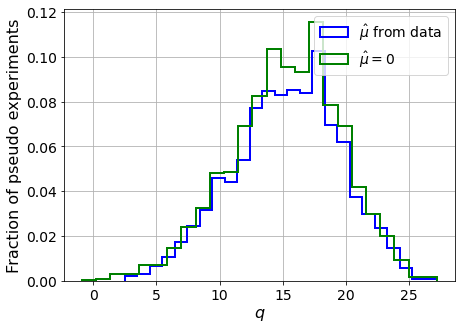

muhat mean:  -0.44626430748067797
Z_bins:  3.945386077318322
std Z_bins:  0.5361417278640376
Z_bins mu=0:  3.945386077318322
std Z_bins mu=0:  0.5490820012945837

--------

B_expected:  643
S_expected:  33



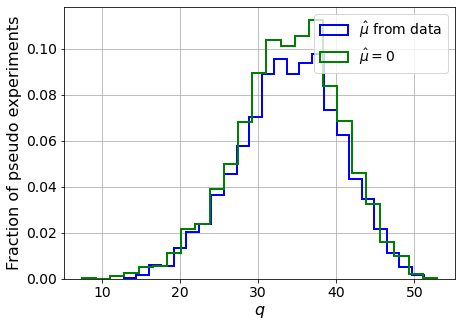

muhat mean:  -0.20812876293262222
Z_bins:  5.853723313014771
std Z_bins:  0.5546088369031184
Z_bins mu=0:  5.853723313014771
std Z_bins mu=0:  0.5661352052985636

--------

B_expected:  643
S_expected:  64



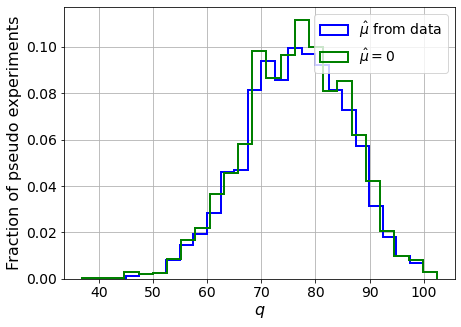

muhat mean:  -0.11484503440951593
Z_bins:  8.761297621567286
std Z_bins:  0.5480240969669585
Z_bins mu=0:  8.761297621567286
std Z_bins mu=0:  0.5545920410052784

--------

B_expected:  643
S_expected:  124



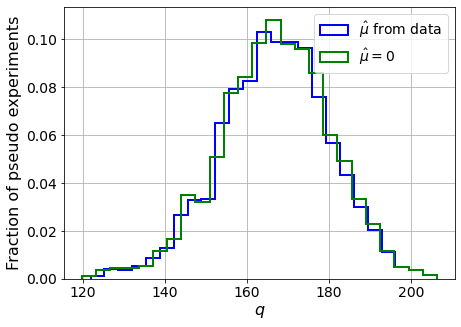

muhat mean:  -0.0608382722292753
Z_bins:  12.926364624906997
std Z_bins:  0.5149574946886787
Z_bins mu=0:  12.926364624906997
std Z_bins mu=0:  0.5195362231110418

--------

B_expected:  643
S_expected:  239



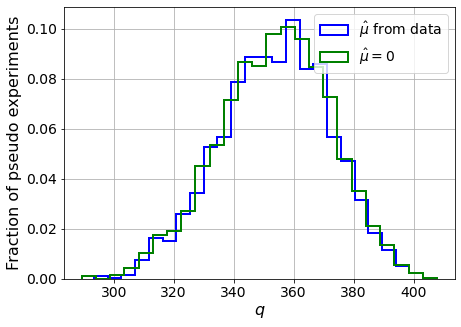

muhat mean:  -0.027353562967869376
Z_bins:  18.829973547984967
std Z_bins:  0.4865093302581858
Z_bins mu=0:  18.829973547984967
std Z_bins mu=0:  0.4896351189694787

--------

B_expected:  643
S_expected:  462



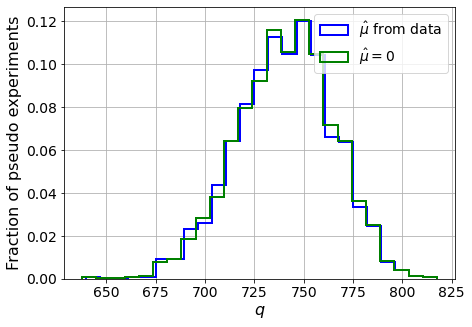

muhat mean:  -0.015451163769911734
Z_bins:  27.23206460049746
std Z_bins:  0.45025413060673425
Z_bins mu=0:  27.23206460049746
std Z_bins mu=0:  0.4525005828503507

--------

B_expected:  643
S_expected:  892



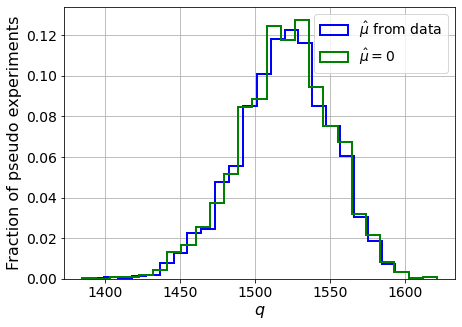

muhat mean:  -0.008960259859237624
Z_bins:  39.001807240177
std Z_bins:  0.40023511437627796
Z_bins mu=0:  39.001807240177
std Z_bins mu=0:  0.40169171656014335

--------

B_expected:  643
S_expected:  1723



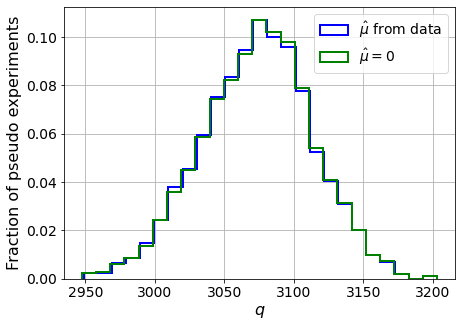

muhat mean:  -0.003689381111227179
Z_bins:  55.44852315188462
std Z_bins:  0.35962485820725854
Z_bins mu=0:  55.44821626124424
std Z_bins mu=0:  0.36045399996116667

--------

B_expected:  643
S_expected:  3326



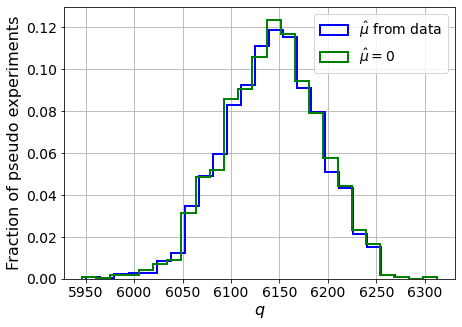

muhat mean:  -0.001921016975716056
Z_bins:  78.38198023065766
std Z_bins:  0.31581126103461044
Z_bins mu=0:  78.38165268012942
std Z_bins mu=0:  0.3164002733637851

--------


 FINAL RESULT:

[[0.7533457736135043, 0.2451818471679424, -6.464613316343837, 0.7533457736135043, 0.2822489779314304], [0.7610999432040509, 0.23551253350140824, -6.879640239612655, 0.7610999432040509, 0.2755793792056468], [0.751618938000615, 0.2454193877618855, -7.2111335159223895, 0.751618938000615, 0.2872309991848303], [1.1076433351701132, 0.325697863451272, -3.621168232886813, 1.1076433351701132, 0.3632381375729844], [1.8777908294222594, 0.4336247844252808, -1.3156000155991088, 1.8777908294222594, 0.4677567233254959], [2.6554229703059335, 0.5027585233475296, -0.8439824784938977, 2.6554229703059335, 0.5268227675724524], [3.945386077318322, 0.5361417278640376, -0.44626430748067797, 3.945386077318322, 0.5490820012945837], [5.853723313014771, 0.5546088369031184, -0.20812876293262222, 5.853723313014771, 0.566135205

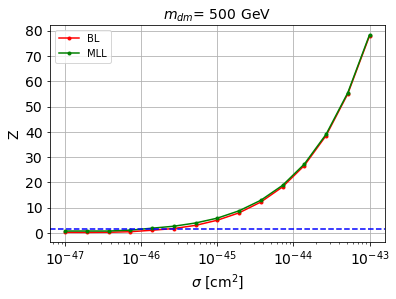


cross_BL_164:  2.534631769231145e-46
cross_BL_164_up:  1.3664700863243761e-46
cross_BL_164_down:  3.6152612533629875e-46

cross_MLL_164:  1.1362896480748359e-46
cross_MLL_164_up:  8.402083859911074e-47
cross_MLL_164_down:  1.6665969643389881e-46

#########################



In [30]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [31]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.2188900859977367e-45, 8.220479907629045e-47, 4.0034137956069824e-47, 4.202666144976076e-47, 5.675003860508817e-47, 9.776900660877054e-47, 2.534631769231145e-46]
[7.562749847249591e-46, 4.944951718472653e-47, 2.70993238811517e-47, 2.248879651110806e-47, 3.6667916202942854e-47, 6.099654053858697e-47, 1.3664700863243761e-46]
[2.064522039570734e-45, 1.3063404702001332e-46, 6.531999277448409e-47, 6.610453892552438e-47, 8.481310114453303e-47, 1.5390853319873301e-46, 3.6152612533629875e-46]
[8.519293781439578e-46, 4.898655388132578e-47, 2.482610309836158e-47, 2.1829962098269094e-47, 2.619215584977566e-47, 5.710761846743838e-47, 1.1362896480748359e-46]
[6.09153146187653e-46, 3.330784126277856e-47, 1.4821176343682938e-47, 1.487074269280508e-47, 1.6001261805001068e-47, 3.556262489424208e-47, 8.402083859911074e-47]
[1.2700757987719519e-45, 7.674718946461328e-47, 3.3111465584339185e-47, 3.6359103707814787e-47, 4.2862529175084056e-47, 8.297591773356114e-47, 1.6665969643389881e-46]


In [32]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [33]:
cross_cs1cs2_general_m5 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m5_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m5_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m5_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m5_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m5_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

#### Train with m_it = 6


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


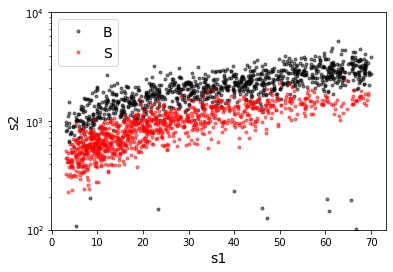

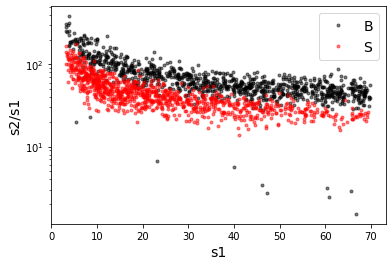

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

[0]	validation_0-logloss:0.68563	validation_1-logloss:0.68565
[1]	validation_0-logloss:0.67826	validation_1-logloss:0.67830
[2]	validation_0-logloss:0.67102	validation_1-logloss:0.67109
[3]	validation_0-logloss:0.66394	validation_1-logloss:0.66404
[4]	validation_0-logloss:0.65698	validation_1-logloss:0.65711
[5]	validation_0-logloss:0.65015	validation_1-logloss:0.65030
[6]	validation_0-logloss:0.64346	validation_1-logloss:0.64365
[7]	validation_0-logloss:0.63688	validation_1-logloss:0.63709
[8]	validation_0-logloss:0.63044	validation_1-logloss:0.63069
[9]	validation_0-logloss:0.62410	validation_1-logloss:0.62437
[10]	validation_0-logloss:0.61787	validation_1-logloss:0.61818
[11]	validation_0-logloss:0.61179	validation_1-logloss:0.61212


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60577	validation_1-logloss:0.60615
[13]	validation_0-logloss:0.59987	validation_1-logloss:0.60028
[14]	validation_0-logloss:0.59409	validation_1-logloss:0.59452
[15]	validation_0-logloss:0.58838	validation_1-logloss:0.58886
[16]	validation_0-logloss:0.58279	validation_1-logloss:0.58330
[17]	validation_0-logloss:0.57731	validation_1-logloss:0.57783
[18]	validation_0-logloss:0.57189	validation_1-logloss:0.57245
[19]	validation_0-logloss:0.56660	validation_1-logloss:0.56718
[20]	validation_0-logloss:0.56137	validation_1-logloss:0.56198
[21]	validation_0-logloss:0.55623	validation_1-logloss:0.55687
[22]	validation_0-logloss:0.55117	validation_1-logloss:0.55183
[23]	validation_0-logloss:0.54621	validation_1-logloss:0.54687
[24]	validation_0-logloss:0.54132	validation_1-logloss:0.54203
[25]	validation_0-logloss:0.53652	validation_1-logloss:0.53725
[26]	validation_0-logloss:0.53182	validation_1-logloss:0.53257
[27]	validation_0-logloss:0.52716	validation_1-logloss:

[142]	validation_0-logloss:0.26653	validation_1-logloss:0.26937
[143]	validation_0-logloss:0.26554	validation_1-logloss:0.26839
[144]	validation_0-logloss:0.26457	validation_1-logloss:0.26744
[145]	validation_0-logloss:0.26360	validation_1-logloss:0.26649
[146]	validation_0-logloss:0.26266	validation_1-logloss:0.26554
[147]	validation_0-logloss:0.26172	validation_1-logloss:0.26461
[148]	validation_0-logloss:0.26080	validation_1-logloss:0.26369
[149]	validation_0-logloss:0.25987	validation_1-logloss:0.26277
[150]	validation_0-logloss:0.25896	validation_1-logloss:0.26188
[151]	validation_0-logloss:0.25806	validation_1-logloss:0.26098
[152]	validation_0-logloss:0.25717	validation_1-logloss:0.26009
[153]	validation_0-logloss:0.25629	validation_1-logloss:0.25922
[154]	validation_0-logloss:0.25541	validation_1-logloss:0.25835
[155]	validation_0-logloss:0.25456	validation_1-logloss:0.25750
[156]	validation_0-logloss:0.25372	validation_1-logloss:0.25667
[157]	validation_0-logloss:0.25287	valid

[271]	validation_0-logloss:0.20038	validation_1-logloss:0.20359
[272]	validation_0-logloss:0.20016	validation_1-logloss:0.20338
[273]	validation_0-logloss:0.19994	validation_1-logloss:0.20315
[274]	validation_0-logloss:0.19972	validation_1-logloss:0.20292
[275]	validation_0-logloss:0.19950	validation_1-logloss:0.20271
[276]	validation_0-logloss:0.19929	validation_1-logloss:0.20250
[277]	validation_0-logloss:0.19908	validation_1-logloss:0.20228
[278]	validation_0-logloss:0.19887	validation_1-logloss:0.20207
[279]	validation_0-logloss:0.19866	validation_1-logloss:0.20186
[280]	validation_0-logloss:0.19845	validation_1-logloss:0.20165
[281]	validation_0-logloss:0.19825	validation_1-logloss:0.20145
[282]	validation_0-logloss:0.19806	validation_1-logloss:0.20125
[283]	validation_0-logloss:0.19786	validation_1-logloss:0.20104
[284]	validation_0-logloss:0.19766	validation_1-logloss:0.20084
[285]	validation_0-logloss:0.19746	validation_1-logloss:0.20064
[286]	validation_0-logloss:0.19726	valid

[400]	validation_0-logloss:0.18450	validation_1-logloss:0.18794
[401]	validation_0-logloss:0.18444	validation_1-logloss:0.18788
[402]	validation_0-logloss:0.18438	validation_1-logloss:0.18784
[403]	validation_0-logloss:0.18432	validation_1-logloss:0.18778
[404]	validation_0-logloss:0.18426	validation_1-logloss:0.18773
[405]	validation_0-logloss:0.18421	validation_1-logloss:0.18767
[406]	validation_0-logloss:0.18415	validation_1-logloss:0.18761
[407]	validation_0-logloss:0.18409	validation_1-logloss:0.18756
[408]	validation_0-logloss:0.18404	validation_1-logloss:0.18751
[409]	validation_0-logloss:0.18398	validation_1-logloss:0.18746
[410]	validation_0-logloss:0.18392	validation_1-logloss:0.18741
[411]	validation_0-logloss:0.18387	validation_1-logloss:0.18737
[412]	validation_0-logloss:0.18381	validation_1-logloss:0.18732
[413]	validation_0-logloss:0.18376	validation_1-logloss:0.18727
[414]	validation_0-logloss:0.18371	validation_1-logloss:0.18723
[415]	validation_0-logloss:0.18366	valid

[529]	validation_0-logloss:0.17986	validation_1-logloss:0.18418
[530]	validation_0-logloss:0.17984	validation_1-logloss:0.18417
[531]	validation_0-logloss:0.17981	validation_1-logloss:0.18415
[532]	validation_0-logloss:0.17979	validation_1-logloss:0.18415
[533]	validation_0-logloss:0.17978	validation_1-logloss:0.18414
[534]	validation_0-logloss:0.17975	validation_1-logloss:0.18413
[535]	validation_0-logloss:0.17973	validation_1-logloss:0.18412
[536]	validation_0-logloss:0.17972	validation_1-logloss:0.18410
[537]	validation_0-logloss:0.17970	validation_1-logloss:0.18409
[538]	validation_0-logloss:0.17968	validation_1-logloss:0.18407
[539]	validation_0-logloss:0.17966	validation_1-logloss:0.18406
[540]	validation_0-logloss:0.17964	validation_1-logloss:0.18405
[541]	validation_0-logloss:0.17963	validation_1-logloss:0.18403
[542]	validation_0-logloss:0.17962	validation_1-logloss:0.18402
[543]	validation_0-logloss:0.17960	validation_1-logloss:0.18401
[544]	validation_0-logloss:0.17959	valid

[658]	validation_0-logloss:0.17816	validation_1-logloss:0.18330
[659]	validation_0-logloss:0.17815	validation_1-logloss:0.18329
[660]	validation_0-logloss:0.17814	validation_1-logloss:0.18329
[661]	validation_0-logloss:0.17813	validation_1-logloss:0.18328
[662]	validation_0-logloss:0.17812	validation_1-logloss:0.18328
[663]	validation_0-logloss:0.17811	validation_1-logloss:0.18327
[664]	validation_0-logloss:0.17810	validation_1-logloss:0.18327
[665]	validation_0-logloss:0.17809	validation_1-logloss:0.18327
[666]	validation_0-logloss:0.17808	validation_1-logloss:0.18327
[667]	validation_0-logloss:0.17807	validation_1-logloss:0.18327
[668]	validation_0-logloss:0.17806	validation_1-logloss:0.18326
[669]	validation_0-logloss:0.17805	validation_1-logloss:0.18326
[670]	validation_0-logloss:0.17803	validation_1-logloss:0.18325
[671]	validation_0-logloss:0.17802	validation_1-logloss:0.18325
[672]	validation_0-logloss:0.17802	validation_1-logloss:0.18325
[673]	validation_0-logloss:0.17801	valid

[787]	validation_0-logloss:0.17686	validation_1-logloss:0.18306
[788]	validation_0-logloss:0.17686	validation_1-logloss:0.18306
[789]	validation_0-logloss:0.17684	validation_1-logloss:0.18305
[790]	validation_0-logloss:0.17683	validation_1-logloss:0.18305
[791]	validation_0-logloss:0.17681	validation_1-logloss:0.18306
[792]	validation_0-logloss:0.17680	validation_1-logloss:0.18306
[793]	validation_0-logloss:0.17679	validation_1-logloss:0.18306
[794]	validation_0-logloss:0.17678	validation_1-logloss:0.18306
[795]	validation_0-logloss:0.17677	validation_1-logloss:0.18306
[796]	validation_0-logloss:0.17676	validation_1-logloss:0.18305
[797]	validation_0-logloss:0.17675	validation_1-logloss:0.18305
[798]	validation_0-logloss:0.17674	validation_1-logloss:0.18305
[799]	validation_0-logloss:0.17673	validation_1-logloss:0.18305
[800]	validation_0-logloss:0.17672	validation_1-logloss:0.18305
[801]	validation_0-logloss:0.17670	validation_1-logloss:0.18304
[802]	validation_0-logloss:0.17669	valid

[916]	validation_0-logloss:0.17548	validation_1-logloss:0.18289
[917]	validation_0-logloss:0.17546	validation_1-logloss:0.18290
[918]	validation_0-logloss:0.17545	validation_1-logloss:0.18290
[919]	validation_0-logloss:0.17544	validation_1-logloss:0.18290
[920]	validation_0-logloss:0.17544	validation_1-logloss:0.18290
[921]	validation_0-logloss:0.17542	validation_1-logloss:0.18290
[922]	validation_0-logloss:0.17541	validation_1-logloss:0.18289
[923]	validation_0-logloss:0.17540	validation_1-logloss:0.18290
[924]	validation_0-logloss:0.17539	validation_1-logloss:0.18290
[925]	validation_0-logloss:0.17539	validation_1-logloss:0.18289
[926]	validation_0-logloss:0.17537	validation_1-logloss:0.18288
[927]	validation_0-logloss:0.17536	validation_1-logloss:0.18288
[928]	validation_0-logloss:0.17536	validation_1-logloss:0.18288
[929]	validation_0-logloss:0.17535	validation_1-logloss:0.18288
[930]	validation_0-logloss:0.17534	validation_1-logloss:0.18289
[931]	validation_0-logloss:0.17532	valid

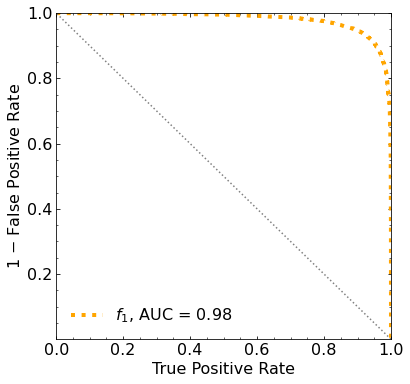

In [34]:
m_it = 6


# set the parameters
mDM = mDM_mDM[m_it]
S_cross1045 = S_cross1045_mDM[m_it]
S_expected = S_expected_mDM[m_it]

print('\n#########################\n')
print('mDM = ', mDM, 'GeV\n')


##########
# SIGNAL #
##########

S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

print('\nS_cs1.shape: ', S_cs1.shape)
print('S_cs2.shape: ', S_cs2.shape)

S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
S_cs1 = S_cs1_aux


# set events per classs
NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
print(' NUM_DAT: ', NUM_DAT, '\n')

NUM_DAT_AC = int(NUM_DAT*f_AC)
NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
NUM_DAT_RN = int(NUM_DAT*f_RN)
NUM_DAT_WALL = int(NUM_DAT*f_WALL)

NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

print('NUM_DAT_ER: ', NUM_DAT_ER)
print('NUM_DAT_AC: ', NUM_DAT_AC)
print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
print('NUM_DAT_RN: ', NUM_DAT_RN)
print('NUM_DAT_WALL: ', NUM_DAT_WALL)



# CONCATENATE THE BACKGROUNDS
B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


rnd = 100

B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2',fontsize=14)
plt.legend(fontsize=14)
plt.show()



plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
plt.yscale('log')
# plt.xlim([0,100])
# plt.ylim([100,10000])
plt.xlabel('s1',fontsize=14)
plt.ylabel('s2/s1',fontsize=14)
plt.legend(fontsize=14)
plt.show()


############
# DATASETS #
############

# concatenate the data
X_mon_B = B_cs1cs2
X_mon_S = S_cs1cs2

# X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
# X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
print('X_mon_B.shape: ', X_mon_B.shape)
print('X_mon_S.shape: ', X_mon_S.shape)

# del B_ppeakS1
# del B_ppeakS2
# del B_pbot
# del B_ptop

# del S_ppeakS1
# del S_ppeakS2
# del S_pbot
# del S_ptop

X_mon = np.concatenate([X_mon_B, X_mon_S])

# X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

print('X_mon.shape: ', X_mon.shape)
# del X_mon_B
# del X_mon_S


# labels
y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


# divide into train-val and test data samples
test_ratio = 0.25
val_ratio = 0.15


X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                y_mon,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_mon,
                                                                shuffle=True)

del X_mon
del y_mon

X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                  y_mon_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_mon_aux,
                                                                  shuffle=True)

del X_mon_aux
del y_mon_aux

print('')
print('X_mon_train : ', X_mon_train.shape)
print('y_mon_train : ', y_mon_train.shape)
print('X_mon_val : ', X_mon_val.shape)
print('y_mon_val : ', y_mon_val.shape)
print('X_mon_test : ', X_mon_test.shape)
print('y_mon_test : ', y_mon_test.shape)
print('')



###########
# XGBOOST #
###########

# XGBoost with only the kinematic variables of the leptons

# CLASSIFIER
classifier = XGBClassifier(
    n_estimators=2500,
    learning_rate=0.01,
    reg_lambda=0.01,reg_alpha=0.0,
    gamma=0.0,objective='binary:logistic',
    max_depth=5,
    #eval_metric=["error", "logloss", "map"]
    eval_metric='logloss')

# FIT
classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
        early_stopping_rounds=50,#early stopping
        verbose=True)


# PREDICTIONS
y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


# ROC
fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


# PLOT THE ROC WITH AUC
fig = plt.figure(figsize=(6, 6))
gs = gridspec.GridSpec(1, 1) 
ax0 = plt.subplot(gs[0])
ax0.yaxis.set_ticks_position('both')
ax0.xaxis.set_ticks_position('both')
ax0.tick_params(direction="in",which="both")
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
ax0.minorticks_on()


plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
plt.plot([1,0],[0,1],ls=":",color="grey")
plt.xlabel("True Positive Rate",fontsize=16)
plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
plt.legend()
plt.xlim([0,1])
plt.ylim([0,1])
plt.yticks([0.2,0.4,0.6,0.8,1.])
plt.legend(frameon=False,fontsize=16)
plt.show()



#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


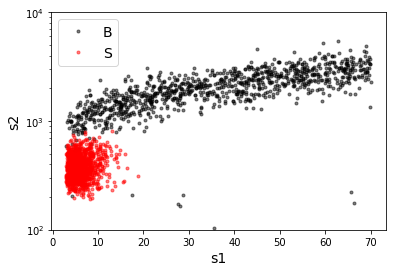

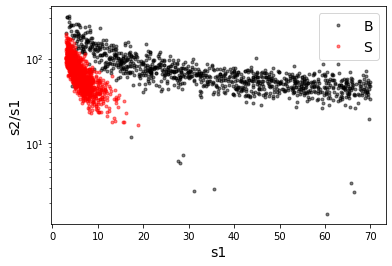

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)

Classification score:


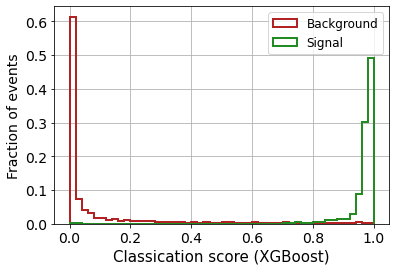


 ROC-AUC =  0.993566836102967
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1065


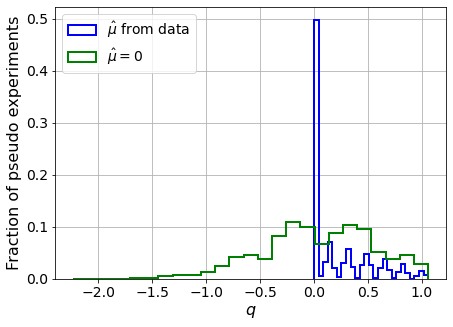

muhat mean:  0.32329171811506113
Z_bins:  0.21212246913284571
std Z_bins:  0.6828598486087373
Z_bins mu=0:  0.203492970173945
std Z_bins mu=0:  1.2875153576814418

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


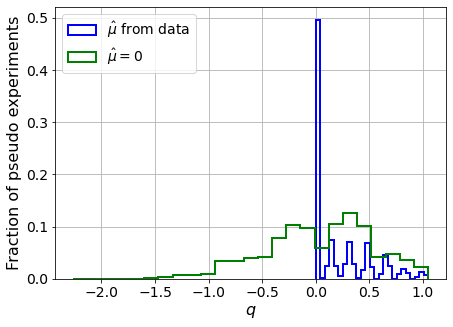

muhat mean:  0.295179309269158
Z_bins:  0.3118423676540171
std Z_bins:  0.44283051232917775
Z_bins mu=0:  0.3118423676540171
std Z_bins mu=0:  0.8038130754761771

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


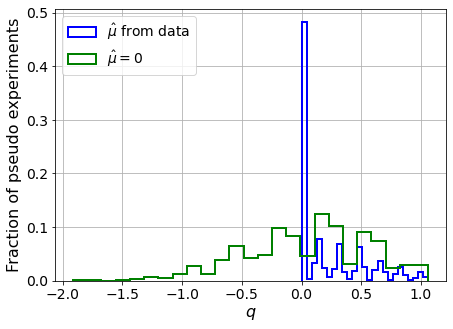

muhat mean:  0.25406377845864125
Z_bins:  0.3334184653777385
std Z_bins:  0.43198764690216623
Z_bins mu=0:  0.3334184653777385
std Z_bins mu=0:  0.7753419117199115

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1225


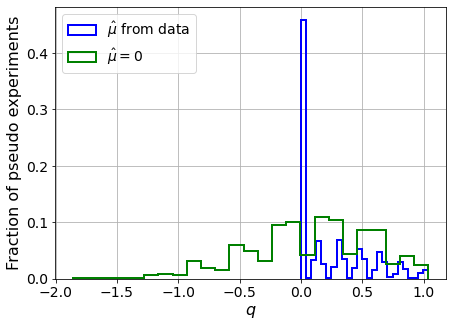

muhat mean:  0.03751594520785176
Z_bins:  0.3627074708032246
std Z_bins:  0.4010797074089027
Z_bins mu=0:  0.3627074708032246
std Z_bins mu=0:  0.7052640243601657

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


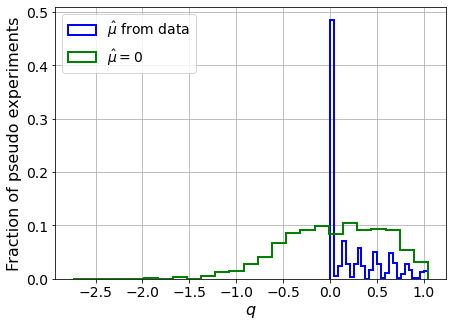

muhat mean:  0.19370438547754676
Z_bins:  0.3341071637020124
std Z_bins:  0.44402554918137094
Z_bins mu=0:  0.3341071637020124
std Z_bins mu=0:  0.7876214529258199

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


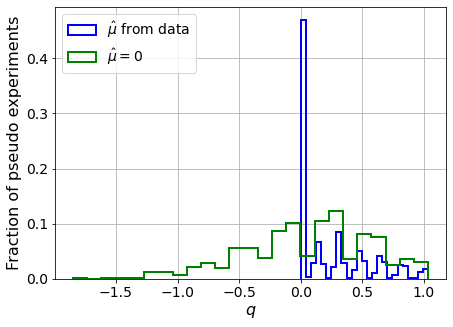

muhat mean:  0.11773693806645828
Z_bins:  0.3521514502181816
std Z_bins:  0.41312685739212784
Z_bins mu=0:  0.3521514502181816
std Z_bins mu=0:  0.7261684988012238

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1305


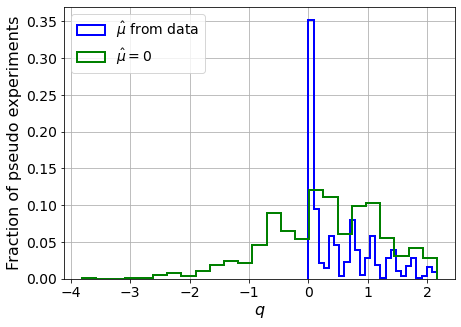

muhat mean:  0.027465260031245803
Z_bins:  0.6124486779245228
std Z_bins:  0.48581919780077365
Z_bins mu=0:  0.6124486779245228
std Z_bins mu=0:  0.7740789106689256

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.134


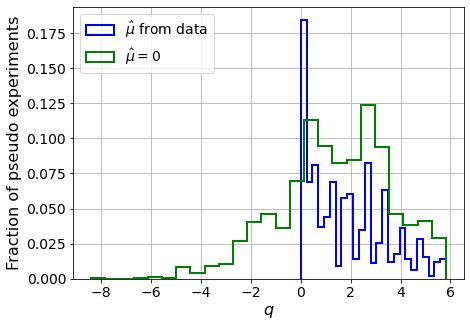

muhat mean:  0.051428754625273417
Z_bins:  1.3062541160834338
std Z_bins:  0.6018198191533242
Z_bins mu=0:  1.3062541160834338
std Z_bins mu=0:  0.8411131031240004

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


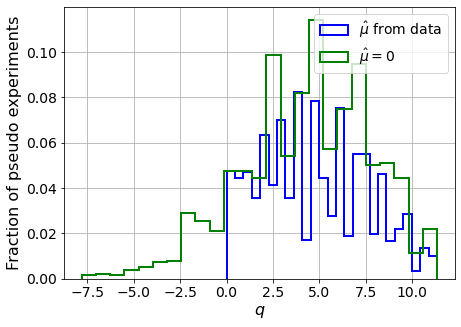

muhat mean:  0.01296765694750453
Z_bins:  2.161574919989669
std Z_bins:  0.6492013700868748
Z_bins mu=0:  2.161574919989669
std Z_bins mu=0:  0.8021485913967339

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


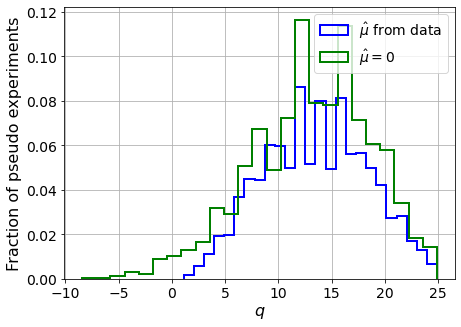

muhat mean:  0.012323483042695368
Z_bins:  3.6985723029835107
std Z_bins:  0.6599925946403038
Z_bins mu=0:  3.6985723029835107
std Z_bins mu=0:  0.757481447228157

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1185


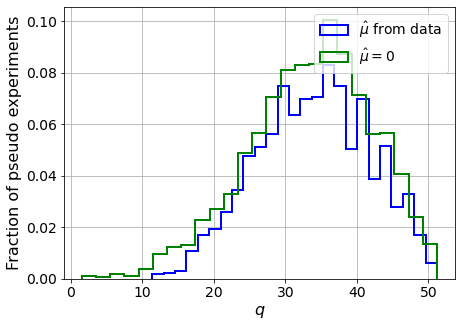

muhat mean:  0.0070493248639619645
Z_bins:  5.867292817688469
std Z_bins:  0.6635971783172578
Z_bins mu=0:  5.867292817688469
std Z_bins mu=0:  0.7309076454443257

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1175


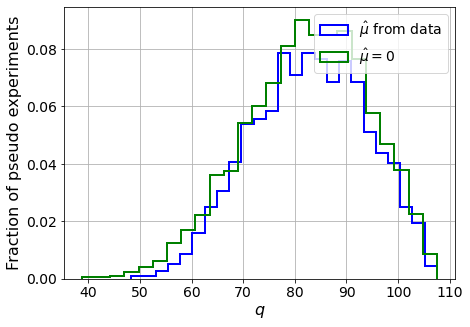

muhat mean:  0.0013719756232315086
Z_bins:  9.105723301407313
std Z_bins:  0.6068337558926443
Z_bins mu=0:  9.105723301407313
std Z_bins mu=0:  0.6460168640420949

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


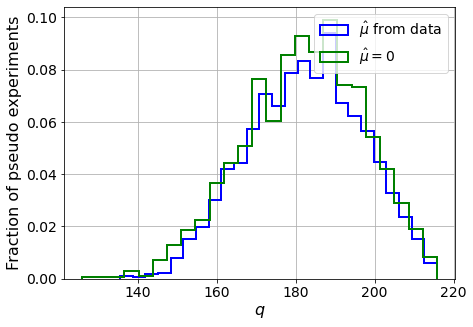

muhat mean:  0.002310027673473828
Z_bins:  13.519969839398371
std Z_bins:  0.5334067559195299
Z_bins mu=0:  13.51956666328194
std Z_bins mu=0:  0.5599430149577783

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


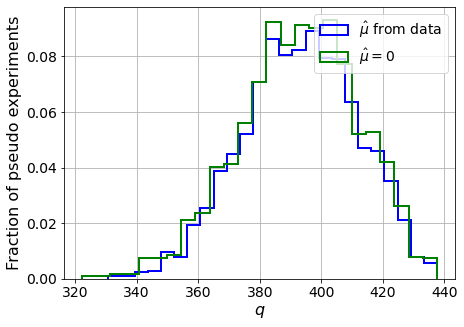

muhat mean:  0.0009908324562758121
Z_bins:  19.841758348731155
std Z_bins:  0.4659425378857691
Z_bins mu=0:  19.841758348731155
std Z_bins mu=0:  0.48418447105476903

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


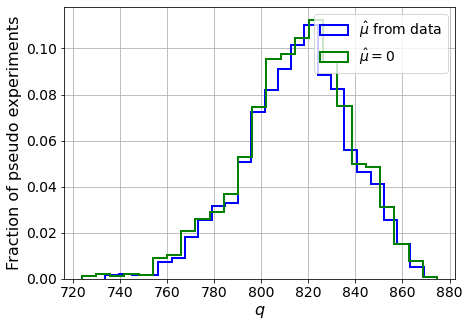

muhat mean:  0.00026240624832717406
Z_bins:  28.57668990746633
std Z_bins:  0.3979098516214599
Z_bins mu=0:  28.57668990746633
std Z_bins mu=0:  0.41090953267747804

--------


 FINAL RESULT:

[[0.21212246913284571, 0.6828598486087373, 0.32329171811506113, 0.203492970173945, 1.2875153576814418], [0.3118423676540171, 0.44283051232917775, 0.295179309269158, 0.3118423676540171, 0.8038130754761771], [0.3334184653777385, 0.43198764690216623, 0.25406377845864125, 0.3334184653777385, 0.7753419117199115], [0.3627074708032246, 0.4010797074089027, 0.03751594520785176, 0.3627074708032246, 0.7052640243601657], [0.3341071637020124, 0.44402554918137094, 0.19370438547754676, 0.3341071637020124, 0.7876214529258199], [0.3521514502181816, 0.41312685739212784, 0.11773693806645828, 0.3521514502181816, 0.7261684988012238], [0.6124486779245228, 0.48581919780077365, 0.027465260031245803, 0.6124486779245228, 0.7740789106689256], [1.3062541160834338, 0.6018198191533242, 0.051428754625273417, 1.3062541160834338

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 315.02794862 279.27938559 239.35536457 194.4891772
 142.82767511  86.3818457   26.50879709 -35.5185758  -99.1558072 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 399.21829831 335.89843584
 266.

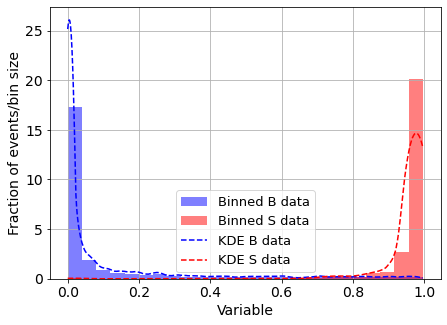

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


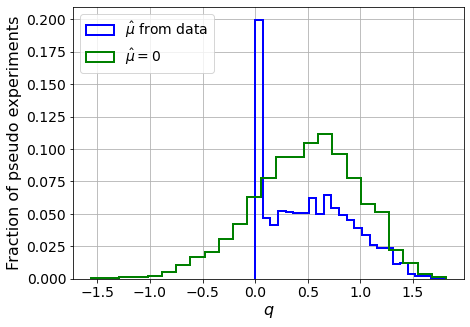

muhat mean:  -3.811350156087228
Z_bins:  0.7200841335172535
std Z_bins:  0.28563782889268646
Z_bins mu=0:  0.7200841335172535
std Z_bins mu=0:  0.3473463754151248

--------

B_expected:  643
S_expected:  1



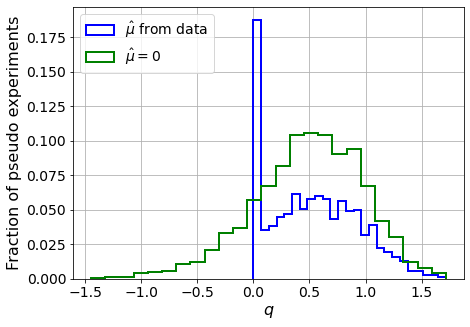

muhat mean:  -3.054323718279635
Z_bins:  0.7196971050846471
std Z_bins:  0.27883662423206884
Z_bins mu=0:  0.7196971050846471
std Z_bins mu=0:  0.341159722885554

--------

B_expected:  643
S_expected:  1



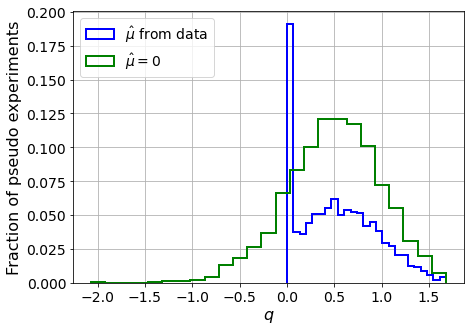

muhat mean:  -3.1505337451037487
Z_bins:  0.7122478297023848
std Z_bins:  0.2869945693349841
Z_bins mu=0:  0.7122478297023848
std Z_bins mu=0:  0.34560370506777033

--------

B_expected:  643
S_expected:  1



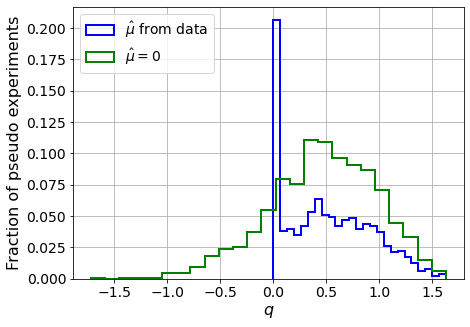

muhat mean:  -2.927134185525177
Z_bins:  0.6957760537148697
std Z_bins:  0.29373061471214174
Z_bins mu=0:  0.6957760537148697
std Z_bins mu=0:  0.364094954777615

--------

B_expected:  643
S_expected:  1



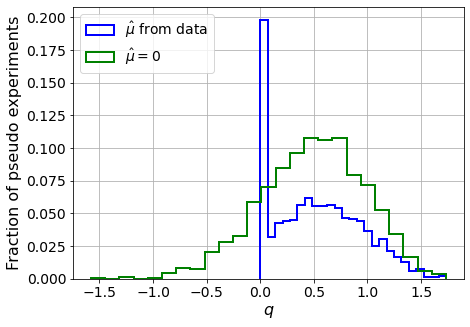

muhat mean:  -3.2938144204795163
Z_bins:  0.7147425908742759
std Z_bins:  0.2833366063677748
Z_bins mu=0:  0.7147425908742759
std Z_bins mu=0:  0.33711613391464473

--------

B_expected:  643
S_expected:  1



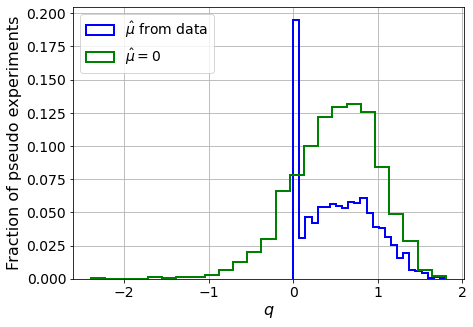

muhat mean:  -3.2474275391065466
Z_bins:  0.7308077768216418
std Z_bins:  0.27889691892944224
Z_bins mu=0:  0.7308077768216418
std Z_bins mu=0:  0.33942985247755003

--------

B_expected:  643
S_expected:  2



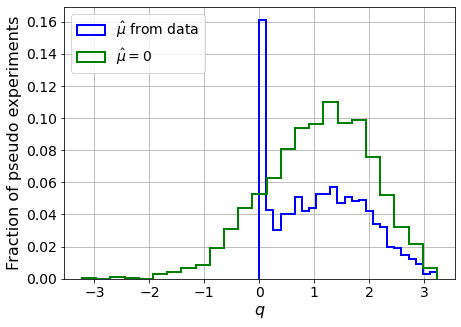

muhat mean:  -1.414342126532874
Z_bins:  1.0730308938424402
std Z_bins:  0.37954210476044586
Z_bins mu=0:  1.0730308938424402
std Z_bins mu=0:  0.4466766888960055

--------

B_expected:  643
S_expected:  5



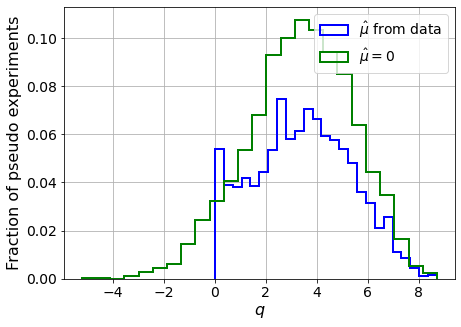

muhat mean:  -0.5744179743575542
Z_bins:  1.8631978589295064
std Z_bins:  0.5070230288620646
Z_bins mu=0:  1.8631978589295064
std Z_bins mu=0:  0.5547400393123157

--------

B_expected:  643
S_expected:  9



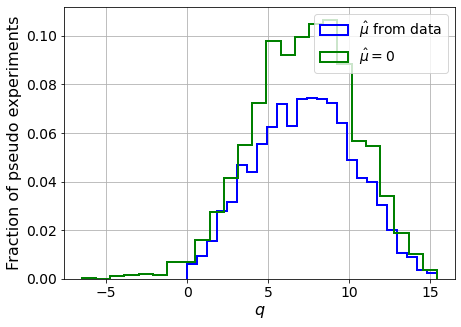

muhat mean:  -0.34371727896227744
Z_bins:  2.707970353886942
std Z_bins:  0.558759615563988
Z_bins mu=0:  2.707970353886942
std Z_bins mu=0:  0.590131442064669

--------

B_expected:  643
S_expected:  18



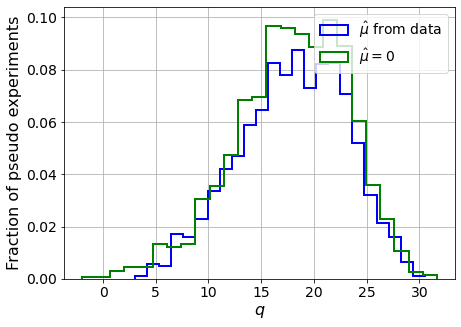

muhat mean:  -0.1693454009994393
Z_bins:  4.27324662515218
std Z_bins:  0.5934322407346331
Z_bins mu=0:  4.27324662515218
std Z_bins mu=0:  0.6187425829177048

--------

B_expected:  643
S_expected:  34



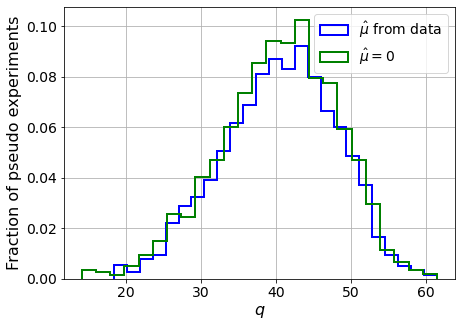

muhat mean:  -0.1001700432731727
Z_bins:  6.3929925533519985
std Z_bins:  0.5936502157560918
Z_bins mu=0:  6.3929925533519985
std Z_bins mu=0:  0.6087781246049698

--------

B_expected:  643
S_expected:  66



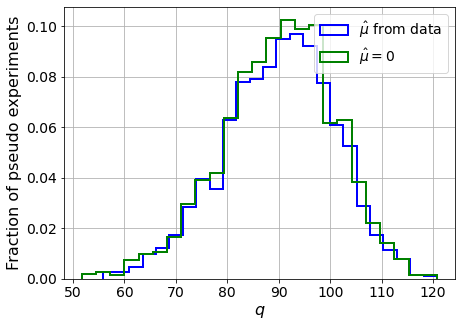

muhat mean:  -0.044388831305541075
Z_bins:  9.5336383768881
std Z_bins:  0.5626884915622471
Z_bins mu=0:  9.5336383768881
std Z_bins mu=0:  0.5746794180876746

--------

B_expected:  643
S_expected:  126



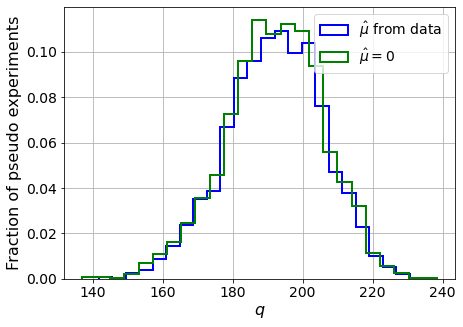

muhat mean:  -0.023989160621518926
Z_bins:  13.870687458735635
std Z_bins:  0.49824255725811945
Z_bins mu=0:  13.870687458735635
std Z_bins mu=0:  0.5052045880548154

--------

B_expected:  643
S_expected:  244



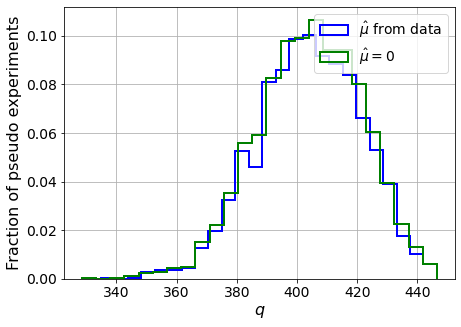

muhat mean:  -0.012215210266749533
Z_bins:  20.113923562950106
std Z_bins:  0.4279142973610324
Z_bins mu=0:  20.113923562950106
std Z_bins mu=0:  0.4321617702667083

--------

B_expected:  643
S_expected:  471



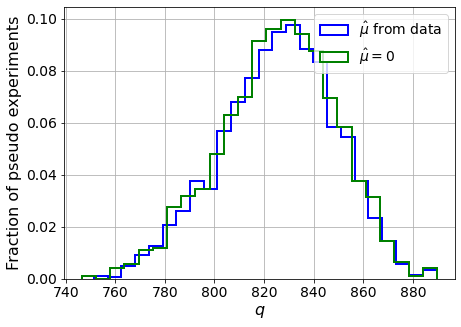

muhat mean:  -0.006749005359751744
Z_bins:  28.755998673884704
std Z_bins:  0.4008324679229825
Z_bins mu=0:  28.755998673884704
std Z_bins mu=0:  0.4040113577419649

--------


 FINAL RESULT:

[[0.7200841335172535, 0.28563782889268646, -3.811350156087228, 0.7200841335172535, 0.3473463754151248], [0.7196971050846471, 0.27883662423206884, -3.054323718279635, 0.7196971050846471, 0.341159722885554], [0.7122478297023848, 0.2869945693349841, -3.1505337451037487, 0.7122478297023848, 0.34560370506777033], [0.6957760537148697, 0.29373061471214174, -2.927134185525177, 0.6957760537148697, 0.364094954777615], [0.7147425908742759, 0.2833366063677748, -3.2938144204795163, 0.7147425908742759, 0.33711613391464473], [0.7308077768216418, 0.27889691892944224, -3.2474275391065466, 0.7308077768216418, 0.33942985247755003], [1.0730308938424402, 0.37954210476044586, -1.414342126532874, 1.0730308938424402, 0.4466766888960055], [1.8631978589295064, 0.5070230288620646, -0.5744179743575542, 1.8631978589295064, 0

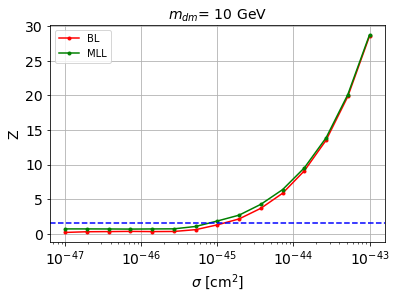


cross_BL_164:  1.2926638870343047e-45
cross_BL_164_up:  8.22530346157347e-46
cross_BL_164_down:  2.039889616809739e-45

cross_MLL_164:  8.404487843817266e-46
cross_MLL_164_up:  5.8516881808082855e-46
cross_MLL_164_down:  1.2654829108717514e-45

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


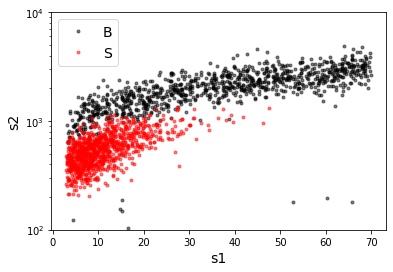

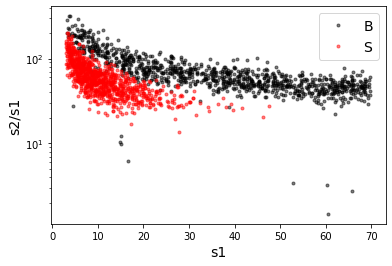

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)

Classification score:


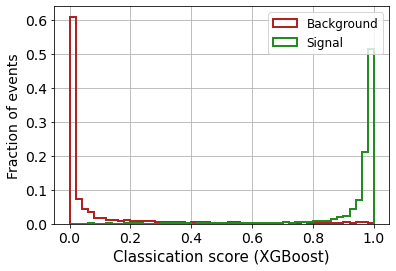


 ROC-AUC =  0.989481042718431
At least 5 B events per bin, range = [[0, 1]]:
# bins:  14 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  14
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


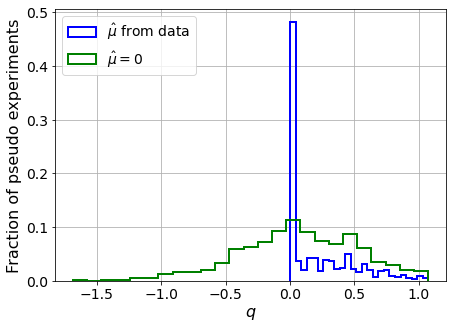

muhat mean:  -0.006079420322355855
Z_bins:  0.23278119852594878
std Z_bins:  0.5920868231691173
Z_bins mu=0:  0.2321967666567382
std Z_bins mu=0:  1.001665263608598

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


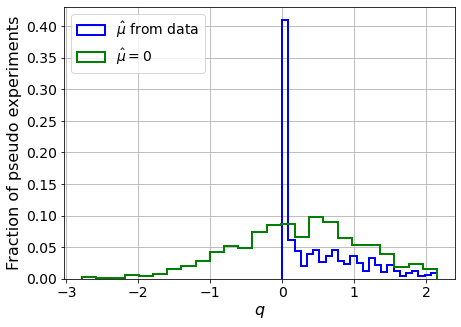

muhat mean:  0.03986702755487132
Z_bins:  0.4661867451753134
std Z_bins:  0.6015517056970618
Z_bins mu=0:  0.46570740433179925
std Z_bins mu=0:  0.9483620513928759

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1095


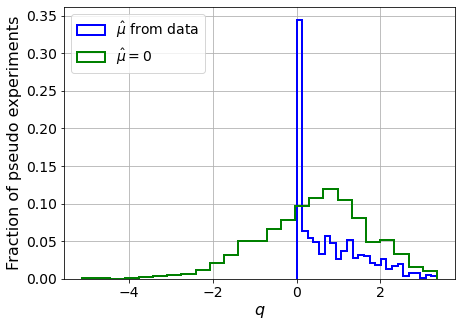

muhat mean:  0.07345188283193027
Z_bins:  0.7016236729920166
std Z_bins:  0.5825259990181586
Z_bins mu=0:  0.7014770108644046
std Z_bins mu=0:  0.9080183715330454

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1125


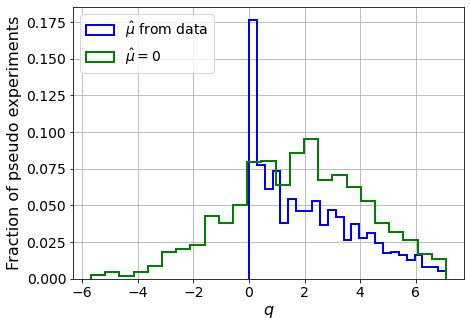

muhat mean:  0.009065381864581548
Z_bins:  1.3467637661223377
std Z_bins:  0.6751227336097463
Z_bins mu=0:  1.3467477065134028
std Z_bins mu=0:  0.8866971811814796

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1245


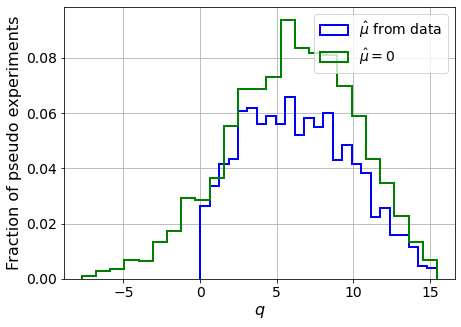

muhat mean:  -0.0026254099447317308
Z_bins:  2.4734135335510903
std Z_bins:  0.7061752169704134
Z_bins mu=0:  2.4734135335510903
std Z_bins mu=0:  0.8408834978881379

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


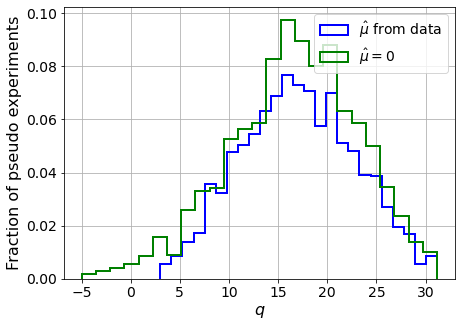

muhat mean:  0.0020334809135009093
Z_bins:  4.110455972988322
std Z_bins:  0.7037444636917247
Z_bins mu=0:  4.110445278594313
std Z_bins mu=0:  0.7914852965104437

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


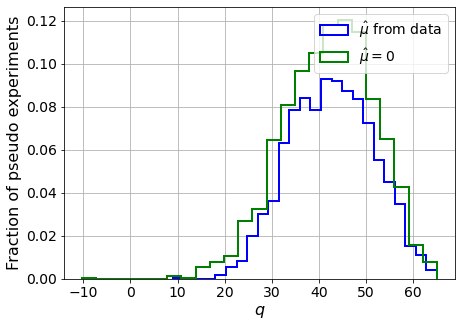

muhat mean:  0.005570031406092565
Z_bins:  6.533478137582746
std Z_bins:  0.6738295855701851
Z_bins mu=0:  6.533294951258744
std Z_bins mu=0:  0.7327677844629028

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1185


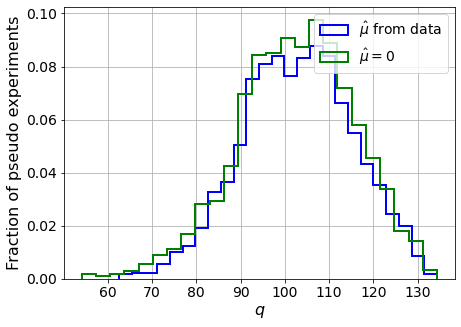

muhat mean:  0.0010573546564135701
Z_bins:  10.153125956103342
std Z_bins:  0.6138000234984528
Z_bins mu=0:  10.15106037824206
std Z_bins mu=0:  0.6496914291649787

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.122


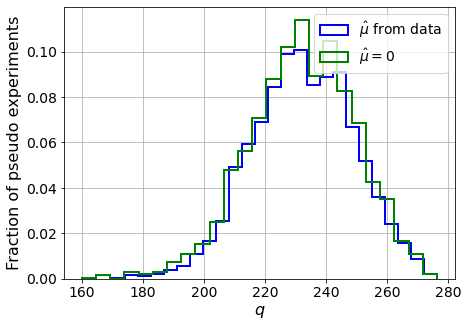

muhat mean:  0.0005828262310132405
Z_bins:  15.247733777395604
std Z_bins:  0.5455155885685236
Z_bins mu=0:  15.246714271685589
std Z_bins mu=0:  0.5699066343932908

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


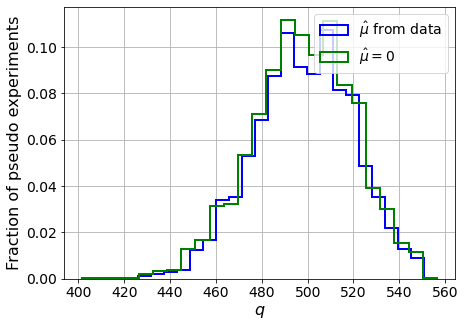

muhat mean:  0.00020336031492172295
Z_bins:  22.32825350859624
std Z_bins:  0.4818877139578141
Z_bins mu=0:  22.327592372027457
std Z_bins mu=0:  0.4984575473292598

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


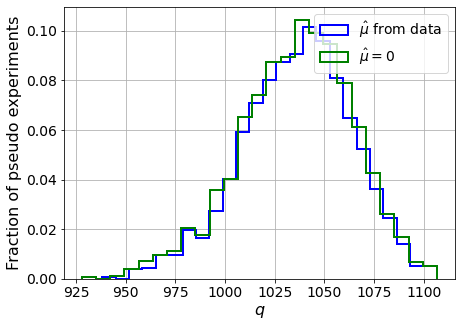

muhat mean:  0.00029129375524276316
Z_bins:  32.21658800321288
std Z_bins:  0.4297301701750192
Z_bins mu=0:  32.21658800321288
std Z_bins mu=0:  0.4418835983513899

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.106


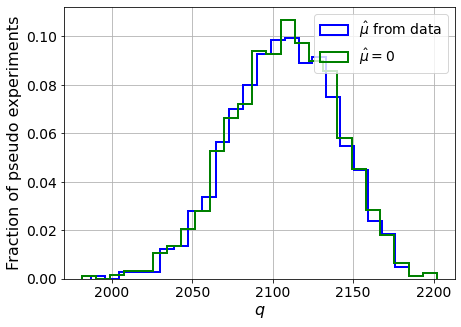

muhat mean:  5.5401775037133396e-05
Z_bins:  45.91254259309009
std Z_bins:  0.35714474242327526
Z_bins mu=0:  45.91238432467174
std Z_bins mu=0:  0.36394850400465195

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


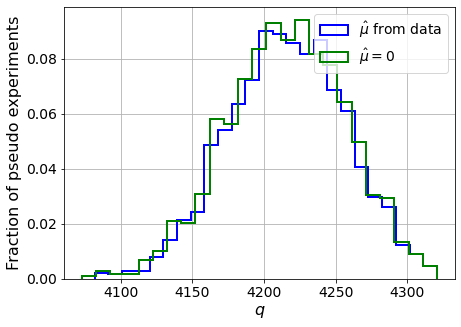

muhat mean:  5.5988348389667796e-05
Z_bins:  64.93134006584754
std Z_bins:  0.3134762802256439
Z_bins mu=0:  64.92986525721653
std Z_bins mu=0:  0.3182197843677731

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


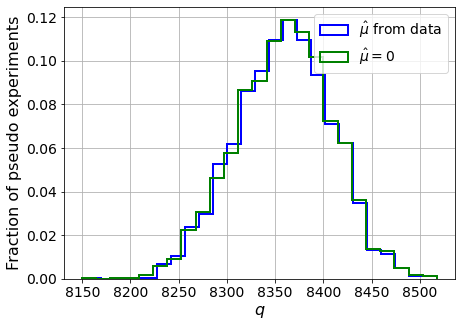

muhat mean:  1.4559460788341378e-05
Z_bins:  91.43946574857017
std Z_bins:  0.27091780434042284
Z_bins mu=0:  91.43810368487101
std Z_bins mu=0:  0.27419596995664836

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


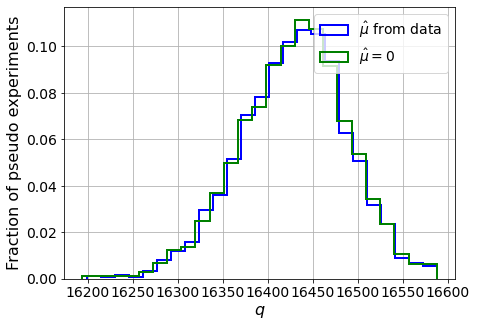

muhat mean:  2.644850866801437e-05
Z_bins:  128.18703780281382
std Z_bins:  0.23107429418501568
Z_bins mu=0:  128.1858072035594
std Z_bins mu=0:  0.23337200954412451

--------


 FINAL RESULT:

[[0.23278119852594878, 0.5920868231691173, -0.006079420322355855, 0.2321967666567382, 1.001665263608598], [0.4661867451753134, 0.6015517056970618, 0.03986702755487132, 0.46570740433179925, 0.9483620513928759], [0.7016236729920166, 0.5825259990181586, 0.07345188283193027, 0.7014770108644046, 0.9080183715330454], [1.3467637661223377, 0.6751227336097463, 0.009065381864581548, 1.3467477065134028, 0.8866971811814796], [2.4734135335510903, 0.7061752169704134, -0.0026254099447317308, 2.4734135335510903, 0.8408834978881379], [4.110455972988322, 0.7037444636917247, 0.0020334809135009093, 4.110445278594313, 0.7914852965104437], [6.533478137582746, 0.6738295855701851, 0.005570031406092565, 6.533294951258744, 0.7327677844629028], [10.153125956103342, 0.6138000234984528, 0.0010573546564135701, 10.15106037824

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 293.19412648 250.83154621 207.24442667
 156.73419444  99.51637931  35.85436357 -29.13301913 -96.54147528]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 333.54597558 281.44188116
 221

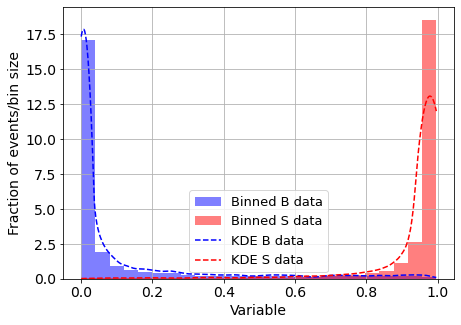

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



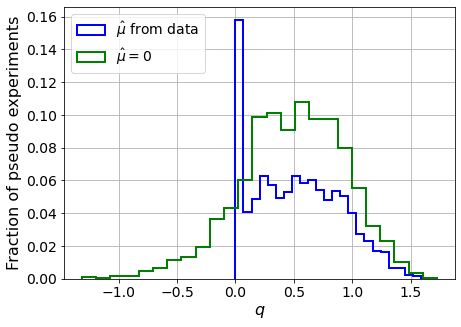

muhat mean:  -4.326700511372679
Z_bins:  0.7190265749175819
std Z_bins:  0.26345137912774585
Z_bins mu=0:  0.7190265749175819
std Z_bins mu=0:  0.31152351162119635

--------

B_expected:  643
S_expected:  2



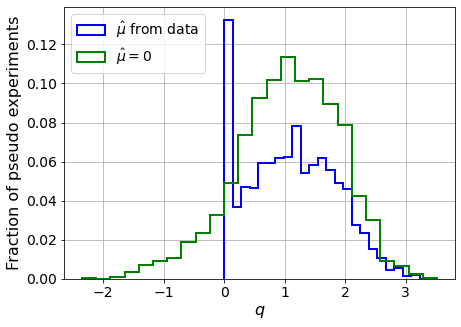

muhat mean:  -2.146758896827684
Z_bins:  1.0525256038424124
std Z_bins:  0.3482828160460495
Z_bins mu=0:  1.0525256038424124
std Z_bins mu=0:  0.40320768359414294

--------

B_expected:  643
S_expected:  3



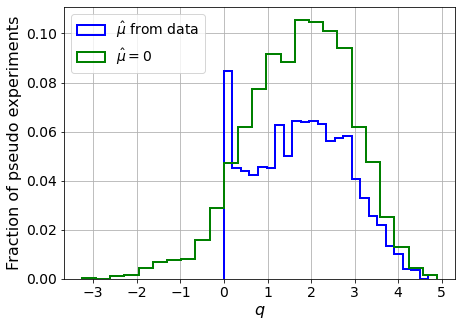

muhat mean:  -1.437446719853754
Z_bins:  1.3442833007421662
std Z_bins:  0.3992980400350632
Z_bins mu=0:  1.3442833007421662
std Z_bins mu=0:  0.44371581089193585

--------

B_expected:  643
S_expected:  6



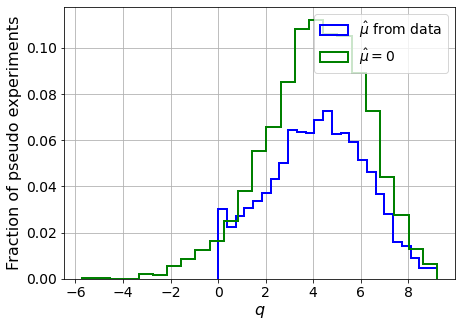

muhat mean:  -0.6880706803792205
Z_bins:  2.0636477409733085
std Z_bins:  0.4837686646469365
Z_bins mu=0:  2.0636477409733085
std Z_bins mu=0:  0.5214483730963977

--------

B_expected:  643
S_expected:  12



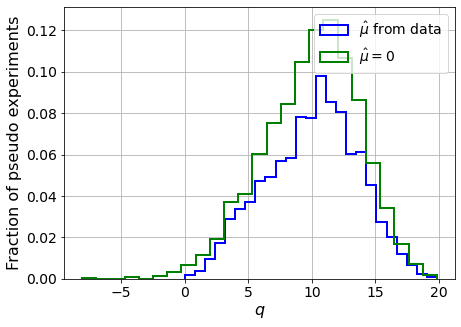

muhat mean:  -0.3724725292280773
Z_bins:  3.213601692048512
std Z_bins:  0.5619010537209582
Z_bins mu=0:  3.213601692048512
std Z_bins mu=0:  0.5872946728599379

--------

B_expected:  643
S_expected:  23



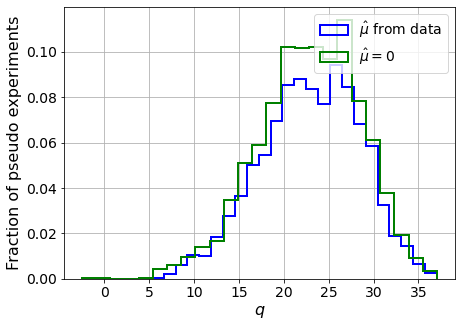

muhat mean:  -0.19247627233568587
Z_bins:  4.808438601103254
std Z_bins:  0.5764492973752865
Z_bins mu=0:  4.808438601103254
std Z_bins mu=0:  0.5917453527439023

--------

B_expected:  643
S_expected:  44



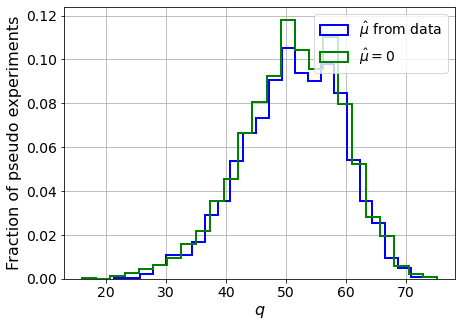

muhat mean:  -0.1044613828597808
Z_bins:  7.172778334717159
std Z_bins:  0.5798254660986897
Z_bins mu=0:  7.172778334717159
std Z_bins mu=0:  0.5930022657754467

--------

B_expected:  643
S_expected:  85



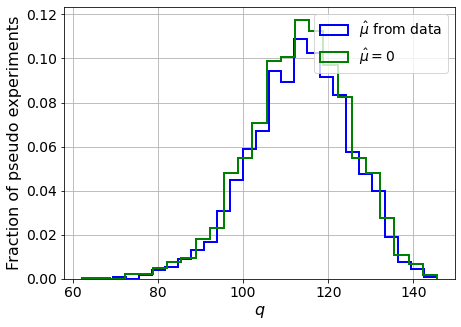

muhat mean:  -0.05181743423533311
Z_bins:  10.670172279493185
std Z_bins:  0.5467380046448024
Z_bins mu=0:  10.670172279493185
std Z_bins mu=0:  0.5546427603774085

--------

B_expected:  643
S_expected:  165



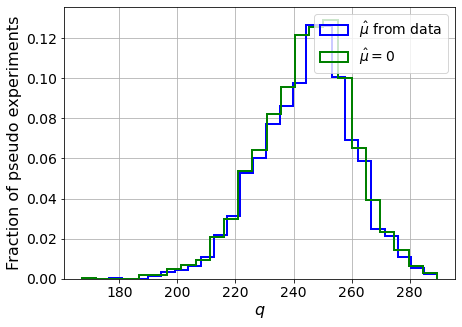

muhat mean:  -0.024199138374508076
Z_bins:  15.675058668538368
std Z_bins:  0.508326028737599
Z_bins mu=0:  15.675058668538368
std Z_bins mu=0:  0.5149233084824683

--------

B_expected:  643
S_expected:  318



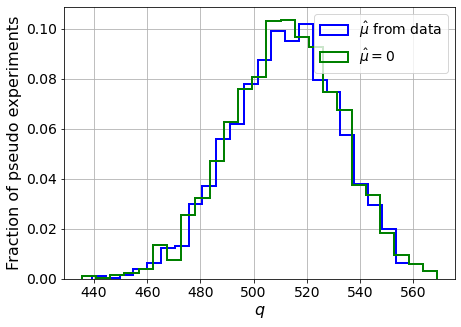

muhat mean:  -0.013436999290973
Z_bins:  22.63451073725506
std Z_bins:  0.4538127578025547
Z_bins mu=0:  22.63451073725506
std Z_bins mu=0:  0.45679115919433955

--------

B_expected:  643
S_expected:  615



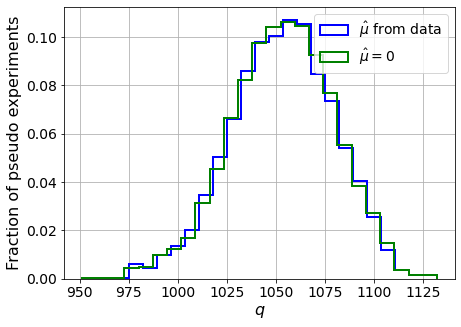

muhat mean:  -0.008076895523281623
Z_bins:  32.46559300138802
std Z_bins:  0.40375296860905874
Z_bins mu=0:  32.46559300138802
std Z_bins mu=0:  0.40576973041473663

--------

B_expected:  643
S_expected:  1187



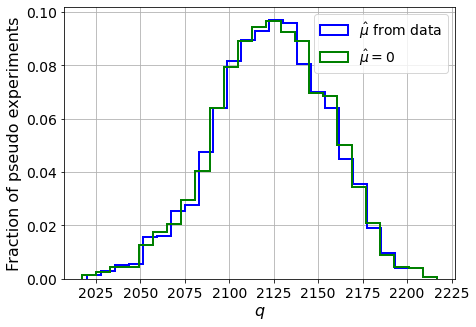

muhat mean:  -0.003891801917357249
Z_bins:  46.089027858663826
std Z_bins:  0.34599751832044806
Z_bins mu=0:  46.089027858663826
std Z_bins mu=0:  0.3473673519088622

--------

B_expected:  643
S_expected:  2291



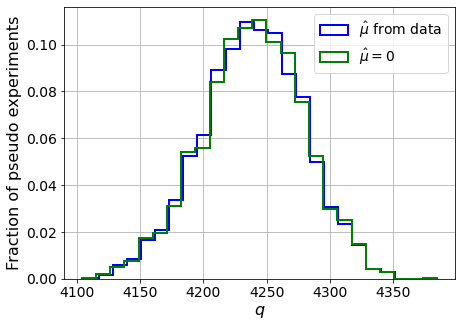

muhat mean:  -0.0019219663664833094
Z_bins:  65.1164388649345
std Z_bins:  0.3058214643273125
Z_bins mu=0:  65.1164388649345
std Z_bins mu=0:  0.3067939585115157

--------

B_expected:  643
S_expected:  4424



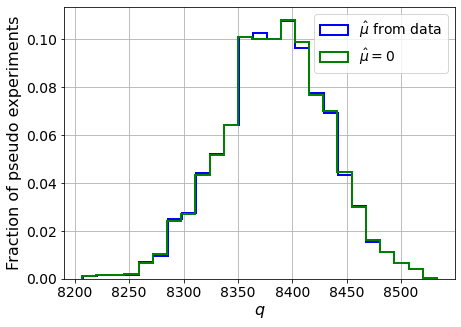

muhat mean:  -0.0009717028309830551
Z_bins:  91.57015757396397
std Z_bins:  0.26662130980690296
Z_bins mu=0:  91.57015757396397
std Z_bins mu=0:  0.26714641799624145

--------

B_expected:  643
S_expected:  8542



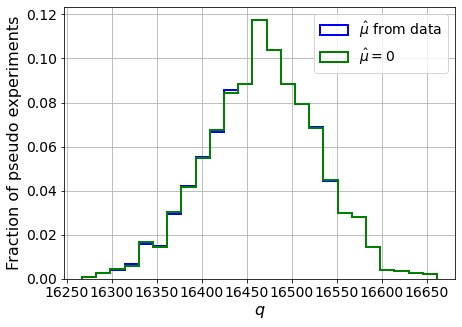

muhat mean:  -0.0005137389585825792
Z_bins:  128.32685211566766
std Z_bins:  0.23864904537619974
Z_bins mu=0:  128.32685211566766
std Z_bins mu=0:  0.2391087816946036

--------


 FINAL RESULT:

[[0.7190265749175819, 0.26345137912774585, -4.326700511372679, 0.7190265749175819, 0.31152351162119635], [1.0525256038424124, 0.3482828160460495, -2.146758896827684, 1.0525256038424124, 0.40320768359414294], [1.3442833007421662, 0.3992980400350632, -1.437446719853754, 1.3442833007421662, 0.44371581089193585], [2.0636477409733085, 0.4837686646469365, -0.6880706803792205, 2.0636477409733085, 0.5214483730963977], [3.213601692048512, 0.5619010537209582, -0.3724725292280773, 3.213601692048512, 0.5872946728599379], [4.808438601103254, 0.5764492973752865, -0.19247627233568587, 4.808438601103254, 0.5917453527439023], [7.172778334717159, 0.5798254660986897, -0.1044613828597808, 7.172778334717159, 0.5930022657754467], [10.670172279493185, 0.5467380046448024, -0.05181743423533311, 10.670172279493185, 0.55

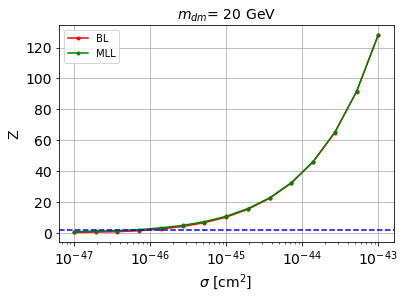


cross_BL_164:  8.540956307132925e-47
cross_BL_164_up:  5.119694032134222e-47
cross_BL_164_down:  1.320331747027662e-46

cross_MLL_164:  4.88517521501969e-47
cross_MLL_164_up:  3.424614799532457e-47
cross_MLL_164_down:  7.467396727613614e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


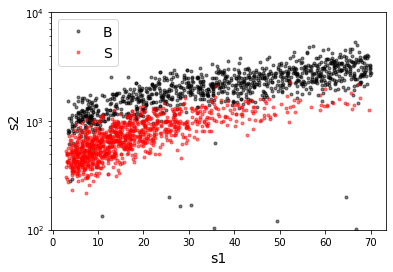

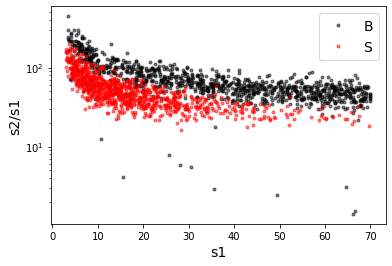

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)

Classification score:


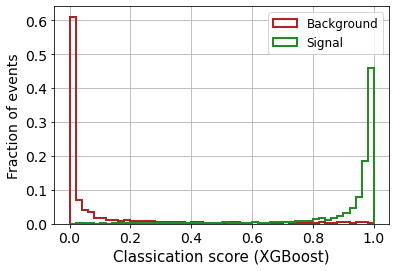


 ROC-AUC =  0.9849718447897439
At least 5 B events per bin, range = [[0, 1]]:
# bins:  14 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  14
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


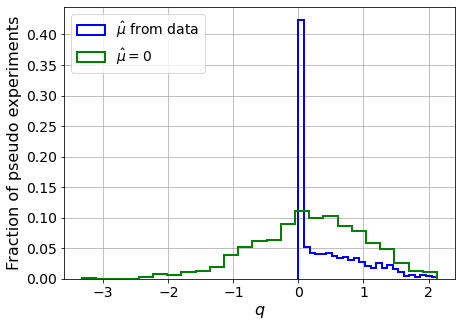

muhat mean:  0.036859279941485114
Z_bins:  0.46534130411357033
std Z_bins:  0.5574066927637326
Z_bins mu=0:  0.46534130411357033
std Z_bins mu=0:  0.8998000657773304

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.101


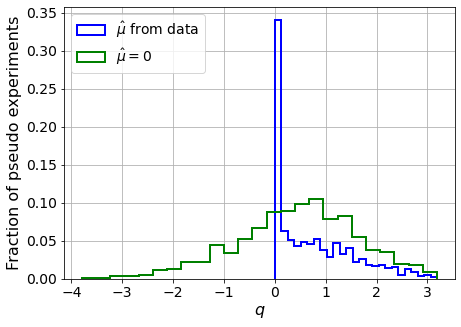

muhat mean:  -0.010109351723353267
Z_bins:  0.7210294017705946
std Z_bins:  0.5443430171361836
Z_bins mu=0:  0.7210294017705946
std Z_bins mu=0:  0.8252694408049018

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


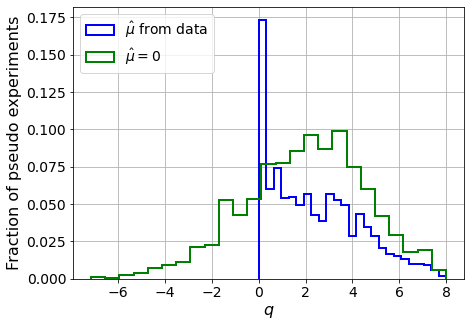

muhat mean:  0.021100836703992685
Z_bins:  1.4516334154175219
std Z_bins:  0.6674298179146093
Z_bins mu=0:  1.4516334154175219
std Z_bins mu=0:  0.8904613386279842

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


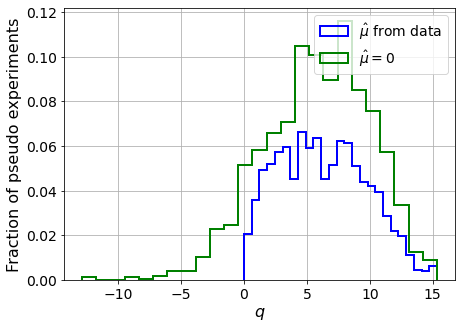

muhat mean:  0.010272945572501899
Z_bins:  2.461802058372311
std Z_bins:  0.6991385933111695
Z_bins mu=0:  2.461802058372311
std Z_bins mu=0:  0.8417567442140299

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.103


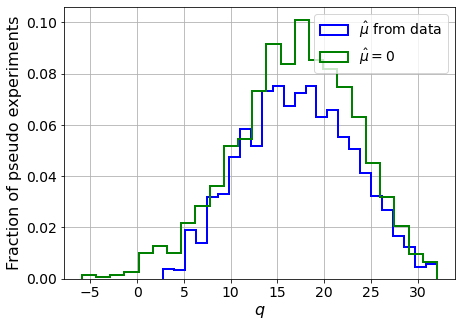

muhat mean:  0.00481793749584485
Z_bins:  4.140653586229838
std Z_bins:  0.6957016113717132
Z_bins mu=0:  4.140653586229838
std Z_bins mu=0:  0.7805081771408657

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


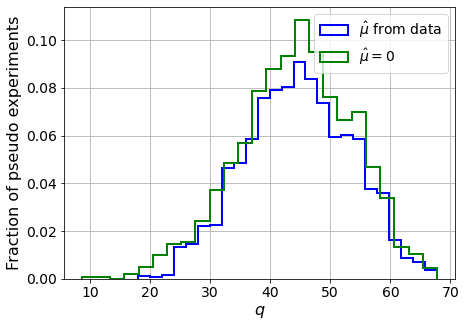

muhat mean:  -0.001347472760184201
Z_bins:  6.6827715342349645
std Z_bins:  0.6610516072525032
Z_bins mu=0:  6.682495008321859
std Z_bins mu=0:  0.7091410162298628

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.081


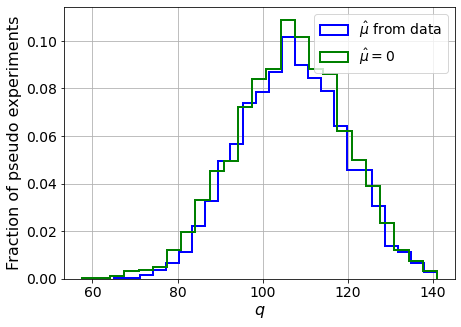

muhat mean:  0.0017188324034540085
Z_bins:  10.335712938687731
std Z_bins:  0.5967710924918762
Z_bins mu=0:  10.334344859890724
std Z_bins mu=0:  0.6272963844590818

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


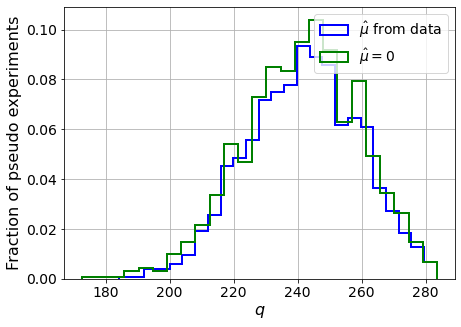

muhat mean:  0.00046921698465852936
Z_bins:  15.565231468385194
std Z_bins:  0.5547374903281452
Z_bins mu=0:  15.56463689487632
std Z_bins mu=0:  0.57699827103074

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


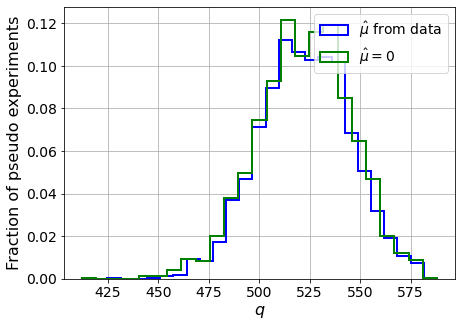

muhat mean:  4.366303693797255e-05
Z_bins:  22.861504817612417
std Z_bins:  0.49017495186475585
Z_bins mu=0:  22.860824708755533
std Z_bins mu=0:  0.5043230801299712

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.101


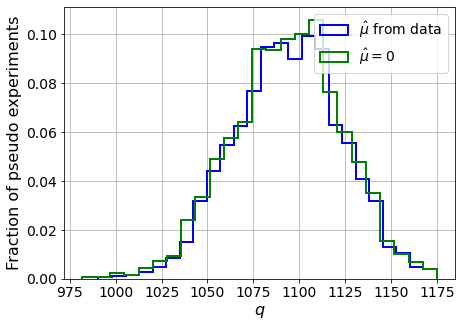

muhat mean:  0.00029513730277995075
Z_bins:  33.083846050007054
std Z_bins:  0.4404747278759512
Z_bins mu=0:  33.08246727505254
std Z_bins mu=0:  0.45070119407276693

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


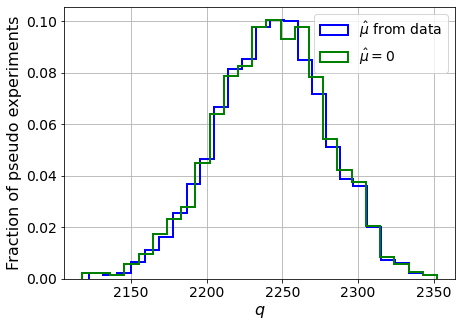

muhat mean:  1.523398978965472e-05
Z_bins:  47.36957834704256
std Z_bins:  0.3846091886225894
Z_bins mu=0:  47.368501050967765
std Z_bins mu=0:  0.39082689626584743

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


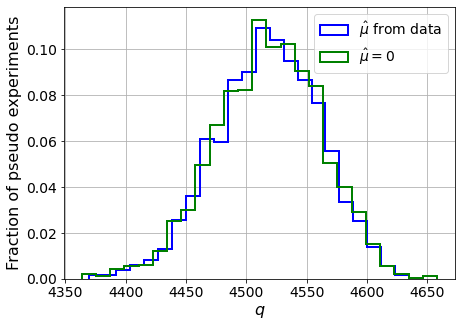

muhat mean:  -4.658898695969704e-06
Z_bins:  67.22562536425816
std Z_bins:  0.3226813772324617
Z_bins mu=0:  67.22473134794515
std Z_bins mu=0:  0.327059634630503

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


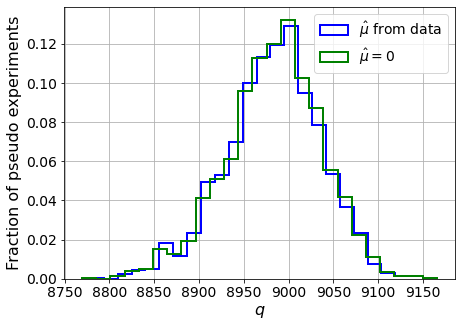

muhat mean:  4.011915683454819e-05
Z_bins:  94.79446898499327
std Z_bins:  0.27914758203346807
Z_bins mu=0:  94.79361593423002
std Z_bins mu=0:  0.2825359229154364

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


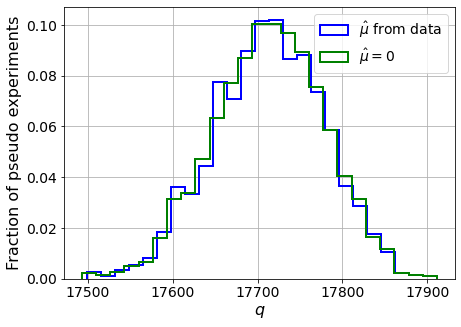

muhat mean:  -1.794393953026542e-06
Z_bins:  133.09714555076368
std Z_bins:  0.24403094642248224
Z_bins mu=0:  133.0965647261496
std Z_bins mu=0:  0.24574597126308373

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


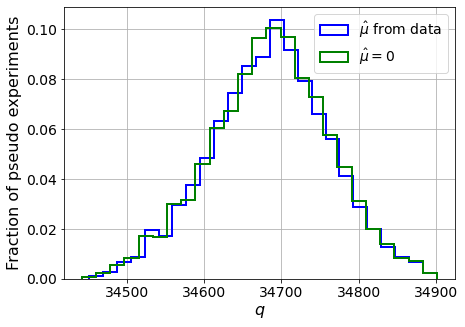

muhat mean:  1.7199988493458083e-05
Z_bins:  186.24850062922926
std Z_bins:  0.20653348723099055
Z_bins mu=0:  186.24811279739362
std Z_bins mu=0:  0.20798692518893097

--------


 FINAL RESULT:

[[0.46534130411357033, 0.5574066927637326, 0.036859279941485114, 0.46534130411357033, 0.8998000657773304], [0.7210294017705946, 0.5443430171361836, -0.010109351723353267, 0.7210294017705946, 0.8252694408049018], [1.4516334154175219, 0.6674298179146093, 0.021100836703992685, 1.4516334154175219, 0.8904613386279842], [2.461802058372311, 0.6991385933111695, 0.010272945572501899, 2.461802058372311, 0.8417567442140299], [4.140653586229838, 0.6957016113717132, 0.00481793749584485, 4.140653586229838, 0.7805081771408657], [6.6827715342349645, 0.6610516072525032, -0.001347472760184201, 6.682495008321859, 0.7091410162298628], [10.335712938687731, 0.5967710924918762, 0.0017188324034540085, 10.334344859890724, 0.6272963844590818], [15.565231468385194, 0.5547374903281452, 0.00046921698465852936, 15.56463689

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 335.50550954 297.8823724  256.27620658 209.15598502
 157.31268285  98.42976641  35.59073262 -31.23610236 -97.7495196 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 319.77071757 286.77601752 241.77430805
 188

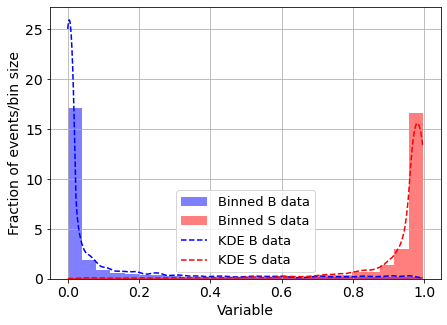

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



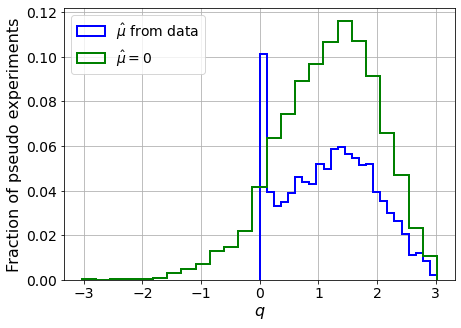

muhat mean:  -3.523164378382931
Z_bins:  1.1142581246732546
std Z_bins:  0.33689330154153846
Z_bins mu=0:  1.1142581246732546
std Z_bins mu=0:  0.38308598547867306

--------

B_expected:  643
S_expected:  3



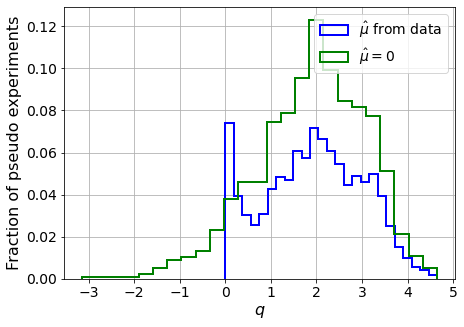

muhat mean:  -2.111344288372875
Z_bins:  1.4080309344667448
std Z_bins:  0.38359690764227145
Z_bins mu=0:  1.4080309344667448
std Z_bins mu=0:  0.42790669158923966

--------

B_expected:  643
S_expected:  7



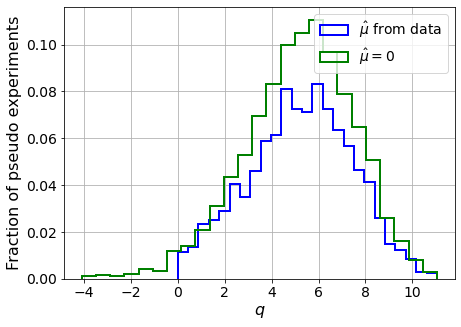

muhat mean:  -0.8442090646285767
Z_bins:  2.305213778313091
std Z_bins:  0.47628239742979667
Z_bins mu=0:  2.305213778313091
std Z_bins mu=0:  0.5039676589049565

--------

B_expected:  643
S_expected:  13



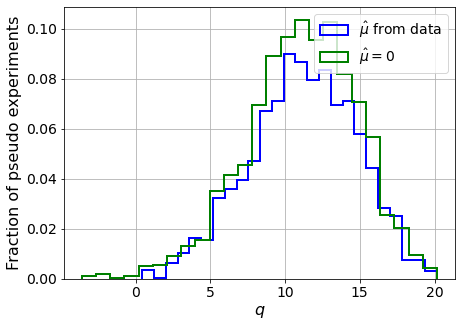

muhat mean:  -0.45278090063980037
Z_bins:  3.363490663213751
std Z_bins:  0.5273929359824886
Z_bins mu=0:  3.363490663213751
std Z_bins mu=0:  0.5479095937485724

--------

B_expected:  643
S_expected:  25



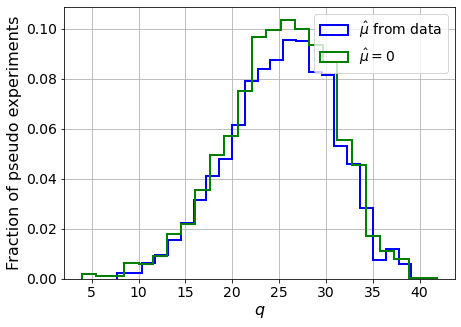

muhat mean:  -0.2454201107191733
Z_bins:  5.057023190119867
std Z_bins:  0.5562666830091078
Z_bins mu=0:  5.057023190119867
std Z_bins mu=0:  0.5694415557682836

--------

B_expected:  643
S_expected:  48



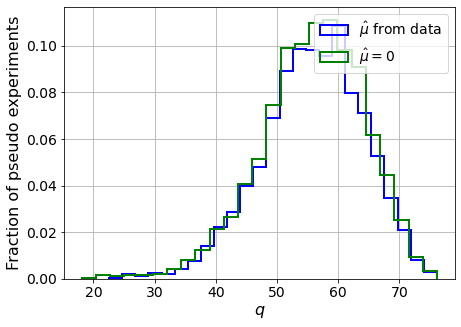

muhat mean:  -0.13374319189743886
Z_bins:  7.500481827245313
std Z_bins:  0.5477808397685938
Z_bins mu=0:  7.500481827245313
std Z_bins mu=0:  0.55903146796779

--------

B_expected:  643
S_expected:  93



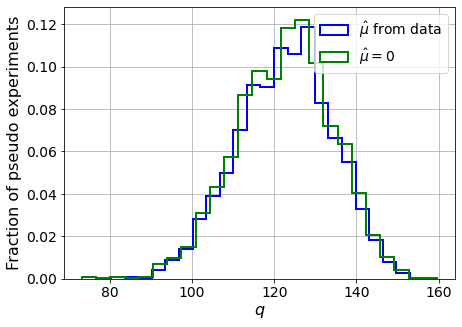

muhat mean:  -0.06592194601909104
Z_bins:  11.091912600856615
std Z_bins:  0.523234628319883
Z_bins mu=0:  11.091912600856615
std Z_bins mu=0:  0.5288960059573029

--------

B_expected:  643
S_expected:  179



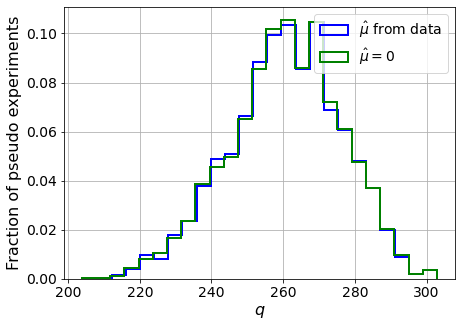

muhat mean:  -0.03465964825517746
Z_bins:  16.15666019027143
std Z_bins:  0.4829707377977349
Z_bins mu=0:  16.15666019027143
std Z_bins mu=0:  0.4860477328993519

--------

B_expected:  643
S_expected:  345



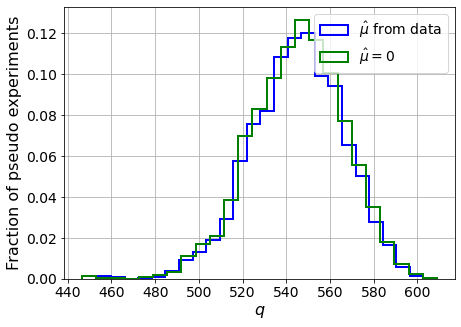

muhat mean:  -0.017896279960945144
Z_bins:  23.366672235335283
std Z_bins:  0.4522143210115411
Z_bins mu=0:  23.366672235335283
std Z_bins mu=0:  0.45522382781253623

--------

B_expected:  643
S_expected:  666



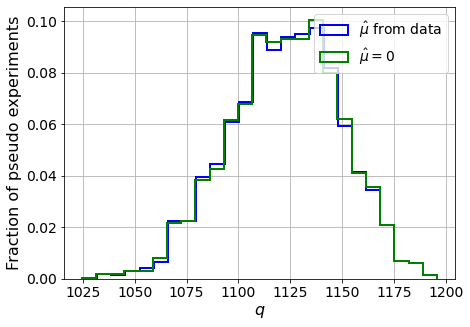

muhat mean:  -0.009158307921860622
Z_bins:  33.52511984837519
std Z_bins:  0.4012544895962493
Z_bins mu=0:  33.52511984837519
std Z_bins mu=0:  0.40271991598458917

--------

B_expected:  643
S_expected:  1286



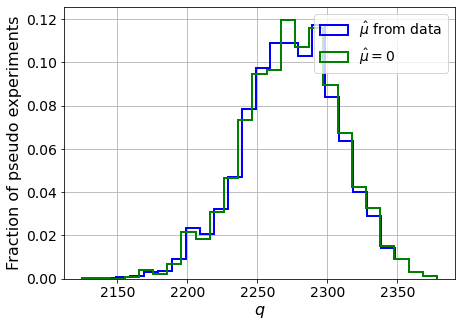

muhat mean:  -0.004851435519495197
Z_bins:  47.7040604643664
std Z_bins:  0.36626290306351533
Z_bins mu=0:  47.7040604643664
std Z_bins mu=0:  0.3672234948988022

--------

B_expected:  643
S_expected:  2484



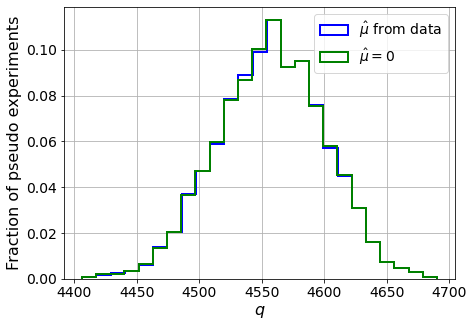

muhat mean:  -0.0023995735040872714
Z_bins:  67.51733886392789
std Z_bins:  0.3178055993245802
Z_bins mu=0:  67.51714441521769
std Z_bins mu=0:  0.31836404659777306

--------

B_expected:  643
S_expected:  4795



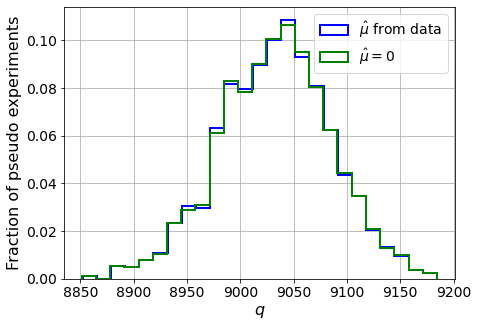

muhat mean:  -0.0011954263759276777
Z_bins:  95.04903828895645
std Z_bins:  0.27565969828839804
Z_bins mu=0:  95.04903828895645
std Z_bins mu=0:  0.27613394924945944

--------

B_expected:  643
S_expected:  9258



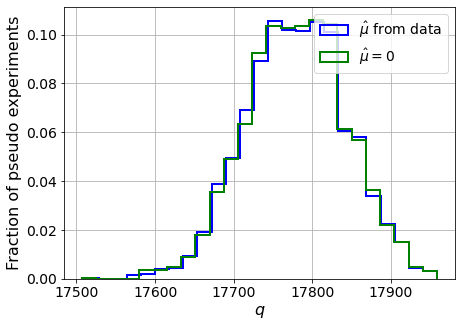

muhat mean:  -0.00065698221332921
Z_bins:  133.34253648331304
std Z_bins:  0.23838213272856085
Z_bins mu=0:  133.34200748536963
std Z_bins mu=0:  0.23869157887543715

--------

B_expected:  643
S_expected:  17875



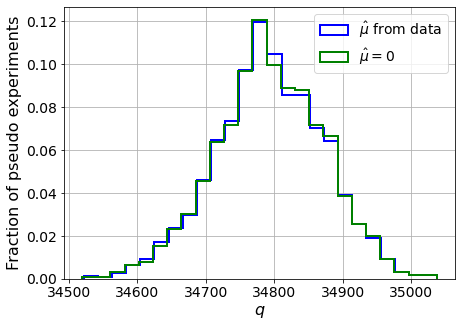

muhat mean:  -0.00033042565406130443
Z_bins:  186.52767488803147
std Z_bins:  0.21204920710575423
Z_bins mu=0:  186.52730761693394
std Z_bins mu=0:  0.21224579475526892

--------


 FINAL RESULT:

[[1.1142581246732546, 0.33689330154153846, -3.523164378382931, 1.1142581246732546, 0.38308598547867306], [1.4080309344667448, 0.38359690764227145, -2.111344288372875, 1.4080309344667448, 0.42790669158923966], [2.305213778313091, 0.47628239742979667, -0.8442090646285767, 2.305213778313091, 0.5039676589049565], [3.363490663213751, 0.5273929359824886, -0.45278090063980037, 3.363490663213751, 0.5479095937485724], [5.057023190119867, 0.5562666830091078, -0.2454201107191733, 5.057023190119867, 0.5694415557682836], [7.500481827245313, 0.5477808397685938, -0.13374319189743886, 7.500481827245313, 0.55903146796779], [11.091912600856615, 0.523234628319883, -0.06592194601909104, 11.091912600856615, 0.5288960059573029], [16.15666019027143, 0.4829707377977349, -0.03465964825517746, 16.15666019027143, 0.486

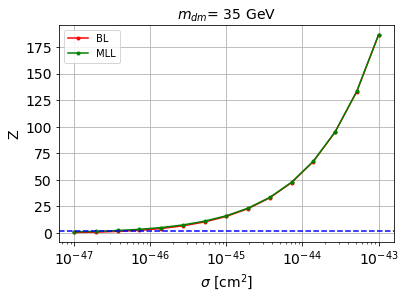


cross_BL_164:  4.2141097125643503e-47
cross_BL_164_up:  2.754577209879155e-47
cross_BL_164_down:  6.859778649607772e-47

cross_MLL_164:  2.28868746870911e-47
cross_MLL_164_up:  1.4403705154460778e-47
cross_MLL_164_down:  3.294824347340883e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


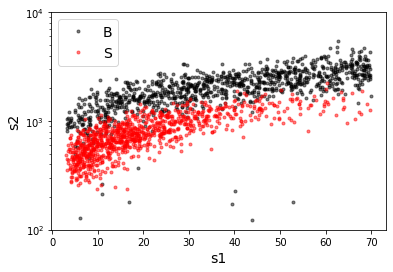

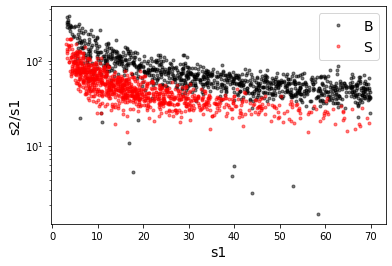

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)

Classification score:


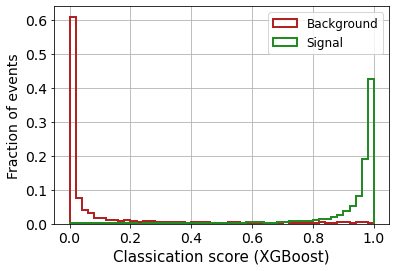


 ROC-AUC =  0.9825980484193699
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


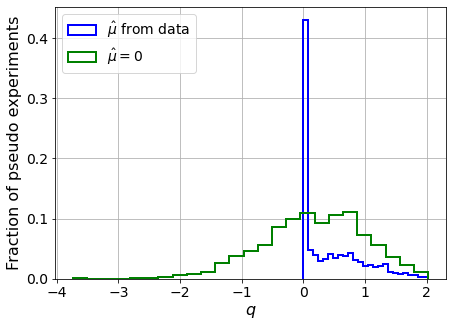

muhat mean:  0.05475637520383459
Z_bins:  0.4516646450605832
std Z_bins:  0.5545060068426545
Z_bins mu=0:  0.4516646450605832
std Z_bins mu=0:  0.9065963337646412

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


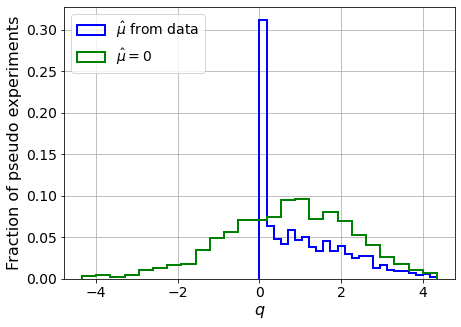

muhat mean:  0.01647960313765573
Z_bins:  0.8845545254358281
std Z_bins:  0.5954625186896628
Z_bins mu=0:  0.8845545254358281
std Z_bins mu=0:  0.8701522545127653

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.102


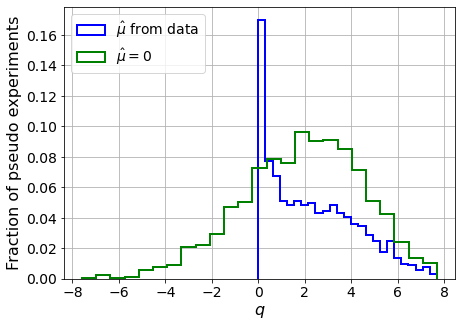

muhat mean:  0.021154554090212368
Z_bins:  1.4305882865744348
std Z_bins:  0.66763211480078
Z_bins mu=0:  1.4305882865744348
std Z_bins mu=0:  0.8944257310725154

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


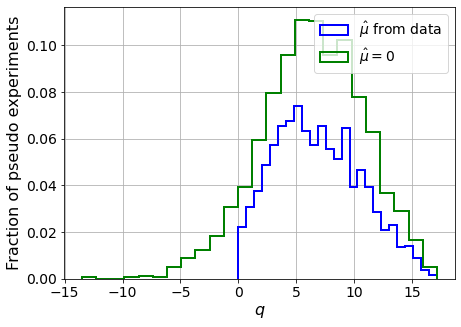

muhat mean:  0.010291732857176272
Z_bins:  2.5622844262812796
std Z_bins:  0.7206525651107619
Z_bins mu=0:  2.5615805885980163
std Z_bins mu=0:  0.8578071007585439

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


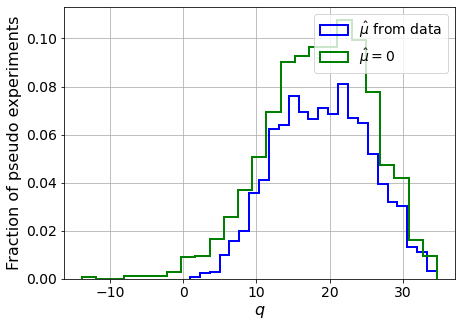

muhat mean:  0.0008138268183923255
Z_bins:  4.367708846951595
std Z_bins:  0.7240164214570137
Z_bins mu=0:  4.367582380590017
std Z_bins mu=0:  0.813418961220603

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


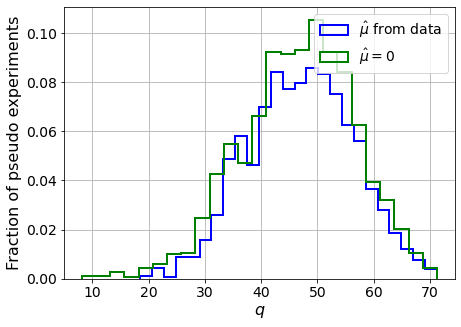

muhat mean:  0.003635862590559379
Z_bins:  6.867771415223615
std Z_bins:  0.6745538311677015
Z_bins mu=0:  6.867045269362936
std Z_bins mu=0:  0.730174567640144

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


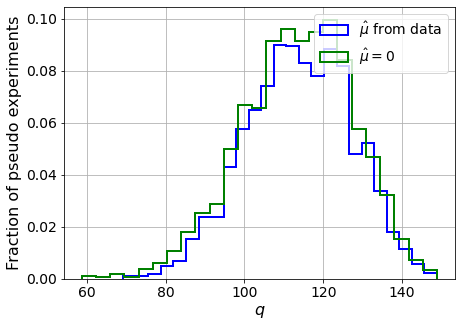

muhat mean:  0.0016304598401765157
Z_bins:  10.674235704127046
std Z_bins:  0.6251742411541302
Z_bins mu=0:  10.674234305538585
std Z_bins mu=0:  0.6610756859268323

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0875


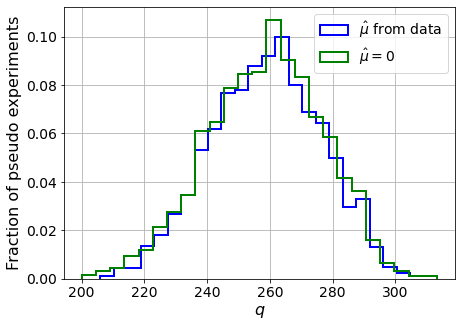

muhat mean:  0.0005624320555329507
Z_bins:  16.106818667008476
std Z_bins:  0.549094821267281
Z_bins mu=0:  16.106818667008476
std Z_bins mu=0:  0.5701022933196602

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


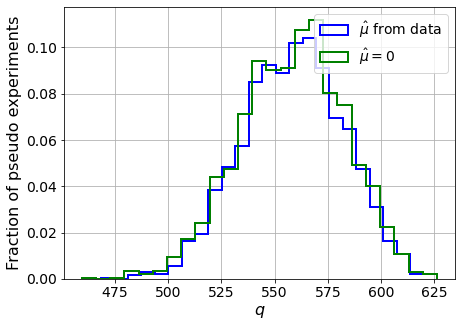

muhat mean:  0.00037604861211320976
Z_bins:  23.655835502754073
std Z_bins:  0.5039298839275896
Z_bins mu=0:  23.655835502754073
std Z_bins mu=0:  0.5184448410639508

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


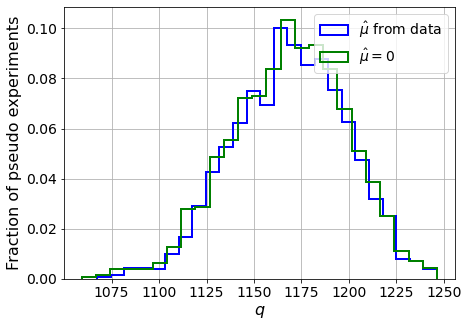

muhat mean:  0.00035475613410477954
Z_bins:  34.199785876328065
std Z_bins:  0.4339837486922763
Z_bins mu=0:  34.19806760511936
std Z_bins mu=0:  0.4442579280380903

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


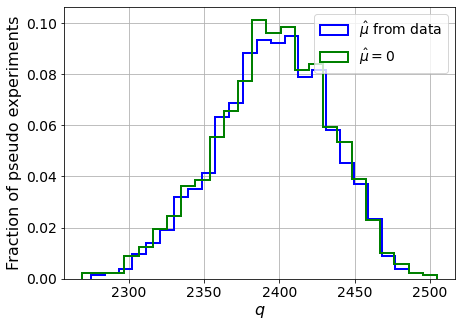

muhat mean:  0.00010665765638389814
Z_bins:  48.955410241651116
std Z_bins:  0.38788657492531475
Z_bins mu=0:  48.95515399448653
std Z_bins mu=0:  0.39477853548061925

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


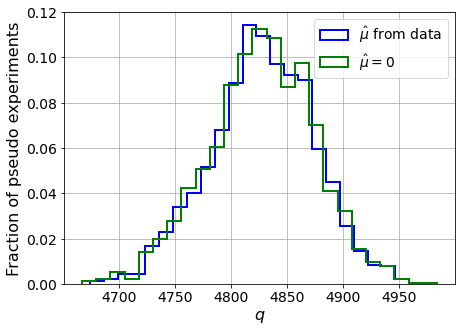

muhat mean:  7.992254527074179e-05
Z_bins:  69.49234737631524
std Z_bins:  0.33312956825238343
Z_bins mu=0:  69.49158417266139
std Z_bins mu=0:  0.33774829539145473

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


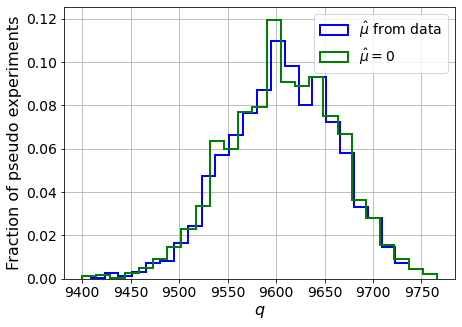

muhat mean:  4.334368625475393e-05
Z_bins:  98.01628923851821
std Z_bins:  0.28549907320301504
Z_bins mu=0:  98.01523780212483
std Z_bins mu=0:  0.2884400766820989

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


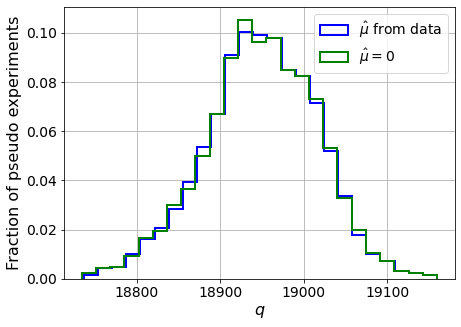

muhat mean:  8.322599508339855e-06
Z_bins:  137.65730563715383
std Z_bins:  0.2432568552543723
Z_bins mu=0:  137.6559867824525
std Z_bins mu=0:  0.24525890155487517

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


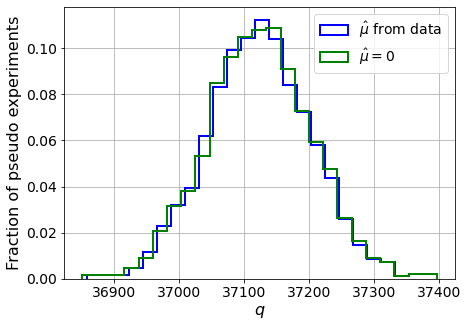

muhat mean:  -1.2207533204821956e-06
Z_bins:  192.67718211139967
std Z_bins:  0.20788574097773632
Z_bins mu=0:  192.67650085769742
std Z_bins mu=0:  0.2090147731050695

--------


 FINAL RESULT:

[[0.4516646450605832, 0.5545060068426545, 0.05475637520383459, 0.4516646450605832, 0.9065963337646412], [0.8845545254358281, 0.5954625186896628, 0.01647960313765573, 0.8845545254358281, 0.8701522545127653], [1.4305882865744348, 0.66763211480078, 0.021154554090212368, 1.4305882865744348, 0.8944257310725154], [2.5622844262812796, 0.7206525651107619, 0.010291732857176272, 2.5615805885980163, 0.8578071007585439], [4.367708846951595, 0.7240164214570137, 0.0008138268183923255, 4.367582380590017, 0.813418961220603], [6.867771415223615, 0.6745538311677015, 0.003635862590559379, 6.867045269362936, 0.730174567640144], [10.674235704127046, 0.6251742411541302, 0.0016304598401765157, 10.674234305538585, 0.6610756859268323], [16.106818667008476, 0.549094821267281, 0.0005624320555329507, 16.106818667008476, 

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  313.47320116  280.28184843  242.16411777  197.09540739
  144.64351373   88.19049194   27.41760775  -37.46430535 -100.79097939]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 272.335996

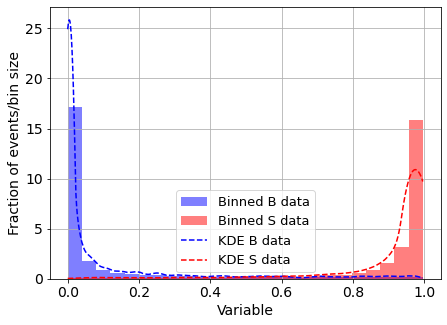

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



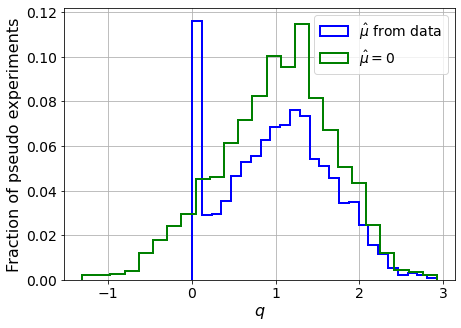

muhat mean:  -2.8285537094846807
Z_bins:  1.0288481908622271
std Z_bins:  0.305838799662552
Z_bins mu=0:  1.0288481908622271
std Z_bins mu=0:  0.33496664139517046

--------

B_expected:  643
S_expected:  4



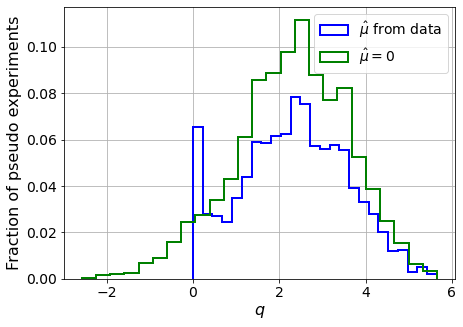

muhat mean:  -1.443951210285268
Z_bins:  1.5366635256339172
std Z_bins:  0.40254480933287334
Z_bins mu=0:  1.5366635256339172
std Z_bins mu=0:  0.43116765989427536

--------

B_expected:  643
S_expected:  7



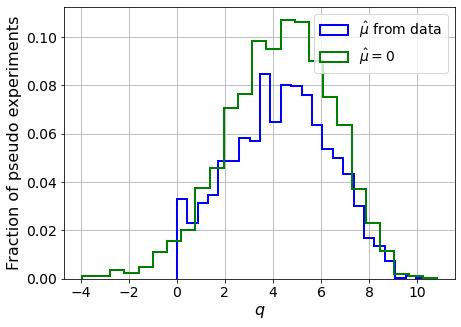

muhat mean:  -0.7796898671743786
Z_bins:  2.101414282992275
std Z_bins:  0.4916620949098838
Z_bins mu=0:  2.101414282992275
std Z_bins mu=0:  0.5207293402893917

--------

B_expected:  643
S_expected:  14



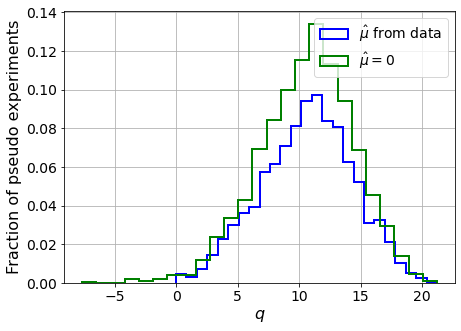

muhat mean:  -0.40420849357086935
Z_bins:  3.298225934264236
std Z_bins:  0.5598972608316855
Z_bins mu=0:  3.298225934264236
std Z_bins mu=0:  0.5808617650540648

--------

B_expected:  643
S_expected:  27



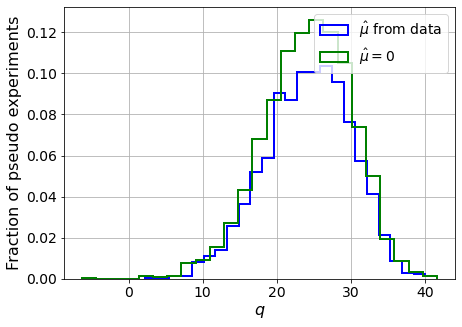

muhat mean:  -0.1982169103989685
Z_bins:  4.944857819156818
std Z_bins:  0.5874627444889656
Z_bins mu=0:  4.944857819156818
std Z_bins mu=0:  0.6015580870881047

--------

B_expected:  643
S_expected:  51



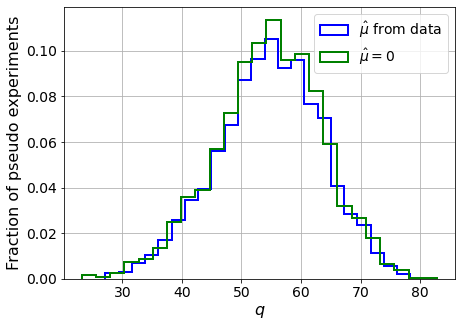

muhat mean:  -0.10985500985241838
Z_bins:  7.418404232191222
std Z_bins:  0.5941344794841941
Z_bins mu=0:  7.418404232191222
std Z_bins mu=0:  0.6011042881090001

--------

B_expected:  643
S_expected:  99



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


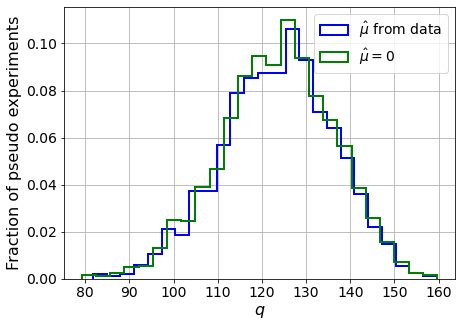

muhat mean:  -0.057991486685536074
Z_bins:  11.135925256275963
std Z_bins:  0.5652401623211579
Z_bins mu=0:  11.135925256275963
std Z_bins mu=0:  0.569358873600233

--------

B_expected:  643
S_expected:  192



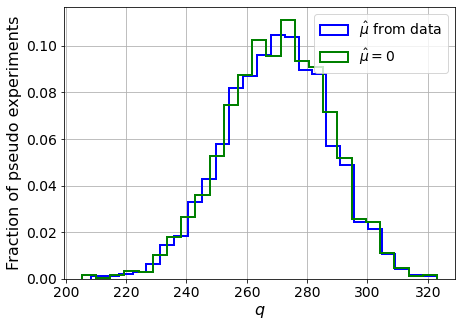

muhat mean:  -0.02869046215460277
Z_bins:  16.44763087511072
std Z_bins:  0.5231895440960946
Z_bins mu=0:  16.44763087511072
std Z_bins mu=0:  0.5262669742474918

--------

B_expected:  643
S_expected:  370



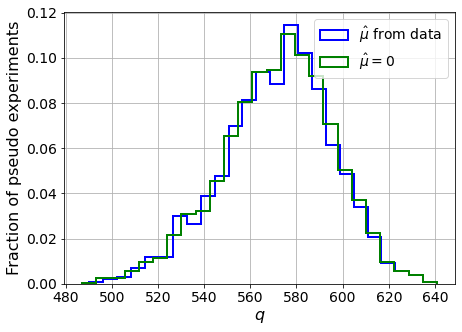

muhat mean:  -0.015452420800738931
Z_bins:  23.949329341903397
std Z_bins:  0.49794898249097674
Z_bins mu=0:  23.949329341903397
std Z_bins mu=0:  0.5006619280005324

--------

B_expected:  643
S_expected:  714



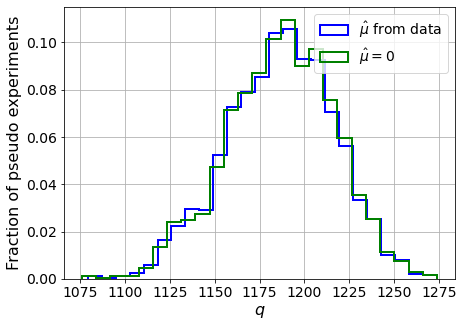

muhat mean:  -0.007805946153037906
Z_bins:  34.46727227464066
std Z_bins:  0.4340483886659656
Z_bins mu=0:  34.46727227464066
std Z_bins mu=0:  0.4352747615852271

--------

B_expected:  643
S_expected:  1378



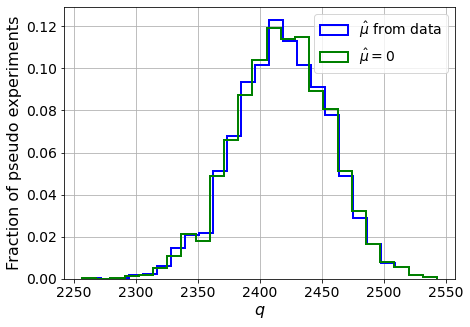

muhat mean:  -0.004032862780199667
Z_bins:  49.17353974147204
std Z_bins:  0.38911345874811515
Z_bins mu=0:  49.17353974147204
std Z_bins mu=0:  0.3899366824505561

--------

B_expected:  643
S_expected:  2661



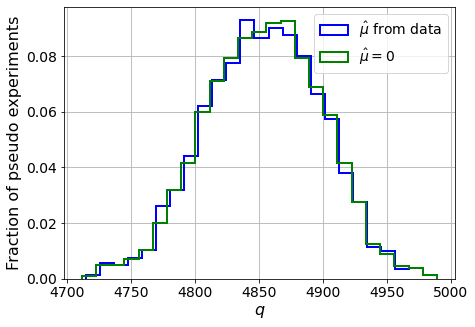

muhat mean:  -0.0020156064888053275
Z_bins:  69.67818754302968
std Z_bins:  0.3253733311416062
Z_bins mu=0:  69.67818754302968
std Z_bins mu=0:  0.3259196821556495

--------

B_expected:  643
S_expected:  5138



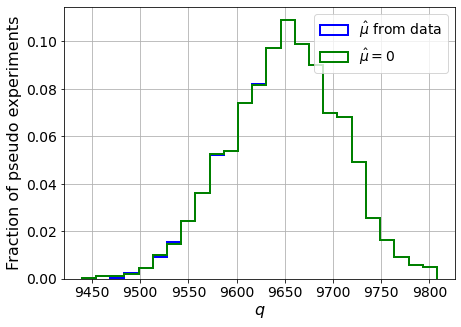

muhat mean:  -0.0011137680158047254
Z_bins:  98.23920342161585
std Z_bins:  0.29230930002019717
Z_bins mu=0:  98.23879068500965
std Z_bins mu=0:  0.2926679595375442

--------

B_expected:  643
S_expected:  9921



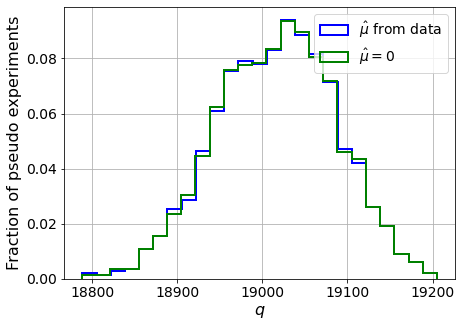

muhat mean:  -0.0005375728884489274
Z_bins:  137.90809404495934
std Z_bins:  0.25361768216051295
Z_bins mu=0:  137.90802856073827
std Z_bins mu=0:  0.2539029881903144

--------

B_expected:  643
S_expected:  19154



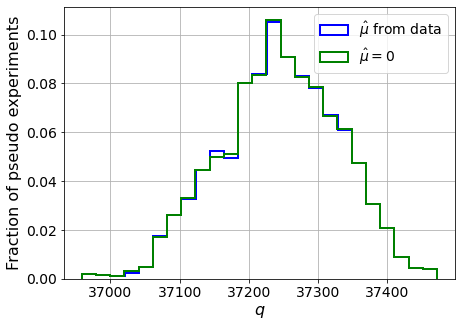

muhat mean:  -0.00028111053310852705
Z_bins:  192.9911967388703
std Z_bins:  0.2215583692208229
Z_bins mu=0:  192.9911967388703
std Z_bins mu=0:  0.2216996047491239

--------


 FINAL RESULT:

[[1.0288481908622271, 0.305838799662552, -2.8285537094846807, 1.0288481908622271, 0.33496664139517046], [1.5366635256339172, 0.40254480933287334, -1.443951210285268, 1.5366635256339172, 0.43116765989427536], [2.101414282992275, 0.4916620949098838, -0.7796898671743786, 2.101414282992275, 0.5207293402893917], [3.298225934264236, 0.5598972608316855, -0.40420849357086935, 3.298225934264236, 0.5808617650540648], [4.944857819156818, 0.5874627444889656, -0.1982169103989685, 4.944857819156818, 0.6015580870881047], [7.418404232191222, 0.5941344794841941, -0.10985500985241838, 7.418404232191222, 0.6011042881090001], [11.135925256275963, 0.5652401623211579, -0.057991486685536074, 11.135925256275963, 0.569358873600233], [16.44763087511072, 0.5231895440960946, -0.02869046215460277, 16.44763087511072, 0.526266

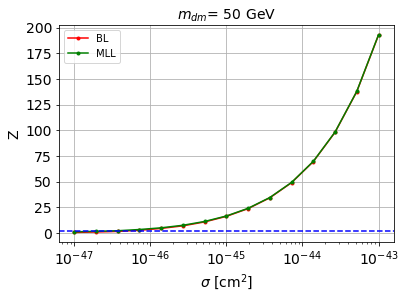


cross_BL_164:  4.210152376182652e-47
cross_BL_164_up:  2.2890401577246136e-47
cross_BL_164_down:  6.686123526789609e-47

cross_MLL_164:  2.1776770114304046e-47
cross_MLL_164_up:  1.4288023745656367e-47
cross_MLL_164_down:  3.7939028958627966e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


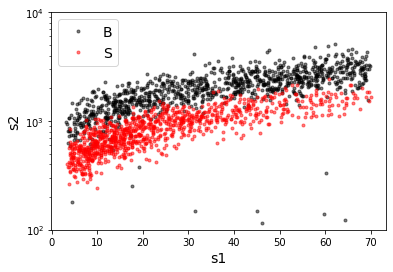

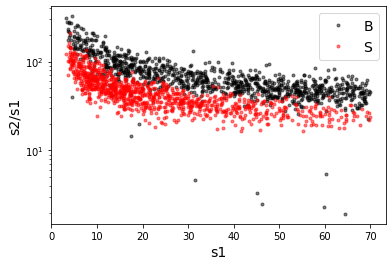

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

Classification score:


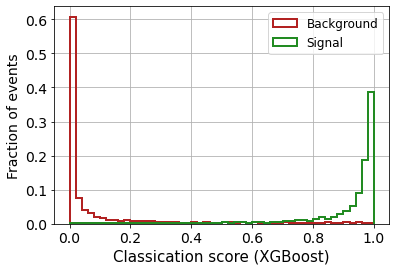


 ROC-AUC =  0.9810127488875269
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1115


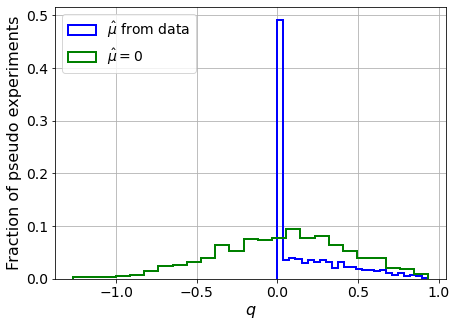

muhat mean:  0.27141968229430447
Z_bins:  0.22299945212537578
std Z_bins:  0.5200401681892584
Z_bins mu=0:  0.22294894558413206
std Z_bins mu=0:  0.918870693167632

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


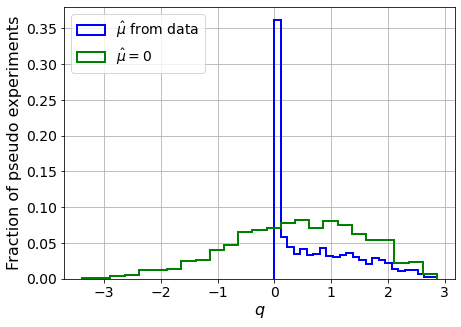

muhat mean:  0.0357040287586569
Z_bins:  0.6798627612136141
std Z_bins:  0.5533736091757065
Z_bins mu=0:  0.6798627612136141
std Z_bins mu=0:  0.8524842820195955

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


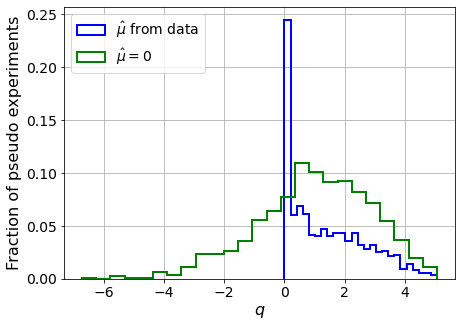

muhat mean:  0.037927100903626866
Z_bins:  1.069287857654836
std Z_bins:  0.6014474568774947
Z_bins mu=0:  1.069287857654836
std Z_bins mu=0:  0.8747396577850682

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


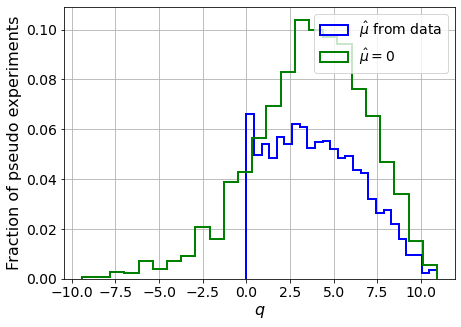

muhat mean:  0.010937769317183247
Z_bins:  1.972550638089642
std Z_bins:  0.6470385047481784
Z_bins mu=0:  1.972550638089642
std Z_bins mu=0:  0.8288577333432767

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1045


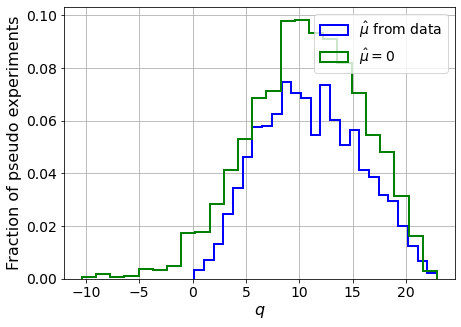

muhat mean:  0.005319688025607033
Z_bins:  3.2860456450338416
std Z_bins:  0.7035696087598919
Z_bins mu=0:  3.286017576593098
std Z_bins mu=0:  0.8085585331396813

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


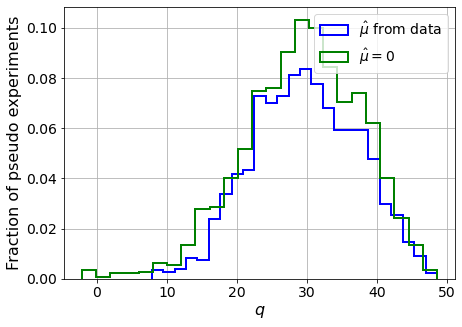

muhat mean:  0.0015126852777086032
Z_bins:  5.444119111846121
std Z_bins:  0.6900448623668547
Z_bins mu=0:  5.443997724072402
std Z_bins mu=0:  0.7596837762994649

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


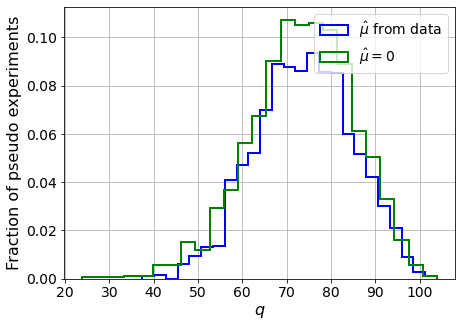

muhat mean:  0.0031132319566790478
Z_bins:  8.60675433617616
std Z_bins:  0.6299504353647988
Z_bins mu=0:  8.606703239687011
std Z_bins mu=0:  0.673142476473068

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1105


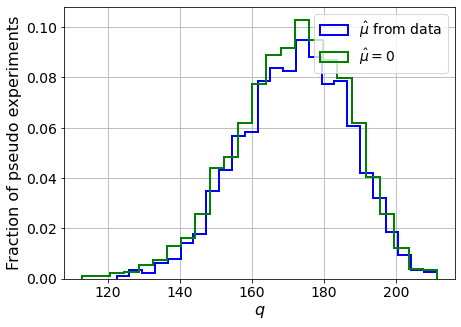

muhat mean:  0.0021755675780400757
Z_bins:  13.1337012781099
std Z_bins:  0.5654254722776402
Z_bins mu=0:  13.132151608028492
std Z_bins mu=0:  0.5942806083754556

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


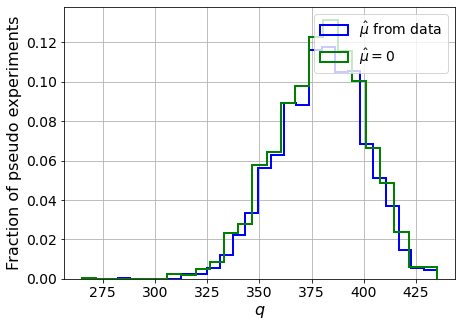

muhat mean:  0.0006465842860201838
Z_bins:  19.50708392347449
std Z_bins:  0.5288949203796871
Z_bins mu=0:  19.507041421157457
std Z_bins mu=0:  0.5478143610607681

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.111


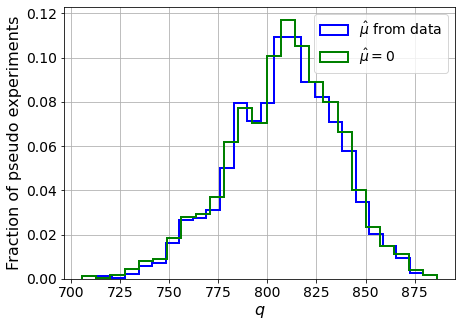

muhat mean:  0.0006313317145703392
Z_bins:  28.462534535672432
std Z_bins:  0.4802583732242822
Z_bins mu=0:  28.462071789757132
std Z_bins mu=0:  0.49418687744648493

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.116


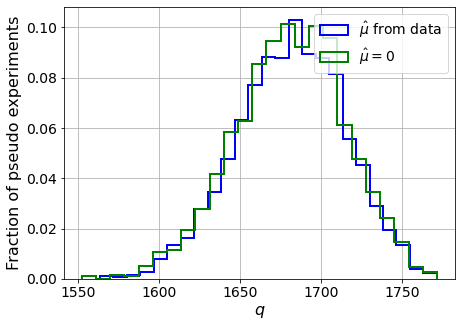

muhat mean:  0.00023871614135238144
Z_bins:  41.01705813599837
std Z_bins:  0.4075030080770048
Z_bins mu=0:  41.016030114356305
std Z_bins mu=0:  0.4154307925802993

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


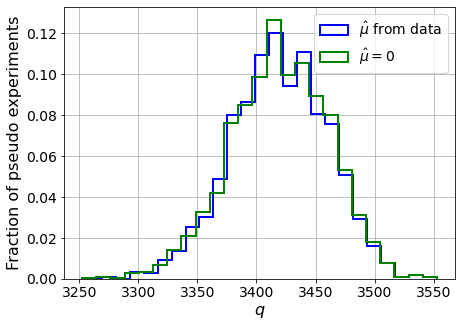

muhat mean:  3.9730940442150696e-05
Z_bins:  58.478751530845585
std Z_bins:  0.3509389179577087
Z_bins mu=0:  58.476922798098435
std Z_bins mu=0:  0.35563052805394396

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


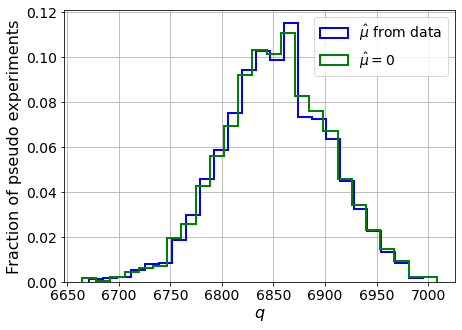

muhat mean:  2.718219055940332e-05
Z_bins:  82.78459684947175
std Z_bins:  0.3163242634929629
Z_bins mu=0:  82.78301461698054
std Z_bins mu=0:  0.31983979614326163

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


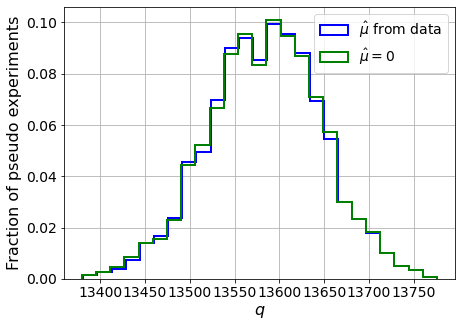

muhat mean:  3.8531768152180326e-05
Z_bins:  116.55874122125103
std Z_bins:  0.2689907760362413
Z_bins mu=0:  116.55841872541625
std Z_bins mu=0:  0.2713219772383432

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


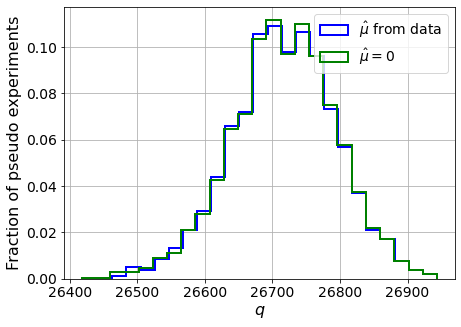

muhat mean:  2.2078692981940502e-05
Z_bins:  163.45703424129056
std Z_bins:  0.23701735935404428
Z_bins mu=0:  163.4562210344713
std Z_bins mu=0:  0.23881718326496365

--------


 FINAL RESULT:

[[0.22299945212537578, 0.5200401681892584, 0.27141968229430447, 0.22294894558413206, 0.918870693167632], [0.6798627612136141, 0.5533736091757065, 0.0357040287586569, 0.6798627612136141, 0.8524842820195955], [1.069287857654836, 0.6014474568774947, 0.037927100903626866, 1.069287857654836, 0.8747396577850682], [1.972550638089642, 0.6470385047481784, 0.010937769317183247, 1.972550638089642, 0.8288577333432767], [3.2860456450338416, 0.7035696087598919, 0.005319688025607033, 3.286017576593098, 0.8085585331396813], [5.444119111846121, 0.6900448623668547, 0.0015126852777086032, 5.443997724072402, 0.7596837762994649], [8.60675433617616, 0.6299504353647988, 0.0031132319566790478, 8.606703239687011, 0.673142476473068], [13.1337012781099, 0.5654254722776402, 0.0021755675780400757, 13.132151608028492, 0.594

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 338.73375832 302.25563637 257.93018193 210.98525394
 157.72055188  99.17182615  36.88676546 -28.38929359 -96.89606814]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 283.24960721 252.68876556 213.41739853
 163

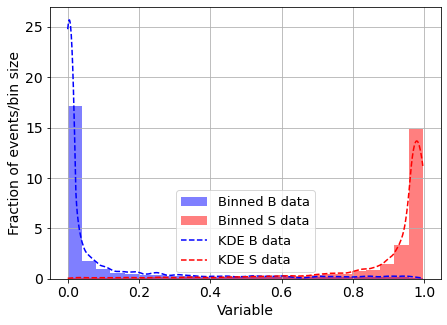

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



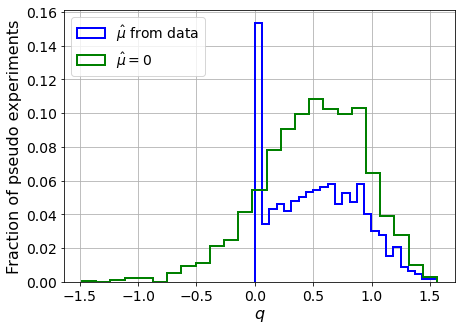

muhat mean:  -6.4569293320502394
Z_bins:  0.7309062820872767
std Z_bins:  0.2539982360762328
Z_bins mu=0:  0.7309062820872767
std Z_bins mu=0:  0.3010831197679925

--------

B_expected:  643
S_expected:  3



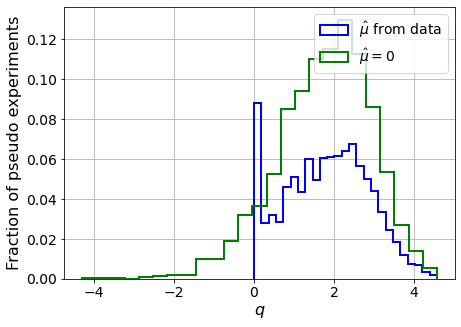

muhat mean:  -2.1707222201036656
Z_bins:  1.368084833391873
std Z_bins:  0.3814841665182669
Z_bins mu=0:  1.368084833391873
std Z_bins mu=0:  0.43178864566094033

--------

B_expected:  643
S_expected:  5



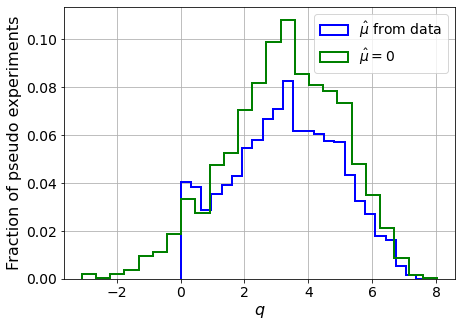

muhat mean:  -1.230724092266345
Z_bins:  1.8161882768041775
std Z_bins:  0.4599356623285452
Z_bins mu=0:  1.8161882768041775
std Z_bins mu=0:  0.4938509879700202

--------

B_expected:  643
S_expected:  10



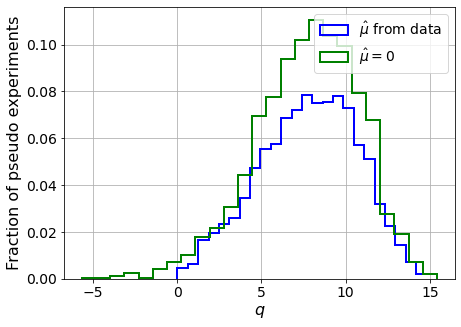

muhat mean:  -0.6423083499580869
Z_bins:  2.8122059940728774
std Z_bins:  0.5190450610490058
Z_bins mu=0:  2.8122059940728774
std Z_bins mu=0:  0.5477337762527279

--------

B_expected:  643
S_expected:  19



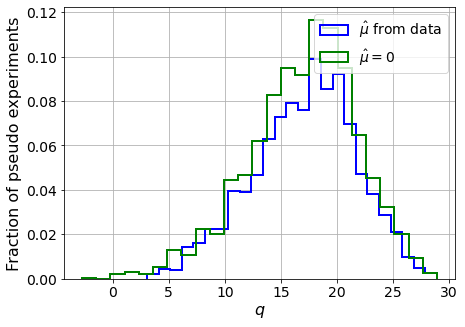

muhat mean:  -0.33095025311480325
Z_bins:  4.183992075395426
std Z_bins:  0.5541225742122283
Z_bins mu=0:  4.183992075395426
std Z_bins mu=0:  0.5758523965596241

--------

B_expected:  643
S_expected:  37



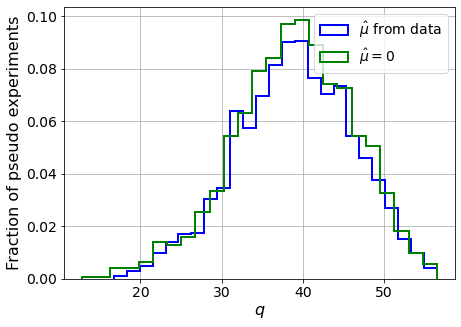

muhat mean:  -0.16225591562049954
Z_bins:  6.2529408306065335
std Z_bins:  0.5732778924676794
Z_bins mu=0:  6.2529408306065335
std Z_bins mu=0:  0.5861433982741491

--------

B_expected:  643
S_expected:  72



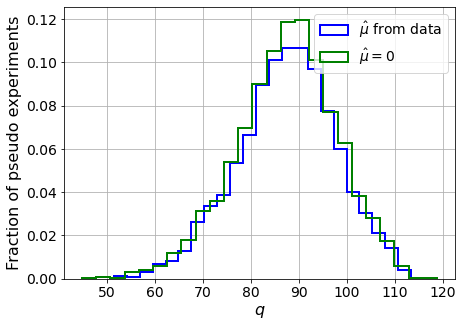

muhat mean:  -0.09666158845875024
Z_bins:  9.374343869387117
std Z_bins:  0.5527897171041293
Z_bins mu=0:  9.374343869387117
std Z_bins mu=0:  0.5611496025541826

--------

B_expected:  643
S_expected:  139



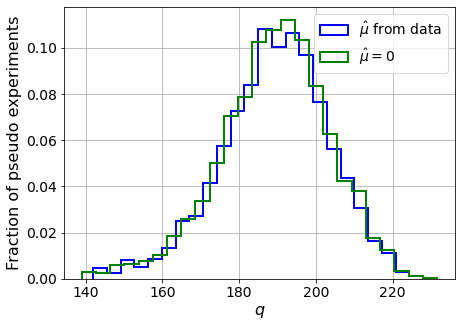

muhat mean:  -0.0441135571711981
Z_bins:  13.78230612251277
std Z_bins:  0.5097339924025668
Z_bins mu=0:  13.781577274755398
std Z_bins mu=0:  0.516076053936016

--------

B_expected:  643
S_expected:  268



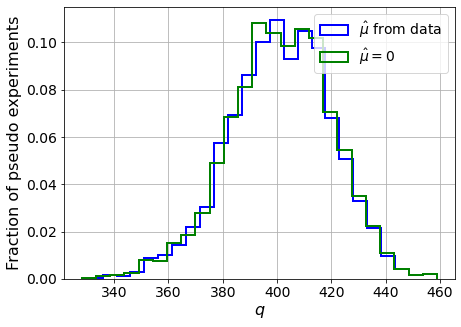

muhat mean:  -0.02281453172793728
Z_bins:  20.042659733645184
std Z_bins:  0.470237804307968
Z_bins mu=0:  20.042654595632786
std Z_bins mu=0:  0.47366527598800406

--------

B_expected:  643
S_expected:  518



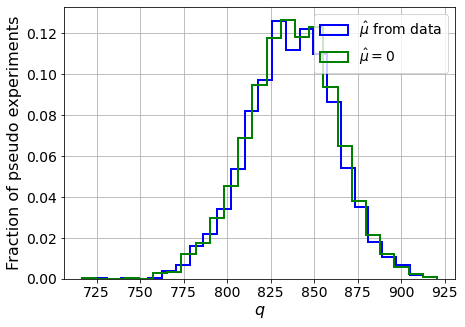

muhat mean:  -0.012054676174371995
Z_bins:  28.940802401255144
std Z_bins:  0.43891064381498346
Z_bins mu=0:  28.940802401255144
std Z_bins mu=0:  0.44144236815005694

--------

B_expected:  643
S_expected:  1001



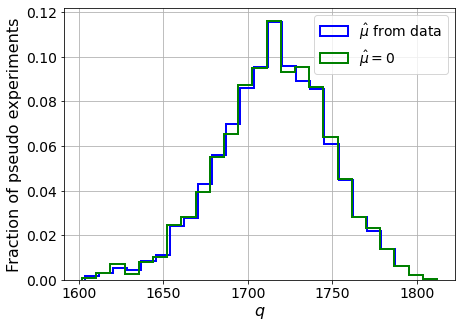

muhat mean:  -0.0063209121489945464
Z_bins:  41.42931070598222
std Z_bins:  0.3943191347655147
Z_bins mu=0:  41.42931070598222
std Z_bins mu=0:  0.3961760251264907

--------

B_expected:  643
S_expected:  1932



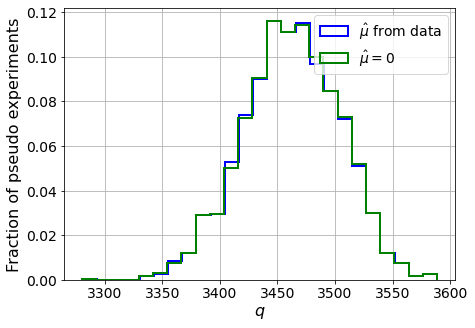

muhat mean:  -0.003186324963334167
Z_bins:  58.84493771067057
std Z_bins:  0.35300834707150675
Z_bins mu=0:  58.844568991648345
std Z_bins mu=0:  0.35371518062395724

--------

B_expected:  643
S_expected:  3730



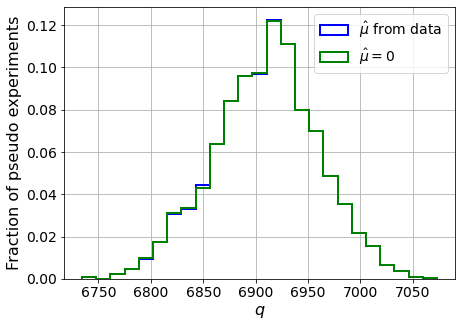

muhat mean:  -0.0015041623918013766
Z_bins:  83.14135727321302
std Z_bins:  0.30063665545816615
Z_bins mu=0:  83.14129990598178
std Z_bins mu=0:  0.30114643419266

--------

B_expected:  643
S_expected:  7201



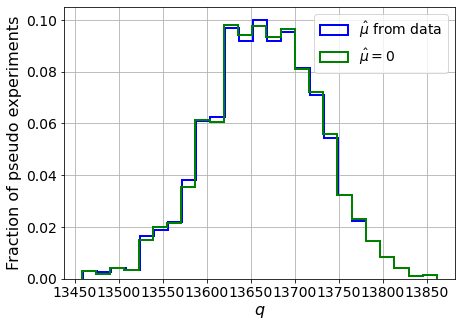

muhat mean:  -0.0009471405700024384
Z_bins:  116.89603907157442
std Z_bins:  0.2690275239512146
Z_bins mu=0:  116.89601584688812
std Z_bins mu=0:  0.2694211312770561

--------

B_expected:  643
S_expected:  13904



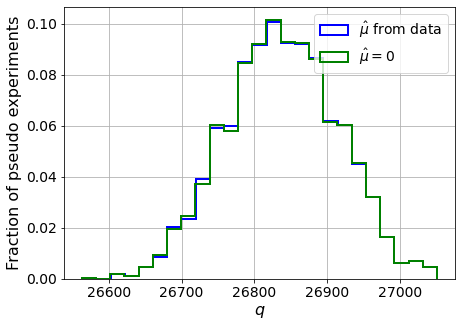

muhat mean:  -0.0004968487990732903
Z_bins:  163.8207845591846
std Z_bins:  0.23338354190134938
Z_bins mu=0:  163.8207845591846
std Z_bins mu=0:  0.23365968915794538

--------


 FINAL RESULT:

[[0.7309062820872767, 0.2539982360762328, -6.4569293320502394, 0.7309062820872767, 0.3010831197679925], [1.368084833391873, 0.3814841665182669, -2.1707222201036656, 1.368084833391873, 0.43178864566094033], [1.8161882768041775, 0.4599356623285452, -1.230724092266345, 1.8161882768041775, 0.4938509879700202], [2.8122059940728774, 0.5190450610490058, -0.6423083499580869, 2.8122059940728774, 0.5477337762527279], [4.183992075395426, 0.5541225742122283, -0.33095025311480325, 4.183992075395426, 0.5758523965596241], [6.2529408306065335, 0.5732778924676794, -0.16225591562049954, 6.2529408306065335, 0.5861433982741491], [9.374343869387117, 0.5527897171041293, -0.09666158845875024, 9.374343869387117, 0.5611496025541826], [13.78230612251277, 0.5097339924025668, -0.0441135571711981, 13.781577274755398, 0.5160

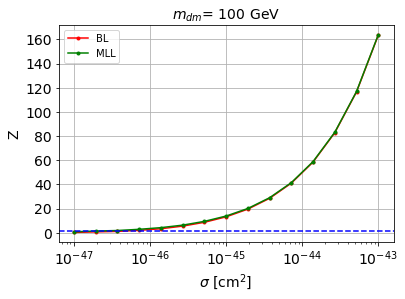


cross_BL_164:  5.648752851317693e-47
cross_BL_164_up:  3.648998642862606e-47
cross_BL_164_down:  8.484525282538772e-47

cross_MLL_164:  3.3180872070936987e-47
cross_MLL_164_up:  1.68368555580427e-47
cross_MLL_164_down:  4.549446649681807e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


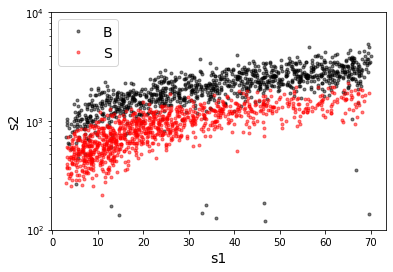

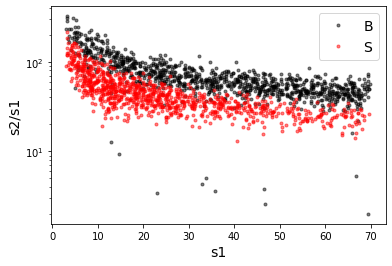

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

Classification score:


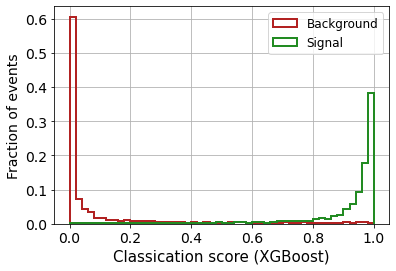


 ROC-AUC =  0.980519518270987
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1185


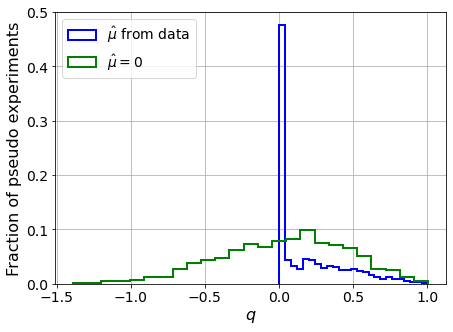

muhat mean:  0.19973633128489704
Z_bins:  0.247631789350845
std Z_bins:  0.4839460331427948
Z_bins mu=0:  0.247631789350845
std Z_bins mu=0:  0.8658642843815311

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


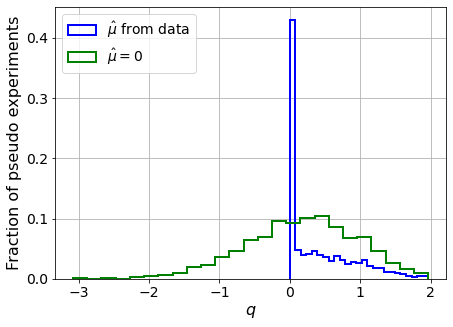

muhat mean:  0.07637554336454985
Z_bins:  0.4426594433018163
std Z_bins:  0.5442836759549697
Z_bins mu=0:  0.442659172354271
std Z_bins mu=0:  0.890026585333663

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


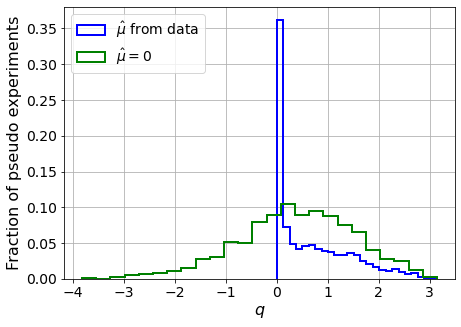

muhat mean:  0.041049053075998605
Z_bins:  0.6630731303406618
std Z_bins:  0.5547563164335
Z_bins mu=0:  0.6630731303406618
std Z_bins mu=0:  0.8591805841749829

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.113


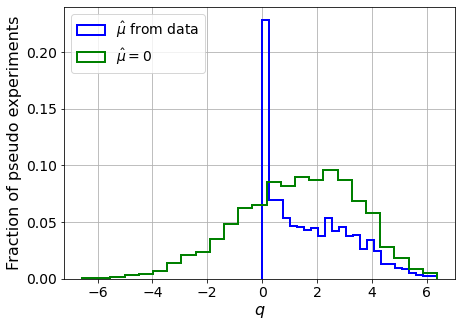

muhat mean:  0.05408110298216636
Z_bins:  1.2029842358526892
std Z_bins:  0.6308080681062462
Z_bins mu=0:  1.2027393070436958
std Z_bins mu=0:  0.888409967191344

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


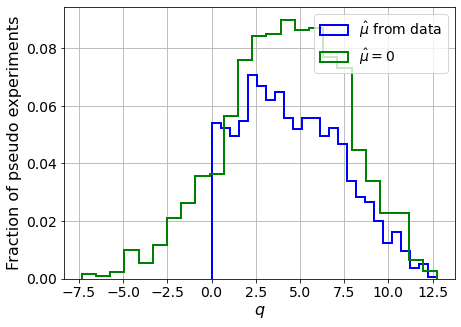

muhat mean:  0.006648108773034194
Z_bins:  2.083038651261074
std Z_bins:  0.6777009694412933
Z_bins mu=0:  2.0829246875556673
std Z_bins mu=0:  0.8258461909754499

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1175


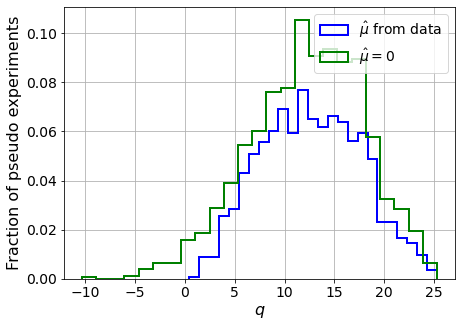

muhat mean:  0.0010022011507858522
Z_bins:  3.542514200192702
std Z_bins:  0.704551260339173
Z_bins mu=0:  3.542514200192702
std Z_bins mu=0:  0.8022922817841569

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


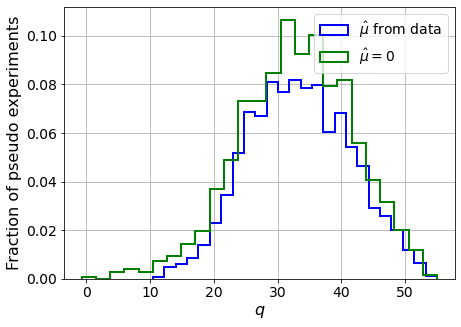

muhat mean:  0.007922654945982497
Z_bins:  5.7574600137024134
std Z_bins:  0.6965715634248046
Z_bins mu=0:  5.756461515759759
std Z_bins mu=0:  0.7620609083223395

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1095


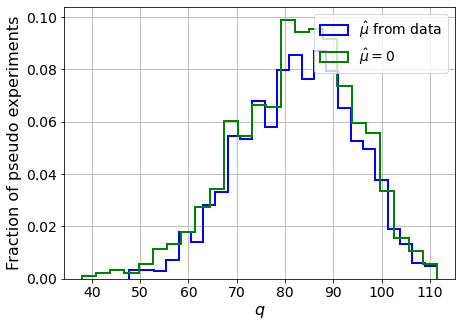

muhat mean:  0.002252584548135199
Z_bins:  9.118339428556737
std Z_bins:  0.6377631560146372
Z_bins mu=0:  9.118339428556737
std Z_bins mu=0:  0.6807790575952237

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


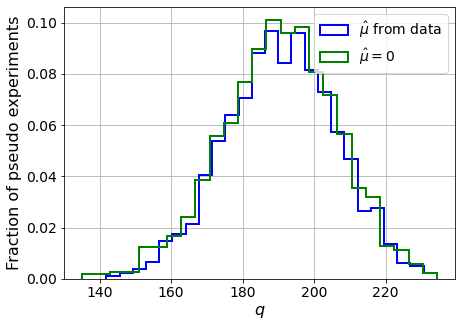

muhat mean:  0.0007976089663595505
Z_bins:  13.814868499279942
std Z_bins:  0.5575321140150603
Z_bins mu=0:  13.813306698467649
std Z_bins mu=0:  0.58067318354801

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.106


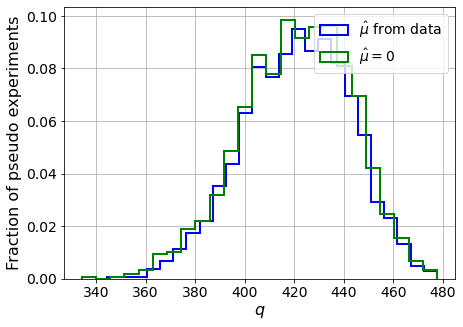

muhat mean:  -2.182195109793827e-05
Z_bins:  20.53800782990512
std Z_bins:  0.5236135011476867
Z_bins mu=0:  20.537386024135408
std Z_bins mu=0:  0.5397435850707593

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0915


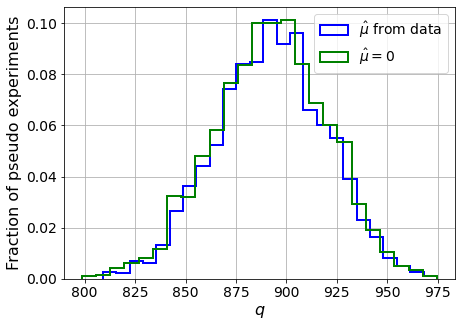

muhat mean:  0.00036867520592357594
Z_bins:  29.873594712239015
std Z_bins:  0.45605299384288334
Z_bins mu=0:  29.872762503521507
std Z_bins mu=0:  0.46687950636502956

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.102


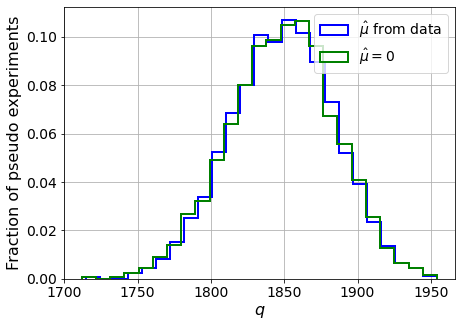

muhat mean:  0.00010185969425315041
Z_bins:  43.005824485992946
std Z_bins:  0.4094252868810589
Z_bins mu=0:  43.004849716500715
std Z_bins mu=0:  0.41605134597018156

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1125


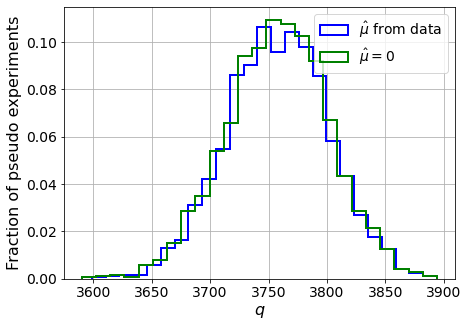

muhat mean:  4.784758816219577e-05
Z_bins:  61.30665844993089
std Z_bins:  0.35411485353448396
Z_bins mu=0:  61.30572960396602
std Z_bins mu=0:  0.35870197351869965

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


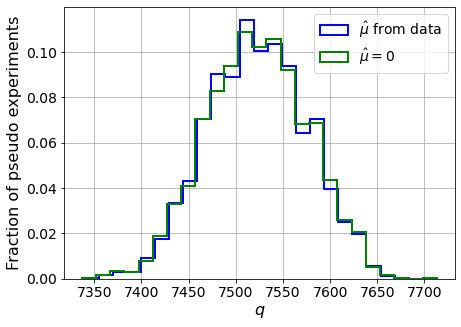

muhat mean:  2.6137972768087572e-05
Z_bins:  86.73324650152632
std Z_bins:  0.3046376191548342
Z_bins mu=0:  86.73087936021562
std Z_bins mu=0:  0.3073795673692125

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


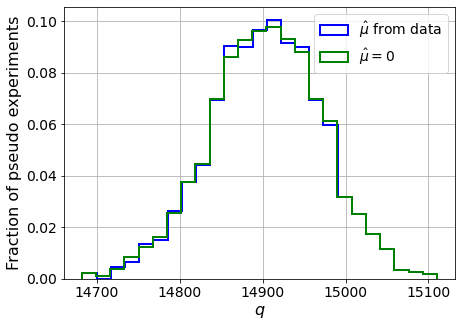

muhat mean:  3.906049861107158e-05
Z_bins:  122.08871340935595
std Z_bins:  0.27526402527260063
Z_bins mu=0:  122.08765899034526
std Z_bins mu=0:  0.2775344251739292

--------


 FINAL RESULT:

[[0.247631789350845, 0.4839460331427948, 0.19973633128489704, 0.247631789350845, 0.8658642843815311], [0.4426594433018163, 0.5442836759549697, 0.07637554336454985, 0.442659172354271, 0.890026585333663], [0.6630731303406618, 0.5547563164335, 0.041049053075998605, 0.6630731303406618, 0.8591805841749829], [1.2029842358526892, 0.6308080681062462, 0.05408110298216636, 1.2027393070436958, 0.888409967191344], [2.083038651261074, 0.6777009694412933, 0.006648108773034194, 2.0829246875556673, 0.8258461909754499], [3.542514200192702, 0.704551260339173, 0.0010022011507858522, 3.542514200192702, 0.8022922817841569], [5.7574600137024134, 0.6965715634248046, 0.007922654945982497, 5.756461515759759, 0.7620609083223395], [9.118339428556737, 0.6377631560146372, 0.002252584548135199, 9.118339428556737, 0.680779057

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  347.97425661  317.92679057  282.10073385  243.23756498  198.34873887
  146.15661881   88.71509618   27.35188256  -37.55605152 -100.14997812]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 239.412480

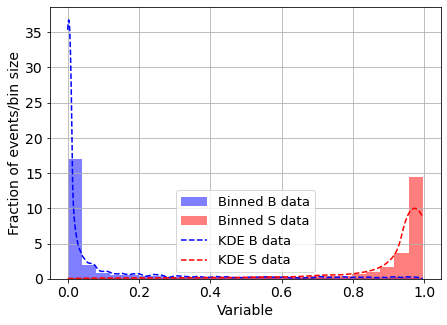

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



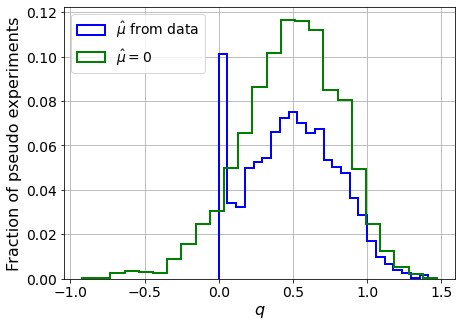

muhat mean:  -6.285881929300776
Z_bins:  0.7070476138667685
std Z_bins:  0.21184481327174476
Z_bins mu=0:  0.7070476138667685
std Z_bins mu=0:  0.23610028204570502

--------

B_expected:  643
S_expected:  2



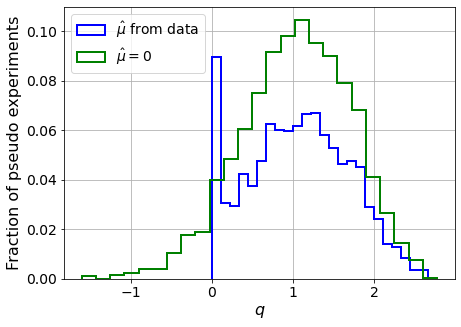

muhat mean:  -3.1663484497148287
Z_bins:  1.0392375210154585
std Z_bins:  0.2975854102490301
Z_bins mu=0:  1.0392375210154585
std Z_bins mu=0:  0.3216761466001864

--------

B_expected:  643
S_expected:  3



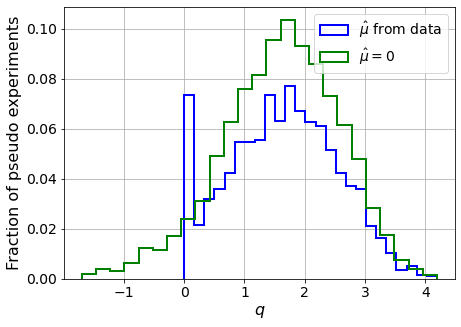

muhat mean:  -1.9451939718368072
Z_bins:  1.2906815677706645
std Z_bins:  0.3469417768034626
Z_bins mu=0:  1.2906815677706645
std Z_bins mu=0:  0.37568582912361165

--------

B_expected:  643
S_expected:  6



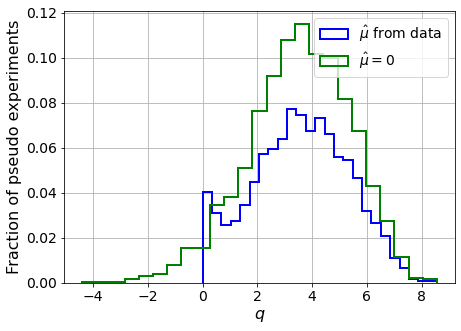

muhat mean:  -0.9746112153532015
Z_bins:  1.890780434456638
std Z_bins:  0.4620074044858707
Z_bins mu=0:  1.890780434456638
std Z_bins mu=0:  0.49311653700627395

--------

B_expected:  643
S_expected:  11



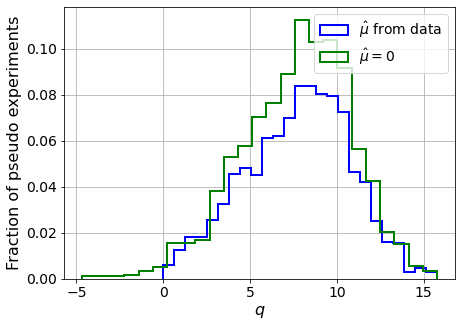

muhat mean:  -0.577956552133028
Z_bins:  2.8311953482378693
std Z_bins:  0.53254636411438
Z_bins mu=0:  2.8311953482378693
std Z_bins mu=0:  0.5535703871618789

--------

B_expected:  643
S_expected:  21



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


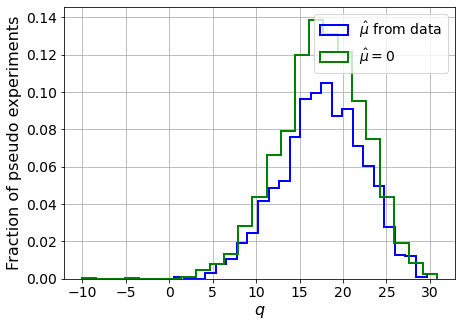

muhat mean:  -0.3043902245483793
Z_bins:  4.209533306953733
std Z_bins:  0.56004853052446
Z_bins mu=0:  4.209533306953733
std Z_bins mu=0:  0.5728472904355658

--------

B_expected:  643
S_expected:  41



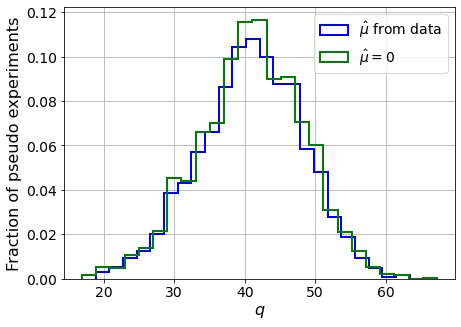

muhat mean:  -0.15150644821528853
Z_bins:  6.413302397678932
std Z_bins:  0.5736596366055472
Z_bins mu=0:  6.413302397678932
std Z_bins mu=0:  0.5792162549497344

--------

B_expected:  643
S_expected:  79



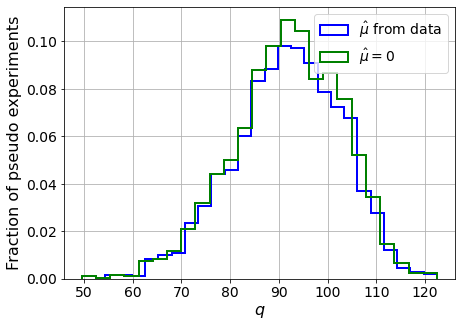

muhat mean:  -0.07904652937883742
Z_bins:  9.608812166607935
std Z_bins:  0.5714495847907689
Z_bins mu=0:  9.608812166607935
std Z_bins mu=0:  0.5763321962496659

--------

B_expected:  643
S_expected:  152



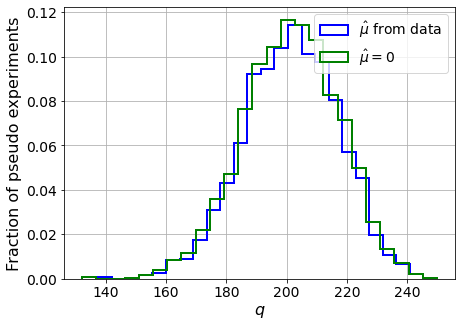

muhat mean:  -0.04232264207165415
Z_bins:  14.204340600117083
std Z_bins:  0.5544943733218292
Z_bins mu=0:  14.204340600117083
std Z_bins mu=0:  0.5580818804953785

--------

B_expected:  643
S_expected:  294



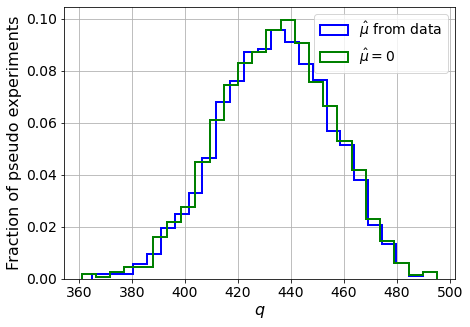

muhat mean:  -0.02081129377461909
Z_bins:  20.847802854864653
std Z_bins:  0.5090803245560687
Z_bins mu=0:  20.847802854864653
std Z_bins mu=0:  0.5109861058084061

--------

B_expected:  643
S_expected:  567



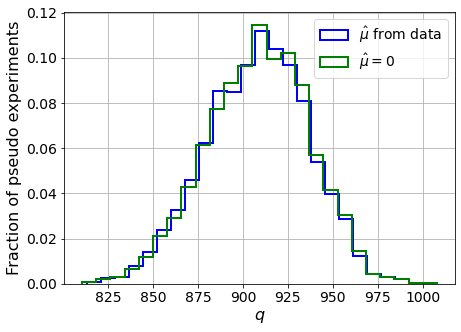

muhat mean:  -0.011162883458822574
Z_bins:  30.149804597286263
std Z_bins:  0.47220386062763625
Z_bins mu=0:  30.149804597286263
std Z_bins mu=0:  0.4736814333174256

--------

B_expected:  643
S_expected:  1094



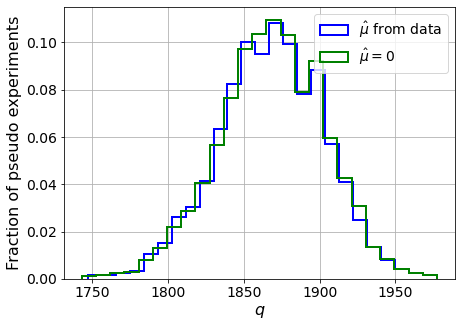

muhat mean:  -0.0057003447087071585
Z_bins:  43.240246133879324
std Z_bins:  0.4028582092725984
Z_bins mu=0:  43.240246133879324
std Z_bins mu=0:  0.40375264722449133

--------

B_expected:  643
S_expected:  2113



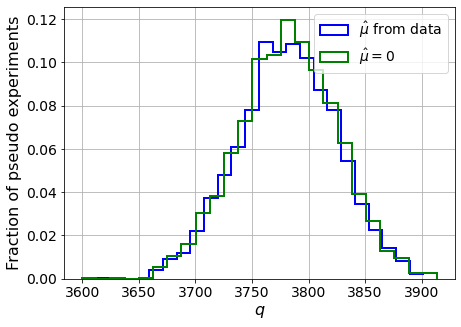

muhat mean:  -0.00287075848096855
Z_bins:  61.49591660780987
std Z_bins:  0.3546763235799185
Z_bins mu=0:  61.49591660780987
std Z_bins mu=0:  0.35534588753155044

--------

B_expected:  643
S_expected:  4079



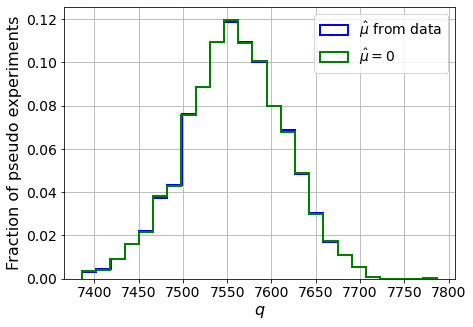

muhat mean:  -0.0016575518106213467
Z_bins:  86.9390997341033
std Z_bins:  0.32355202654418386
Z_bins mu=0:  86.9390997341033
std Z_bins mu=0:  0.3238641715279148

--------

B_expected:  643
S_expected:  7876



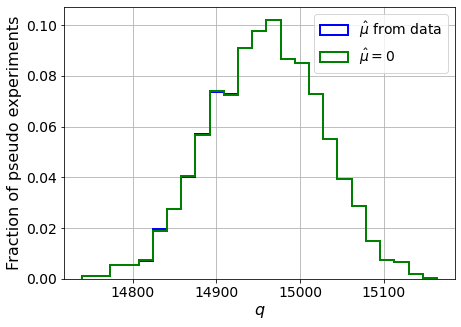

muhat mean:  -0.0007867167227379652
Z_bins:  122.31086602481075
std Z_bins:  0.27258055742062853
Z_bins mu=0:  122.31086602481075
std Z_bins mu=0:  0.2728214632899544

--------


 FINAL RESULT:

[[0.7070476138667685, 0.21184481327174476, -6.285881929300776, 0.7070476138667685, 0.23610028204570502], [1.0392375210154585, 0.2975854102490301, -3.1663484497148287, 1.0392375210154585, 0.3216761466001864], [1.2906815677706645, 0.3469417768034626, -1.9451939718368072, 1.2906815677706645, 0.37568582912361165], [1.890780434456638, 0.4620074044858707, -0.9746112153532015, 1.890780434456638, 0.49311653700627395], [2.8311953482378693, 0.53254636411438, -0.577956552133028, 2.8311953482378693, 0.5535703871618789], [4.209533306953733, 0.56004853052446, -0.3043902245483793, 4.209533306953733, 0.5728472904355658], [6.413302397678932, 0.5736596366055472, -0.15150644821528853, 6.413302397678932, 0.5792162549497344], [9.608812166607935, 0.5714495847907689, -0.07904652937883742, 9.608812166607935, 0.5763321

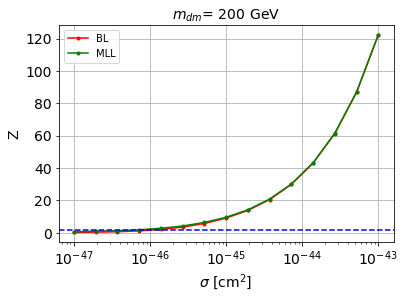


cross_BL_164:  9.977513384337425e-47
cross_BL_164_up:  6.272056768826338e-47
cross_BL_164_down:  1.5475931686521392e-46

cross_MLL_164:  6.038810921084564e-47
cross_MLL_164_up:  3.735752239239553e-47
cross_MLL_164_down:  8.443474814172754e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


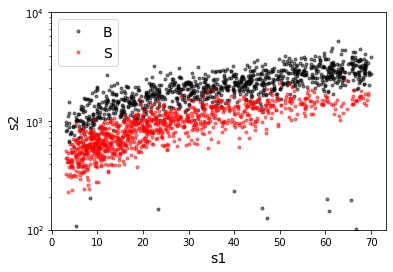

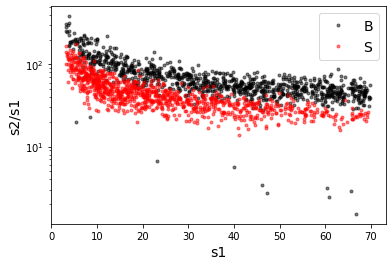

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

Classification score:


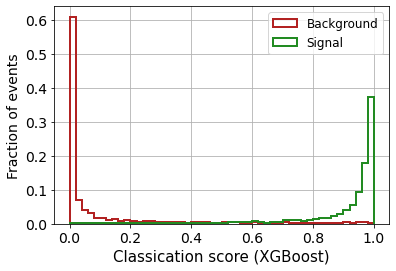


 ROC-AUC =  0.9798855396469355
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


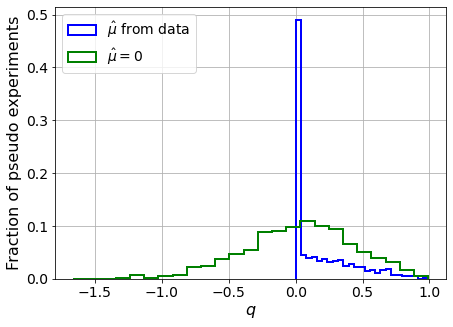

muhat mean:  0.23240891133602395
Z_bins:  0.21714456020215633
std Z_bins:  0.5341577663729814
Z_bins mu=0:  0.2171059442437421
std Z_bins mu=0:  0.9450924042456923

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


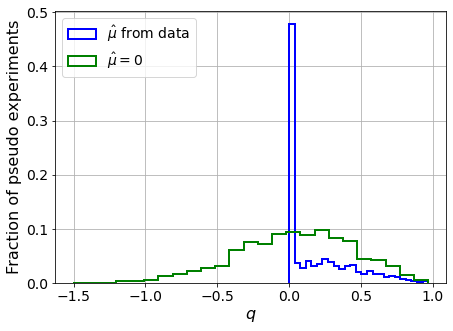

muhat mean:  0.0357888125888126
Z_bins:  0.24326764813955656
std Z_bins:  0.48187870388124343
Z_bins mu=0:  0.24326764813955656
std Z_bins mu=0:  0.8301739690084947

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


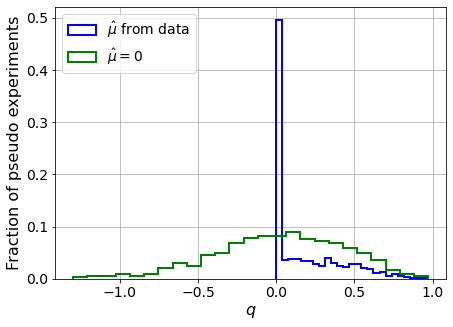

muhat mean:  0.27328453660856783
Z_bins:  0.21135400411279
std Z_bins:  0.5409323337082692
Z_bins mu=0:  0.21102208769818923
std Z_bins mu=0:  0.9774407736087188

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0945


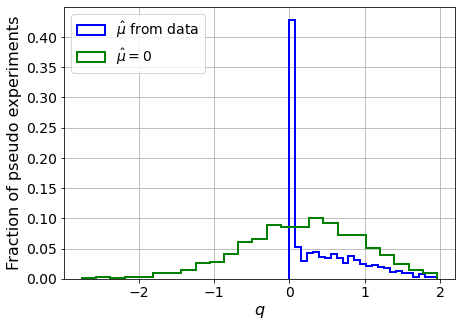

muhat mean:  0.062209147165603634
Z_bins:  0.4499727199758011
std Z_bins:  0.5312748695206093
Z_bins mu=0:  0.4499727199758011
std Z_bins mu=0:  0.8732548366643712

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


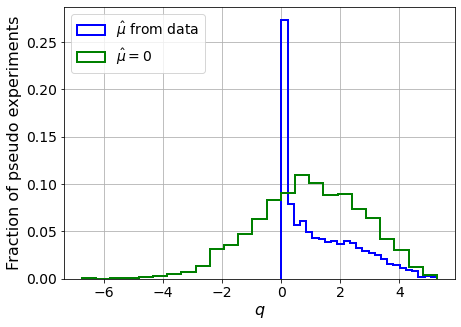

muhat mean:  0.042995426863761406
Z_bins:  0.988638206570114
std Z_bins:  0.6438487630063453
Z_bins mu=0:  0.9874541336587777
std Z_bins mu=0:  0.9184591300905941

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0875


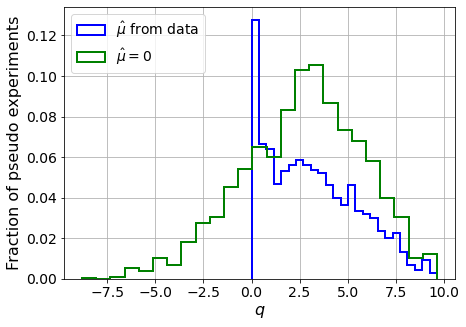

muhat mean:  0.04170823232498821
Z_bins:  1.6923169130084237
std Z_bins:  0.6960098995849167
Z_bins mu=0:  1.6913938338397003
std Z_bins mu=0:  0.9180099354479416

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0945


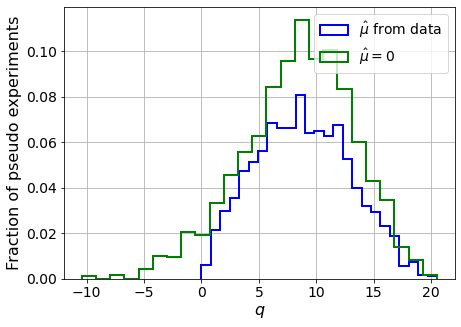

muhat mean:  0.008720104537983225
Z_bins:  2.958127784177606
std Z_bins:  0.6908466103644666
Z_bins mu=0:  2.958127784177606
std Z_bins mu=0:  0.8120611533738968

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0995


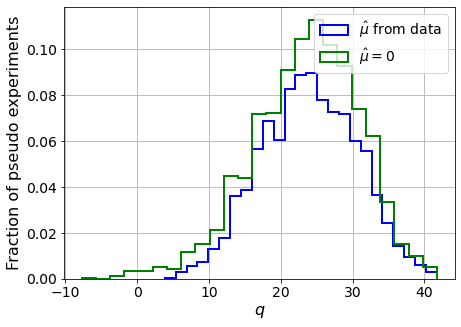

muhat mean:  0.008994701664515655
Z_bins:  4.9074819169637545
std Z_bins:  0.6771216627338148
Z_bins mu=0:  4.906835591422244
std Z_bins mu=0:  0.7573216482432067

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


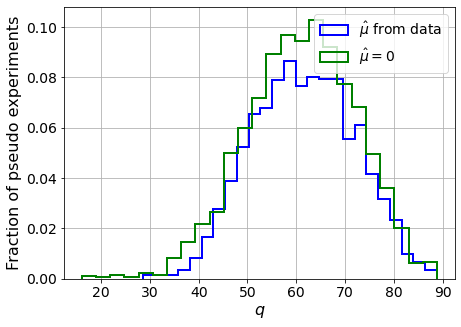

muhat mean:  0.0037249631906756896
Z_bins:  7.837339784914613
std Z_bins:  0.6671686949294965
Z_bins mu=0:  7.8365460184071365
std Z_bins mu=0:  0.7145370290046645

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


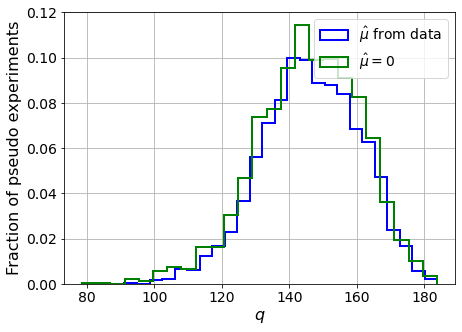

muhat mean:  0.0022193290881298827
Z_bins:  12.088035852445902
std Z_bins:  0.6017114865393947
Z_bins mu=0:  12.086549692717544
std Z_bins mu=0:  0.635700135350808

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.084


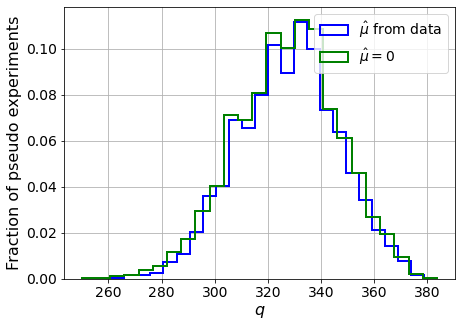

muhat mean:  0.0009566525544902553
Z_bins:  18.11700418055226
std Z_bins:  0.5194882392962311
Z_bins mu=0:  18.113763867440298
std Z_bins mu=0:  0.5371858964404217

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


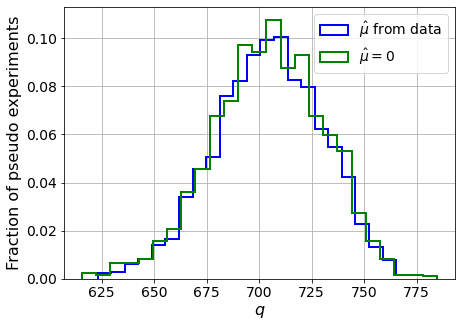

muhat mean:  0.0006617315390589593
Z_bins:  26.558405485986093
std Z_bins:  0.48550756450437443
Z_bins mu=0:  26.554121288060383
std Z_bins mu=0:  0.4990800060153602

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.087


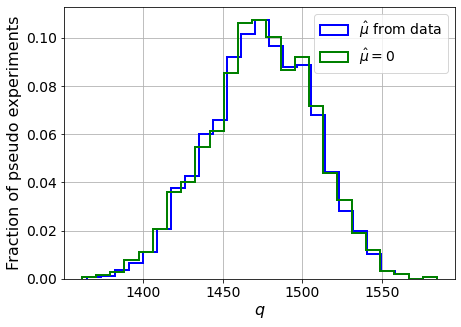

muhat mean:  0.0003177050077688388
Z_bins:  38.408258029239086
std Z_bins:  0.42616566599693245
Z_bins mu=0:  38.407915821745085
std Z_bins mu=0:  0.4343923118501233

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0885


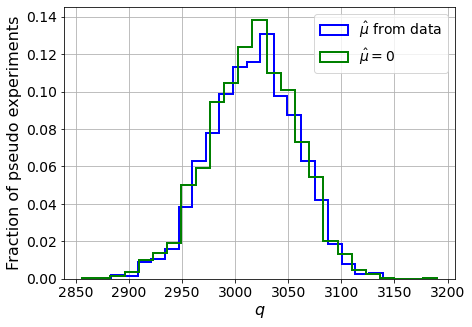

muhat mean:  0.00011811684332455122
Z_bins:  54.94167782749694
std Z_bins:  0.369540507424524
Z_bins mu=0:  54.940646702408046
std Z_bins mu=0:  0.37521909989896357

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.108


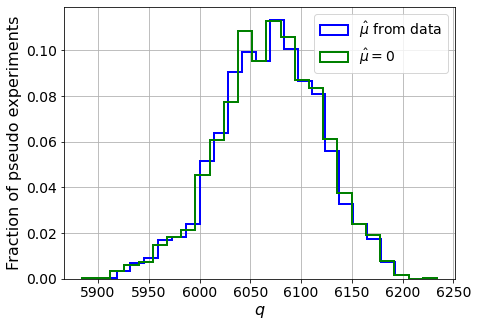

muhat mean:  3.05546199502549e-05
Z_bins:  77.91726107891976
std Z_bins:  0.3221925071320694
Z_bins mu=0:  77.91669391597105
std Z_bins mu=0:  0.3260727644105036

--------


 FINAL RESULT:

[[0.21714456020215633, 0.5341577663729814, 0.23240891133602395, 0.2171059442437421, 0.9450924042456923], [0.24326764813955656, 0.48187870388124343, 0.0357888125888126, 0.24326764813955656, 0.8301739690084947], [0.21135400411279, 0.5409323337082692, 0.27328453660856783, 0.21102208769818923, 0.9774407736087188], [0.4499727199758011, 0.5312748695206093, 0.062209147165603634, 0.4499727199758011, 0.8732548366643712], [0.988638206570114, 0.6438487630063453, 0.042995426863761406, 0.9874541336587777, 0.9184591300905941], [1.6923169130084237, 0.6960098995849167, 0.04170823232498821, 1.6913938338397003, 0.9180099354479416], [2.958127784177606, 0.6908466103644666, 0.008720104537983225, 2.958127784177606, 0.8120611533738968], [4.9074819169637545, 0.6771216627338148, 0.008994701664515655, 4.906835591422244, 0.75

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 327.27937877 292.59956953 251.49979372 203.68934299
 146.6376497   88.35341929  28.81997893 -35.67900509 -99.17323844]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 252.84552372 227.30234688 192.04736902
 149

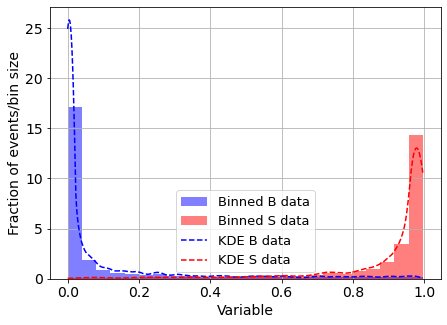

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



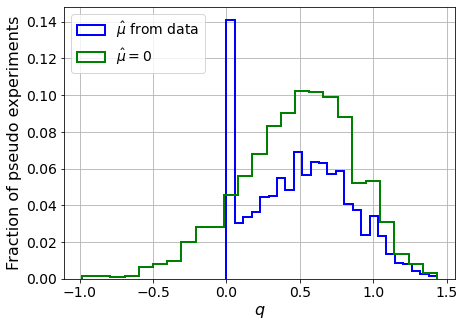

muhat mean:  -5.60861702784843
Z_bins:  0.7166511708309912
std Z_bins:  0.23338941827160842
Z_bins mu=0:  0.7166511708309912
std Z_bins mu=0:  0.26870667485357547

--------

B_expected:  643
S_expected:  1



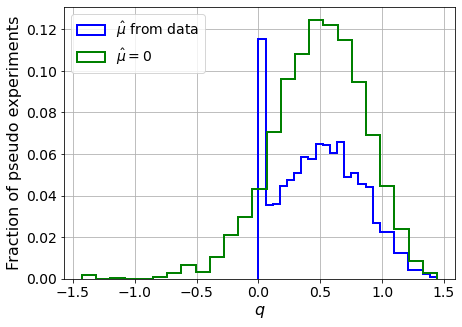

muhat mean:  -5.657162447932771
Z_bins:  0.7160712932423892
std Z_bins:  0.22743132445757433
Z_bins mu=0:  0.7160712932423892
std Z_bins mu=0:  0.26223364655749215

--------

B_expected:  643
S_expected:  1



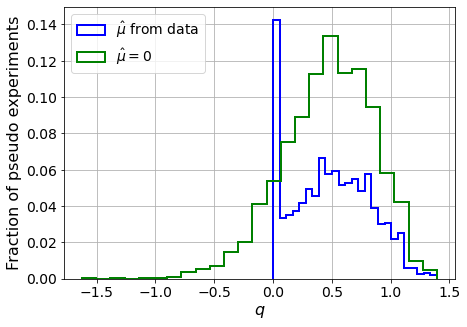

muhat mean:  -5.2349106609598
Z_bins:  0.7033738999414394
std Z_bins:  0.23479987881152248
Z_bins mu=0:  0.7033738999414394
std Z_bins mu=0:  0.2738382724604426

--------

B_expected:  643
S_expected:  2



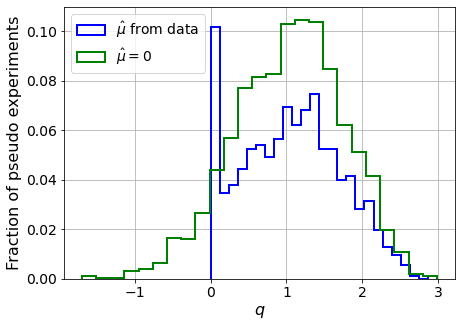

muhat mean:  -2.9220388831959245
Z_bins:  1.0362054857048946
std Z_bins:  0.3143547802904608
Z_bins mu=0:  1.0362054857048946
std Z_bins mu=0:  0.34375480993895724

--------

B_expected:  643
S_expected:  5



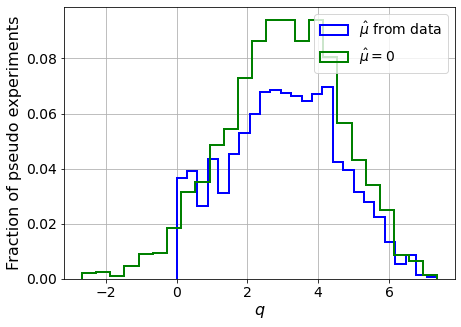

muhat mean:  -1.1198803172938054
Z_bins:  1.7518672904349386
std Z_bins:  0.44460975709877915
Z_bins mu=0:  1.7518672904349386
std Z_bins mu=0:  0.4709777692506711

--------

B_expected:  643
S_expected:  9



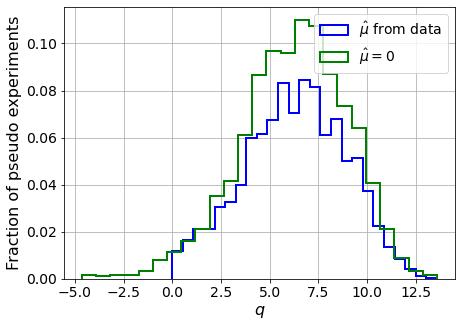

muhat mean:  -0.6575723576946242
Z_bins:  2.537733573263739
std Z_bins:  0.5101090679298034
Z_bins mu=0:  2.537733573263739
std Z_bins mu=0:  0.536693155530915

--------

B_expected:  643
S_expected:  17



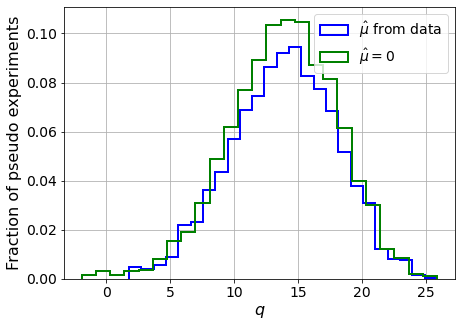

muhat mean:  -0.3281194743849586
Z_bins:  3.747885165241915
std Z_bins:  0.546961311119279
Z_bins mu=0:  3.747885165241915
std Z_bins mu=0:  0.5612191119443799

--------

B_expected:  643
S_expected:  33



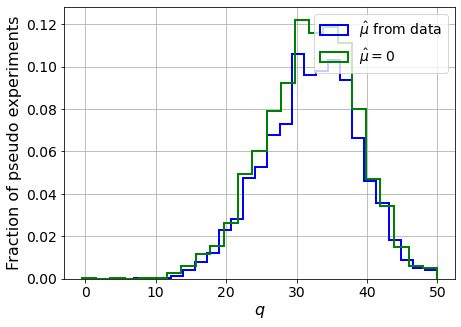

muhat mean:  -0.17099874787958083
Z_bins:  5.68950358075555
std Z_bins:  0.5733227057794311
Z_bins mu=0:  5.68950358075555
std Z_bins mu=0:  0.5831338571494533

--------

B_expected:  643
S_expected:  64



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


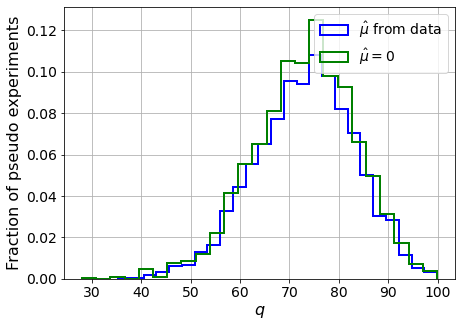

muhat mean:  -0.09620256860599127
Z_bins:  8.58546344063573
std Z_bins:  0.5890337323789115
Z_bins mu=0:  8.58546344063573
std Z_bins mu=0:  0.5976659442689221

--------

B_expected:  643
S_expected:  124



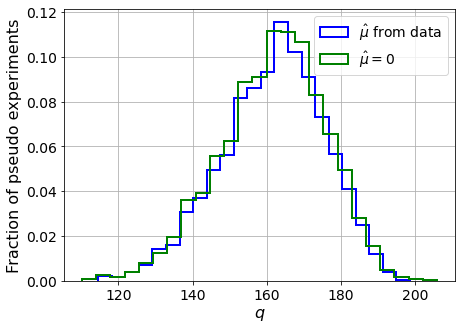

muhat mean:  -0.04716638191282651
Z_bins:  12.758451442105123
std Z_bins:  0.5467692527266019
Z_bins mu=0:  12.758451442105123
std Z_bins mu=0:  0.5517859825629597

--------

B_expected:  643
S_expected:  239



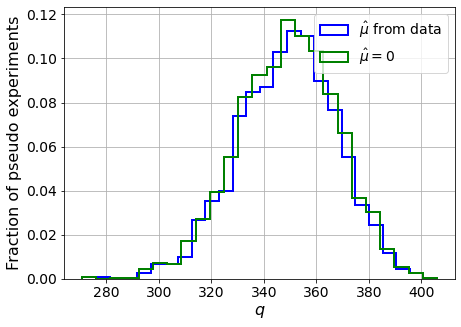

muhat mean:  -0.025786894836256284
Z_bins:  18.701055459052228
std Z_bins:  0.5018064999953789
Z_bins mu=0:  18.701055459052228
std Z_bins mu=0:  0.5043934343448998

--------

B_expected:  643
S_expected:  462



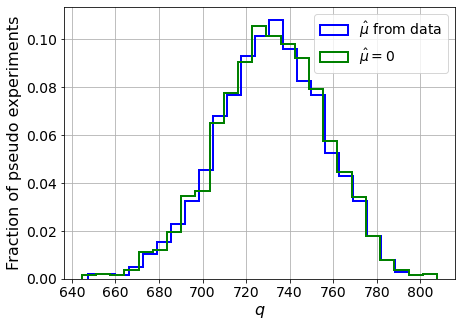

muhat mean:  -0.012341401419906903
Z_bins:  27.055148894465603
std Z_bins:  0.4570785092661302
Z_bins mu=0:  27.055148894465603
std Z_bins mu=0:  0.45880772381636536

--------

B_expected:  643
S_expected:  892



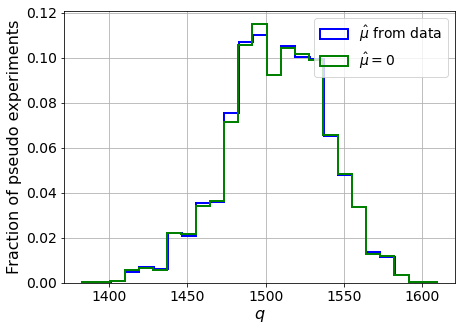

muhat mean:  -0.006009199266607805
Z_bins:  38.83427865298713
std Z_bins:  0.413750352529981
Z_bins mu=0:  38.83427865298713
std Z_bins mu=0:  0.4151501643007963

--------

B_expected:  643
S_expected:  1723



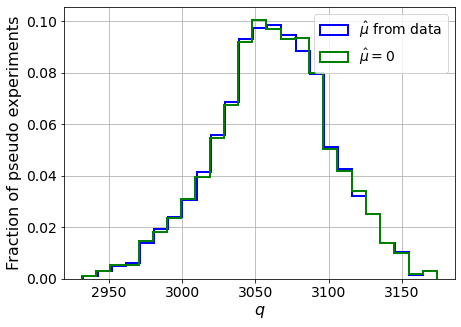

muhat mean:  -0.0033167055630141935
Z_bins:  55.336789552390755
std Z_bins:  0.360314971356334
Z_bins mu=0:  55.336671309689876
std Z_bins mu=0:  0.36102922588758757

--------

B_expected:  643
S_expected:  3326



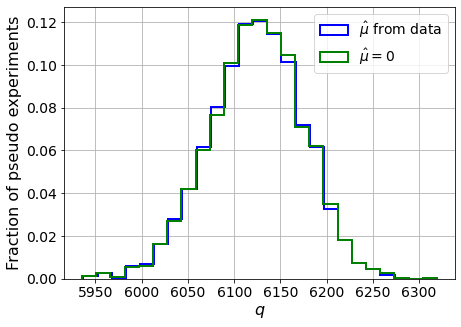

muhat mean:  -0.0016990648550099454
Z_bins:  78.2674282296582
std Z_bins:  0.32502379628233735
Z_bins mu=0:  78.2674282296582
std Z_bins mu=0:  0.32571147140878465

--------


 FINAL RESULT:

[[0.7166511708309912, 0.23338941827160842, -5.60861702784843, 0.7166511708309912, 0.26870667485357547], [0.7160712932423892, 0.22743132445757433, -5.657162447932771, 0.7160712932423892, 0.26223364655749215], [0.7033738999414394, 0.23479987881152248, -5.2349106609598, 0.7033738999414394, 0.2738382724604426], [1.0362054857048946, 0.3143547802904608, -2.9220388831959245, 1.0362054857048946, 0.34375480993895724], [1.7518672904349386, 0.44460975709877915, -1.1198803172938054, 1.7518672904349386, 0.4709777692506711], [2.537733573263739, 0.5101090679298034, -0.6575723576946242, 2.537733573263739, 0.536693155530915], [3.747885165241915, 0.546961311119279, -0.3281194743849586, 3.747885165241915, 0.5612191119443799], [5.68950358075555, 0.5733227057794311, -0.17099874787958083, 5.68950358075555, 0.5831338571

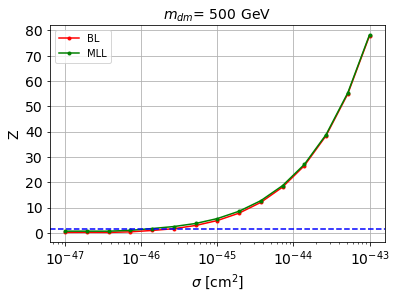


cross_BL_164:  2.610734106328401e-46
cross_BL_164_up:  1.3986116330626023e-46
cross_BL_164_down:  3.743460497409703e-46

cross_MLL_164:  1.265278114219544e-46
cross_MLL_164_up:  9.01370091478961e-47
cross_MLL_164_down:  1.882914238622645e-46

#########################



In [35]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it2 in range(len(mDM_mDM)):

    # set the parameters
    mDM = mDM_mDM[m_it2]
    S_cross1045 = S_cross1045_mDM[m_it2]
    S_expected = S_expected_mDM[m_it2]

    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')


    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)

    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux


    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)


    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()



    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()


    ############
    # DATASETS #
    ############

    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')



    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)



    #######################
    # BIN LIKELIHOOD TEST #
    #######################

    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)




    #######
    # MLL #
    #######

    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='linear')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='linear')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)

    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)


    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='linear')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='linear')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='linear')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)

    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)


    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)

    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')


In [36]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.2926638870343047e-45, 8.540956307132925e-47, 4.2141097125643503e-47, 4.210152376182652e-47, 5.648752851317693e-47, 9.977513384337425e-47, 2.610734106328401e-46]
[8.22530346157347e-46, 5.119694032134222e-47, 2.754577209879155e-47, 2.2890401577246136e-47, 3.648998642862606e-47, 6.272056768826338e-47, 1.3986116330626023e-46]
[2.039889616809739e-45, 1.320331747027662e-46, 6.859778649607772e-47, 6.686123526789609e-47, 8.484525282538772e-47, 1.5475931686521392e-46, 3.743460497409703e-46]
[8.404487843817266e-46, 4.88517521501969e-47, 2.28868746870911e-47, 2.1776770114304046e-47, 3.3180872070936987e-47, 6.038810921084564e-47, 1.265278114219544e-46]
[5.8516881808082855e-46, 3.424614799532457e-47, 1.4403705154460778e-47, 1.4288023745656367e-47, 1.68368555580427e-47, 3.735752239239553e-47, 9.01370091478961e-47]
[1.2654829108717514e-45, 7.467396727613614e-47, 3.294824347340883e-47, 3.7939028958627966e-47, 4.549446649681807e-47, 8.443474814172754e-47, 1.882914238622645e-46]


In [37]:
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [38]:
cross_cs1cs2_general_m6 = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[0]
cross_cs1cs2_general_m6_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[1]
cross_cs1cs2_general_m6_down =np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '.txt')[2]

cross_cs1cs2_general_m6_MLL = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[0]
cross_cs1cs2_general_m6_MLL_up = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[1]
cross_cs1cs2_general_m6_MLL_down = np.loadtxt('results/general/cs1cs2_mDM' + str(m_it) + '_MLL.txt')[2]

In [119]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

In [122]:
f_XE_up = interp1d(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up)
f_XE_down = interp1d(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down)

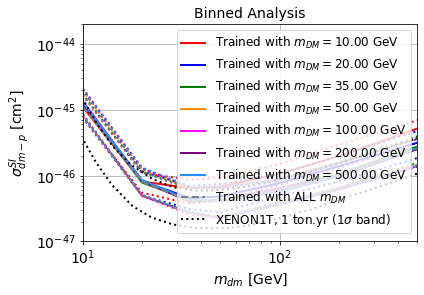

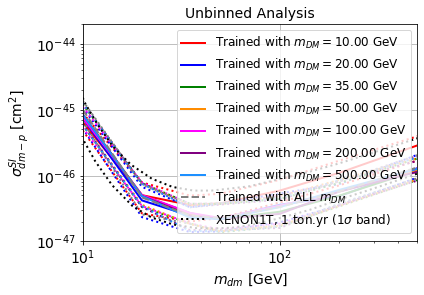

In [221]:
# plot
plt.figure()
lw = 2


plt.plot(mDM_mDM, cross_cs1cs2_general_m0, '-', color='red', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[0])
plt.plot(mDM_mDM, cross_cs1cs2_general_m0_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m0_down, ':', color='red', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m1, '-', color='blue', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[1])
plt.plot(mDM_mDM, cross_cs1cs2_general_m1_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m1_down, ':', color='blue', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m2, '-', color='green', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[2])
plt.plot(mDM_mDM, cross_cs1cs2_general_m2_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m2_down, ':', color='green', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m3, '-', color='darkorange', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[3])
plt.plot(mDM_mDM, cross_cs1cs2_general_m3_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m3_down, ':', color='darkorange', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m4, '-', color='magenta', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[4])
plt.plot(mDM_mDM, cross_cs1cs2_general_m4_up, ':', color='magenta', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m4_down, ':', color='magenta', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m5, '-', color='purple', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[5])
plt.plot(mDM_mDM, cross_cs1cs2_general_m5_up, ':', color='purple', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m5_down, ':', color='purple', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m6, '-', color='dodgerblue', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[6])
plt.plot(mDM_mDM, cross_cs1cs2_general_m6_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m6_down, ':', color='dodgerblue', lw=lw)
    
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL, '--', color='gray', lw=lw, label=r'Trained with ALL $m_{DM}$')
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL_up, ':', color='gray', lw=lw) 
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL_down, ':', color='gray', lw=lw)

#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.title('Binned Analysis', fontsize=14)
plt.xscale('log')
plt.yscale('log')
plt.xlim(10,500)
plt.ylim(1e-47, 2e-44)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma^{SI}_{dm-p}$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
# plt.savefig('limits3.pdf',bbox_inches='tight')
plt.show()




# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_cs1cs2_general_m0_MLL, '-', color='red', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[0])
plt.plot(mDM_mDM, cross_cs1cs2_general_m0_MLL_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m0_MLL_down, ':', color='red', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m1_MLL, '-', color='blue', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[1])
plt.plot(mDM_mDM, cross_cs1cs2_general_m1_MLL_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m1_MLL_down, ':', color='blue', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m2_MLL, '-', color='green', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[2])
plt.plot(mDM_mDM, cross_cs1cs2_general_m2_MLL_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m2_MLL_down, ':', color='green', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m3_MLL, '-', color='darkorange', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[3])
plt.plot(mDM_mDM, cross_cs1cs2_general_m3_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m3_MLL_down, ':', color='darkorange', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m4_MLL, '-', color='magenta', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[4])
plt.plot(mDM_mDM, cross_cs1cs2_general_m4_MLL_up, ':', color='magenta', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m4_MLL_down, ':', color='magenta', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m5_MLL, '-', color='purple', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[5])
plt.plot(mDM_mDM, cross_cs1cs2_general_m5_MLL_up, ':', color='purple', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m5_MLL_down, ':', color='purple', lw=lw)

plt.plot(mDM_mDM, cross_cs1cs2_general_m6_MLL, '-', color='dodgerblue', lw=lw, label=r'Trained with $m_{DM}=%0.2f$ GeV' % mDM_mDM[6])
plt.plot(mDM_mDM, cross_cs1cs2_general_m6_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_general_m6_MLL_down, ':', color='dodgerblue', lw=lw)
    
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL_MLL, '--', color='gray', lw=lw, label=r'Trained with ALL $m_{DM}$')
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL_MLL_up, ':', color='gray', lw=lw) 
# plt.plot(mDM_mDM, cross_cs1cs2_general_mALL_MLL_down, ':', color='gray', lw=lw)


#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.title('Unbinned Analysis', fontsize=14)
plt.xscale('log')
plt.yscale('log')
plt.xlim(10,500)
plt.ylim(1e-47, 2e-44)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma^{SI}_{dm-p}$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
# plt.savefig('limits3.pdf',bbox_inches='tight')
plt.show()